In [19]:
from sklearn.model_selection import train_test_split
import pandas as pd

# Read the data
X = pd.read_csv('X_with_cluster_distances.csv')
Y = pd.read_csv('Y.csv')
y = Y['price_range']

class_to_remove = y.value_counts()[y.value_counts() < 10].index
mask = ~y.isin(class_to_remove)
X_filtered = X[mask]
y_filtered = y[mask]

X_train, X_temp, y_train, y_temp = train_test_split(
    X_filtered, y_filtered, test_size=0.2, random_state=42, stratify=y_filtered
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp
)




In [20]:
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

scaler = StandardScaler()

scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

poly = PolynomialFeatures(degree=2) 
X_train_poly = poly.fit_transform(X_train_scaled)
X_test_poly = poly.transform(X_test_scaled)

print("X_train_poly shape:", X_train_poly.shape)

print("X_test_poly shape:", X_test_poly.shape)


X_train_poly shape: (8165, 105)
X_test_poly shape: (1021, 105)


In [21]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, accuracy_score

model = MLPClassifier(hidden_layer_sizes=(50,), max_iter=1000, random_state=42)
y_train_array = y_train.values.ravel()

model.fit(X_train_poly, y_train_array)

y_pred = model.predict(X_test_poly)

print("Accuracy on Test Set: ", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy on Test Set:  0.3584720861900098

Classification Report:
              precision    recall  f1-score   support

           1       0.70      0.58      0.63        33
           2       0.56      0.61      0.58        99
           3       0.45      0.56      0.50       124
           4       0.36      0.24      0.29       118
           5       0.34      0.39      0.36       137
           6       0.28      0.28      0.28       103
           7       0.25      0.35      0.29        94
           8       0.28      0.28      0.28        69
           9       0.31      0.21      0.25        52
          10       0.09      0.06      0.07        35
          11       0.13      0.15      0.14        39
          12       0.40      0.17      0.24        24
          13       0.00      0.00      0.00        18
          14       0.00      0.00      0.00        12
          15       0.25      0.09      0.13        11
          16       0.56      0.60      0.58        53

    accuracy  

In [22]:
from tensorflow.keras import regularizers
import tensorflow as tf
from tensorflow.keras import layers, models

model = models.Sequential([
    layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.5), input_shape=(X_train.shape[1],)),
    layers.Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.5)),
    layers.Dense(1, activation='sigmoid')
])

2025-04-28 00:35:21.016010: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l1 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0797 - loss: 4.0774 - val_accuracy: 0.1881 - val_loss: 3.0329 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1355 - loss: 3.4420 - val_accuracy: 0.2106 - val_loss: 2.7798 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1731 - loss: 3.0897 - val_accuracy: 0.2292 - val_loss: 2.6117 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1942 - loss: 2.8943 - val_accuracy: 0.2468 - val_loss: 2.5142 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step accuracy: 0.2090 - loss: 2.7743 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2116, Train Precision = 0.2912, Train Recall = 0.2773, Train MSE = 8.1988, Train R² = 0.4435, Val Accuracy = 0.2537, Val Precision = 0.3262, Val Recall = 0.2537, Val MSE = 9.2517, Val R² = 0.3722
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

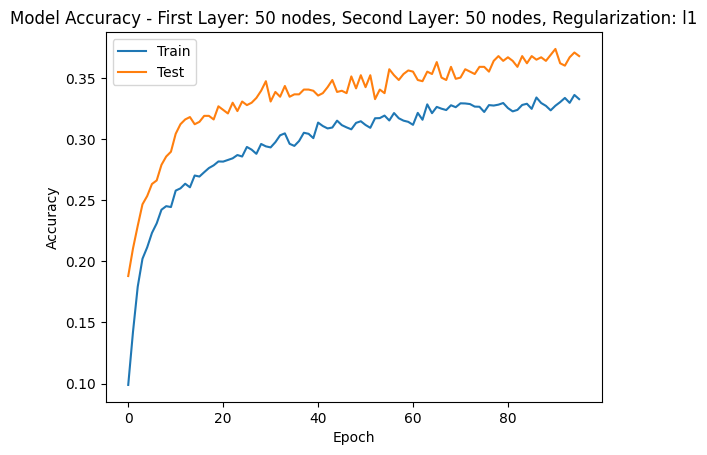

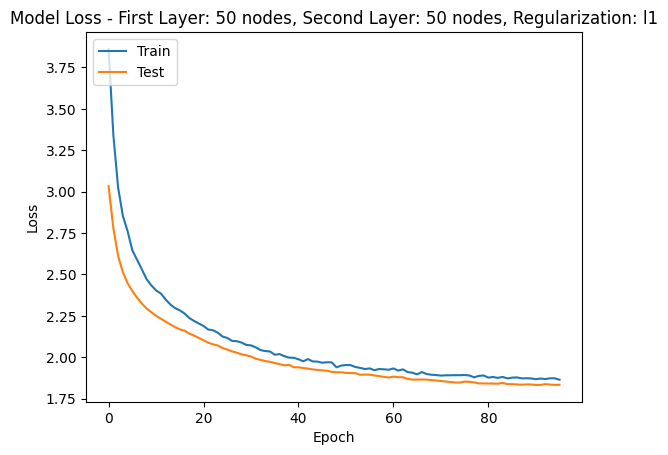

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l2 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0792 - loss: 3.5619 - val_accuracy: 0.2067 - val_loss: 2.6653 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1631 - loss: 2.9406 - val_accuracy: 0.2390 - val_loss: 2.4067 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1948 - loss: 2.6527 - val_accuracy: 0.2566 - val_loss: 2.2504 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2143 - loss: 2.4929 - val_accuracy: 0.2791 - val_loss: 2.1673 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step accuracy: 0.2178 - loss: 2.4070 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2278, Train Precision = 0.2849, Train Recall = 0.2959, Train MSE = 7.1331, Train R² = 0.5159, Val Accuracy = 0.2929, Val Precision = 0.3153, Val Recall = 0.2929, Val MSE = 7.8325, Val R² = 0.4685
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

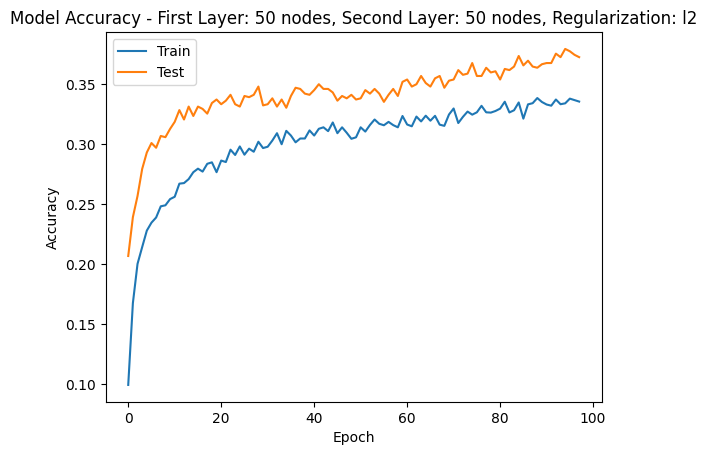

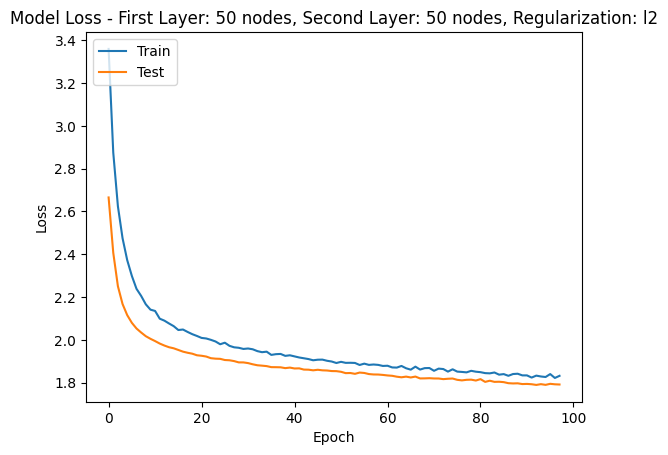

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l1 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.0809 - loss: 5.5537 - val_accuracy: 0.1734 - val_loss: 4.5370 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1527 - loss: 4.8099 - val_accuracy: 0.2233 - val_loss: 4.1520 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1816 - loss: 4.3901 - val_accuracy: 0.2586 - val_loss: 3.8337 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2109 - loss: 4.0630 - val_accuracy: 0.2772 - val_loss: 3.5941 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step accuracy: 0.2160 - loss: 3.8353 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2175, Train Precision = 0.2985, Train Recall = 0.2828, Train MSE = 7.3566, Train R² = 0.5007, Val Accuracy = 0.2742, Val Precision = 0.3071, Val Recall = 0.2742, Val MSE = 7.9412, Val R² = 0.4611
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

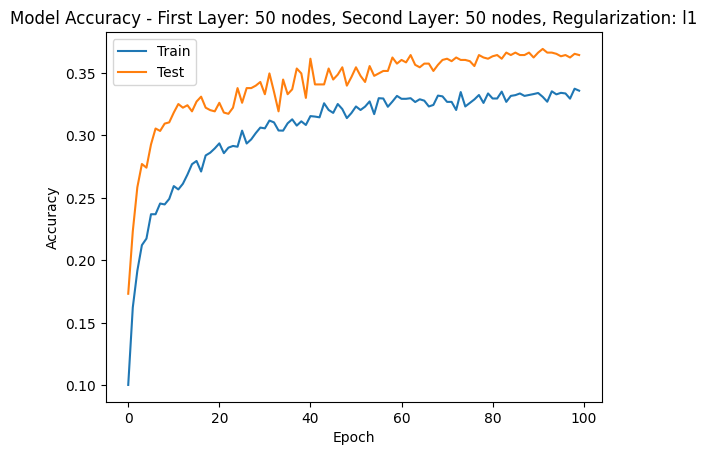

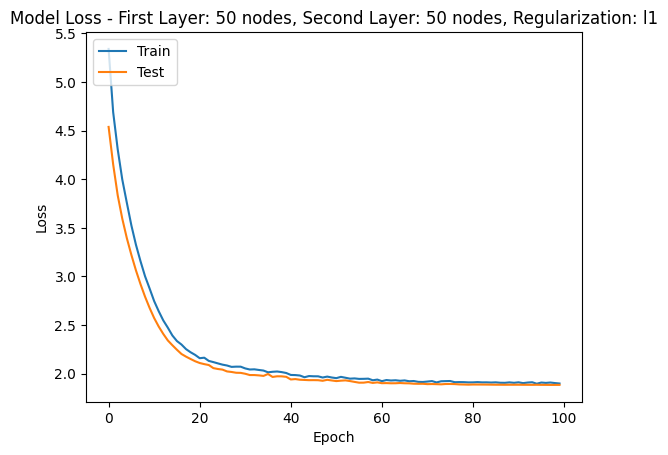

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l2 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.0888 - loss: 3.8782 - val_accuracy: 0.1861 - val_loss: 2.9694 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.1451 - loss: 3.2905 - val_accuracy: 0.2262 - val_loss: 2.7194 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.1732 - loss: 3.0285 - val_accuracy: 0.2527 - val_loss: 2.5544 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1989 - loss: 2.8276 - val_accuracy: 0.2782 - val_loss: 2.4486 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2197 - loss: 2.6814 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Epoch 5: Train Accuracy = 0.2195, Train Precision = 0.3051, Train Recall = 0.2899, Train MSE = 7.9756, Train R² = 0.4587, Val Accuracy = 0.2752, Val Precision = 0.3447, Val Recall = 0.2752, Val MSE = 8.8110, Val R² = 0.4021
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

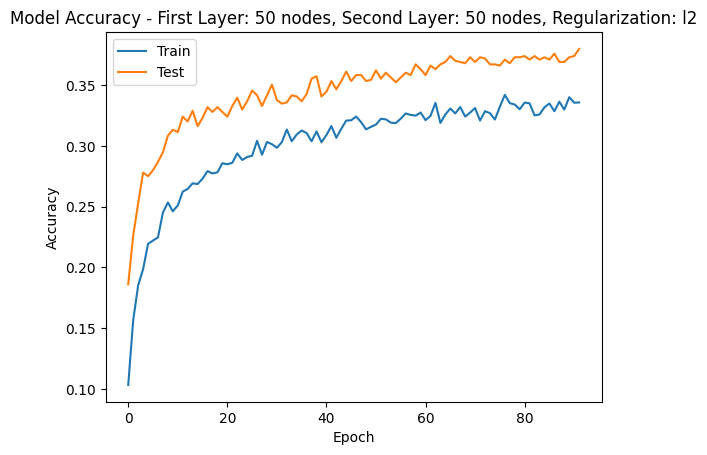

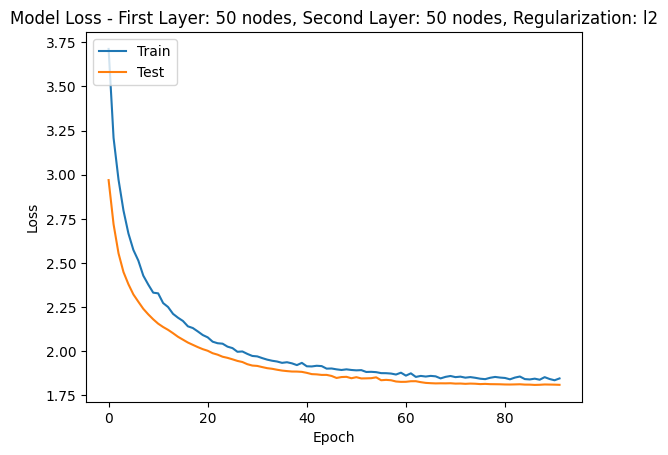

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l1 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0703 - loss: 6.9081 - val_accuracy: 0.1254 - val_loss: 5.5929 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1258 - loss: 5.8996 - val_accuracy: 0.2262 - val_loss: 5.0179 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1712 - loss: 5.2696 - val_accuracy: 0.2527 - val_loss: 4.5220 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2076 - loss: 4.7576 - val_accuracy: 0.2752 - val_loss: 4.1216 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2058 - loss: 4.3548 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2122, Train Precision = 0.3596, Train Recall = 0.2873, Train MSE = 7.2388, Train R² = 0.5087, Val Accuracy = 0.2938, Val Precision = 0.3795, Val Recall = 0.2938, Val MSE = 7.7169, Val R² = 0.4763
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

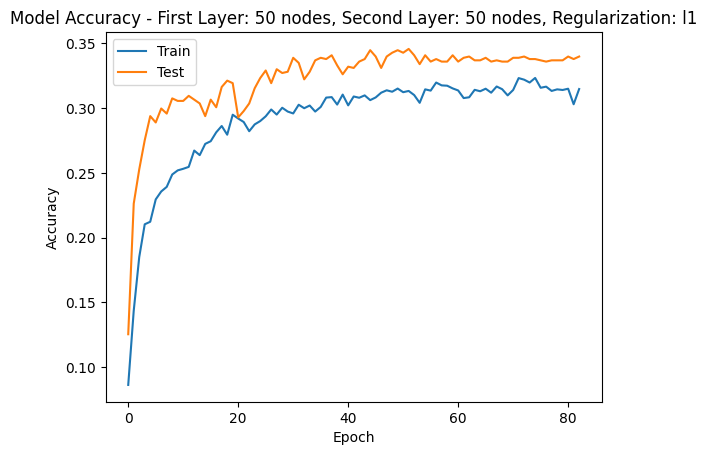

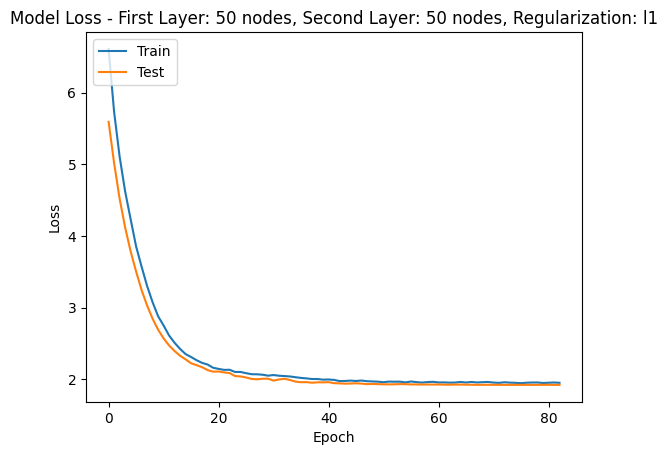

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l2 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.0805 - loss: 4.1163 - val_accuracy: 0.1773 - val_loss: 3.1474 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1369 - loss: 3.5161 - val_accuracy: 0.2243 - val_loss: 2.9069 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1767 - loss: 3.1722 - val_accuracy: 0.2468 - val_loss: 2.7229 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1839 - loss: 2.9846 - val_accuracy: 0.2517 - val_loss: 2.5930 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2125 - loss: 2.8315 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2249, Train Precision = 0.2879, Train Recall = 0.2730, Train MSE = 8.3357, Train R² = 0.4342, Val Accuracy = 0.2752, Val Precision = 0.3574, Val Recall = 0.2752, Val MSE = 8.6053, Val R² = 0.4160
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

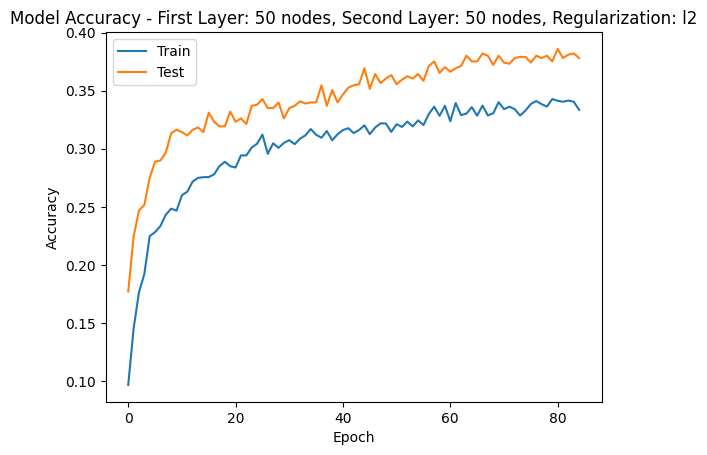

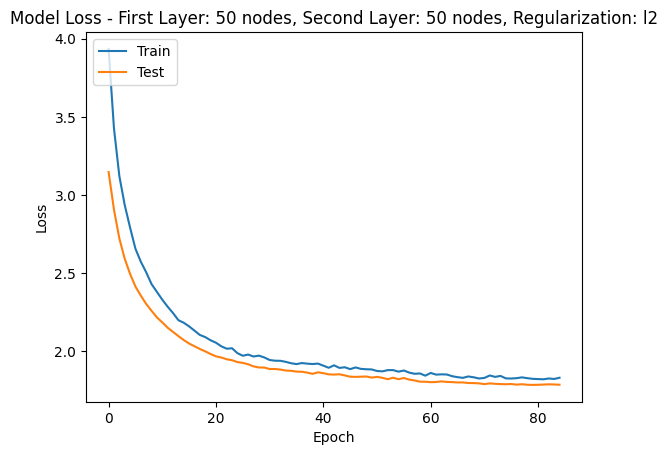

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l1 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0891 - loss: 7.4828 - val_accuracy: 0.1773 - val_loss: 6.1934 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1413 - loss: 6.4084 - val_accuracy: 0.2125 - val_loss: 5.4741 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1816 - loss: 5.6363 - val_accuracy: 0.2468 - val_loss: 4.8499 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2052 - loss: 5.0295 - val_accuracy: 0.2625 - val_loss: 4.3371 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2036 - loss: 4.5202 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Epoch 5: Train Accuracy = 0.2142, Train Precision = 0.2909, Train Recall = 0.2900, Train MSE = 7.3814, Train R² = 0.4990, Val Accuracy = 0.2821, Val Precision = 0.3098, Val Recall = 0.2821, Val MSE = 8.1391, Val R² = 0.4477
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

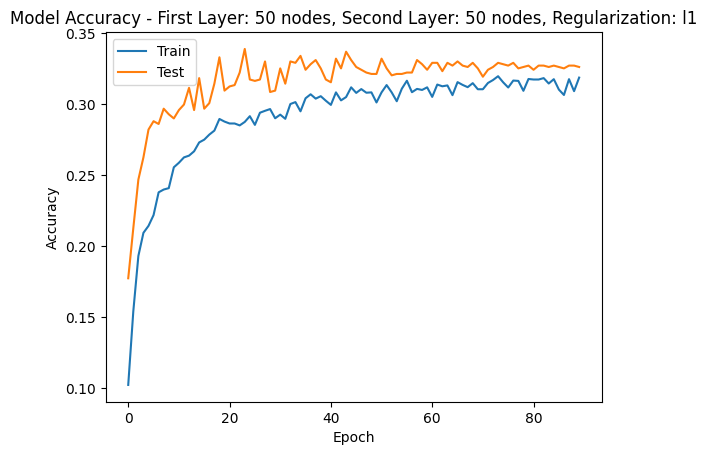

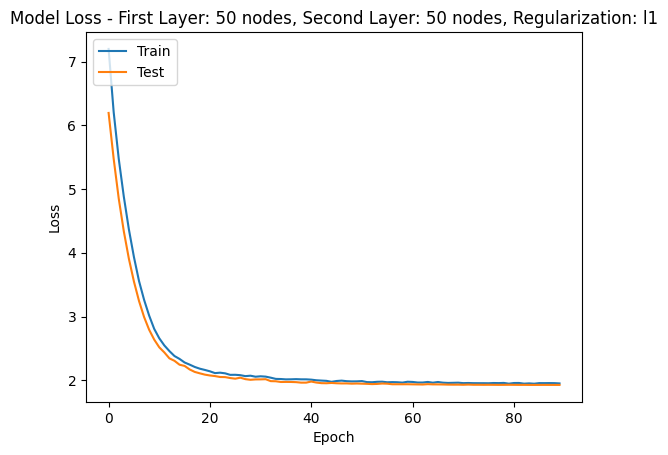

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l2 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0719 - loss: 4.3055 - val_accuracy: 0.1714 - val_loss: 3.2592 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1413 - loss: 3.5972 - val_accuracy: 0.2243 - val_loss: 2.9888 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1779 - loss: 3.2821 - val_accuracy: 0.2380 - val_loss: 2.7949 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1971 - loss: 3.0683 - val_accuracy: 0.2527 - val_loss: 2.6598 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step accuracy: 0.2017 - loss: 2.8835 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2092, Train Precision = 0.3295, Train Recall = 0.2844, Train MSE = 7.8514, Train R² = 0.4671, Val Accuracy = 0.2566, Val Precision = 0.2923, Val Recall = 0.2566, Val MSE = 8.7816, Val R² = 0.4041
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2252 - loss: 2.7608 - val_accuracy: 0.2762 - val_loss: 2.4699 - learning_rate: 5.0000e-04
Epoch 7/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2382 - loss: 2.6501 - val_accuracy: 0.2791 - val_loss: 2.4027 - learning_rate: 5.0000e-04
Epoch 8/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2483 - loss: 2.5415 - val_accuracy: 0.2791 - val_loss: 2.3479 - learning_rate: 5.0000e-04
Epoch 9/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2566 - loss: 2.5115 - val_accuracy: 0.2880 - val_loss: 2.3029 - learning_rate: 5.0000e-04
Epoch 10/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 720us/step accuracy: 0.2514 - loss: 2.4392 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Epoch 10: Train Accuracy = 0.2539, Train Precision = 0.3699, Train Recall = 0.3155, Train MSE = 6.2420, Train R² = 0.5763, Val Accuracy = 0.2919, Val Precision = 0.3727, Val Recall = 0.2919, Val MSE = 7.1254, Val R² = 0.5165
128/128 ━━━━━━━━━━━━━━━━━━━━ 1

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2617 - loss: 2.3644 - val_accuracy: 0.2948 - val_loss: 2.2182 - learning_rate: 5.0000e-04
Epoch 12/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2606 - loss: 2.3038 - val_accuracy: 0.2929 - val_loss: 2.1819 - learning_rate: 5.0000e-04
Epoch 13/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2591 - loss: 2.2613 - val_accuracy: 0.3036 - val_loss: 2.1458 - learning_rate: 5.0000e-04
Epoch 14/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2684 - loss: 2.2178 - val_accuracy: 0.3115 - val_loss: 2.1145 - learning_rate: 5.0000e-04
Epoch 15/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step accuracy: 0.2576 - loss: 2.2226 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 15: Train Accuracy = 0.2658, Train Precision = 0.4046, Train Recall = 0.3232, Train MSE = 5.8145, Train R² = 0.6054, Val Accuracy = 0.3105, Val Precision = 0.3931, Val Recall = 0.3105, Val MSE = 6.5759, Val R² = 0.5538
128/128 ━━━━━━━━━━━━━━━━━━━

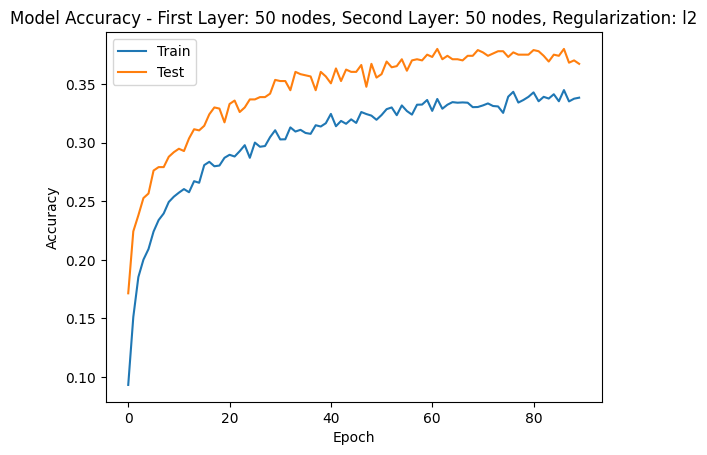

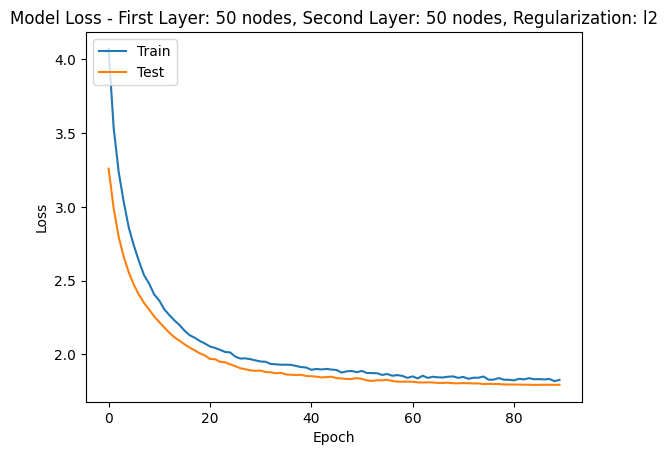

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l1 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0651 - loss: 22.0694 - val_accuracy: 0.0823 - val_loss: 16.1410 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1163 - loss: 15.0986 - val_accuracy: 0.2076 - val_loss: 10.7631 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1545 - loss: 9.9135 - val_accuracy: 0.2341 - val_loss: 6.9769 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1923 - loss: 6.4149 - val_accuracy: 0.2409 - val_loss: 4.7417 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step accuracy: 0.2202 - loss: 4.4480 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2228, Train Precision = 0.3687, Train Recall = 0.2088, Train MSE = 9.9389, Train R² = 0.3254, Val Accuracy = 0.2233, Val Precision = 0.4706, Val Recall = 0.2233, Val MSE = 10.3712, Val R² = 0.2962
128/128 ━━━━━━━━━━━━━━━━━━━

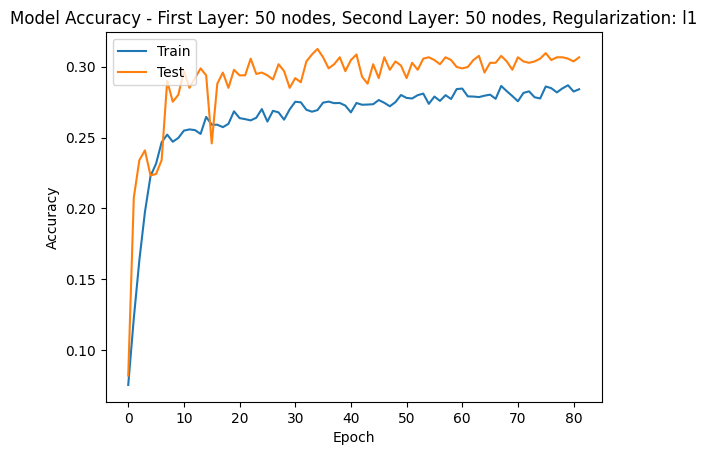

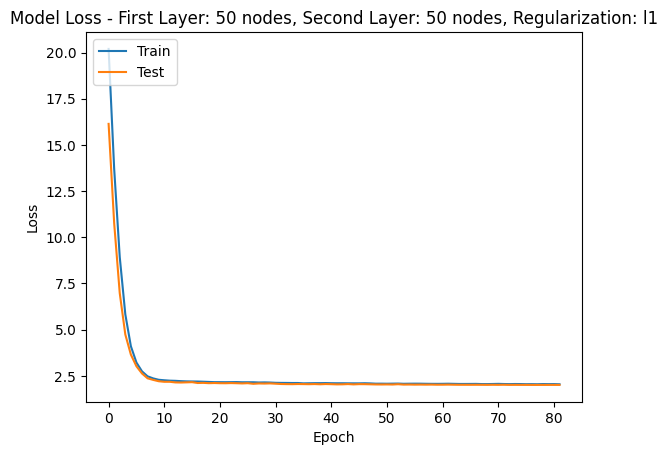

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l2 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0667 - loss: 6.8648 - val_accuracy: 0.1812 - val_loss: 5.2518 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1454 - loss: 5.3437 - val_accuracy: 0.2116 - val_loss: 4.3364 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1817 - loss: 4.4047 - val_accuracy: 0.2341 - val_loss: 3.6531 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2069 - loss: 3.7764 - val_accuracy: 0.2693 - val_loss: 3.1835 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step accuracy: 0.2318 - loss: 3.3053 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2318, Train Precision = 0.3526, Train Recall = 0.2920, Train MSE = 6.3586, Train R² = 0.5684, Val Accuracy = 0.2870, Val Precision = 0.3820, Val Recall = 0.2870, Val MSE = 7.1342, Val R² = 0.5159
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

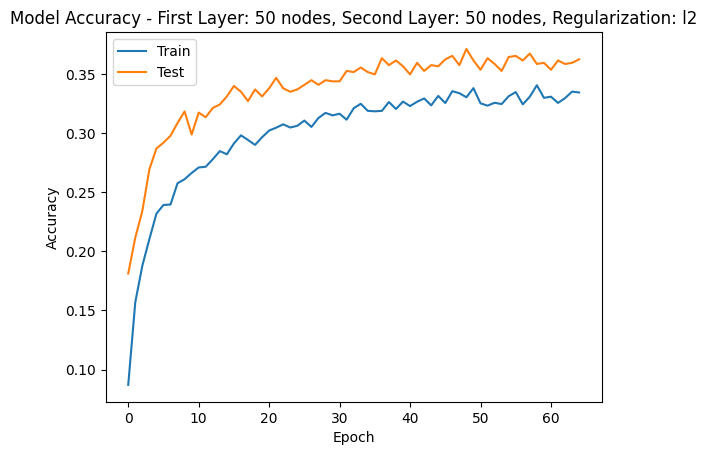

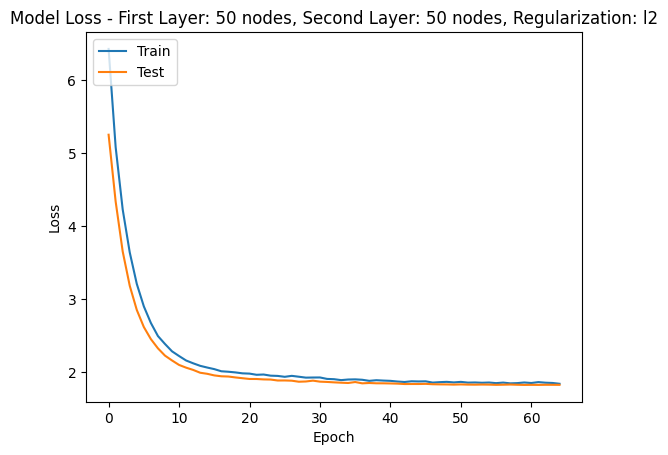

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l1 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0683 - loss: 40.0608 - val_accuracy: 0.1303 - val_loss: 27.2031 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1057 - loss: 24.4246 - val_accuracy: 0.1548 - val_loss: 15.1797 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1480 - loss: 13.2517 - val_accuracy: 0.1528 - val_loss: 7.5845 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1962 - loss: 6.4221 - val_accuracy: 0.1312 - val_loss: 4.0683 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step accuracy: 0.2305 - loss: 3.5032 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2295, Train Precision = 0.4970, Train Recall = 0.1629, Train MSE = 13.2246, Train R² = 0.1024, Val Accuracy = 0.1743, Val Precision = 0.5011, Val Recall = 0.1743, Val MSE = 13.4398, Val R² = 0.0880
128/128 ━━━━━━━━━━━━━━━━━

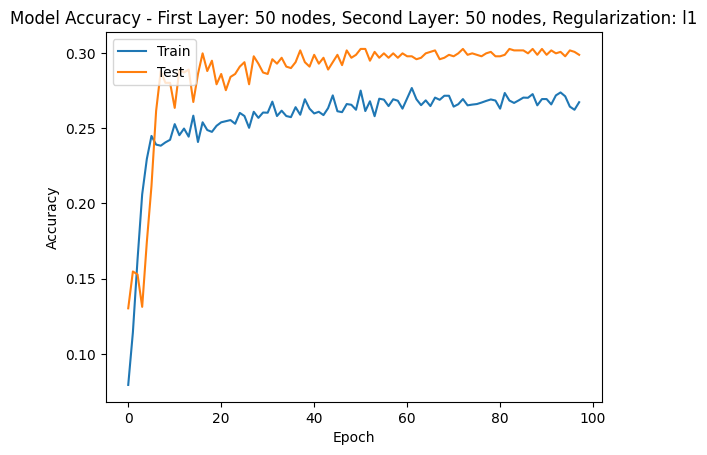

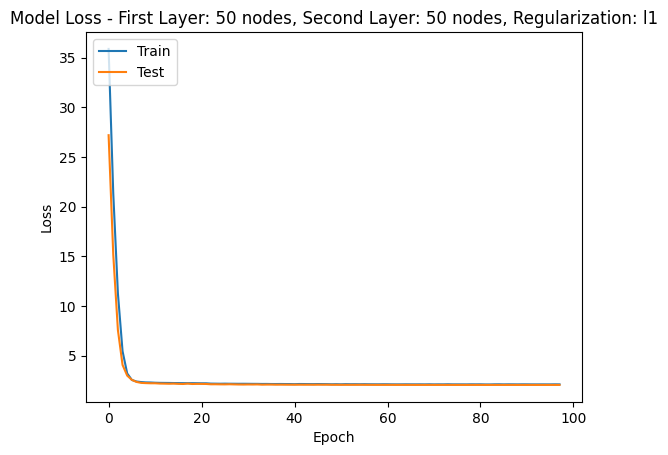

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l2 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0718 - loss: 9.9713 - val_accuracy: 0.1616 - val_loss: 7.1653 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1297 - loss: 7.0511 - val_accuracy: 0.1792 - val_loss: 5.3196 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1770 - loss: 5.2215 - val_accuracy: 0.2076 - val_loss: 4.1121 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2128 - loss: 4.0733 - val_accuracy: 0.2360 - val_loss: 3.3328 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step accuracy: 0.2083 - loss: 3.3670 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2169, Train Precision = 0.3431, Train Recall = 0.2761, Train MSE = 7.0001, Train R² = 0.5249, Val Accuracy = 0.2860, Val Precision = 0.3989, Val Recall = 0.2860, Val MSE = 7.9951, Val R² = 0.4575
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

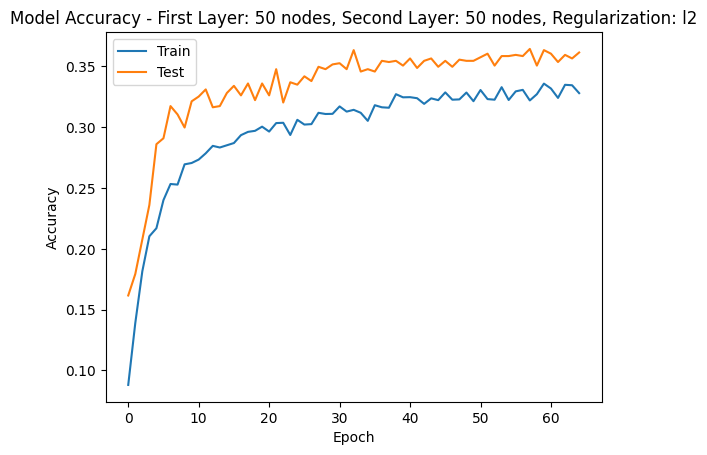

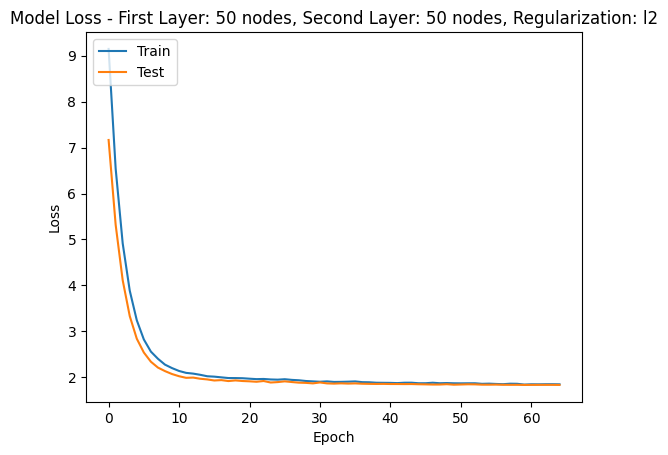

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l1 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.0846 - loss: 4.1992 - val_accuracy: 0.2184 - val_loss: 3.1116 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1682 - loss: 3.4495 - val_accuracy: 0.2321 - val_loss: 2.8323 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2028 - loss: 3.1726 - val_accuracy: 0.2703 - val_loss: 2.6758 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2215 - loss: 2.9852 - val_accuracy: 0.2938 - val_loss: 2.5894 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2256 - loss: 2.8647 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Epoch 5: Train Accuracy = 0.2303, Train Precision = 0.3524, Train Recall = 0.3047, Train MSE = 6.9375, Train R² = 0.5291, Val Accuracy = 0.3134, Val Precision = 0.3606, Val Recall = 0.3134, Val MSE = 7.7542, Val R² = 0.4738
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

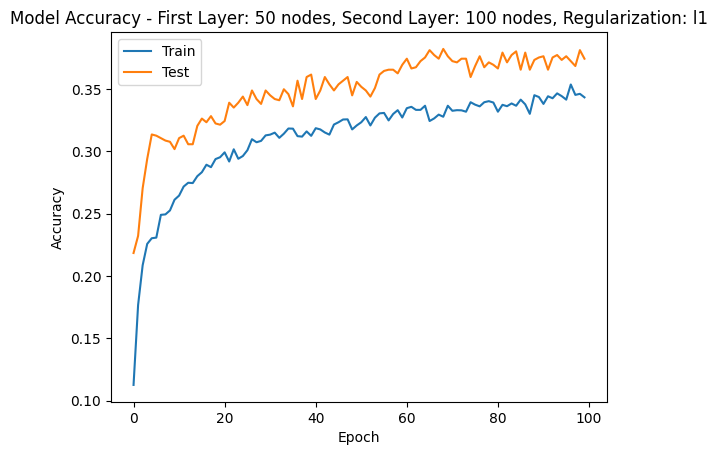

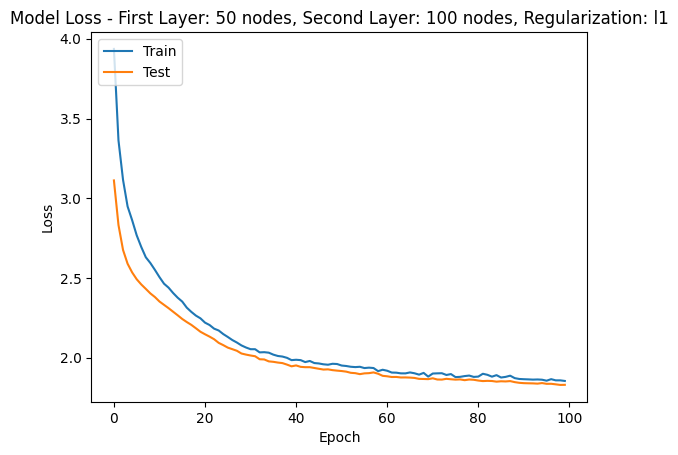

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l2 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0831 - loss: 3.7133 - val_accuracy: 0.1959 - val_loss: 2.5986 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1683 - loss: 2.9458 - val_accuracy: 0.2341 - val_loss: 2.3392 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1987 - loss: 2.6570 - val_accuracy: 0.2517 - val_loss: 2.1894 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2261 - loss: 2.5093 - val_accuracy: 0.2782 - val_loss: 2.1145 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step accuracy: 0.2229 - loss: 2.3954 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2247, Train Precision = 0.3261, Train Recall = 0.2980, Train MSE = 7.1614, Train R² = 0.5139, Val Accuracy = 0.2850, Val Precision = 0.3227, Val Recall = 0.2850, Val MSE = 8.0264, Val R² = 0.4553
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

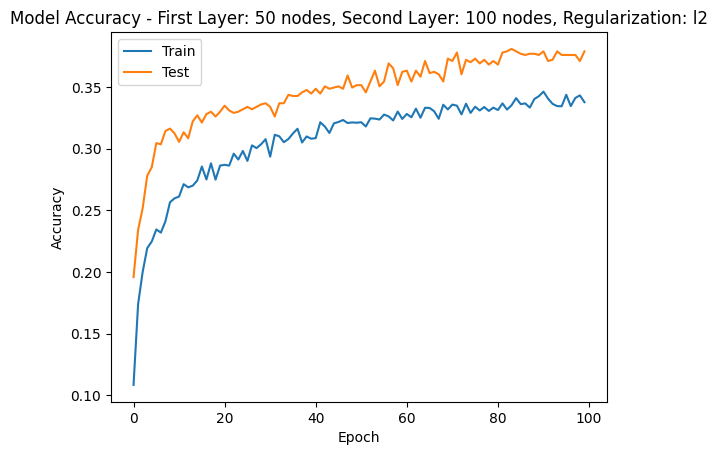

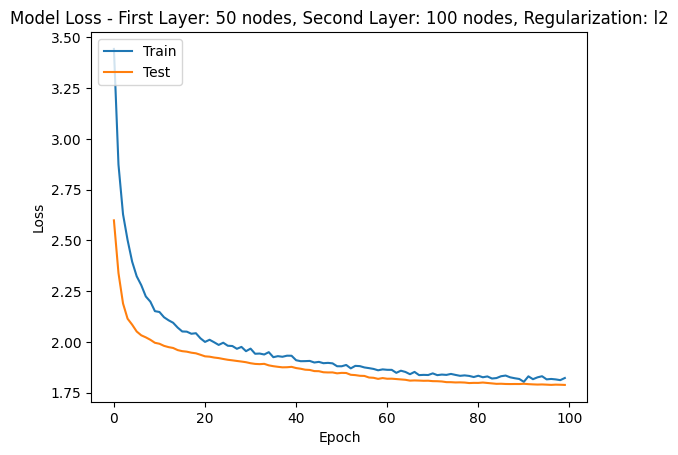

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l1 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0796 - loss: 6.6098 - val_accuracy: 0.1949 - val_loss: 5.3227 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1587 - loss: 5.6171 - val_accuracy: 0.2253 - val_loss: 4.7693 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2089 - loss: 5.0203 - val_accuracy: 0.2547 - val_loss: 4.3496 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2127 - loss: 4.5839 - val_accuracy: 0.2801 - val_loss: 4.0214 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step accuracy: 0.2232 - loss: 4.2676 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2296, Train Precision = 0.3288, Train Recall = 0.3069, Train MSE = 6.4145, Train R² = 0.5646, Val Accuracy = 0.3124, Val Precision = 0.3673, Val Recall = 0.3124, Val MSE = 7.2106, Val R² = 0.5107
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

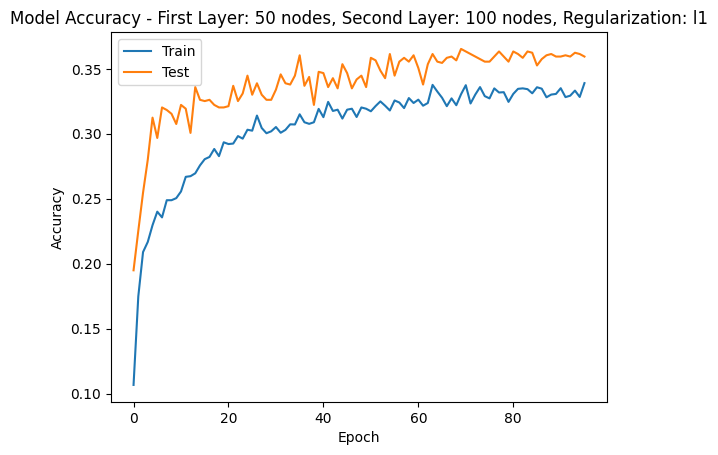

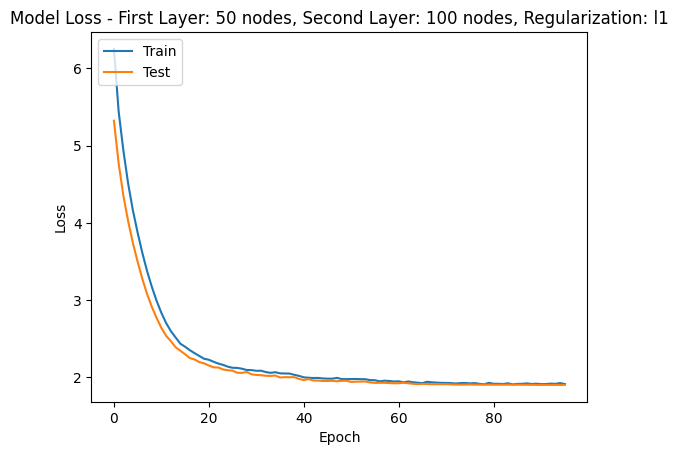

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l2 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0867 - loss: 3.9826 - val_accuracy: 0.2096 - val_loss: 2.9751 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1611 - loss: 3.3264 - val_accuracy: 0.2478 - val_loss: 2.6902 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1851 - loss: 3.0061 - val_accuracy: 0.2733 - val_loss: 2.5178 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2031 - loss: 2.8340 - val_accuracy: 0.2850 - val_loss: 2.4220 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2158 - loss: 2.7067 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2190, Train Precision = 0.3525, Train Recall = 0.3097, Train MSE = 6.7108, Train R² = 0.5445, Val Accuracy = 0.2870, Val Precision = 0.3413, Val Recall = 0.2870, Val MSE = 7.4897, Val R² = 0.4918
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

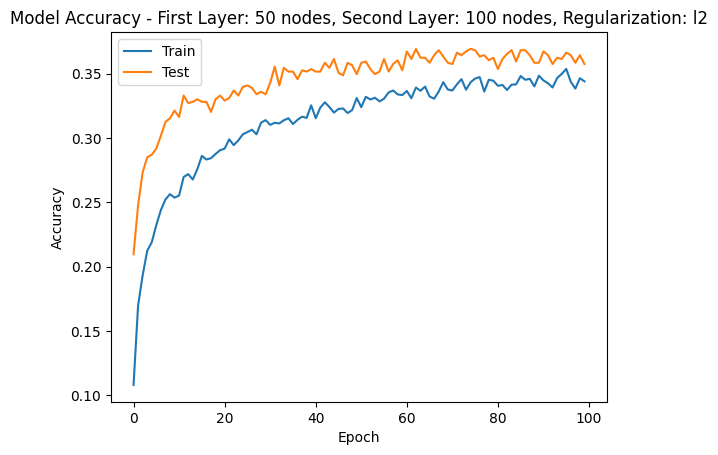

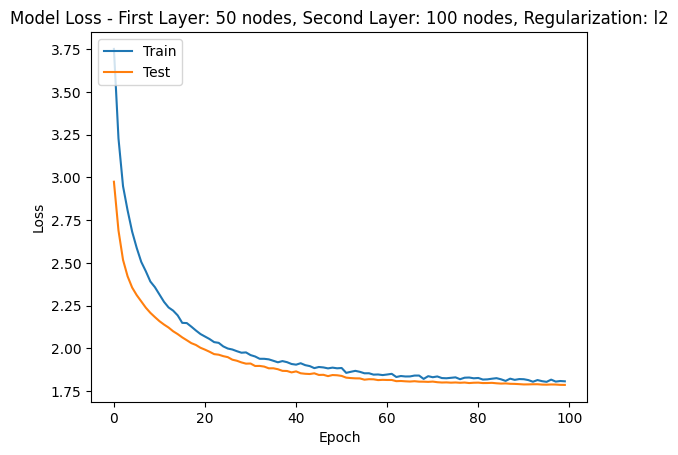

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l1 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.0921 - loss: 8.1939 - val_accuracy: 0.2086 - val_loss: 6.6688 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1673 - loss: 6.8605 - val_accuracy: 0.2429 - val_loss: 5.7999 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1977 - loss: 5.9891 - val_accuracy: 0.2840 - val_loss: 5.0942 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2095 - loss: 5.2560 - val_accuracy: 0.2811 - val_loss: 4.5175 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2191 - loss: 4.7144 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2246, Train Precision = 0.3256, Train Recall = 0.2856, Train MSE = 7.1815, Train R² = 0.5126, Val Accuracy = 0.2772, Val Precision = 0.3447, Val Recall = 0.2772, Val MSE = 7.7258, Val R² = 0.4757
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

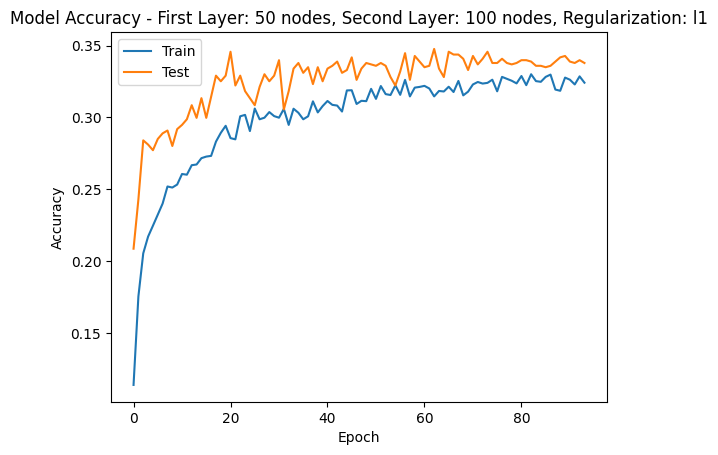

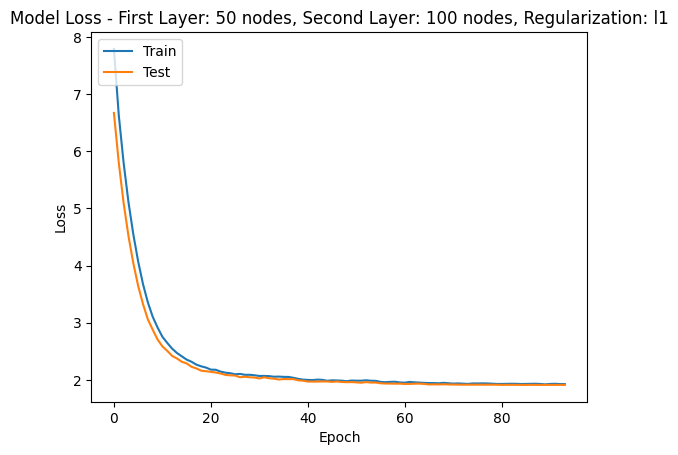

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l2 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0846 - loss: 4.2088 - val_accuracy: 0.1861 - val_loss: 3.2108 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1622 - loss: 3.5258 - val_accuracy: 0.2243 - val_loss: 2.9119 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1996 - loss: 3.1808 - val_accuracy: 0.2762 - val_loss: 2.7154 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2053 - loss: 3.0098 - val_accuracy: 0.2958 - val_loss: 2.5948 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step accuracy: 0.2296 - loss: 2.8620 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2303, Train Precision = 0.3153, Train Recall = 0.3089, Train MSE = 7.0027, Train R² = 0.5247, Val Accuracy = 0.2997, Val Precision = 0.3261, Val Recall = 0.2997, Val MSE = 8.1939, Val R² = 0.4440
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

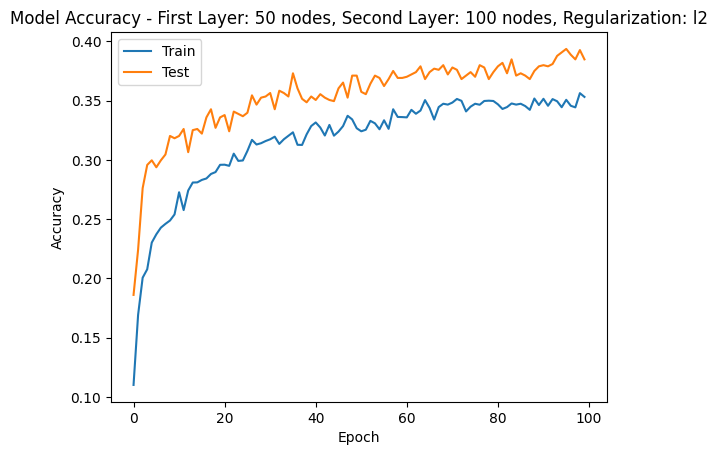

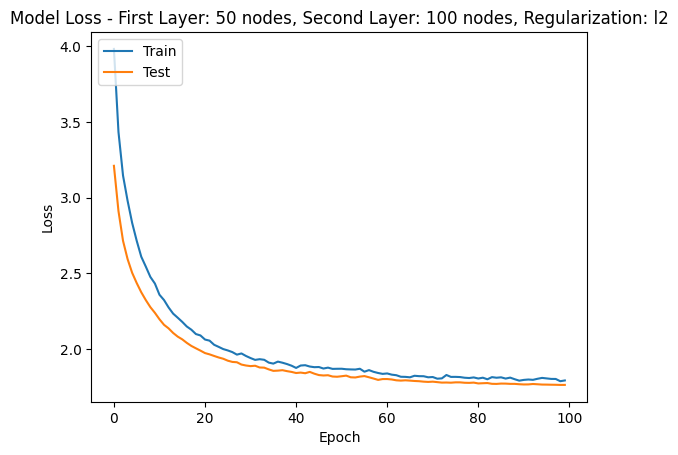

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l1 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0716 - loss: 9.3222 - val_accuracy: 0.1969 - val_loss: 7.6108 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1549 - loss: 7.6171 - val_accuracy: 0.2507 - val_loss: 6.4327 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1948 - loss: 6.4823 - val_accuracy: 0.2615 - val_loss: 5.4515 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2141 - loss: 5.5337 - val_accuracy: 0.2791 - val_loss: 4.6589 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step accuracy: 0.2320 - loss: 4.7849 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2312, Train Precision = 0.3538, Train Recall = 0.3030, Train MSE = 6.8009, Train R² = 0.5384, Val Accuracy = 0.2870, Val Precision = 0.3736, Val Recall = 0.2870, Val MSE = 7.6503, Val R² = 0.4808
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

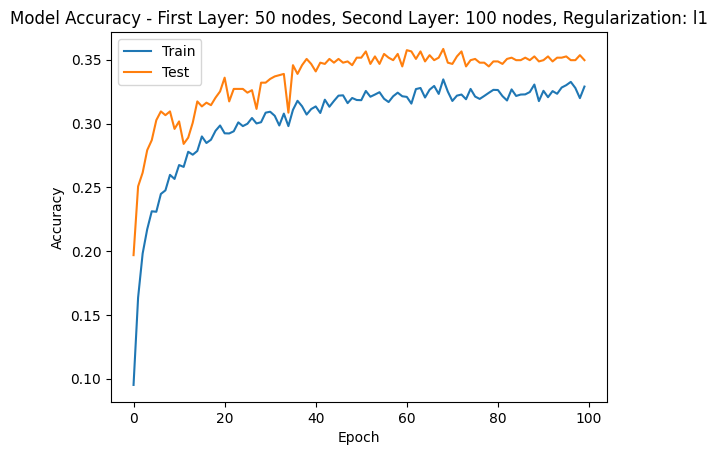

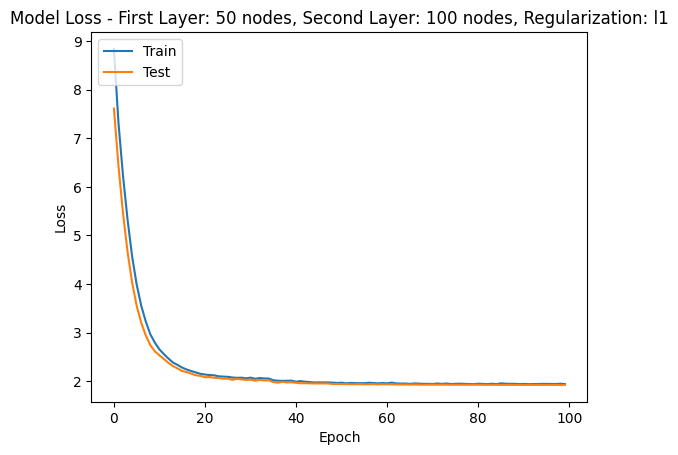

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l2 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0782 - loss: 4.4441 - val_accuracy: 0.2311 - val_loss: 3.3142 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1681 - loss: 3.6369 - val_accuracy: 0.2635 - val_loss: 3.0007 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2070 - loss: 3.3001 - val_accuracy: 0.2742 - val_loss: 2.7968 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2103 - loss: 3.1126 - val_accuracy: 0.2791 - val_loss: 2.6766 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step accuracy: 0.2229 - loss: 2.9352 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2269, Train Precision = 0.3502, Train Recall = 0.2981, Train MSE = 7.1429, Train R² = 0.5152, Val Accuracy = 0.2929, Val Precision = 0.3349, Val Recall = 0.2929, Val MSE = 8.0784, Val R² = 0.4518
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

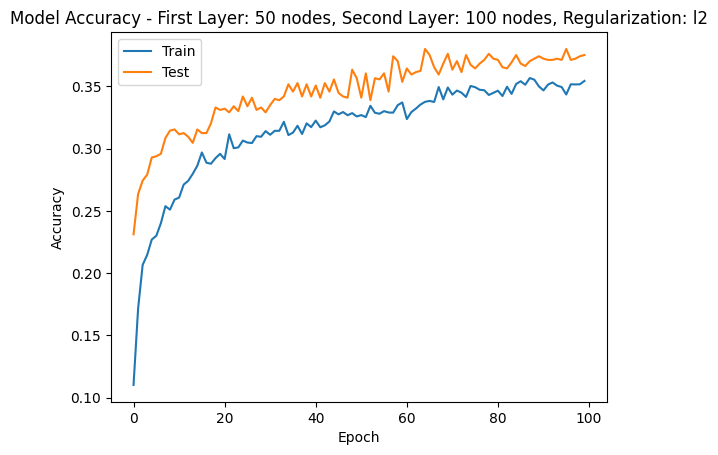

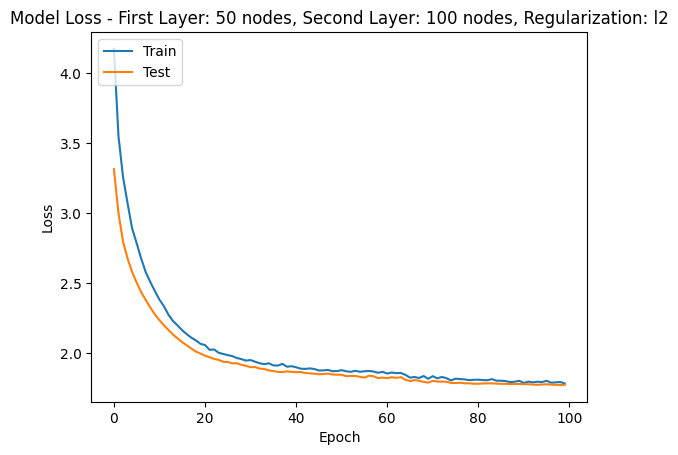

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l1 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0770 - loss: 30.1736 - val_accuracy: 0.1851 - val_loss: 20.1843 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1498 - loss: 18.1070 - val_accuracy: 0.2243 - val_loss: 11.5280 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1924 - loss: 10.2229 - val_accuracy: 0.2282 - val_loss: 6.6029 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2160 - loss: 5.9721 - val_accuracy: 0.2243 - val_loss: 4.4952 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step accuracy: 0.2309 - loss: 4.2118 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2372, Train Precision = 0.3379, Train Recall = 0.2075, Train MSE = 9.3043, Train R² = 0.3685, Val Accuracy = 0.2027, Val Precision = 0.3874, Val Recall = 0.2027, Val MSE = 9.6503, Val R² = 0.3451
128/128 ━━━━━━━━━━━━━━━━━━━

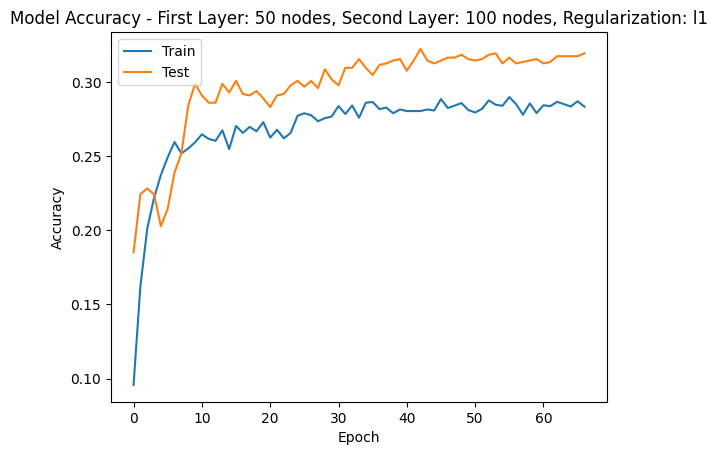

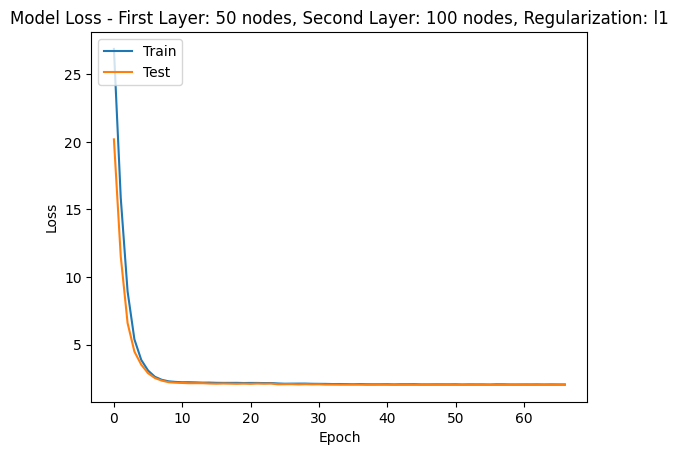

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l2 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0935 - loss: 7.6901 - val_accuracy: 0.2096 - val_loss: 5.6855 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1766 - loss: 5.7254 - val_accuracy: 0.2458 - val_loss: 4.5229 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2054 - loss: 4.6324 - val_accuracy: 0.2733 - val_loss: 3.7360 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2276 - loss: 3.9063 - val_accuracy: 0.2850 - val_loss: 3.2235 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step accuracy: 0.2366 - loss: 3.4270 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2423, Train Precision = 0.3445, Train Recall = 0.2941, Train MSE = 6.5015, Train R² = 0.5587, Val Accuracy = 0.2831, Val Precision = 0.3364, Val Recall = 0.2831, Val MSE = 7.3761, Val R² = 0.4995
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

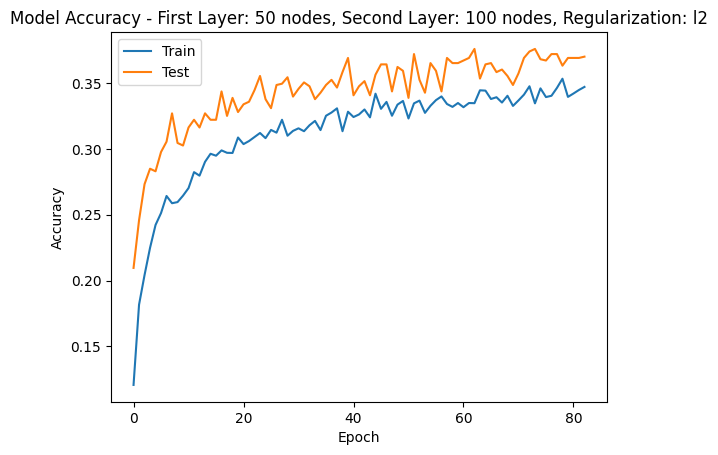

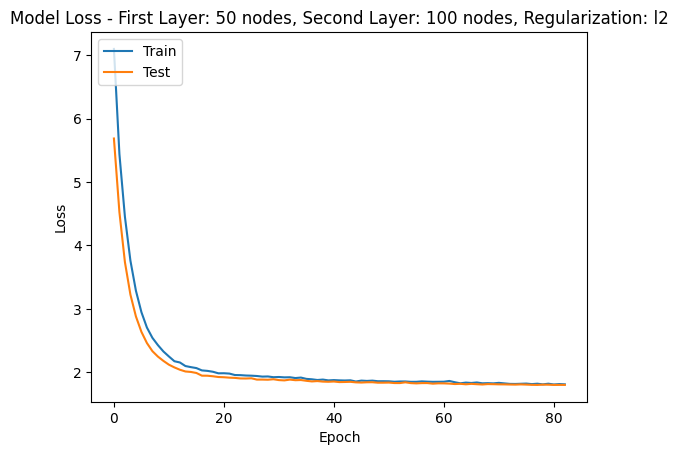

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l1 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0763 - loss: 55.7545 - val_accuracy: 0.1665 - val_loss: 34.1067 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1307 - loss: 29.2046 - val_accuracy: 0.1910 - val_loss: 15.5624 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1840 - loss: 12.7704 - val_accuracy: 0.1636 - val_loss: 6.5580 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2091 - loss: 5.5030 - val_accuracy: 0.1371 - val_loss: 4.0928 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step accuracy: 0.2374 - loss: 3.5461 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2427, Train Precision = 0.6144, Train Recall = 0.1482, Train MSE = 12.4604, Train R² = 0.1543, Val Accuracy = 0.1508, Val Precision = 0.8017, Val Recall = 0.1508, Val MSE = 12.5984, Val R² = 0.1451
128/128 ━━━━━━━━━━━━━━━━━

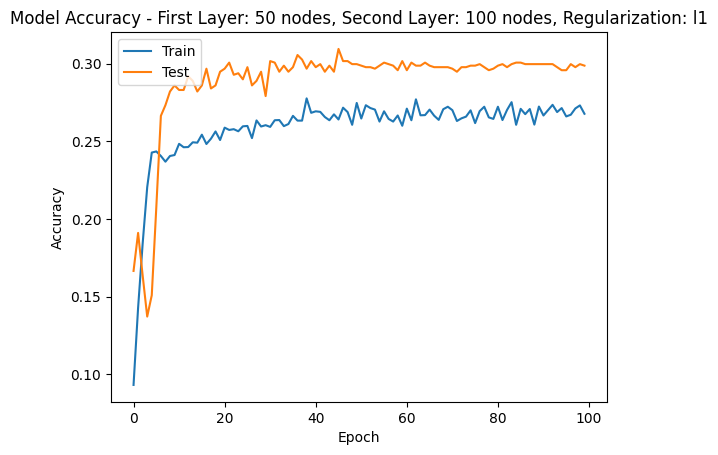

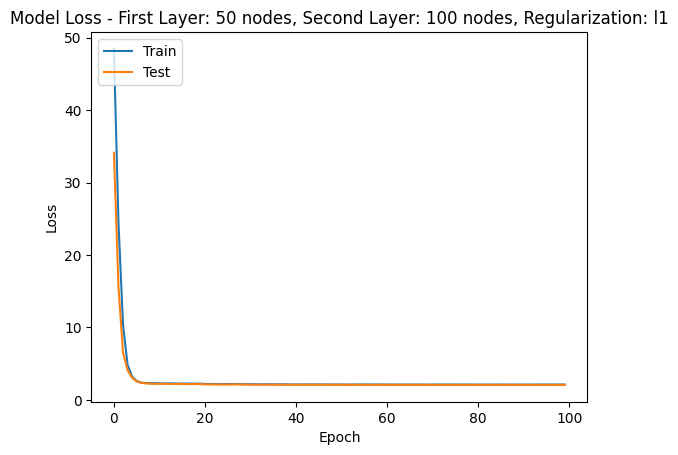

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l2 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0783 - loss: 11.3323 - val_accuracy: 0.1978 - val_loss: 7.7533 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1634 - loss: 7.4311 - val_accuracy: 0.2380 - val_loss: 5.4666 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1985 - loss: 5.3863 - val_accuracy: 0.2703 - val_loss: 4.1090 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2219 - loss: 4.1307 - val_accuracy: 0.2840 - val_loss: 3.3180 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step accuracy: 0.2171 - loss: 3.4632 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2293, Train Precision = 0.3917, Train Recall = 0.3015, Train MSE = 6.6791, Train R² = 0.5467, Val Accuracy = 0.2958, Val Precision = 0.3752, Val Recall = 0.2958, Val MSE = 7.2155, Val R² = 0.5104
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s

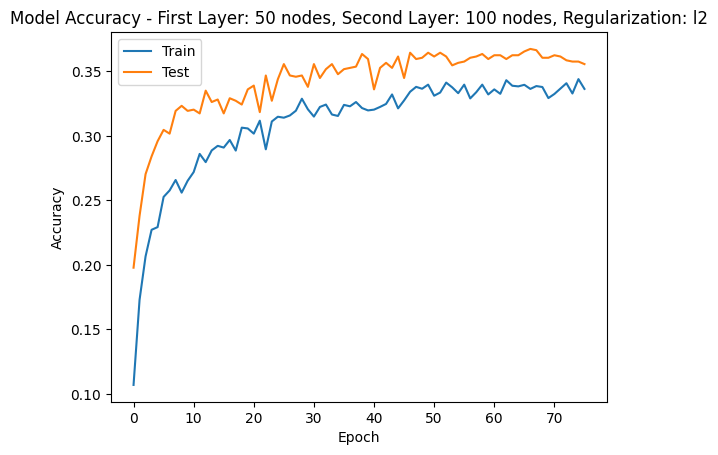

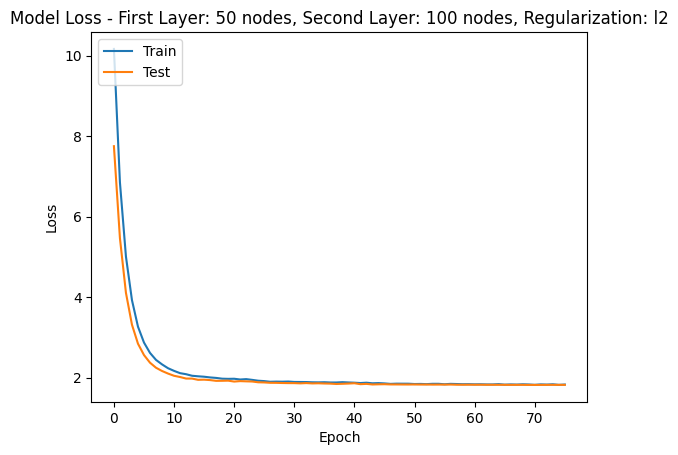

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l1 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0948 - loss: 4.4873 - val_accuracy: 0.1959 - val_loss: 3.5197 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1731 - loss: 3.7284 - val_accuracy: 0.2498 - val_loss: 3.2379 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2101 - loss: 3.4131 - val_accuracy: 0.2762 - val_loss: 3.0414 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2294 - loss: 3.2462 - val_accuracy: 0.2997 - val_loss: 2.9125 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step accuracy: 0.2452 - loss: 3.1068 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2421, Train Precision = 0.3260, Train Recall = 0.3149, Train MSE = 6.8300, Train R² = 0.5364, Val Accuracy = 0.3115, Val Precision = 0.3861, Val Recall = 0.3115, Val MSE = 7.7346, Val R² = 0.4751
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3316 - loss: 2.0038 - val_accuracy: 0.3673 - val_loss: 1.9708 - learning_rate: 5.0000e-04
Epoch 32/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3245 - loss: 2.0273 - val_accuracy: 0.3712 - val_loss: 1.9614 - learning_rate: 5.0000e-04
Epoch 33/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3361 - loss: 1.9898 - val_accuracy: 0.3546 - val_loss: 1.9588 - learning_rate: 5.0000e-04
Epoch 34/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3354 - loss: 1.9569 - val_accuracy: 0.3624 - val_loss: 1.9544 - learning_rate: 5.0000e-04
Epoch 35/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 639us/step accuracy: 0.3303 - loss: 1.9767 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 35: Train Accuracy = 0.3320, Train Precision = 0.4438, Train Recall = 0.3830, Train MSE = 4.6440, Train R² = 0.6848, Val Accuracy = 0.3839, Val Precision = 0.4475, Val Recall = 0.3839, Val MSE = 5.3536, Val R² = 0.6367
128/128 ━━━━━━━━━━━━━━━━━━━

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3524 - loss: 1.9041 - val_accuracy: 0.3781 - val_loss: 1.8860 - learning_rate: 2.5000e-04
Epoch 47/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3578 - loss: 1.8966 - val_accuracy: 0.3879 - val_loss: 1.8842 - learning_rate: 2.5000e-04
Epoch 48/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3507 - loss: 1.9027 - val_accuracy: 0.3859 - val_loss: 1.8779 - learning_rate: 2.5000e-04
Epoch 49/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3480 - loss: 1.9012 - val_accuracy: 0.3937 - val_loss: 1.8738 - learning_rate: 2.5000e-04
Epoch 50/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 656us/step accuracy: 0.3440 - loss: 1.9013 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 50: Train Accuracy = 0.3459, Train Precision = 0.4610, Train Recall = 0.3994, Train MSE = 4.1607, Train R² = 0.7176, Val Accuracy = 0.3918, Val Precision = 0.4556, Val Recall = 0.3918, Val MSE = 5.3291, Val R² = 0.6384
128/128 ━━━━━━━━━━━━━━━━━━━

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3550 - loss: 1.8815 - val_accuracy: 0.3976 - val_loss: 1.8658 - learning_rate: 2.5000e-04
Epoch 52/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3473 - loss: 1.8813 - val_accuracy: 0.3771 - val_loss: 1.8629 - learning_rate: 2.5000e-04
Epoch 53/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3530 - loss: 1.9003 - val_accuracy: 0.3918 - val_loss: 1.8555 - learning_rate: 2.5000e-04
Epoch 54/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3565 - loss: 1.8856 - val_accuracy: 0.3839 - val_loss: 1.8637 - learning_rate: 2.5000e-04
Epoch 55/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 657us/step accuracy: 0.3543 - loss: 1.8924 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 55: Train Accuracy = 0.3595, Train Precision = 0.4452, Train Recall = 0.4007, Train MSE = 4.1074, Train R² = 0.7212, Val Accuracy = 0.3800, Val Precision = 0.4296, Val Recall = 0.3800, Val MSE = 5.3879, Val R² = 0.6344
128/128 ━━━━━━━━━━━━━━━━━━━

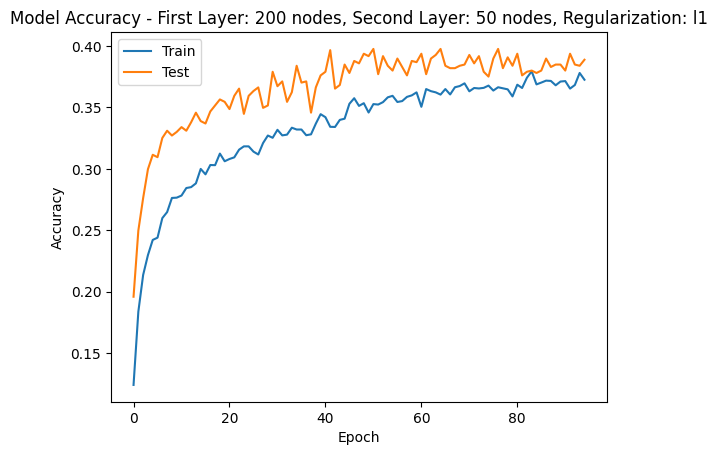

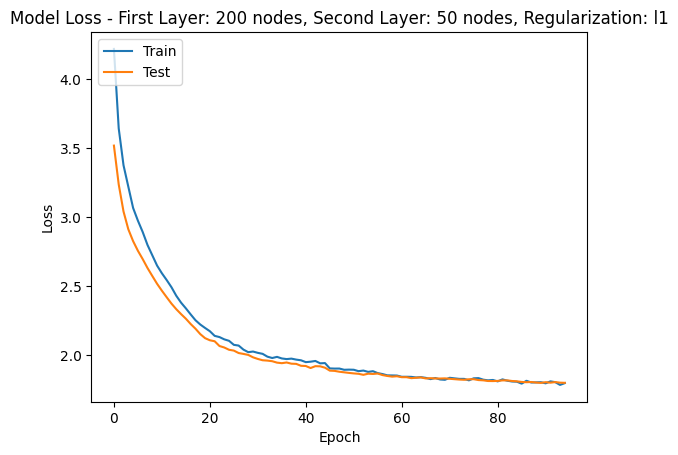

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l2 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0844 - loss: 3.5737 - val_accuracy: 0.1195 - val_loss: 2.7332 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1810 - loss: 2.8647 - val_accuracy: 0.2067 - val_loss: 2.4722 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2085 - loss: 2.6194 - val_accuracy: 0.2644 - val_loss: 2.2726 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2297 - loss: 2.4689 - val_accuracy: 0.2742 - val_loss: 2.1680 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step accuracy: 0.2467 - loss: 2.3887 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2496, Train Precision = 0.3363, Train Recall = 0.3154, Train MSE = 6.9574, Train R² = 0.5278, Val Accuracy = 0.2938, Val Precision = 0.3701, Val Recall = 0.2938, Val MSE = 7.7894, Val R² = 0.4714
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

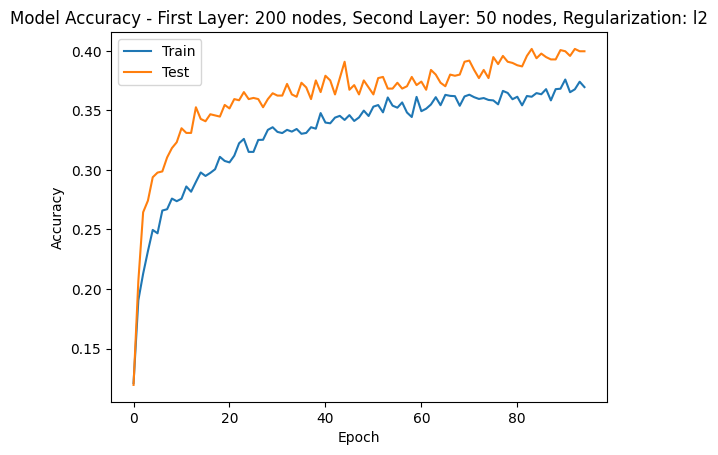

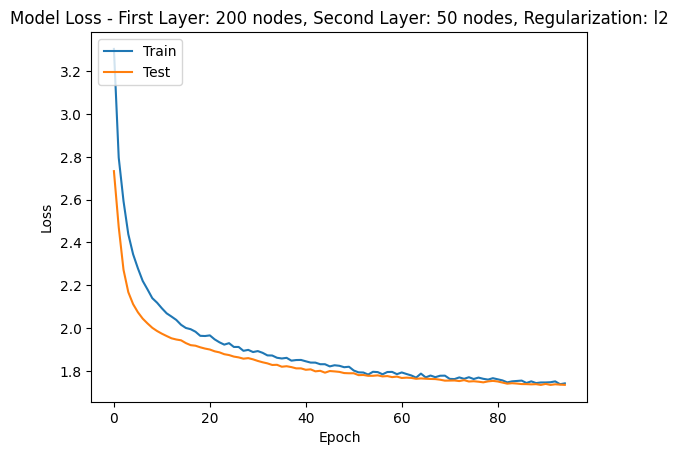

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l1 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0887 - loss: 8.1851 - val_accuracy: 0.2008 - val_loss: 6.8509 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1866 - loss: 6.7965 - val_accuracy: 0.2302 - val_loss: 5.9255 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2051 - loss: 5.8827 - val_accuracy: 0.2586 - val_loss: 5.0805 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2281 - loss: 5.0731 - val_accuracy: 0.2958 - val_loss: 4.3783 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step accuracy: 0.2602 - loss: 4.3995 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2600, Train Precision = 0.3585, Train Recall = 0.3008, Train MSE = 6.6634, Train R² = 0.5477, Val Accuracy = 0.3046, Val Precision = 0.3962, Val Recall = 0.3046, Val MSE = 7.4270, Val R² = 0.4960
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2576 - loss: 3.8387 - val_accuracy: 0.3164 - val_loss: 3.3858 - learning_rate: 5.0000e-04
Epoch 7/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2619 - loss: 3.3964 - val_accuracy: 0.3164 - val_loss: 3.0538 - learning_rate: 5.0000e-04
Epoch 8/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2778 - loss: 3.1168 - val_accuracy: 0.2997 - val_loss: 2.8349 - learning_rate: 5.0000e-04
Epoch 9/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2748 - loss: 2.8603 - val_accuracy: 0.3222 - val_loss: 2.6339 - learning_rate: 5.0000e-04
Epoch 10/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step accuracy: 0.2856 - loss: 2.6820 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 10: Train Accuracy = 0.2759, Train Precision = 0.3319, Train Recall = 0.3238, Train MSE = 5.6754, Train R² = 0.6148, Val Accuracy = 0.3017, Val Precision = 0.3659, Val Recall = 0.3017, Val MSE = 6.9892, Val R² = 0.5257
128/128 ━━━━━━━━━━━━━━━━━━━━ 1

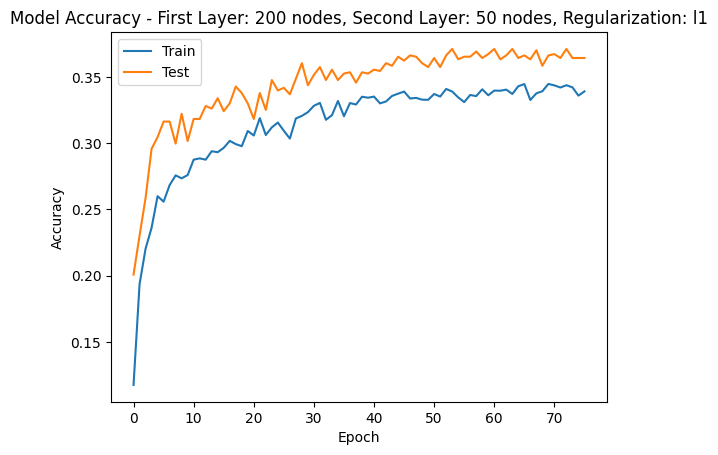

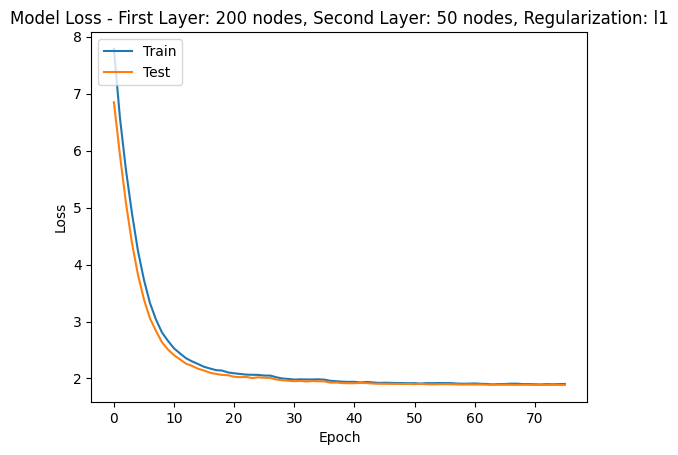

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l2 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1014 - loss: 3.9019 - val_accuracy: 0.2125 - val_loss: 3.0324 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1885 - loss: 3.1654 - val_accuracy: 0.2635 - val_loss: 2.7607 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2162 - loss: 2.9418 - val_accuracy: 0.2752 - val_loss: 2.5687 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2378 - loss: 2.7529 - val_accuracy: 0.2948 - val_loss: 2.4539 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step accuracy: 0.2431 - loss: 2.6407 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2473, Train Precision = 0.3439, Train Recall = 0.3166, Train MSE = 7.0316, Train R² = 0.5227, Val Accuracy = 0.3085, Val Precision = 0.3579, Val Recall = 0.3085, Val MSE = 7.7179, Val R² = 0.4763
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

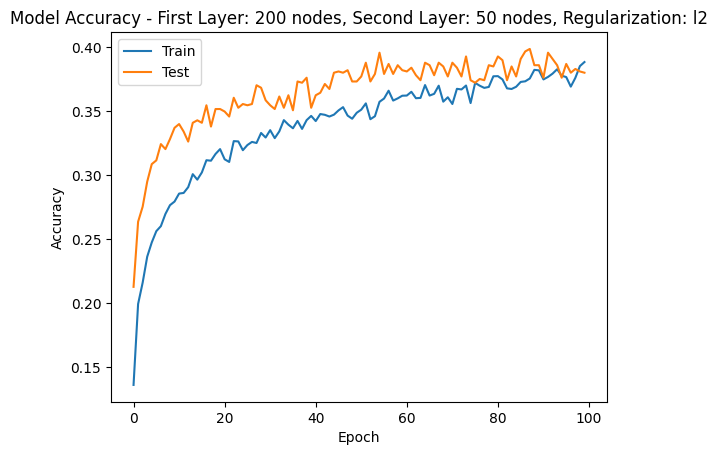

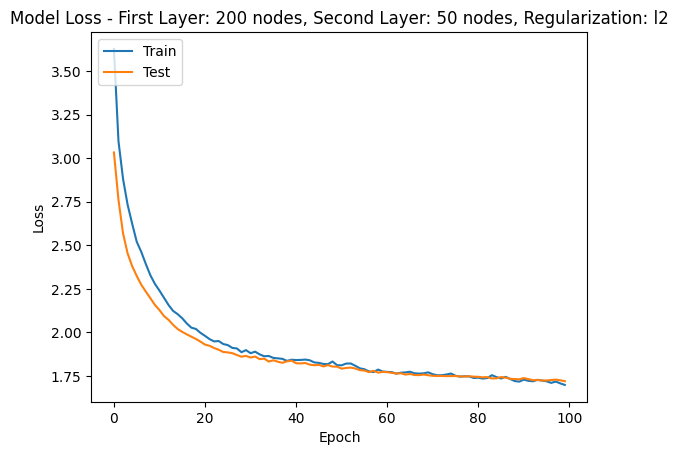

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l1 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.0970 - loss: 10.9810 - val_accuracy: 0.2233 - val_loss: 8.8900 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1825 - loss: 8.7650 - val_accuracy: 0.2380 - val_loss: 7.2513 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2161 - loss: 7.1196 - val_accuracy: 0.2527 - val_loss: 5.8516 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2209 - loss: 5.7805 - val_accuracy: 0.2762 - val_loss: 4.7437 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step accuracy: 0.2507 - loss: 4.7037 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2540, Train Precision = 0.4089, Train Recall = 0.2795, Train MSE = 7.1166, Train R² = 0.5170, Val Accuracy = 0.2752, Val Precision = 0.4976, Val Recall = 0.2752, Val MSE = 7.7532, Val R² = 0.4739
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s

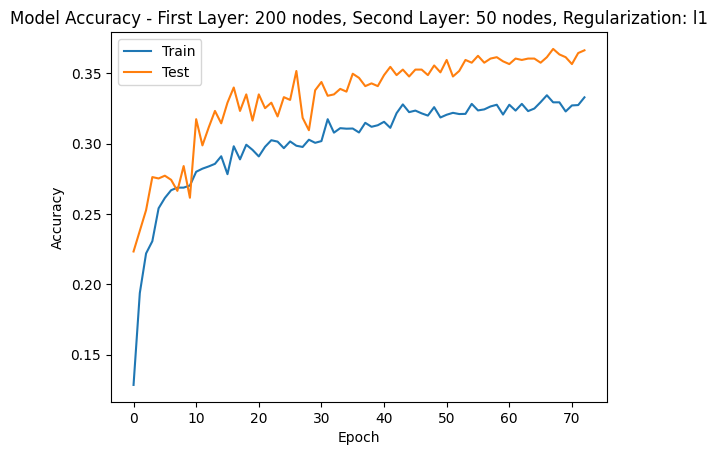

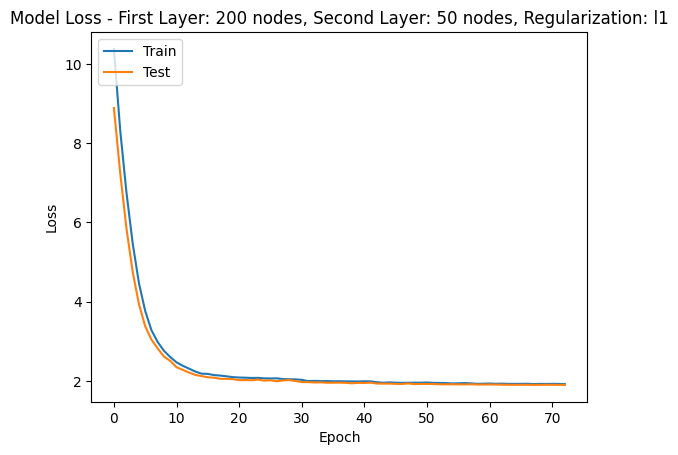

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l2 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0921 - loss: 4.2959 - val_accuracy: 0.1920 - val_loss: 3.3855 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1933 - loss: 3.4777 - val_accuracy: 0.2380 - val_loss: 3.0672 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2066 - loss: 3.1855 - val_accuracy: 0.2870 - val_loss: 2.7995 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2316 - loss: 2.9725 - val_accuracy: 0.2987 - val_loss: 2.6366 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step accuracy: 0.2467 - loss: 2.8161 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2459, Train Precision = 0.3627, Train Recall = 0.3203, Train MSE = 6.6244, Train R² = 0.5504, Val Accuracy = 0.2997, Val Precision = 0.3812, Val Recall = 0.2997, Val MSE = 7.5710, Val R² = 0.4862
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

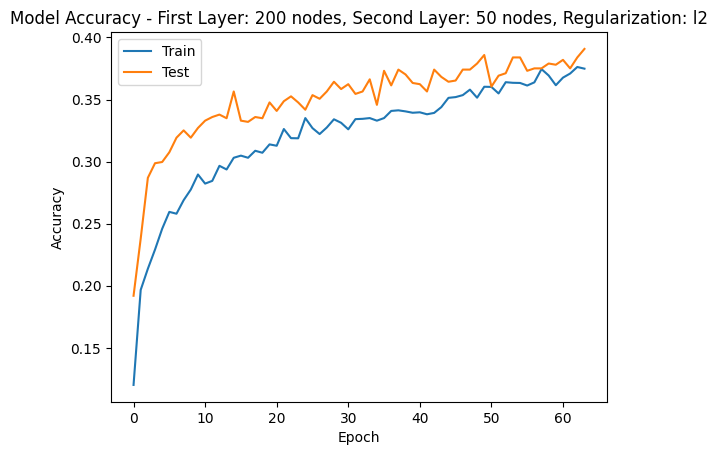

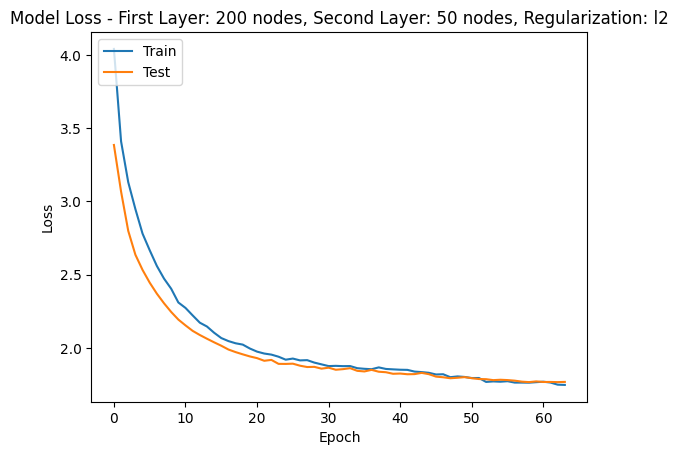

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l1 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.0963 - loss: 12.7553 - val_accuracy: 0.2272 - val_loss: 10.1775 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1853 - loss: 9.7528 - val_accuracy: 0.2341 - val_loss: 7.8394 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2141 - loss: 7.4546 - val_accuracy: 0.2311 - val_loss: 5.9619 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2365 - loss: 5.7033 - val_accuracy: 0.2821 - val_loss: 4.5880 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step accuracy: 0.2445 - loss: 4.4896 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2509, Train Precision = 0.3716, Train Recall = 0.2660, Train MSE = 6.5479, Train R² = 0.5556, Val Accuracy = 0.2586, Val Precision = 0.3579, Val Recall = 0.2586, Val MSE = 7.0784, Val R² = 0.5197
128/128 ━━━━━━━━━━━━━━━━━━━━ 1

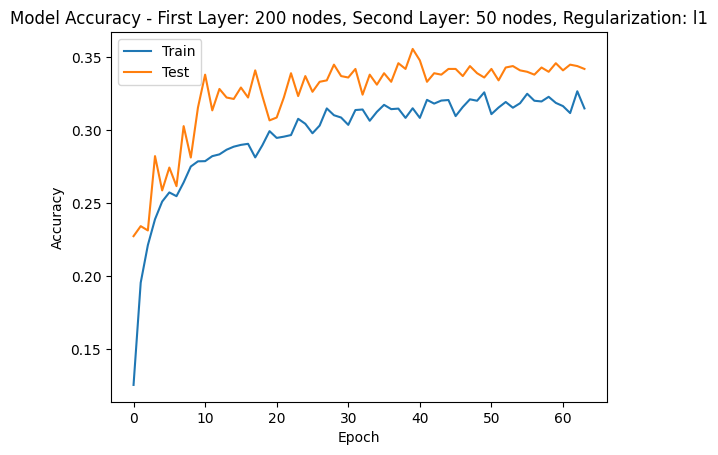

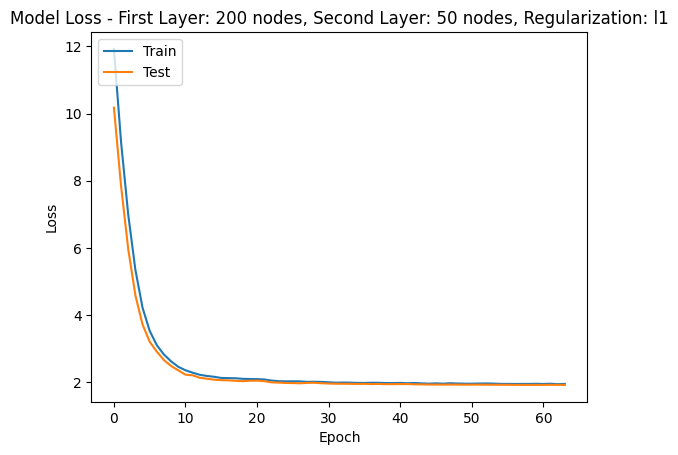

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l2 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1030 - loss: 4.4394 - val_accuracy: 0.2018 - val_loss: 3.4773 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1831 - loss: 3.5953 - val_accuracy: 0.2644 - val_loss: 3.1239 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2143 - loss: 3.2541 - val_accuracy: 0.2889 - val_loss: 2.8603 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2283 - loss: 3.0572 - val_accuracy: 0.2929 - val_loss: 2.6866 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step accuracy: 0.2428 - loss: 2.8656 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2480, Train Precision = 0.3348, Train Recall = 0.3165, Train MSE = 6.3559, Train R² = 0.5686, Val Accuracy = 0.3017, Val Precision = 0.3790, Val Recall = 0.3017, Val MSE = 7.1244, Val R² = 0.5165
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

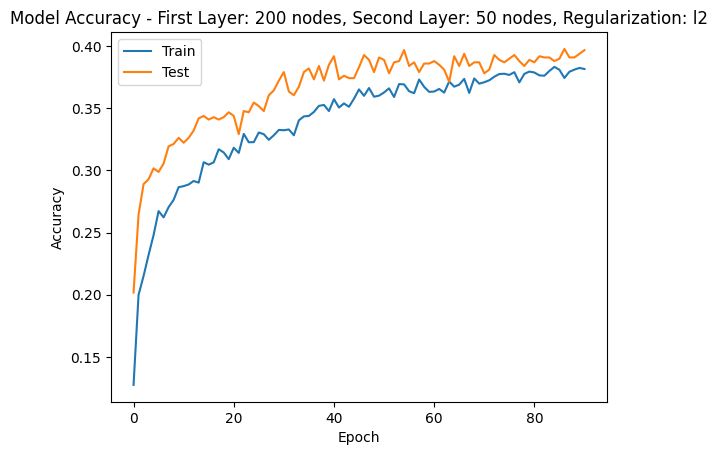

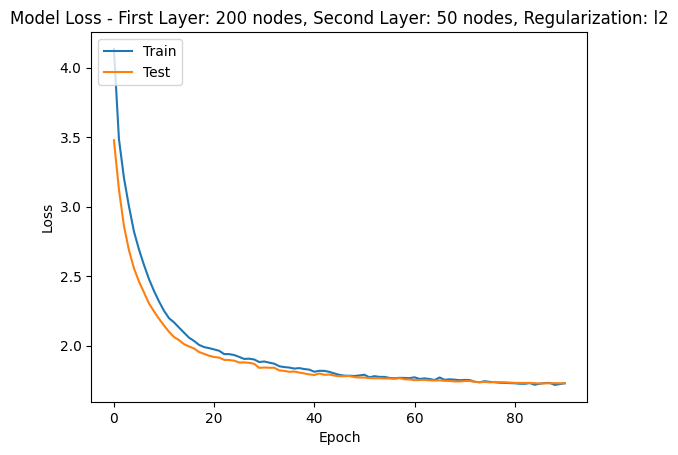

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l1 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0673 - loss: 45.4053 - val_accuracy: 0.1166 - val_loss: 25.4249 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1580 - loss: 21.0348 - val_accuracy: 0.0735 - val_loss: 10.3480 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2060 - loss: 8.3261 - val_accuracy: 0.1577 - val_loss: 4.8702 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2194 - loss: 4.0554 - val_accuracy: 0.1469 - val_loss: 3.2857 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step accuracy: 0.2608 - loss: 2.7542 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2511, Train Precision = 0.3692, Train Recall = 0.1869, Train MSE = 9.9548, Train R² = 0.3243, Val Accuracy = 0.1998, Val Precision = 0.4648, Val Recall = 0.1998, Val MSE = 10.4280, Val R² = 0.2924
128/128 ━━━━━━━━━━━━━━━━━━━

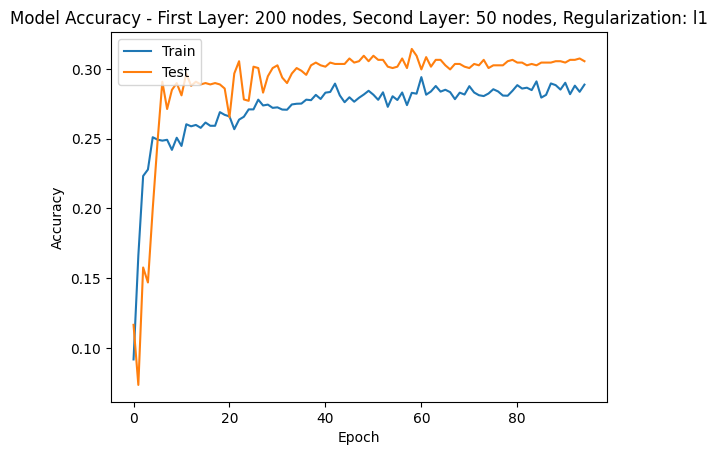

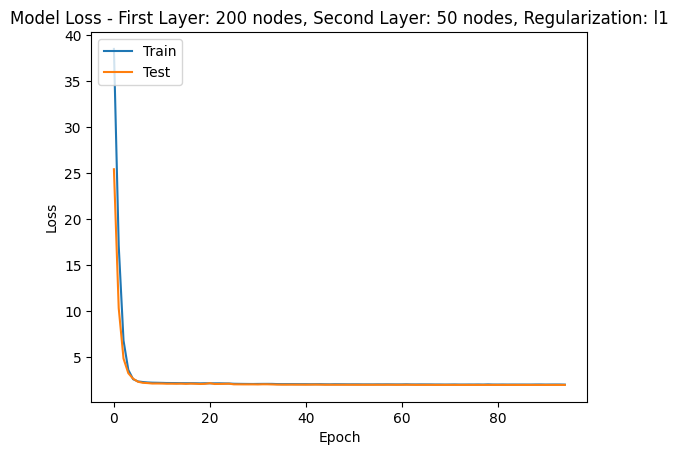

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l2 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0872 - loss: 8.2794 - val_accuracy: 0.1685 - val_loss: 6.1577 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1782 - loss: 5.9345 - val_accuracy: 0.2018 - val_loss: 4.7394 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2049 - loss: 4.5734 - val_accuracy: 0.2478 - val_loss: 3.7684 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2315 - loss: 3.7091 - val_accuracy: 0.2889 - val_loss: 3.1323 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step accuracy: 0.2572 - loss: 3.1509 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2595, Train Precision = 0.4110, Train Recall = 0.3036, Train MSE = 6.6006, Train R² = 0.5520, Val Accuracy = 0.3134, Val Precision = 0.4371, Val Recall = 0.3134, Val MSE = 7.5935, Val R² = 0.4847
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

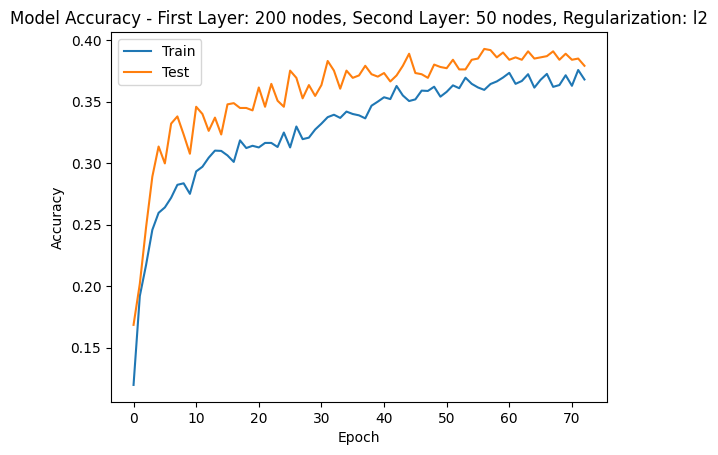

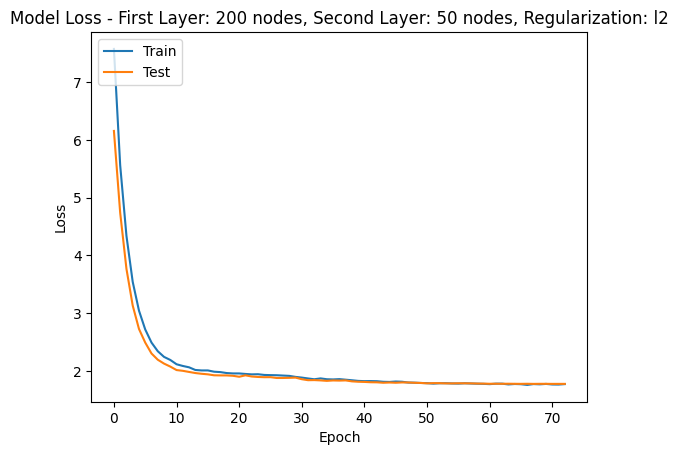

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l1 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0698 - loss: 85.3695 - val_accuracy: 0.0666 - val_loss: 41.6251 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1363 - loss: 32.2209 - val_accuracy: 0.1606 - val_loss: 11.0362 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2028 - loss: 7.9155 - val_accuracy: 0.1920 - val_loss: 3.6776 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2315 - loss: 2.9623 - val_accuracy: 0.1450 - val_loss: 2.8311 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step accuracy: 0.2438 - loss: 2.4897 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2380, Train Precision = 0.6305, Train Recall = 0.1864, Train MSE = 11.6453, Train R² = 0.2096, Val Accuracy = 0.1832, Val Precision = 0.6948, Val Recall = 0.1832, Val MSE = 11.9452, Val R² = 0.1894
128/128 ━━━━━━━━━━━━━━━━━━

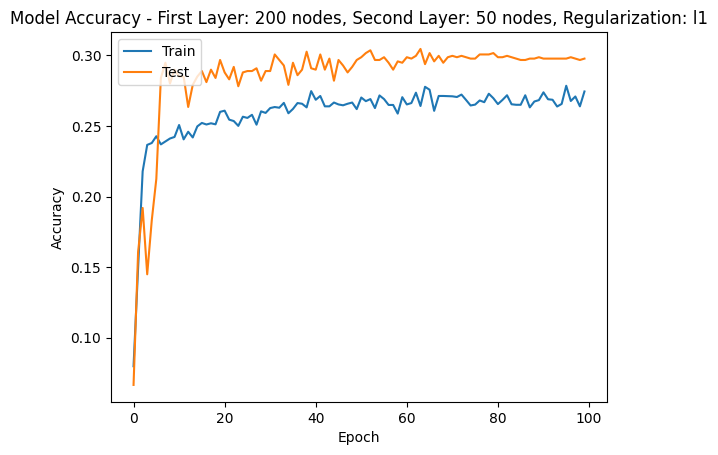

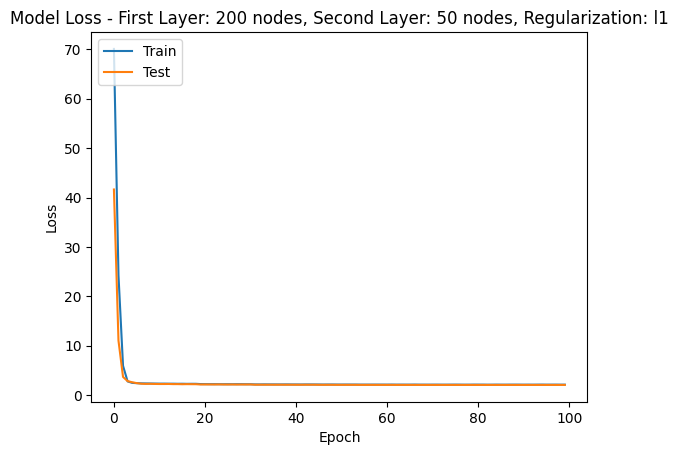

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l2 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0920 - loss: 12.4671 - val_accuracy: 0.1548 - val_loss: 8.0971 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1864 - loss: 7.4648 - val_accuracy: 0.2106 - val_loss: 5.3170 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2241 - loss: 4.9446 - val_accuracy: 0.2439 - val_loss: 3.8276 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2382 - loss: 3.6772 - val_accuracy: 0.2772 - val_loss: 3.0179 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step accuracy: 0.2605 - loss: 2.9743 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2506, Train Precision = 0.3610, Train Recall = 0.2740, Train MSE = 6.4241, Train R² = 0.5640, Val Accuracy = 0.2723, Val Precision = 0.3946, Val Recall = 0.2723, Val MSE = 7.2272, Val R² = 0.5096
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s

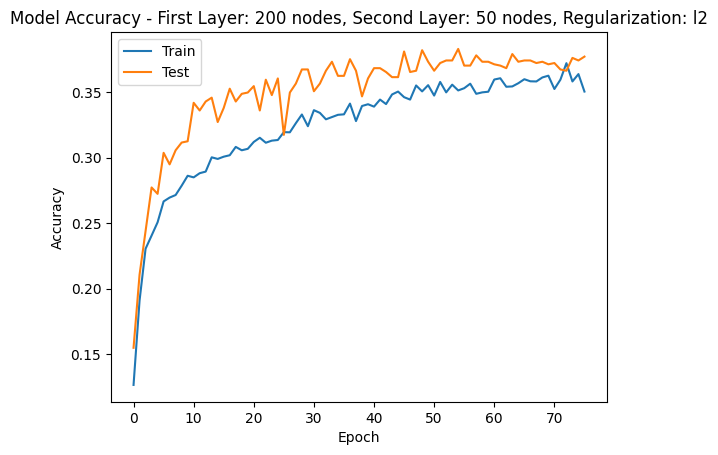

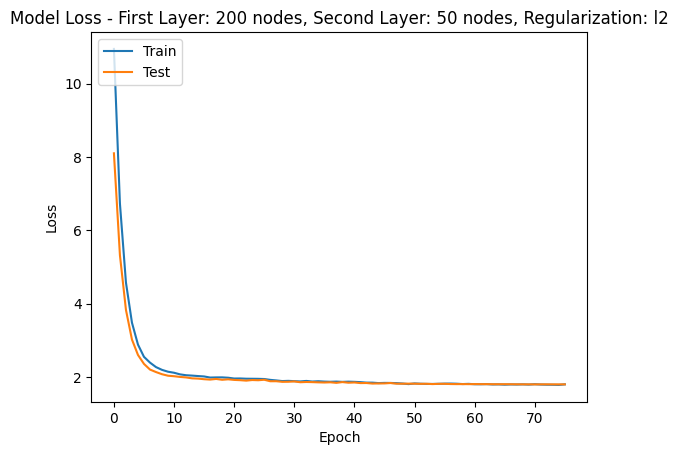

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l1 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0989 - loss: 5.1517 - val_accuracy: 0.2076 - val_loss: 4.0671 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2013 - loss: 4.2451 - val_accuracy: 0.2243 - val_loss: 3.7307 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2320 - loss: 3.9093 - val_accuracy: 0.2772 - val_loss: 3.4822 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2390 - loss: 3.7104 - val_accuracy: 0.2997 - val_loss: 3.3276 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step accuracy: 0.2588 - loss: 3.5591 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Epoch 5: Train Accuracy = 0.2615, Train Precision = 0.3758, Train Recall = 0.3337, Train MSE = 6.0617, Train R² = 0.5886, Val Accuracy = 0.3095, Val Precision = 0.4097, Val Recall = 0.3095, Val MSE = 6.9040, Val R² = 0.5315
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

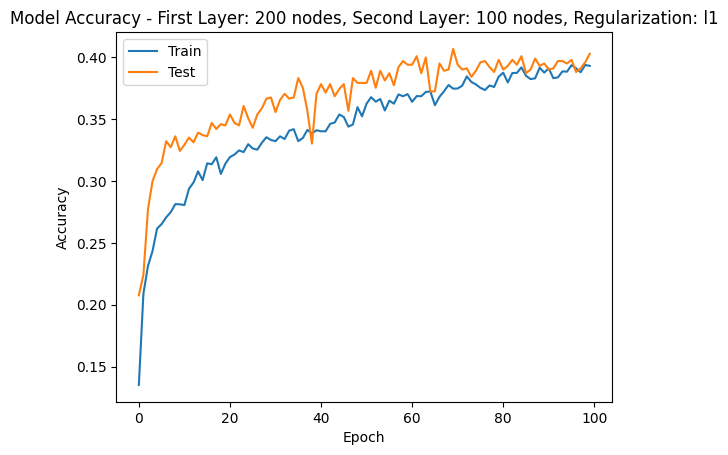

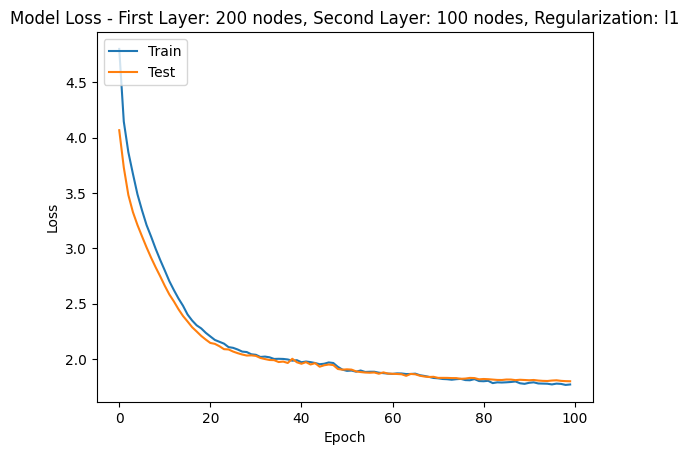

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l2 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1042 - loss: 3.6304 - val_accuracy: 0.1802 - val_loss: 2.6726 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1836 - loss: 2.8581 - val_accuracy: 0.2155 - val_loss: 2.3954 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2137 - loss: 2.5982 - val_accuracy: 0.2703 - val_loss: 2.2157 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2392 - loss: 2.4584 - val_accuracy: 0.2791 - val_loss: 2.1366 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step accuracy: 0.2557 - loss: 2.3424 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2562, Train Precision = 0.3663, Train Recall = 0.3221, Train MSE = 6.3177, Train R² = 0.5712, Val Accuracy = 0.2977, Val Precision = 0.3709, Val Recall = 0.2977, Val MSE = 6.9892, Val R² = 0.5257
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

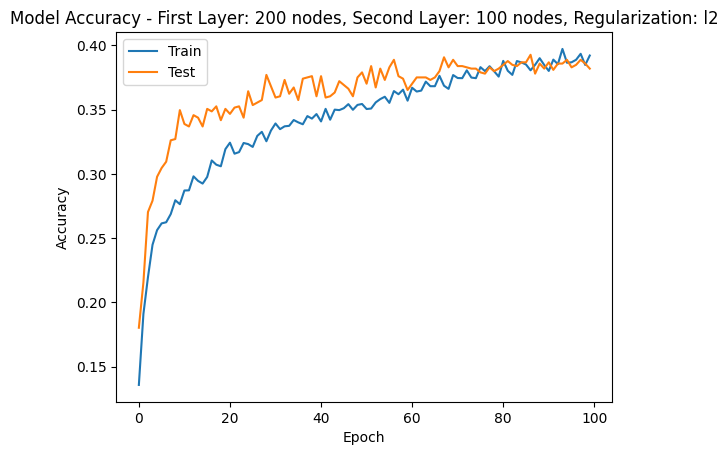

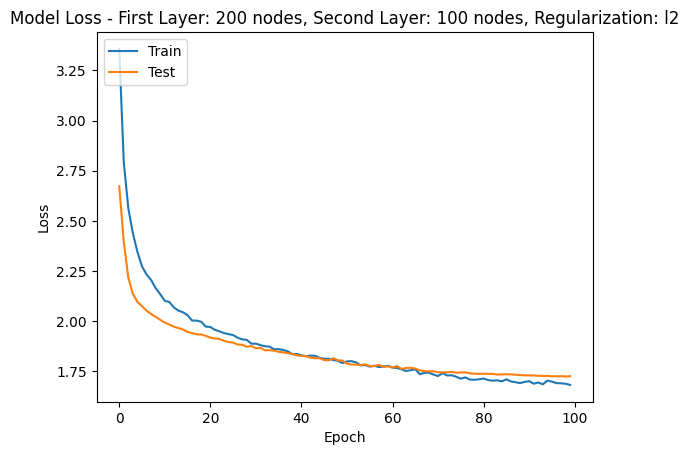

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l1 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.1015 - loss: 11.2553 - val_accuracy: 0.2165 - val_loss: 9.2543 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1982 - loss: 9.1101 - val_accuracy: 0.2498 - val_loss: 7.6970 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2329 - loss: 7.5802 - val_accuracy: 0.2684 - val_loss: 6.3492 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2430 - loss: 6.2816 - val_accuracy: 0.3046 - val_loss: 5.2590 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2582 - loss: 5.2289 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2547, Train Precision = 0.3706, Train Recall = 0.3176, Train MSE = 6.5712, Train R² = 0.5540, Val Accuracy = 0.3017, Val Precision = 0.3680, Val Recall = 0.3017, Val MSE = 7.5103, Val R² = 0.4904
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3290 - loss: 1.9549 - val_accuracy: 0.3467 - val_loss: 1.9391 - learning_rate: 2.5000e-04
Epoch 47/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3286 - loss: 1.9704 - val_accuracy: 0.3595 - val_loss: 1.9355 - learning_rate: 2.5000e-04
Epoch 48/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3333 - loss: 1.9398 - val_accuracy: 0.3546 - val_loss: 1.9391 - learning_rate: 2.5000e-04
Epoch 49/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3369 - loss: 1.9463 - val_accuracy: 0.3595 - val_loss: 1.9322 - learning_rate: 2.5000e-04
Epoch 50/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step accuracy: 0.3418 - loss: 1.9501 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 50: Train Accuracy = 0.3347, Train Precision = 0.4352, Train Recall = 0.3699, Train MSE = 5.0028, Train R² = 0.6604, Val Accuracy = 0.3702, Val Precision = 0.4322, Val Recall = 0.3702, Val MSE = 6.2439, Val R² = 0.5763
128/128 ━━━━━━━━━━━━━━━━━━━

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3343 - loss: 1.9617 - val_accuracy: 0.3634 - val_loss: 1.9421 - learning_rate: 2.5000e-04
Epoch 52/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3309 - loss: 1.9530 - val_accuracy: 0.3692 - val_loss: 1.9282 - learning_rate: 2.5000e-04
Epoch 53/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3405 - loss: 1.9356 - val_accuracy: 0.3653 - val_loss: 1.9249 - learning_rate: 2.5000e-04
Epoch 54/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3244 - loss: 1.9445 - val_accuracy: 0.3497 - val_loss: 1.9291 - learning_rate: 2.5000e-04
Epoch 55/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 679us/step accuracy: 0.3311 - loss: 1.9144 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 55: Train Accuracy = 0.3306, Train Precision = 0.4254, Train Recall = 0.3657, Train MSE = 5.1573, Train R² = 0.6500, Val Accuracy = 0.3614, Val Precision = 0.4212, Val Recall = 0.3614, Val MSE = 6.2938, Val R² = 0.5729
128/128 ━━━━━━━━━━━━━━━━━━━

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3437 - loss: 1.8827 - val_accuracy: 0.3751 - val_loss: 1.8810 - learning_rate: 6.2500e-05
Epoch 87/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3535 - loss: 1.8738 - val_accuracy: 0.3663 - val_loss: 1.8776 - learning_rate: 6.2500e-05
Epoch 88/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3486 - loss: 1.8677 - val_accuracy: 0.3683 - val_loss: 1.8742 - learning_rate: 3.1250e-05
Epoch 89/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3453 - loss: 1.8748 - val_accuracy: 0.3722 - val_loss: 1.8738 - learning_rate: 3.1250e-05
Epoch 90/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step accuracy: 0.3546 - loss: 1.8771 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 90: Train Accuracy = 0.3525, Train Precision = 0.4426, Train Recall = 0.3795, Train MSE = 4.8250, Train R² = 0.6725, Val Accuracy = 0.3683, Val Precision = 0.4304, Val Recall = 0.3683, Val MSE = 5.8247, Val R² = 0.6047
128/128 ━━━━━━━━━━━━━━━━━━━

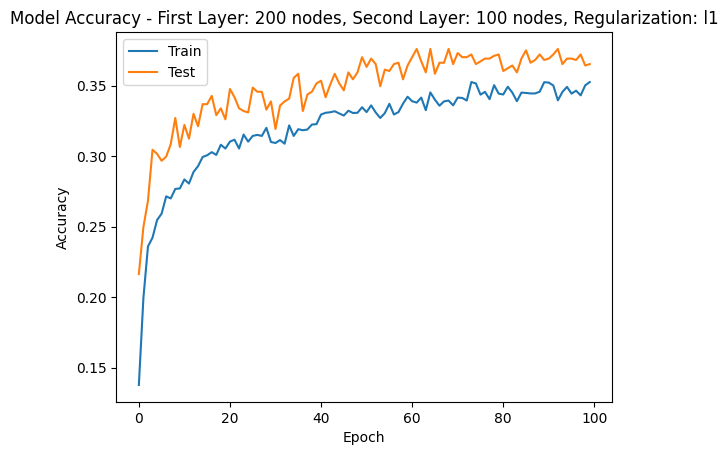

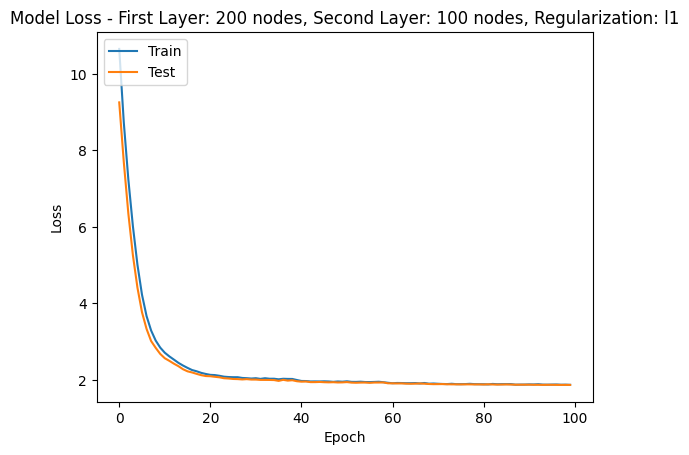

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l2 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0974 - loss: 4.2468 - val_accuracy: 0.2096 - val_loss: 3.3033 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1947 - loss: 3.4729 - val_accuracy: 0.2341 - val_loss: 2.9864 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2356 - loss: 3.1348 - val_accuracy: 0.2635 - val_loss: 2.7372 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2333 - loss: 2.9676 - val_accuracy: 0.2821 - val_loss: 2.5992 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2665 - loss: 2.8095 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2578, Train Precision = 0.3910, Train Recall = 0.3179, Train MSE = 6.4581, Train R² = 0.5617, Val Accuracy = 0.2870, Val Precision = 0.3402, Val Recall = 0.2870, Val MSE = 7.0617, Val R² = 0.5208
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3509 - loss: 1.8230 - val_accuracy: 0.3683 - val_loss: 1.8124 - learning_rate: 5.0000e-04
Epoch 42/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3574 - loss: 1.8139 - val_accuracy: 0.3781 - val_loss: 1.8112 - learning_rate: 5.0000e-04
Epoch 43/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3563 - loss: 1.8167 - val_accuracy: 0.3800 - val_loss: 1.8151 - learning_rate: 5.0000e-04
Epoch 44/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3624 - loss: 1.7971 - val_accuracy: 0.3595 - val_loss: 1.8145 - learning_rate: 5.0000e-04
Epoch 45/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step accuracy: 0.3423 - loss: 1.8071 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Epoch 45: Train Accuracy = 0.3502, Train Precision = 0.4392, Train Recall = 0.4066, Train MSE = 4.2082, Train R² = 0.7144, Val Accuracy = 0.3663, Val Precision = 0.4232, Val Recall = 0.3663, Val MSE = 5.2331, Val R² = 0.6449
128/128 ━━━━━━━━━━━━━━━━━━━

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3815 - loss: 1.7639 - val_accuracy: 0.3800 - val_loss: 1.7753 - learning_rate: 2.5000e-04
Epoch 52/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3810 - loss: 1.7527 - val_accuracy: 0.3741 - val_loss: 1.7743 - learning_rate: 2.5000e-04
Epoch 53/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3831 - loss: 1.7508 - val_accuracy: 0.3741 - val_loss: 1.7692 - learning_rate: 2.5000e-04
Epoch 54/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3780 - loss: 1.7561 - val_accuracy: 0.3947 - val_loss: 1.7665 - learning_rate: 2.5000e-04
Epoch 55/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step accuracy: 0.3877 - loss: 1.7401 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 55: Train Accuracy = 0.3832, Train Precision = 0.4191, Train Recall = 0.4258, Train MSE = 3.8814, Train R² = 0.7366, Val Accuracy = 0.3820, Val Precision = 0.4166, Val Recall = 0.3820, Val MSE = 4.8022, Val R² = 0.6741
128/128 ━━━━━━━━━━━━━━━━━━━

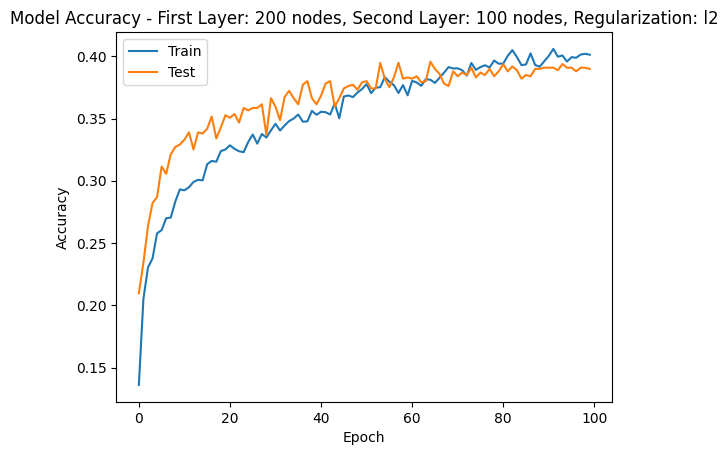

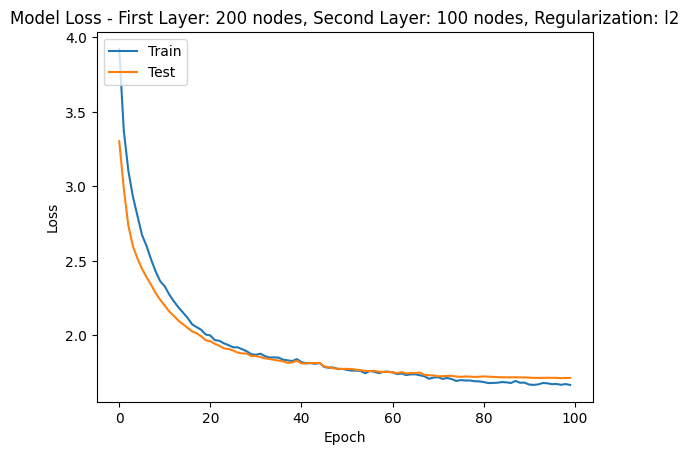

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l1 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1015 - loss: 15.6162 - val_accuracy: 0.2184 - val_loss: 12.1930 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2031 - loss: 11.4966 - val_accuracy: 0.2390 - val_loss: 9.0512 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2274 - loss: 8.5077 - val_accuracy: 0.2586 - val_loss: 6.6477 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2422 - loss: 6.3210 - val_accuracy: 0.2723 - val_loss: 5.0143 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step accuracy: 0.2537 - loss: 4.8533 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2594, Train Precision = 0.3613, Train Recall = 0.2925, Train MSE = 6.6396, Train R² = 0.5494, Val Accuracy = 0.2772, Val Precision = 0.3447, Val Recall = 0.2772, Val MSE = 7.3516, Val R² = 0.5011
128/128 ━━━━━━━━━━━━━━━━━━━━ 

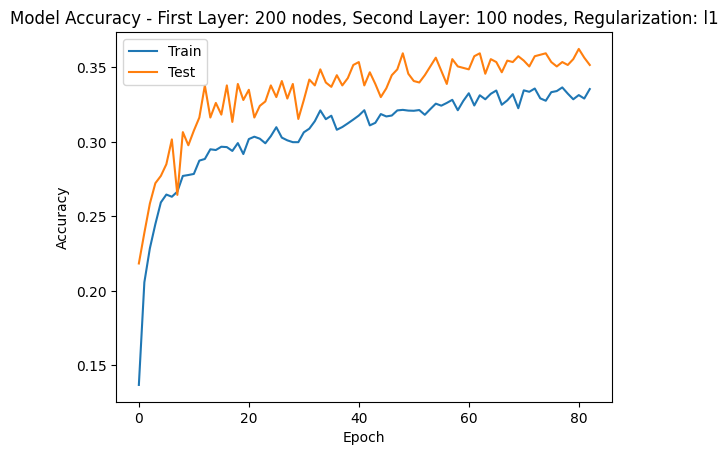

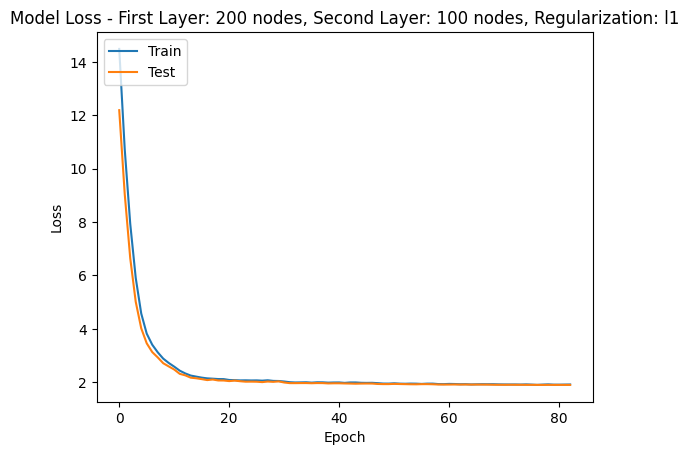

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l2 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.1131 - loss: 4.6595 - val_accuracy: 0.2360 - val_loss: 3.6531 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1969 - loss: 3.8536 - val_accuracy: 0.2693 - val_loss: 3.2939 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2234 - loss: 3.4758 - val_accuracy: 0.2909 - val_loss: 3.0197 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2345 - loss: 3.2515 - val_accuracy: 0.3085 - val_loss: 2.8354 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2568 - loss: 3.0235   
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2525, Train Precision = 0.3554, Train Recall = 0.3304, Train MSE = 6.5527, Train R² = 0.5552, Val Accuracy = 0.3242, Val Precision = 0.3927, Val Recall = 0.3242, Val MSE = 7.2860, Val R² = 0.5056
128/128 ━━━━━━━━━━━━━━━━━━━━ 1

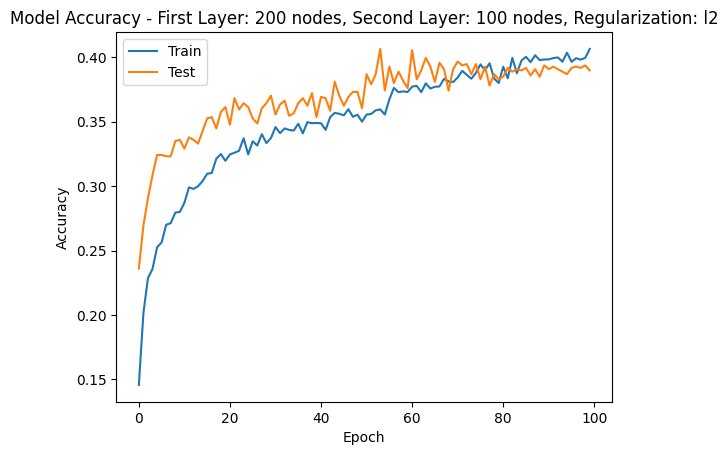

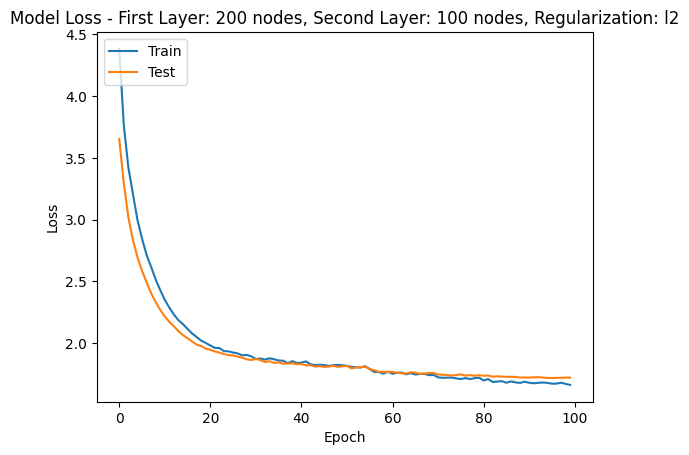

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l1 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0996 - loss: 18.6398 - val_accuracy: 0.1734 - val_loss: 14.1071 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1800 - loss: 13.2661 - val_accuracy: 0.2037 - val_loss: 9.9776 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2278 - loss: 9.3163 - val_accuracy: 0.2439 - val_loss: 6.9304 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2434 - loss: 6.5716 - val_accuracy: 0.2625 - val_loss: 5.0427 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step accuracy: 0.2483 - loss: 4.9058 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2492, Train Precision = 0.3514, Train Recall = 0.2770, Train MSE = 7.1007, Train R² = 0.5181, Val Accuracy = 0.2723, Val Precision = 0.3768, Val Recall = 0.2723, Val MSE = 7.7267, Val R² = 0.4757
128/128 ━━━━━━━━━━━━━━━━━━━━ 

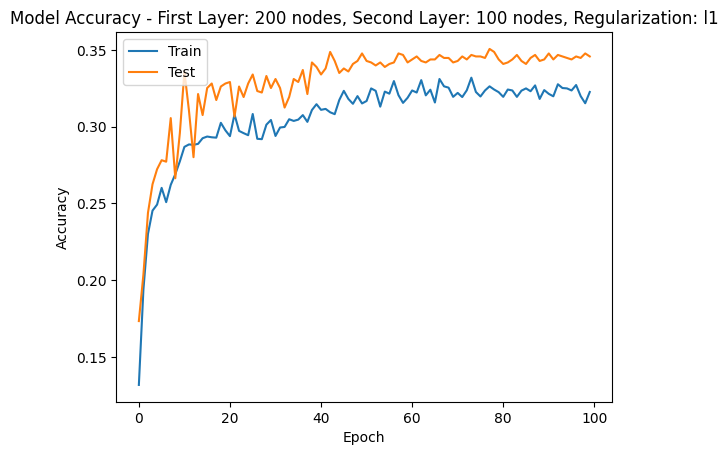

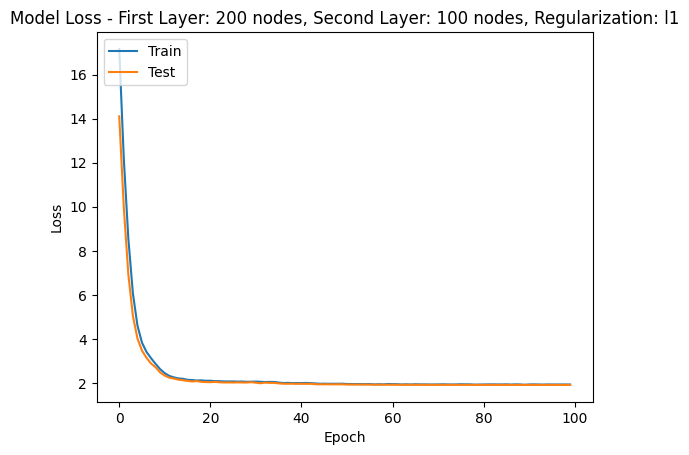

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l2 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1044 - loss: 5.0088 - val_accuracy: 0.2321 - val_loss: 3.9063 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1985 - loss: 4.0442 - val_accuracy: 0.2703 - val_loss: 3.4917 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2280 - loss: 3.6713 - val_accuracy: 0.2899 - val_loss: 3.1763 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2489 - loss: 3.3756 - val_accuracy: 0.2987 - val_loss: 2.9576 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step accuracy: 0.2508 - loss: 3.1649 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2487, Train Precision = 0.3765, Train Recall = 0.3230, Train MSE = 6.3222, Train R² = 0.5709, Val Accuracy = 0.2938, Val Precision = 0.3747, Val Recall = 0.2938, Val MSE = 7.1978, Val R² = 0.5116
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

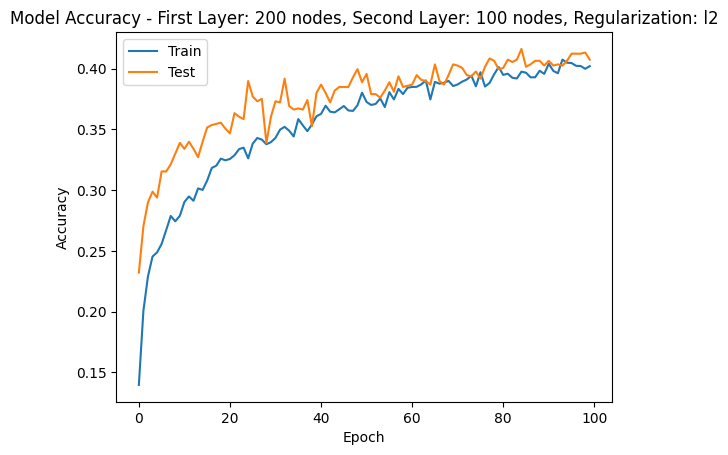

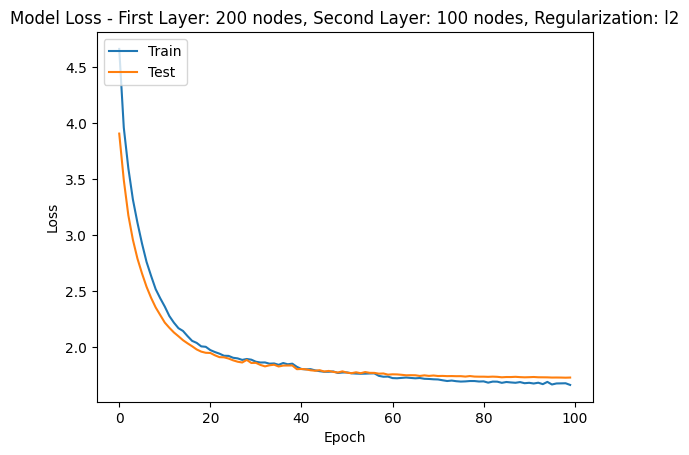

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l1 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0894 - loss: 71.6281 - val_accuracy: 0.1273 - val_loss: 35.1880 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1739 - loss: 27.6350 - val_accuracy: 0.1871 - val_loss: 11.1414 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2138 - loss: 8.8406 - val_accuracy: 0.1273 - val_loss: 5.3831 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2352 - loss: 4.5222 - val_accuracy: 0.1783 - val_loss: 3.4156 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step accuracy: 0.2569 - loss: 2.8800 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2584, Train Precision = 0.3832, Train Recall = 0.1784, Train MSE = 10.0130, Train R² = 0.3204, Val Accuracy = 0.1832, Val Precision = 0.3847, Val Recall = 0.1832, Val MSE = 10.4270, Val R² = 0.2924
128/128 ━━━━━━━━━━━━━━━━━━

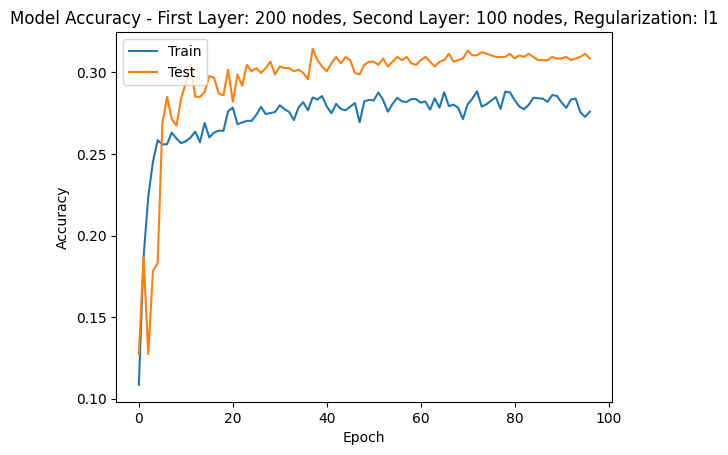

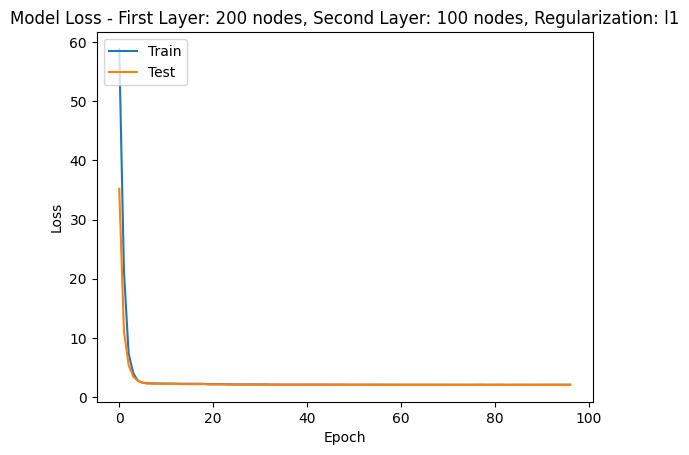

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l2 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1021 - loss: 10.6811 - val_accuracy: 0.2086 - val_loss: 7.5573 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1981 - loss: 7.2093 - val_accuracy: 0.2302 - val_loss: 5.5152 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2177 - loss: 5.3204 - val_accuracy: 0.2547 - val_loss: 4.2082 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2394 - loss: 4.1518 - val_accuracy: 0.2909 - val_loss: 3.3839 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step accuracy: 0.2656 - loss: 3.4223 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2637, Train Precision = 0.3923, Train Recall = 0.3079, Train MSE = 6.5804, Train R² = 0.5534, Val Accuracy = 0.2909, Val Precision = 0.4155, Val Recall = 0.2909, Val MSE = 7.5338, Val R² = 0.4888
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s

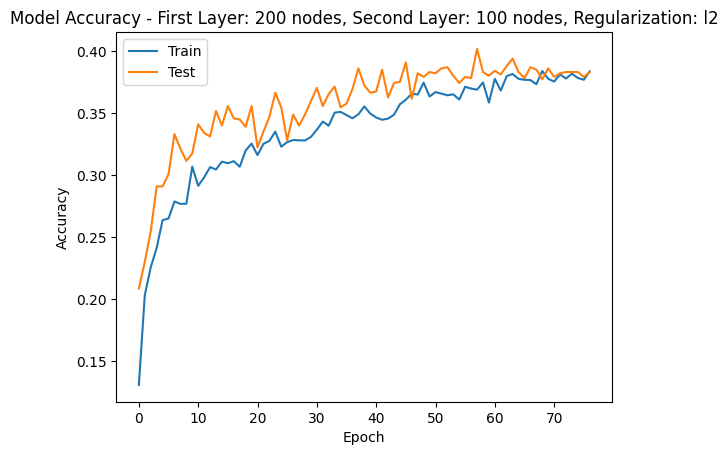

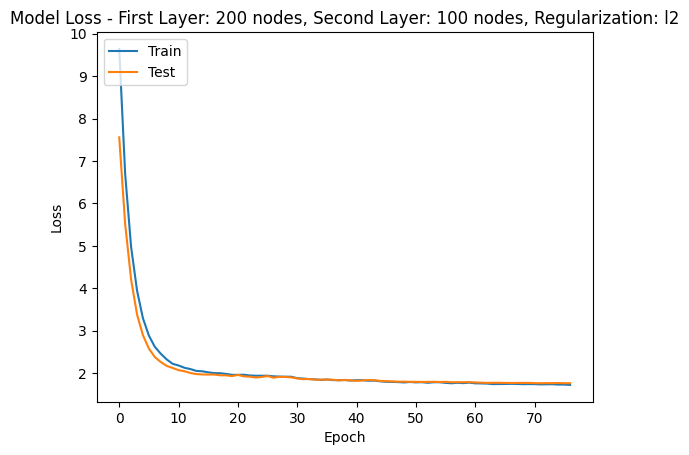

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l1 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0779 - loss: 135.7430 - val_accuracy: 0.1704 - val_loss: 58.3207 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1395 - loss: 42.7001 - val_accuracy: 0.1342 - val_loss: 10.6495 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2212 - loss: 7.5254 - val_accuracy: 0.1342 - val_loss: 3.6354 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2472 - loss: 2.9635 - val_accuracy: 0.1342 - val_loss: 2.8431 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step accuracy: 0.2444 - loss: 2.5049 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2418, Train Precision = 0.5163, Train Recall = 0.1869, Train MSE = 11.1001, Train R² = 0.2466, Val Accuracy = 0.1871, Val Precision = 0.5126, Val Recall = 0.1871, Val MSE = 11.4476, Val R² = 0.2232
128/128 ━━━━━━━━━━━━━━━━━

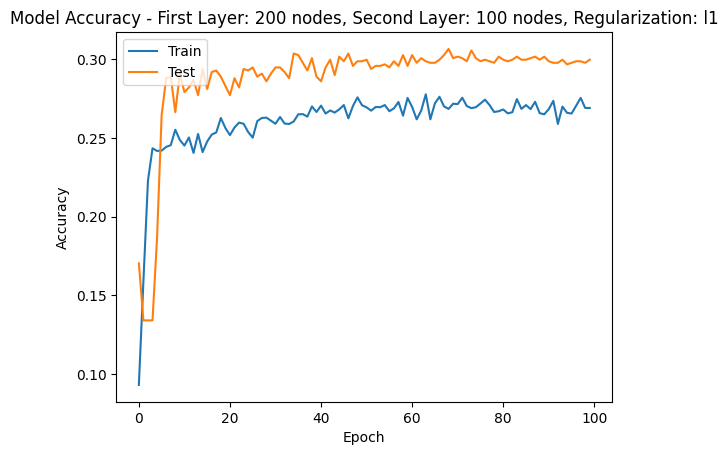

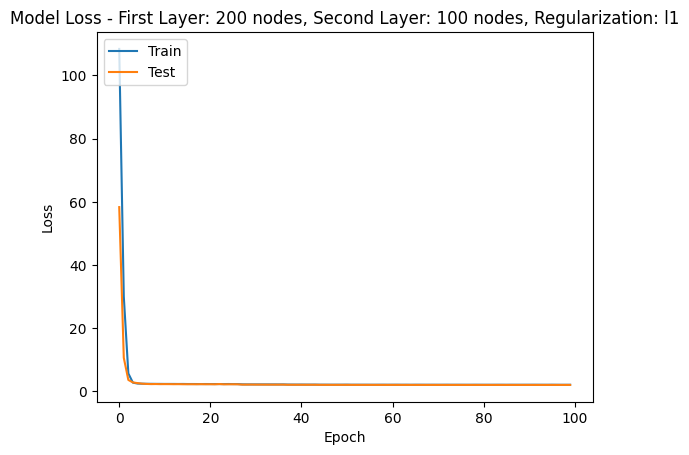

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l2 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1057 - loss: 16.6300 - val_accuracy: 0.1626 - val_loss: 10.0000 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2081 - loss: 8.8603 - val_accuracy: 0.1841 - val_loss: 5.9862 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2255 - loss: 5.4494 - val_accuracy: 0.2400 - val_loss: 4.0742 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2519 - loss: 3.8410 - val_accuracy: 0.2782 - val_loss: 3.1410 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step accuracy: 0.2690 - loss: 3.0900 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2633, Train Precision = 0.3449, Train Recall = 0.2981, Train MSE = 6.5304, Train R² = 0.5568, Val Accuracy = 0.2889, Val Precision = 0.3393, Val Recall = 0.2889, Val MSE = 7.0901, Val R² = 0.5189
128/128 ━━━━━━━━━━━━━━━━━━━━ 1

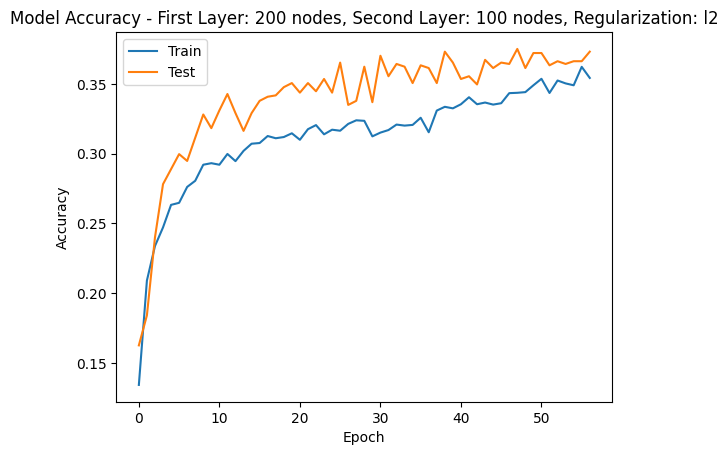

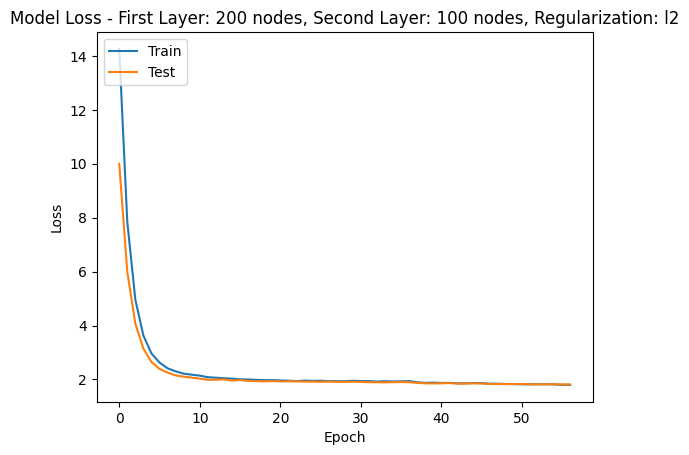

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l1 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1166 - loss: 4.8736 - val_accuracy: 0.1577 - val_loss: 4.2889 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2080 - loss: 4.0976 - val_accuracy: 0.1920 - val_loss: 3.9247 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2261 - loss: 3.8422 - val_accuracy: 0.2556 - val_loss: 3.5461 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2471 - loss: 3.5894 - val_accuracy: 0.2997 - val_loss: 3.2809 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step accuracy: 0.2610 - loss: 3.3767 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2577, Train Precision = 0.4071, Train Recall = 0.3221, Train MSE = 6.2985, Train R² = 0.5725, Val Accuracy = 0.3291, Val Precision = 0.4073, Val Recall = 0.3291, Val MSE = 7.1753, Val R² = 0.5131
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3155 - loss: 2.2568 - val_accuracy: 0.3164 - val_loss: 2.1999 - learning_rate: 5.0000e-04
Epoch 17/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3154 - loss: 2.2174 - val_accuracy: 0.3526 - val_loss: 2.1641 - learning_rate: 5.0000e-04
Epoch 18/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3261 - loss: 2.1779 - val_accuracy: 0.3497 - val_loss: 2.1291 - learning_rate: 5.0000e-04
Epoch 19/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3166 - loss: 2.1703 - val_accuracy: 0.3526 - val_loss: 2.1173 - learning_rate: 5.0000e-04
Epoch 20/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 694us/step accuracy: 0.3218 - loss: 2.1253 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 20: Train Accuracy = 0.3190, Train Precision = 0.4059, Train Recall = 0.3537, Train MSE = 4.4610, Train R² = 0.6972, Val Accuracy = 0.3144, Val Precision = 0.4007, Val Recall = 0.3144, Val MSE = 5.4515, Val R² = 0.6301
128/128 ━━━━━━━━━━━━━━━━━━━

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3255 - loss: 1.9792 - val_accuracy: 0.3732 - val_loss: 1.9404 - learning_rate: 5.0000e-04
Epoch 37/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3428 - loss: 1.9572 - val_accuracy: 0.3722 - val_loss: 1.9217 - learning_rate: 5.0000e-04
Epoch 38/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3393 - loss: 1.9516 - val_accuracy: 0.3683 - val_loss: 1.9229 - learning_rate: 5.0000e-04
Epoch 39/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3387 - loss: 1.9595 - val_accuracy: 0.3653 - val_loss: 1.9372 - learning_rate: 5.0000e-04
Epoch 40/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 695us/step accuracy: 0.3371 - loss: 1.9416 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 40: Train Accuracy = 0.3367, Train Precision = 0.4532, Train Recall = 0.3849, Train MSE = 4.5522, Train R² = 0.6910, Val Accuracy = 0.3653, Val Precision = 0.4364, Val Recall = 0.3653, Val MSE = 5.4917, Val R² = 0.6273
128/128 ━━━━━━━━━━━━━━━━━━━

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3743 - loss: 1.8080 - val_accuracy: 0.4006 - val_loss: 1.8174 - learning_rate: 1.2500e-04
Epoch 67/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3821 - loss: 1.8014 - val_accuracy: 0.3937 - val_loss: 1.8132 - learning_rate: 1.2500e-04
Epoch 68/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3770 - loss: 1.8000 - val_accuracy: 0.3898 - val_loss: 1.8094 - learning_rate: 1.2500e-04
Epoch 69/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3727 - loss: 1.8095 - val_accuracy: 0.3967 - val_loss: 1.8192 - learning_rate: 1.2500e-04
Epoch 70/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.3815 - loss: 1.7955 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Epoch 70: Train Accuracy = 0.3735, Train Precision = 0.4713, Train Recall = 0.4116, Train MSE = 3.8487, Train R² = 0.7388, Val Accuracy = 0.3830, Val Precision = 0.4498, Val Recall = 0.3830, Val MSE = 5.1832, Val R² = 0.6483
128/128 ━━━━━━━━━━━━━━━━━━━

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3690 - loss: 1.8064 - val_accuracy: 0.3839 - val_loss: 1.8110 - learning_rate: 1.2500e-04
Epoch 72/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3818 - loss: 1.7951 - val_accuracy: 0.4045 - val_loss: 1.8055 - learning_rate: 1.2500e-04
Epoch 73/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3834 - loss: 1.8048 - val_accuracy: 0.3859 - val_loss: 1.8135 - learning_rate: 1.2500e-04
Epoch 74/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3796 - loss: 1.8089 - val_accuracy: 0.3908 - val_loss: 1.8077 - learning_rate: 1.2500e-04
Epoch 75/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 705us/step accuracy: 0.3703 - loss: 1.7941 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 75: Train Accuracy = 0.3695, Train Precision = 0.4783, Train Recall = 0.4169, Train MSE = 3.8010, Train R² = 0.7420, Val Accuracy = 0.3957, Val Precision = 0.4602, Val Recall = 0.3957, Val MSE = 4.8727, Val R² = 0.6693
128/128 ━━━━━━━━━━━━━━━━━━━

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3903 - loss: 1.7648 - val_accuracy: 0.3908 - val_loss: 1.7901 - learning_rate: 6.2500e-05
Epoch 87/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3865 - loss: 1.7646 - val_accuracy: 0.3947 - val_loss: 1.7863 - learning_rate: 3.1250e-05
Epoch 88/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3735 - loss: 1.7710 - val_accuracy: 0.3918 - val_loss: 1.7867 - learning_rate: 3.1250e-05
Epoch 89/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3860 - loss: 1.7462 - val_accuracy: 0.3967 - val_loss: 1.7833 - learning_rate: 3.1250e-05
Epoch 90/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 694us/step accuracy: 0.3860 - loss: 1.7570 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 90: Train Accuracy = 0.3847, Train Precision = 0.4891, Train Recall = 0.4309, Train MSE = 3.7590, Train R² = 0.7449, Val Accuracy = 0.3928, Val Precision = 0.4561, Val Recall = 0.3928, Val MSE = 4.8286, Val R² = 0.6723
128/128 ━━━━━━━━━━━━━━━━━━━

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3840 - loss: 1.7681 - val_accuracy: 0.3937 - val_loss: 1.7845 - learning_rate: 3.1250e-05
Epoch 92/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3788 - loss: 1.7458 - val_accuracy: 0.3986 - val_loss: 1.7835 - learning_rate: 3.1250e-05
Epoch 93/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3835 - loss: 1.7555 - val_accuracy: 0.3986 - val_loss: 1.7842 - learning_rate: 3.1250e-05
Epoch 94/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3832 - loss: 1.7614 - val_accuracy: 0.3986 - val_loss: 1.7810 - learning_rate: 1.5625e-05
Epoch 95/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step accuracy: 0.3785 - loss: 1.7471 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 95: Train Accuracy = 0.3825, Train Precision = 0.4687, Train Recall = 0.4337, Train MSE = 3.7633, Train R² = 0.7446, Val Accuracy = 0.3957, Val Precision = 0.4596, Val Recall = 0.3957, Val MSE = 4.8678, Val R² = 0.6697
128/128 ━━━━━━━━━━━━━━━━━━━

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3896 - loss: 1.7644 - val_accuracy: 0.3976 - val_loss: 1.7799 - learning_rate: 1.5625e-05
Epoch 97/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3921 - loss: 1.7436 - val_accuracy: 0.3976 - val_loss: 1.7801 - learning_rate: 1.5625e-05
Epoch 98/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3804 - loss: 1.7708 - val_accuracy: 0.4006 - val_loss: 1.7806 - learning_rate: 1.5625e-05
Epoch 99/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3932 - loss: 1.7586 - val_accuracy: 0.3967 - val_loss: 1.7805 - learning_rate: 7.8125e-06
Epoch 100/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step accuracy: 0.3830 - loss: 1.7576 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 100: Train Accuracy = 0.3890, Train Precision = 0.4687, Train Recall = 0.4331, Train MSE = 3.6691, Train R² = 0.7510, Val Accuracy = 0.3976, Val Precision = 0.4639, Val Recall = 0.3976, Val MSE = 4.8756, Val R² = 0.6691
128/128 ━━━━━━━━━━━━━━━━━

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


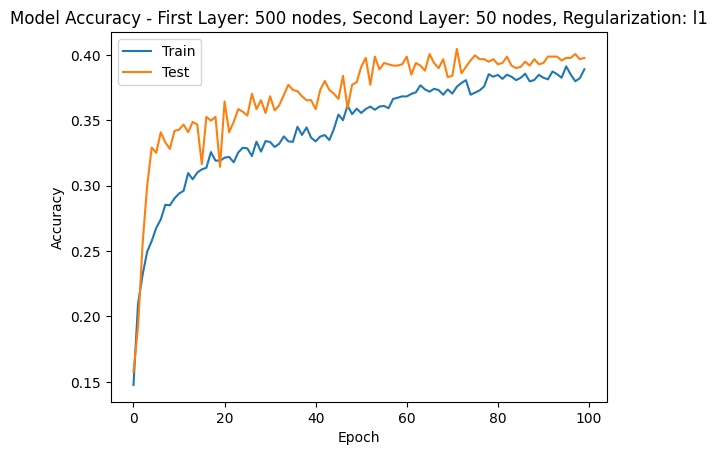

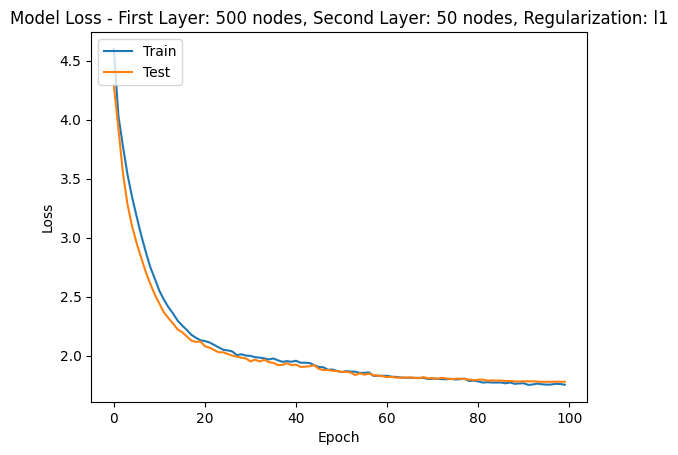

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l2 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1313 - loss: 3.3132 - val_accuracy: 0.2106 - val_loss: 2.6631 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2092 - loss: 2.6489 - val_accuracy: 0.2292 - val_loss: 2.4062 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2365 - loss: 2.4478 - val_accuracy: 0.2684 - val_loss: 2.2043 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2484 - loss: 2.3165 - val_accuracy: 0.3124 - val_loss: 2.0959 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step accuracy: 0.2590 - loss: 2.2555 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2625, Train Precision = 0.3519, Train Recall = 0.3320, Train MSE = 5.8934, Train R² = 0.6000, Val Accuracy = 0.3173, Val Precision = 0.3928, Val Recall = 0.3173, Val MSE = 6.6327, Val R² = 0.5499
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

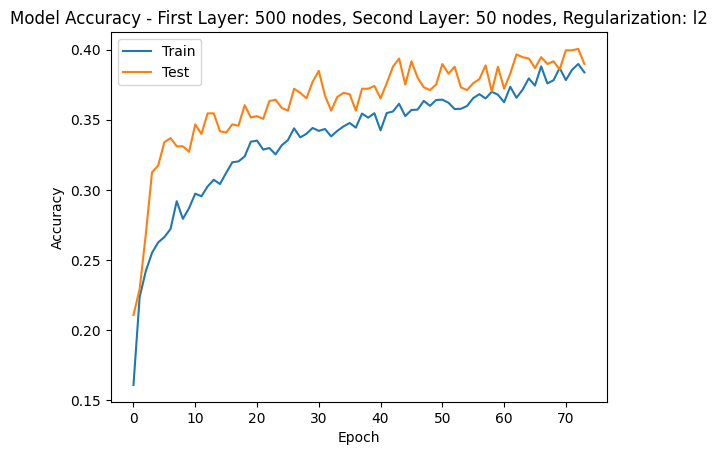

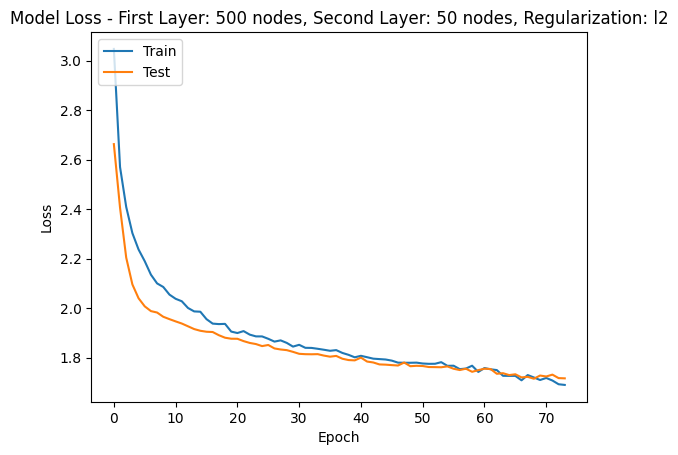

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l1 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1140 - loss: 11.1443 - val_accuracy: 0.1841 - val_loss: 9.0348 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2016 - loss: 8.6322 - val_accuracy: 0.2253 - val_loss: 7.0649 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2358 - loss: 6.6387 - val_accuracy: 0.2801 - val_loss: 5.4090 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2467 - loss: 5.1433 - val_accuracy: 0.2899 - val_loss: 4.2369 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step accuracy: 0.2645 - loss: 4.0833 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2593, Train Precision = 0.3915, Train Recall = 0.2851, Train MSE = 6.6603, Train R² = 0.5479, Val Accuracy = 0.2831, Val Precision = 0.3958, Val Recall = 0.2831, Val MSE = 7.3222, Val R² = 0.5031
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s

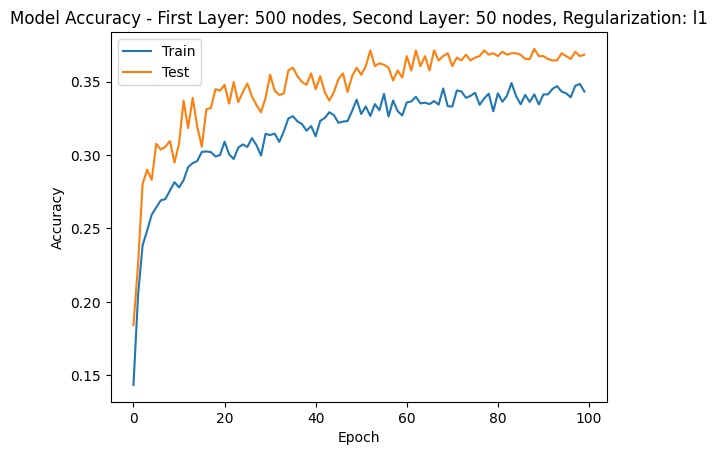

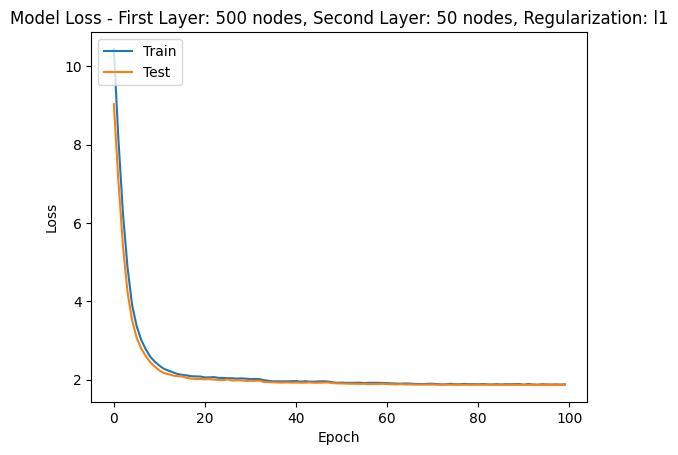

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l2 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1188 - loss: 3.8076 - val_accuracy: 0.2302 - val_loss: 3.1581 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2091 - loss: 3.1520 - val_accuracy: 0.2625 - val_loss: 2.8676 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2161 - loss: 2.9254 - val_accuracy: 0.2987 - val_loss: 2.6239 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2448 - loss: 2.7258 - val_accuracy: 0.3026 - val_loss: 2.4665 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step accuracy: 0.2544 - loss: 2.6104 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2656, Train Precision = 0.3743, Train Recall = 0.3299, Train MSE = 6.3575, Train R² = 0.5685, Val Accuracy = 0.3242, Val Precision = 0.4036, Val Recall = 0.3242, Val MSE = 6.8746, Val R² = 0.5335
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

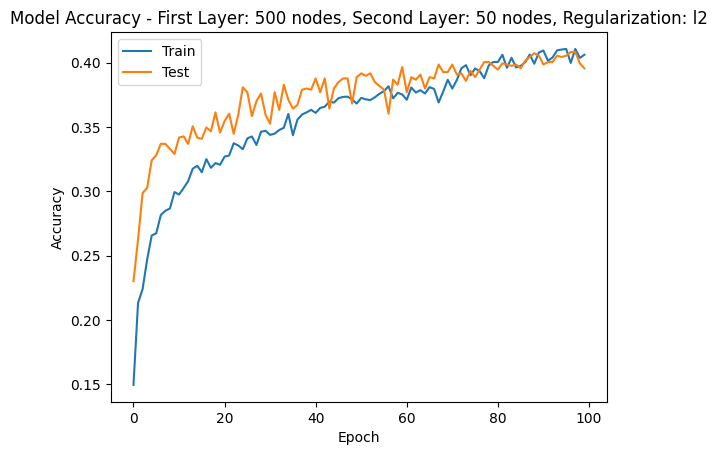

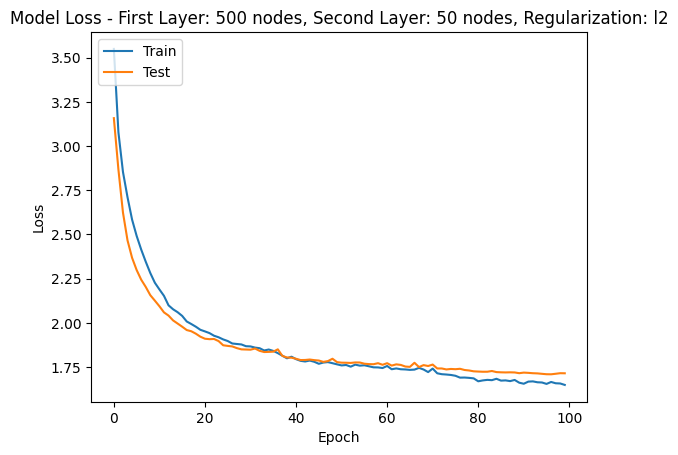

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l1 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1189 - loss: 15.5392 - val_accuracy: 0.1557 - val_loss: 11.6965 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2035 - loss: 10.7121 - val_accuracy: 0.1910 - val_loss: 7.9402 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2240 - loss: 7.2255 - val_accuracy: 0.2018 - val_loss: 5.4057 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2606 - loss: 4.9593 - val_accuracy: 0.2321 - val_loss: 4.0325 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2578 - loss: 3.8216 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2532, Train Precision = 0.3029, Train Recall = 0.2485, Train MSE = 6.9882, Train R² = 0.5257, Val Accuracy = 0.2556, Val Precision = 0.3950, Val Recall = 0.2556, Val MSE = 7.5818, Val R² = 0.4855
128/128 ━━━━━━━━━━━━━━━━━━━━ 

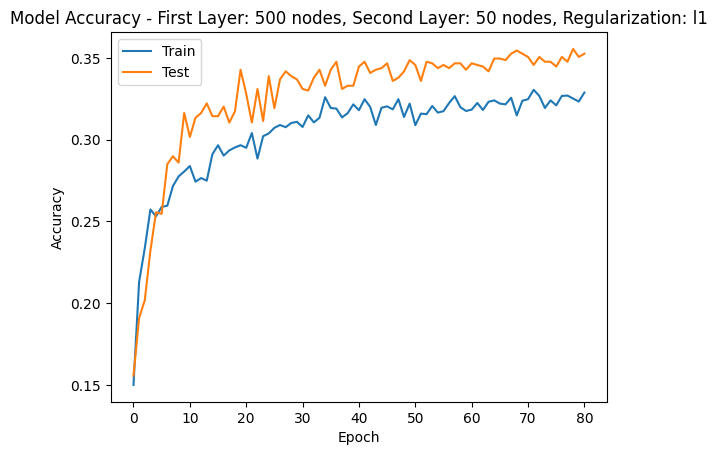

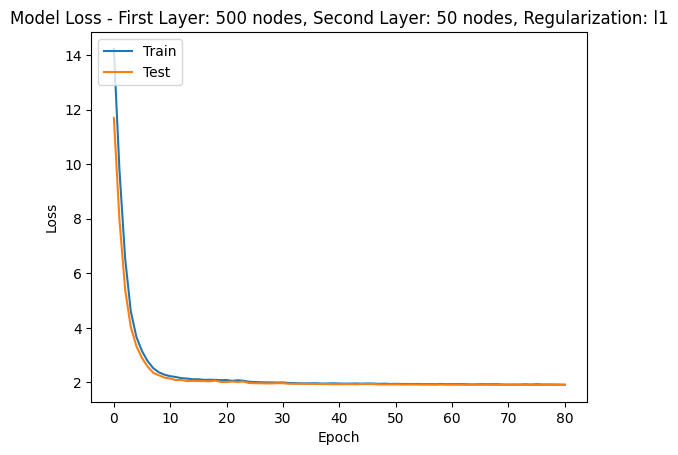

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l2 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1186 - loss: 4.1533 - val_accuracy: 0.2155 - val_loss: 3.4269 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2135 - loss: 3.4161 - val_accuracy: 0.2419 - val_loss: 3.1251 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2369 - loss: 3.1398 - val_accuracy: 0.2664 - val_loss: 2.8335 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2537 - loss: 2.9084 - val_accuracy: 0.2968 - val_loss: 2.6299 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step accuracy: 0.2642 - loss: 2.7579 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2588, Train Precision = 0.3679, Train Recall = 0.3205, Train MSE = 6.1014, Train R² = 0.5859, Val Accuracy = 0.2987, Val Precision = 0.3813, Val Recall = 0.2987, Val MSE = 6.9647, Val R² = 0.5274
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

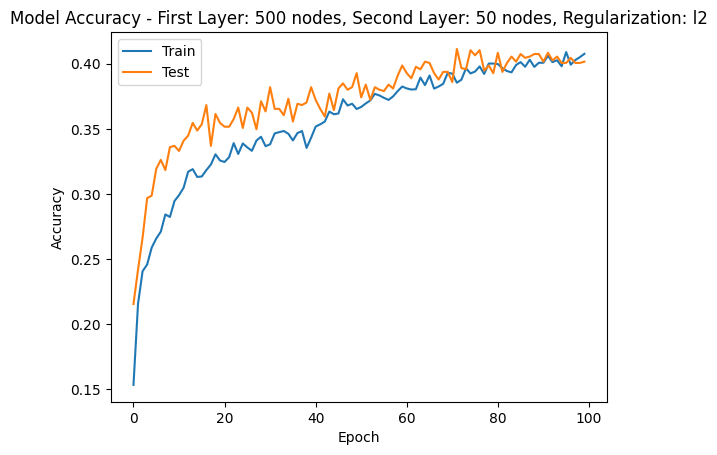

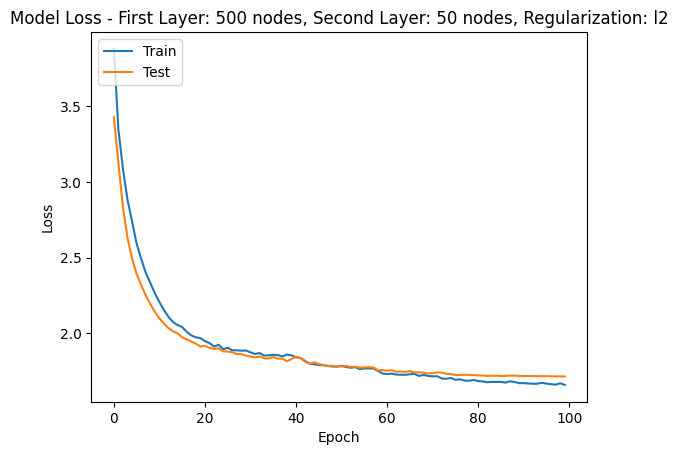

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l1 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1194 - loss: 18.2661 - val_accuracy: 0.1577 - val_loss: 12.9641 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2105 - loss: 11.5577 - val_accuracy: 0.1596 - val_loss: 8.0936 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2466 - loss: 7.1022 - val_accuracy: 0.1587 - val_loss: 5.2357 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2530 - loss: 4.7185 - val_accuracy: 0.1812 - val_loss: 3.9407 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step accuracy: 0.2698 - loss: 3.6149 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2671, Train Precision = 0.3603, Train Recall = 0.2194, Train MSE = 8.1769, Train R² = 0.4450, Val Accuracy = 0.2174, Val Precision = 0.3191, Val Recall = 0.2174, Val MSE = 8.6484, Val R² = 0.4131
128/128 ━━━━━━━━━━━━━━━━━━━━ 

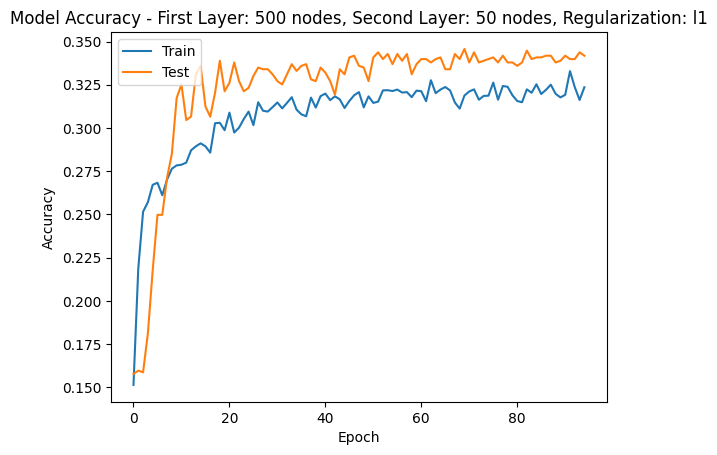

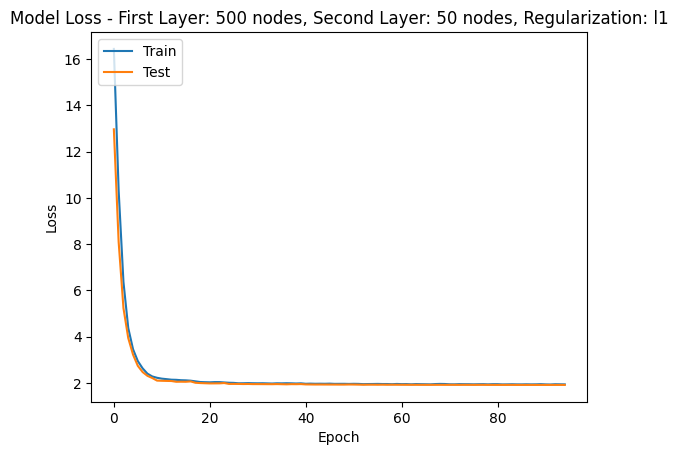

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l2 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1228 - loss: 4.3961 - val_accuracy: 0.1724 - val_loss: 3.7014 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2017 - loss: 3.6195 - val_accuracy: 0.2458 - val_loss: 3.3203 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2374 - loss: 3.2401 - val_accuracy: 0.2791 - val_loss: 2.9778 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2523 - loss: 3.0300 - val_accuracy: 0.2919 - val_loss: 2.7323 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step accuracy: 0.2737 - loss: 2.8265 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2656, Train Precision = 0.3601, Train Recall = 0.3263, Train MSE = 5.8568, Train R² = 0.6025, Val Accuracy = 0.3017, Val Precision = 0.3642, Val Recall = 0.3017, Val MSE = 6.8208, Val R² = 0.5371
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

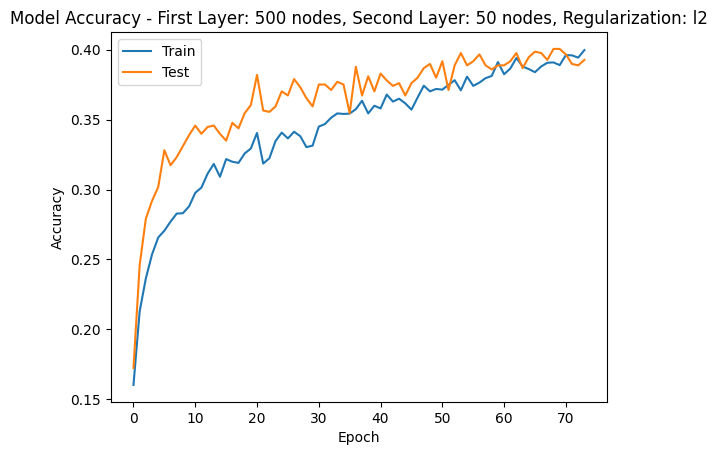

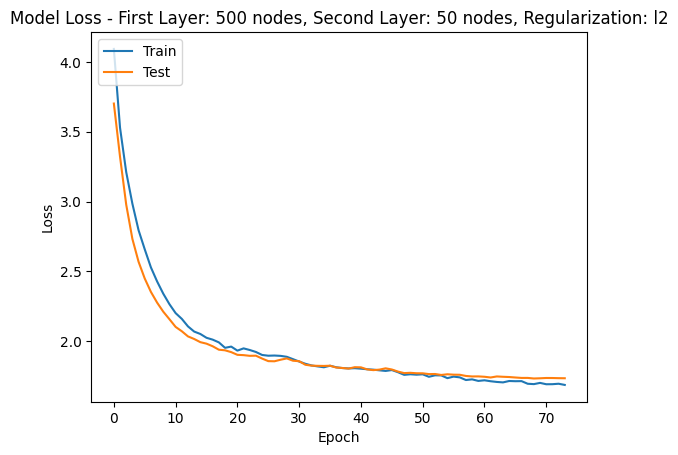

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l1 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0840 - loss: 68.8793 - val_accuracy: 0.0764 - val_loss: 26.3601 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1901 - loss: 18.9238 - val_accuracy: 0.1214 - val_loss: 6.3818 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2264 - loss: 4.9446 - val_accuracy: 0.1939 - val_loss: 3.2764 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2451 - loss: 2.6970 - val_accuracy: 0.1596 - val_loss: 2.7767 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step accuracy: 0.2473 - loss: 2.4222 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2421, Train Precision = 0.4659, Train Recall = 0.2129, Train MSE = 8.4769, Train R² = 0.4246, Val Accuracy = 0.2311, Val Precision = 0.4910, Val Recall = 0.2311, Val MSE = 9.0039, Val R² = 0.3890
128/128 ━━━━━━━━━━━━━━━━━━━━ 

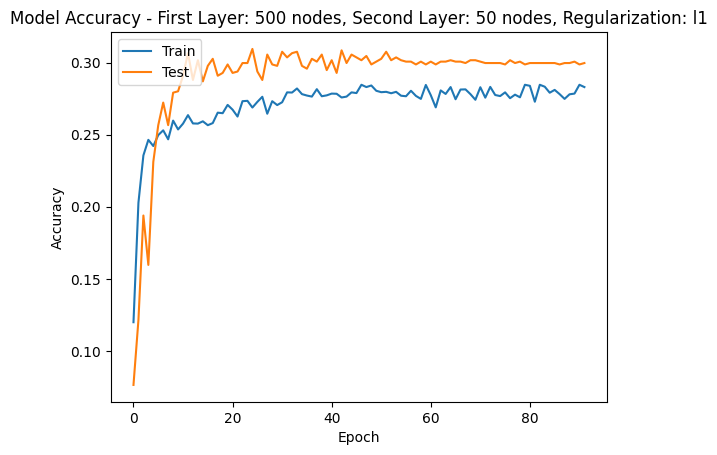

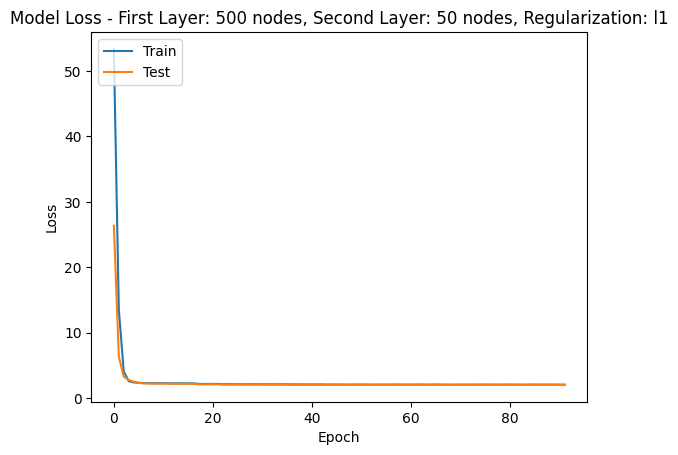

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l2 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1128 - loss: 8.5154 - val_accuracy: 0.1685 - val_loss: 6.2788 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2031 - loss: 5.7550 - val_accuracy: 0.2086 - val_loss: 4.6563 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2324 - loss: 4.2649 - val_accuracy: 0.2419 - val_loss: 3.5966 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2467 - loss: 3.4063 - val_accuracy: 0.2733 - val_loss: 2.9433 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step accuracy: 0.2743 - loss: 2.8808 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2719, Train Precision = 0.3856, Train Recall = 0.3026, Train MSE = 5.6448, Train R² = 0.6169, Val Accuracy = 0.2909, Val Precision = 0.3659, Val Recall = 0.2909, Val MSE = 6.3320, Val R² = 0.5703
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

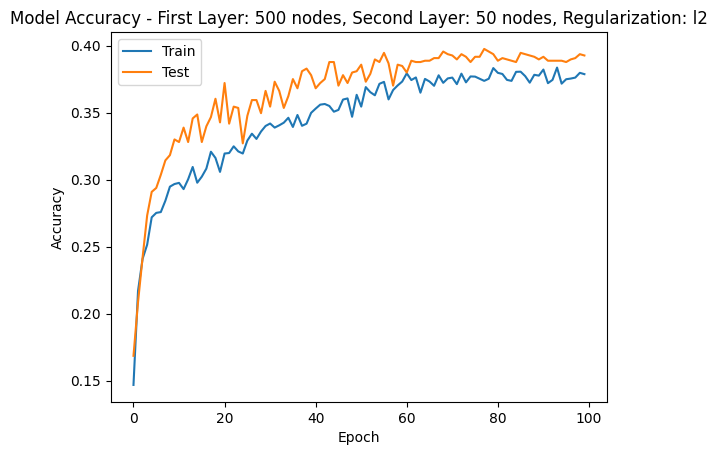

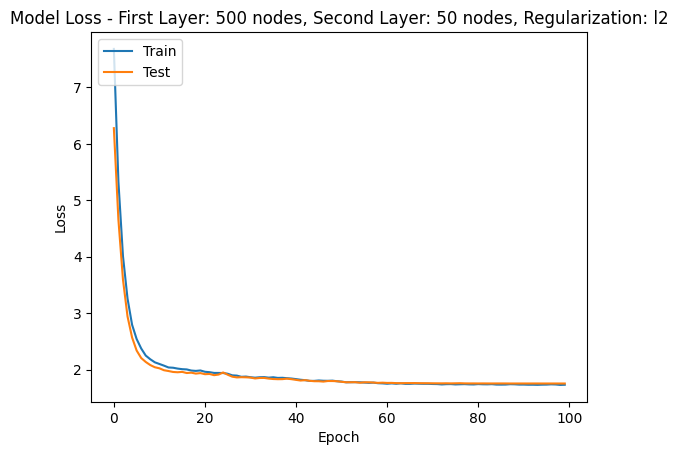

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l1 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0900 - loss: 127.9539 - val_accuracy: 0.1371 - val_loss: 36.3004 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1868 - loss: 22.6814 - val_accuracy: 0.1342 - val_loss: 4.2810 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2367 - loss: 3.2282 - val_accuracy: 0.1342 - val_loss: 2.9868 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2336 - loss: 2.5771 - val_accuracy: 0.1361 - val_loss: 2.8242 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step accuracy: 0.2382 - loss: 2.5319 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2426, Train Precision = 0.4617, Train Recall = 0.1988, Train MSE = 10.0251, Train R² = 0.3196, Val Accuracy = 0.1959, Val Precision = 0.4252, Val Recall = 0.1959, Val MSE = 10.3712, Val R² = 0.2962
128/128 ━━━━━━━━━━━━━━━━━━

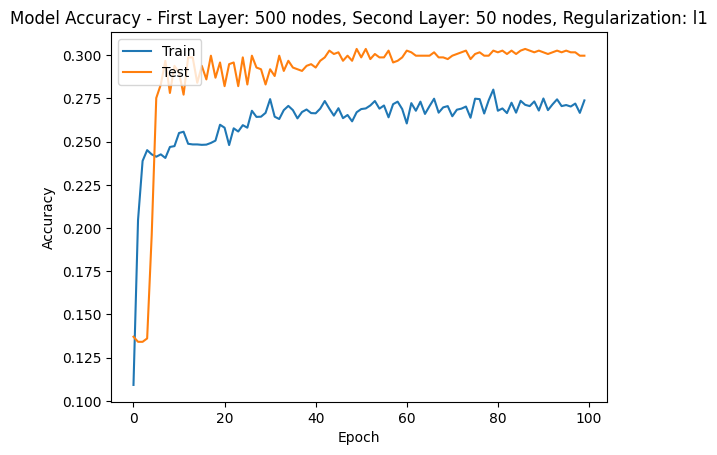

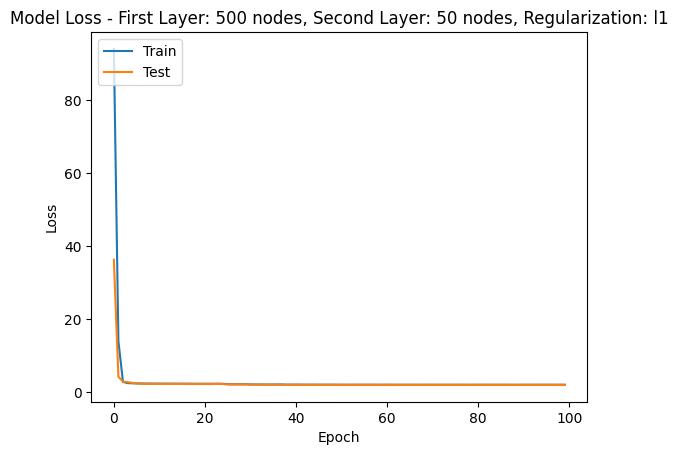

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l2 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.1099 - loss: 13.0789 - val_accuracy: 0.2086 - val_loss: 7.8123 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2017 - loss: 6.8368 - val_accuracy: 0.1978 - val_loss: 4.7842 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2353 - loss: 4.2663 - val_accuracy: 0.2067 - val_loss: 3.4635 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2498 - loss: 3.1780 - val_accuracy: 0.2693 - val_loss: 2.7740 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2638 - loss: 2.6761 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Epoch 5: Train Accuracy = 0.2614, Train Precision = 0.3322, Train Recall = 0.2588, Train MSE = 6.5995, Train R² = 0.5521, Val Accuracy = 0.2409, Val Precision = 0.4150, Val Recall = 0.2409, Val MSE = 7.1361, Val R² = 0.5157
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s

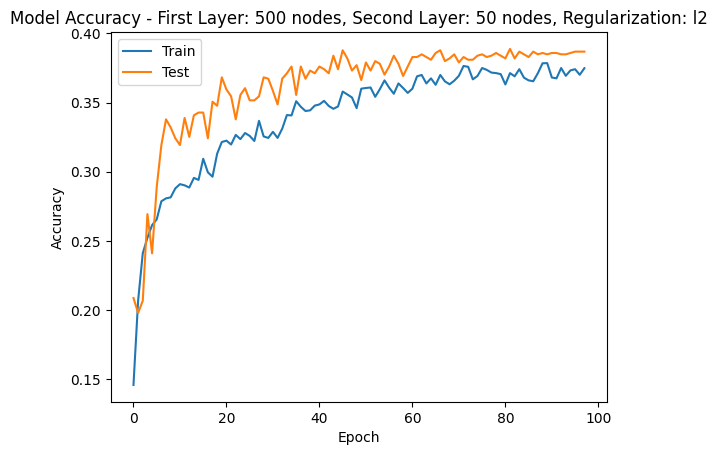

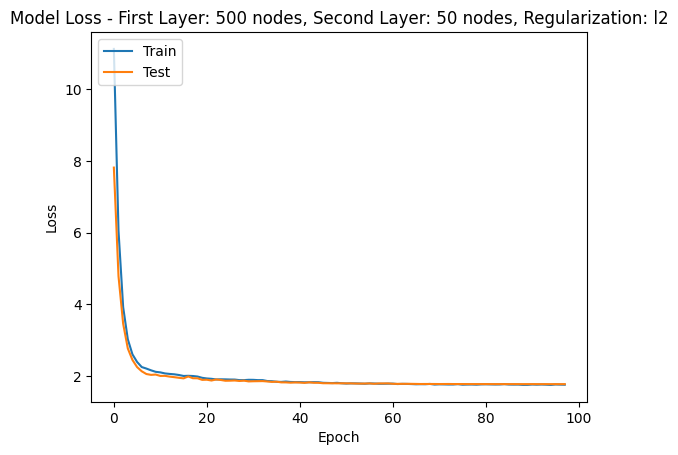

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l1 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1462 - loss: 6.0253 - val_accuracy: 0.2292 - val_loss: 5.1389 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2211 - loss: 5.1185 - val_accuracy: 0.2537 - val_loss: 4.6933 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2460 - loss: 4.6866 - val_accuracy: 0.2635 - val_loss: 4.2955 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2580 - loss: 4.3371 - val_accuracy: 0.2860 - val_loss: 3.9507 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2785 - loss: 4.0110 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2759, Train Precision = 0.3684, Train Recall = 0.3330, Train MSE = 5.7909, Train R² = 0.6070, Val Accuracy = 0.2997, Val Precision = 0.3540, Val Recall = 0.2997, Val MSE = 6.6092, Val R² = 0.5515
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

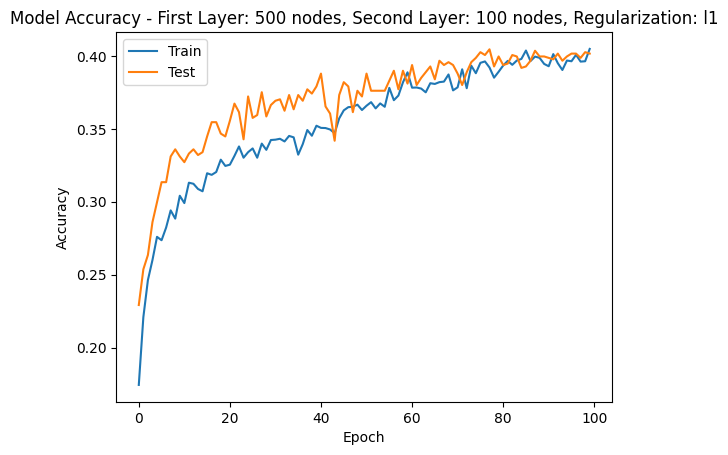

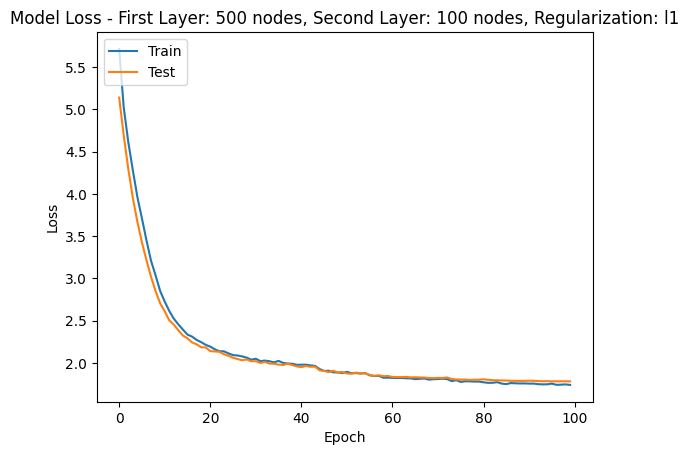

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l2 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1267 - loss: 3.4845 - val_accuracy: 0.1851 - val_loss: 2.7681 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2200 - loss: 2.7289 - val_accuracy: 0.2419 - val_loss: 2.4655 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2365 - loss: 2.5311 - val_accuracy: 0.2909 - val_loss: 2.2461 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2586 - loss: 2.3987 - val_accuracy: 0.3124 - val_loss: 2.1478 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2618 - loss: 2.3059 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2677, Train Precision = 0.3710, Train Recall = 0.3449, Train MSE = 5.9606, Train R² = 0.5954, Val Accuracy = 0.3310, Val Precision = 0.3716, Val Recall = 0.3310, Val MSE = 6.9040, Val R² = 0.5315
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3334 - loss: 1.9728 - val_accuracy: 0.3546 - val_loss: 1.9392 - learning_rate: 5.0000e-04
Epoch 17/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3200 - loss: 1.9854 - val_accuracy: 0.3448 - val_loss: 1.9356 - learning_rate: 5.0000e-04
Epoch 18/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3356 - loss: 1.9502 - val_accuracy: 0.3604 - val_loss: 1.9225 - learning_rate: 5.0000e-04
Epoch 19/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3349 - loss: 1.9291 - val_accuracy: 0.3546 - val_loss: 1.9219 - learning_rate: 5.0000e-04
Epoch 20/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step accuracy: 0.3368 - loss: 1.9351 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 20: Train Accuracy = 0.3331, Train Precision = 0.3815, Train Recall = 0.3889, Train MSE = 4.4506, Train R² = 0.6979, Val Accuracy = 0.3477, Val Precision = 0.3981, Val Recall = 0.3477, Val MSE = 5.6063, Val R² = 0.6196
128/128 ━━━━━━━━━━━━━━━━━━━

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3233 - loss: 1.9464 - val_accuracy: 0.3595 - val_loss: 1.8998 - learning_rate: 5.0000e-04
Epoch 22/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3374 - loss: 1.8916 - val_accuracy: 0.3673 - val_loss: 1.8931 - learning_rate: 5.0000e-04
Epoch 23/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3529 - loss: 1.9058 - val_accuracy: 0.3438 - val_loss: 1.8945 - learning_rate: 5.0000e-04
Epoch 24/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3297 - loss: 1.9110 - val_accuracy: 0.3555 - val_loss: 1.8830 - learning_rate: 5.0000e-04
Epoch 25/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step accuracy: 0.3499 - loss: 1.8925 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 25: Train Accuracy = 0.3445, Train Precision = 0.4168, Train Recall = 0.3908, Train MSE = 4.5304, Train R² = 0.6925, Val Accuracy = 0.3692, Val Precision = 0.4007, Val Recall = 0.3692, Val MSE = 5.5671, Val R² = 0.6222
128/128 ━━━━━━━━━━━━━━━━━━━

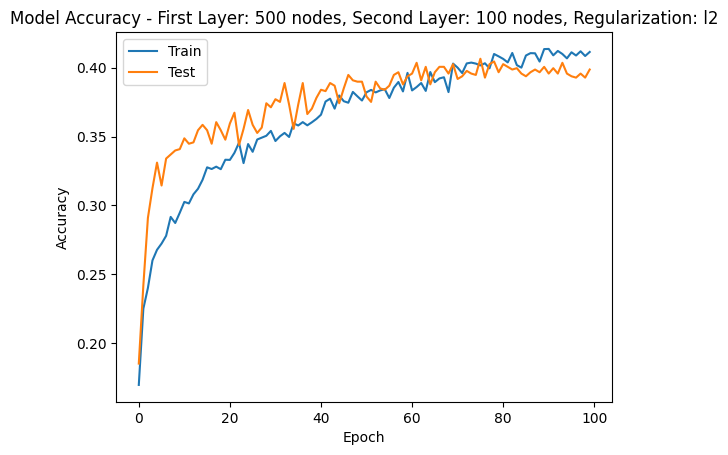

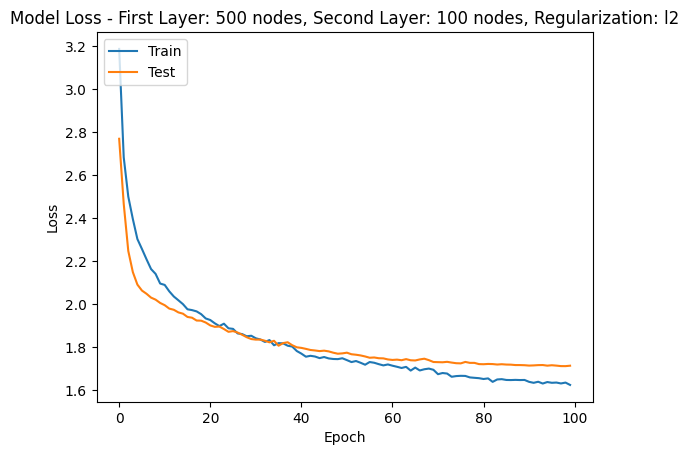

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l1 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1136 - loss: 16.6442 - val_accuracy: 0.1596 - val_loss: 12.8687 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2101 - loss: 11.8592 - val_accuracy: 0.1851 - val_loss: 9.1769 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2415 - loss: 8.3448 - val_accuracy: 0.2214 - val_loss: 6.4007 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2580 - loss: 5.9147 - val_accuracy: 0.2674 - val_loss: 4.7377 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2664 - loss: 4.5015 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2716, Train Precision = 0.3386, Train Recall = 0.2911, Train MSE = 6.3874, Train R² = 0.5665, Val Accuracy = 0.2811, Val Precision = 0.4013, Val Recall = 0.2811, Val MSE = 7.2723, Val R² = 0.5065
128/128 ━━━━━━━━━━━━━━━━━━━━ 

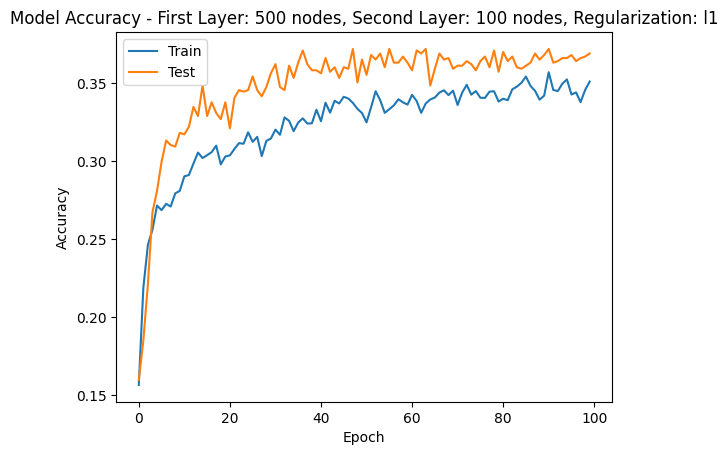

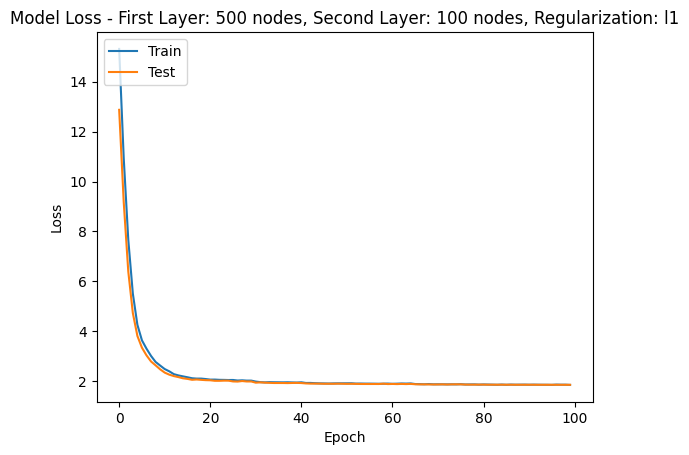

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l2 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.1259 - loss: 4.3005 - val_accuracy: 0.2262 - val_loss: 3.4432 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2083 - loss: 3.4738 - val_accuracy: 0.2527 - val_loss: 3.1288 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2394 - loss: 3.2007 - val_accuracy: 0.2762 - val_loss: 2.8657 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2421 - loss: 3.0115 - val_accuracy: 0.2987 - val_loss: 2.6802 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2557 - loss: 2.8813 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Epoch 5: Train Accuracy = 0.2557, Train Precision = 0.3813, Train Recall = 0.3358, Train MSE = 5.8895, Train R² = 0.6003, Val Accuracy = 0.3173, Val Precision = 0.3601, Val Recall = 0.3173, Val MSE = 6.5730, Val R² = 0.5540
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s

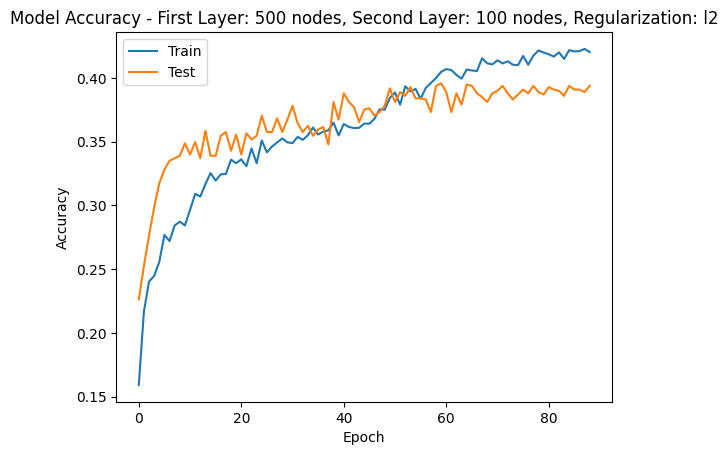

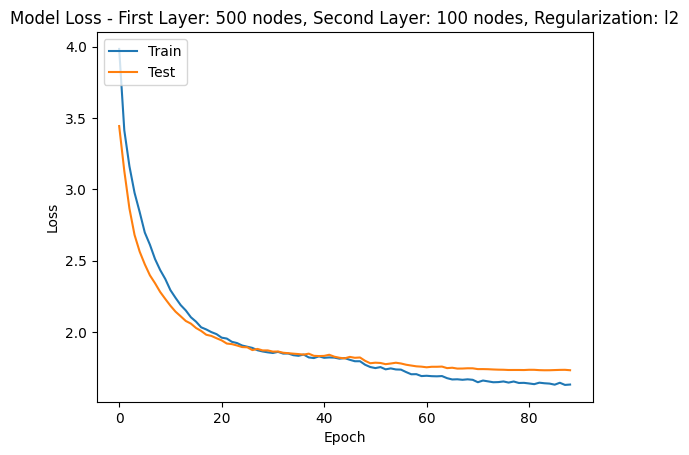

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l1 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1232 - loss: 23.7913 - val_accuracy: 0.2037 - val_loss: 16.4036 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2161 - loss: 14.5155 - val_accuracy: 0.2458 - val_loss: 9.6510 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2395 - loss: 8.4722 - val_accuracy: 0.2439 - val_loss: 5.9914 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2526 - loss: 5.4420 - val_accuracy: 0.2302 - val_loss: 4.4734 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2450 - loss: 4.3059 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2555, Train Precision = 0.3485, Train Recall = 0.2576, Train MSE = 7.1546, Train R² = 0.5144, Val Accuracy = 0.2625, Val Precision = 0.3866, Val Recall = 0.2625, Val MSE = 7.6082, Val R² = 0.4837
128/128 ━━━━━━━━━━━━━━━━━━━━ 

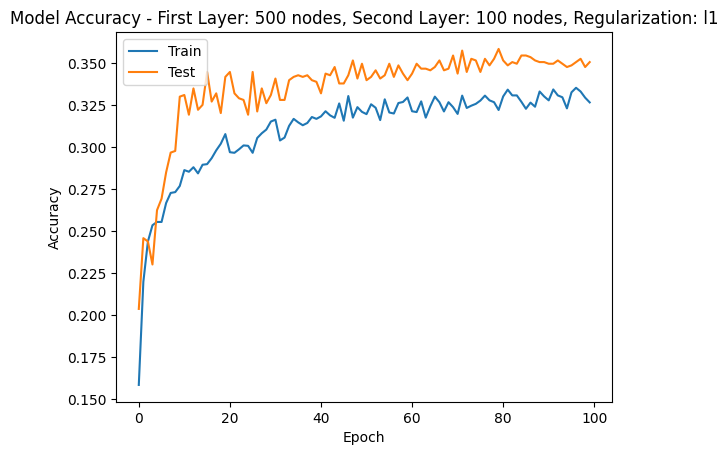

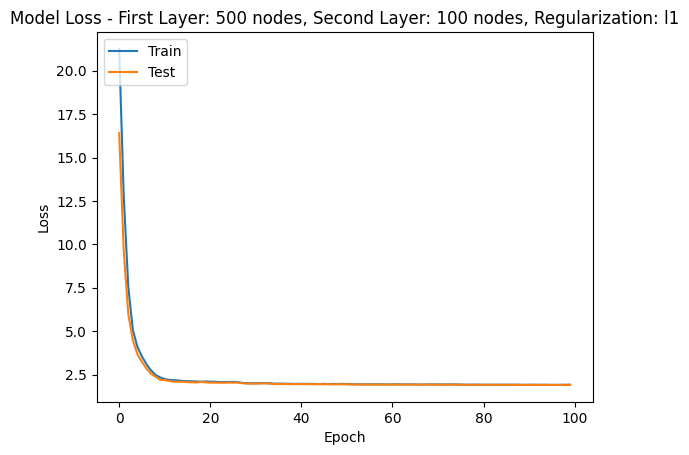

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l2 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1229 - loss: 4.8291 - val_accuracy: 0.1459 - val_loss: 4.0786 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2043 - loss: 3.9704 - val_accuracy: 0.2106 - val_loss: 3.6283 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2474 - loss: 3.5413 - val_accuracy: 0.2889 - val_loss: 3.2147 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2534 - loss: 3.2663 - val_accuracy: 0.2987 - val_loss: 2.9230 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2743 - loss: 3.0328 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2693, Train Precision = 0.3547, Train Recall = 0.3455, Train MSE = 5.7143, Train R² = 0.6122, Val Accuracy = 0.3252, Val Precision = 0.3207, Val Recall = 0.3252, Val MSE = 6.3634, Val R² = 0.5682
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

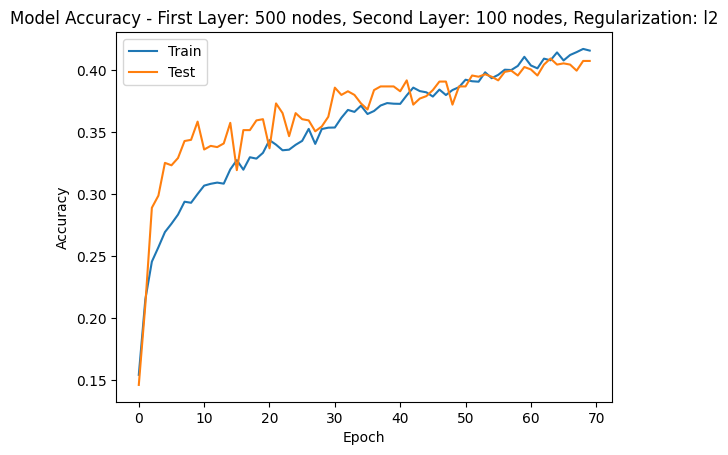

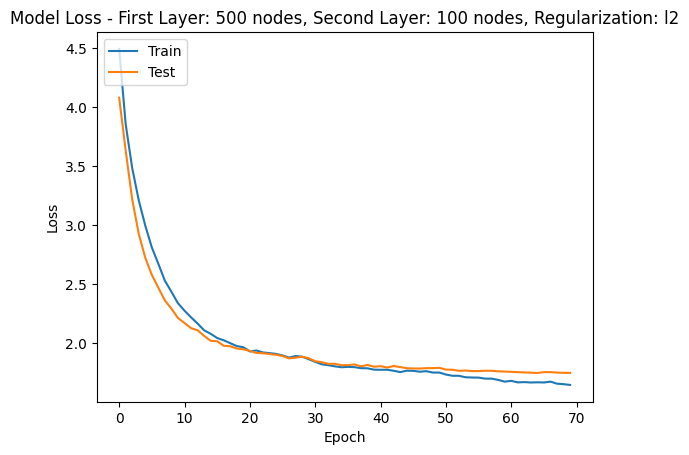

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l1 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1362 - loss: 28.2659 - val_accuracy: 0.2165 - val_loss: 18.0371 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2220 - loss: 15.4869 - val_accuracy: 0.1675 - val_loss: 9.5382 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2362 - loss: 8.1494 - val_accuracy: 0.1694 - val_loss: 5.7150 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2621 - loss: 5.1469 - val_accuracy: 0.2076 - val_loss: 4.3387 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2622 - loss: 4.1101 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2600, Train Precision = 0.3227, Train Recall = 0.2469, Train MSE = 6.9273, Train R² = 0.5298, Val Accuracy = 0.2449, Val Precision = 0.3946, Val Recall = 0.2449, Val MSE = 7.2517, Val R² = 0.5079
128/128 ━━━━━━━━━━━━━━━━━━━━ 

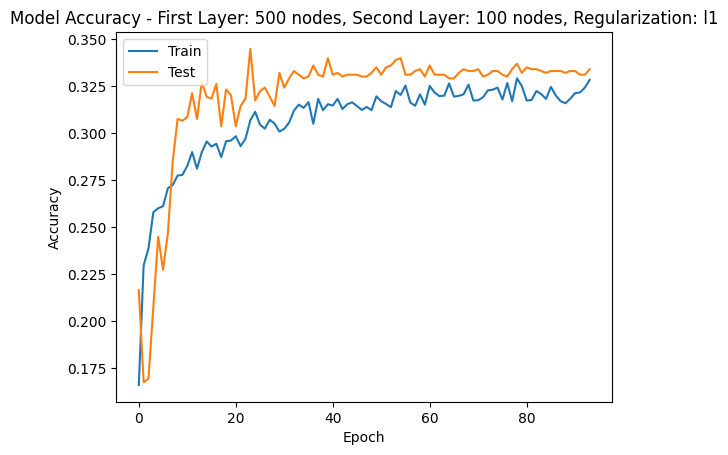

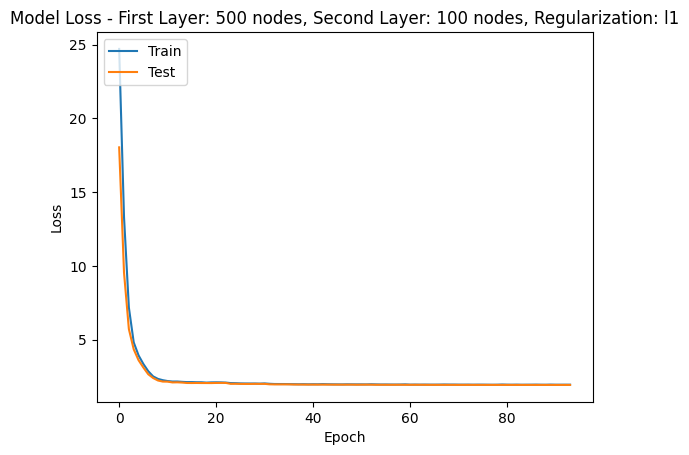

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l2 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1303 - loss: 5.1475 - val_accuracy: 0.2165 - val_loss: 4.2111 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2066 - loss: 4.1665 - val_accuracy: 0.2478 - val_loss: 3.7093 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2450 - loss: 3.7067 - val_accuracy: 0.2742 - val_loss: 3.2929 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.2513 - loss: 3.3824 - val_accuracy: 0.2987 - val_loss: 2.9999 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2656 - loss: 3.1166 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Epoch 5: Train Accuracy = 0.2675, Train Precision = 0.3441, Train Recall = 0.3432, Train MSE = 5.6509, Train R² = 0.6165, Val Accuracy = 0.3310, Val Precision = 0.4048, Val Recall = 0.3310, Val MSE = 6.6102, Val R² = 0.5514
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 

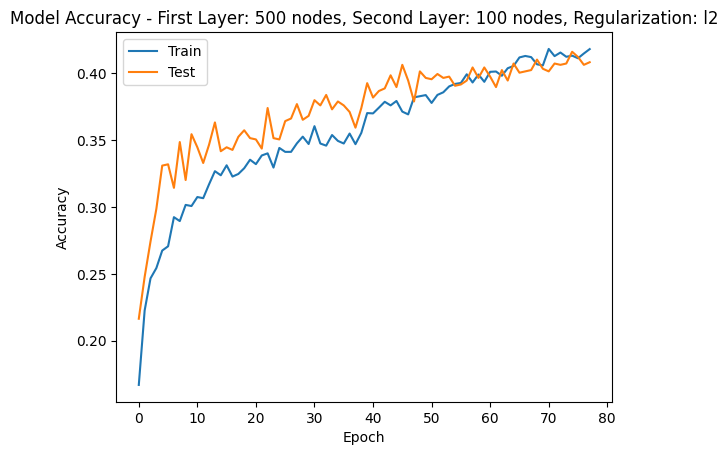

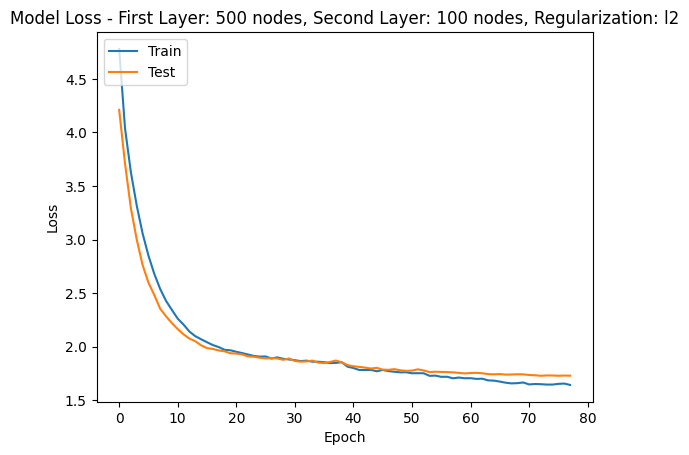

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l1 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.0987 - loss: 111.4414 - val_accuracy: 0.1655 - val_loss: 34.7116 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2073 - loss: 23.4199 - val_accuracy: 0.1352 - val_loss: 7.4916 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2407 - loss: 5.8360 - val_accuracy: 0.1342 - val_loss: 3.3641 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2590 - loss: 2.7341 - val_accuracy: 0.1410 - val_loss: 2.8240 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2501 - loss: 2.4604 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2465, Train Precision = 0.4042, Train Recall = 0.1900, Train MSE = 10.6592, Train R² = 0.2765, Val Accuracy = 0.1939, Val Precision = 0.5056, Val Recall = 0.1939, Val MSE = 11.1959, Val R² = 0.2403
128/128 ━━━━━━━━━━━━━━━━━━

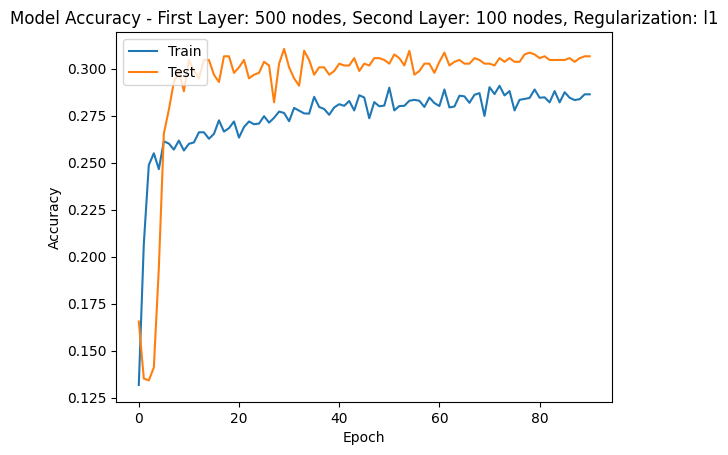

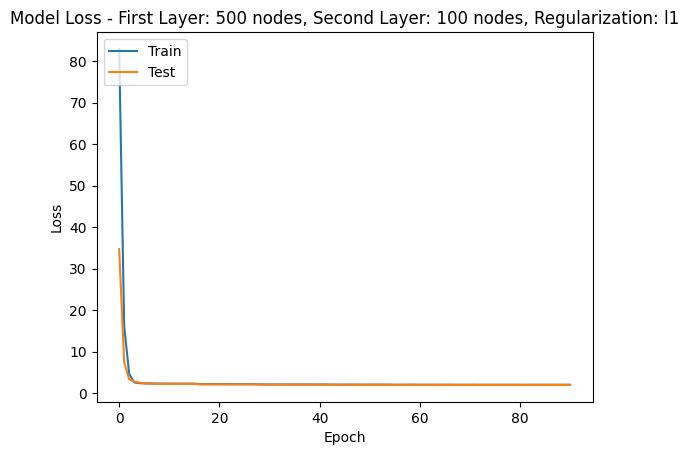

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l2 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1345 - loss: 11.6228 - val_accuracy: 0.1822 - val_loss: 7.9166 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2267 - loss: 7.1221 - val_accuracy: 0.2076 - val_loss: 5.3043 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2338 - loss: 4.8573 - val_accuracy: 0.2243 - val_loss: 3.8634 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2740 - loss: 3.6168 - val_accuracy: 0.2605 - val_loss: 3.0922 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2684 - loss: 3.0416 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2666, Train Precision = 0.3897, Train Recall = 0.3105, Train MSE = 5.7400, Train R² = 0.6104, Val Accuracy = 0.2977, Val Precision = 0.3682, Val Recall = 0.2977, Val MSE = 6.6347, Val R² = 0.5498
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s

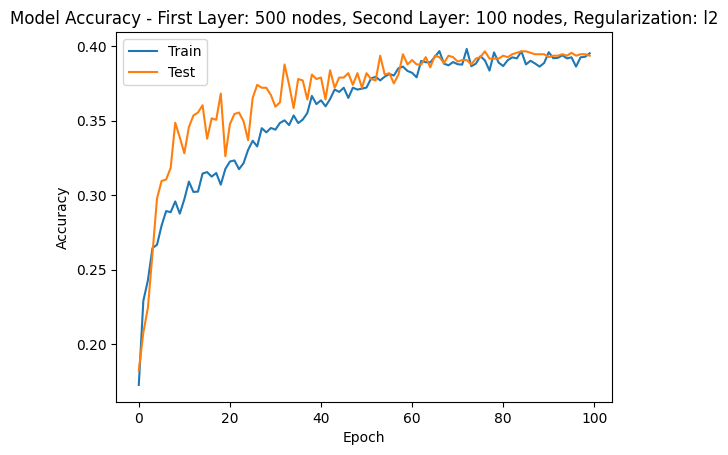

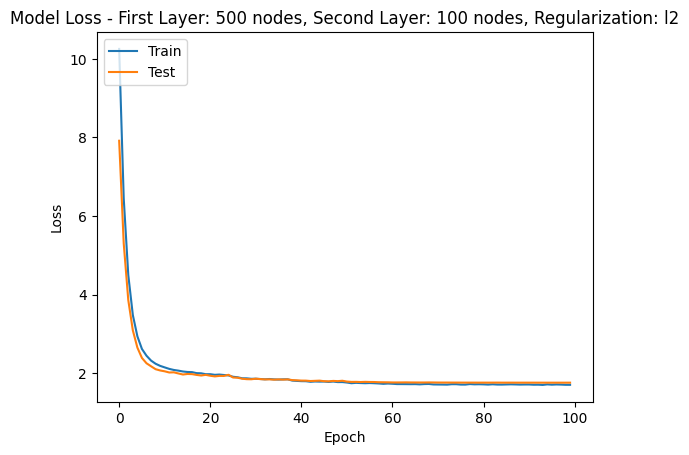

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l1 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.0840 - loss: 215.6647 - val_accuracy: 0.1665 - val_loss: 51.9047 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2069 - loss: 30.3280 - val_accuracy: 0.1528 - val_loss: 4.7299 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2326 - loss: 3.5278 - val_accuracy: 0.1342 - val_loss: 3.1117 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2483 - loss: 2.6987 - val_accuracy: 0.1371 - val_loss: 2.9604 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2290 - loss: 2.6585 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2350, Train Precision = 0.4940, Train Recall = 0.2039, Train MSE = 9.7500, Train R² = 0.3382, Val Accuracy = 0.2184, Val Precision = 0.5114, Val Recall = 0.2184, Val MSE = 10.0911, Val R² = 0.3152
128/128 ━━━━━━━━━━━━━━━━━━━

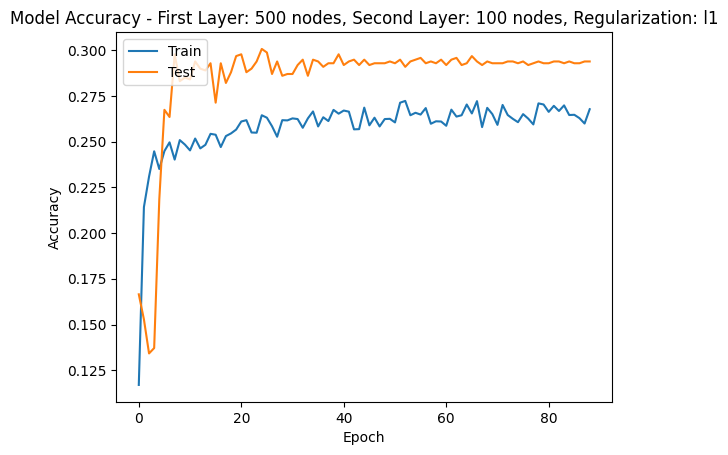

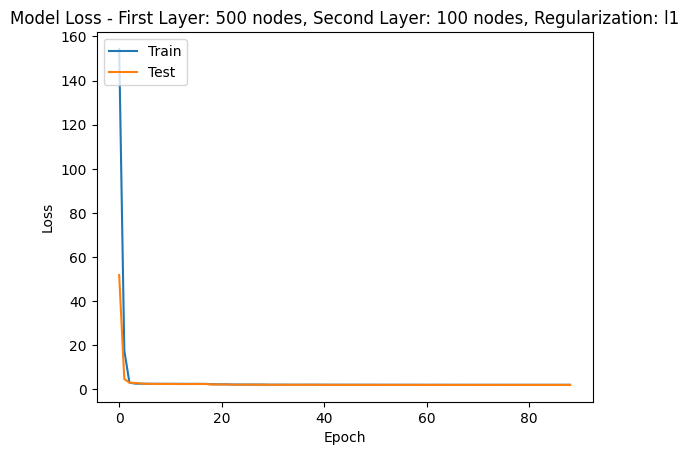

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l2 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.1281 - loss: 18.7971 - val_accuracy: 0.1616 - val_loss: 9.8612 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2471 - loss: 8.3154 - val_accuracy: 0.1606 - val_loss: 5.3396 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2563 - loss: 4.6446 - val_accuracy: 0.1704 - val_loss: 3.6323 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2565 - loss: 3.3088 - val_accuracy: 0.2057 - val_loss: 2.8883 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2805 - loss: 2.7396 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Epoch 5: Train Accuracy = 0.2794, Train Precision = 0.3484, Train Recall = 0.2639, Train MSE = 6.4105, Train R² = 0.5649, Val Accuracy = 0.2400, Val Precision = 0.3321, Val Recall = 0.2400, Val MSE = 7.1322, Val R² = 0.5160
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s

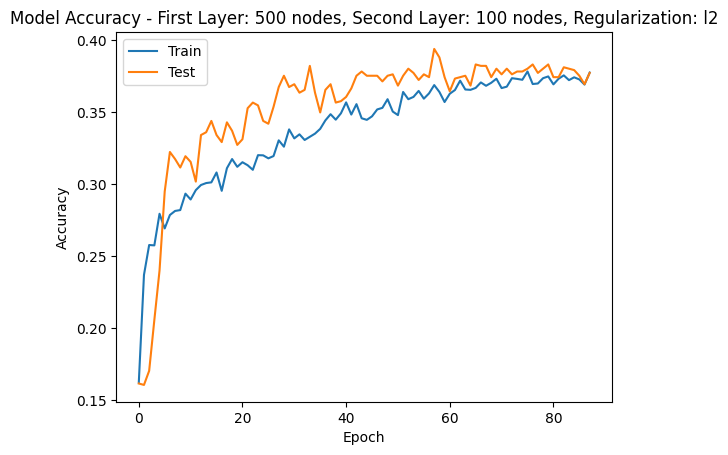

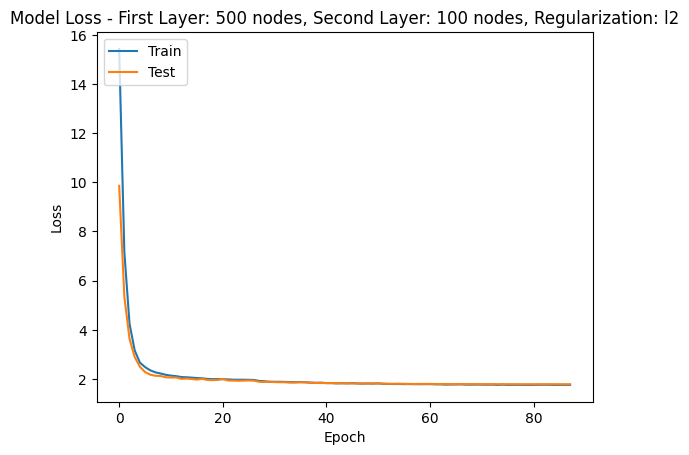


Best model found with first layer: 200 nodes, second layer: 100 nodes, regularization: l2 = 0.01
Best Test Accuracy: 0.4133
      Epoch  First Layer Nodes  Second Layer Nodes Regularization Type  \
0         5                 50                  50                  l1   
1        10                 50                  50                  l1   
2        15                 50                  50                  l1   
3        20                 50                  50                  l1   
4        25                 50                  50                  l1   
...     ...                ...                 ...                 ...   
1276     65                500                 100                  l2   
1277     70                500                 100                  l2   
1278     75                500                 100                  l2   
1279     80                500                 100                  l2   
1280     85                500                 100           

In [28]:
from tensorflow.keras import regularizers
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, Callback
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_score, recall_score, mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

first_layer_nodes = [50, 200, 500]
second_layer_nodes = [50, 100]
regularization_values = [0.001, 0.005, 0.008, 0.01, 0.05, 0.1]
best_accuracy = 0
best_params = None
results = []

model_results = []

class PrintEpochs(Callback):
    def __init__(self, interval=5):
        super().__init__()
        self.interval = interval

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.interval == 0:
            y_train_pred = np.argmax(self.model.predict(X_train_scaled), axis=1)
            y_val_pred = np.argmax(self.model.predict(X_test_scaled), axis=1)

            train_precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=1)
            train_recall = recall_score(y_train, y_train_pred, average='weighted')
            val_precision = precision_score(y_test, y_val_pred, average='weighted', zero_division=1)
            val_recall = recall_score(y_test, y_val_pred, average='weighted')

            train_mse = mean_squared_error(y_train, y_train_pred)
            val_mse = mean_squared_error(y_test, y_val_pred)
            train_r2 = r2_score(y_train, y_train_pred)
            val_r2 = r2_score(y_test, y_val_pred)

            print(f"Epoch {epoch+1}: "
                  f"Train Accuracy = {logs['accuracy']:.4f}, "
                  f"Train Precision = {train_precision:.4f}, "
                  f"Train Recall = {train_recall:.4f}, "
                  f"Train MSE = {train_mse:.4f}, "
                  f"Train R² = {train_r2:.4f}, "
                  f"Val Accuracy = {logs['val_accuracy']:.4f}, "
                  f"Val Precision = {val_precision:.4f}, "
                  f"Val Recall = {val_recall:.4f}, "
                  f"Val MSE = {val_mse:.4f}, "
                  f"Val R² = {val_r2:.4f}")

            model_results.append({
                'Epoch': epoch + 1,
                'First Layer Nodes': first_layer,
                'Second Layer Nodes': second_layer,
                'Regularization Type': regularization_type,
                'Regularization Value': regularization_value,
                'Train Accuracy': logs['accuracy'],
                'Train Precision': train_precision,
                'Train Recall': train_recall,
                'Train MSE': train_mse,
                'Train R²': train_r2,
                'Val Accuracy': logs['val_accuracy'],
                'Val Precision': val_precision,
                'Val Recall': val_recall,
                'Val MSE': val_mse,
                'Val R²': val_r2
            })

for first_layer in first_layer_nodes:
    for second_layer in second_layer_nodes:
        for regularization_value in regularization_values:
            for regularization_type in ['l1', 'l2']:
                print(f"Testing model with first layer: {first_layer} nodes, second layer: {second_layer} nodes, "
                      f"regularization: {regularization_type} = {regularization_value}...")

                if regularization_type == 'l1':
                    regularizer = regularizers.l1(regularization_value)
                elif regularization_type == 'l2':
                    regularizer = regularizers.l2(regularization_value)

                model = models.Sequential([
                    layers.Dense(first_layer, activation='relu', kernel_regularizer=regularizer, input_shape=(X_train_scaled.shape[1],)),
                    layers.BatchNormalization(),
                    layers.Dropout(0.4),
                    layers.Dense(second_layer, activation='relu', kernel_regularizer=regularizer),
                    layers.BatchNormalization(),
                    layers.Dropout(0.4),
                    layers.Dense(17, activation='softmax')
                ])

                model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                              loss='sparse_categorical_crossentropy',
                              metrics=['accuracy'])
                early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
                reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
                print_epochs = PrintEpochs(interval=5)

                history = model.fit(X_train_scaled, y_train, epochs=100, batch_size=64, validation_data=(X_test_scaled, y_test), 
                                    callbacks=[early_stopping, reduce_lr, print_epochs])

                test_loss, test_accuracy = model.evaluate(X_test_scaled, y_test)
                print(f"Test Accuracy: {test_accuracy:.4f}")
                if test_accuracy > best_accuracy:
                    best_accuracy = test_accuracy
                    best_params = (first_layer, second_layer, regularization_type, regularization_value)

                y_train_pred = np.argmax(model.predict(X_train_scaled), axis=1)
                y_val_pred = np.argmax(model.predict(X_test_scaled), axis=1)

                train_precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=1)
                train_recall = recall_score(y_train, y_train_pred, average='weighted')
                val_precision = precision_score(y_test, y_val_pred, average='weighted', zero_division=1)
                val_recall = recall_score(y_test, y_val_pred, average='weighted')

                train_mse = mean_squared_error(y_train, y_train_pred)
                val_mse = mean_squared_error(y_test, y_val_pred)
                train_r2 = r2_score(y_train, y_train_pred)
                val_r2 = r2_score(y_test, y_val_pred)

                plt.plot(history.history['accuracy'])
                plt.plot(history.history['val_accuracy'])
                plt.title(f'Model Accuracy - First Layer: {first_layer} nodes, Second Layer: {second_layer} nodes, Regularization: {regularization_type}')
                plt.xlabel('Epoch')
                plt.ylabel('Accuracy')
                plt.legend(['Train', 'Test'], loc='upper left')
                plt.show()

                plt.plot(history.history['loss'])
                plt.plot(history.history['val_loss'])
                plt.title(f'Model Loss - First Layer: {first_layer} nodes, Second Layer: {second_layer} nodes, Regularization: {regularization_type}')
                plt.xlabel('Epoch')
                plt.ylabel('Loss')
                plt.legend(['Train', 'Test'], loc='upper left')
                plt.show()

print(f"\nBest model found with first layer: {best_params[0]} nodes, second layer: {best_params[1]} nodes, "
      f"regularization: {best_params[2]} = {best_params[3]}")
print(f"Best Test Accuracy: {best_accuracy:.4f}")

model_results_df = pd.DataFrame(model_results)
print(model_results_df)
model_results_df.to_csv("model_performance_report.csv", index=False)



Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l1 = 0.001...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.0865 - loss: 3.9791 - val_accuracy: 0.1773 - val_loss: 3.0333 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1462 - loss: 3.3440 - val_accuracy: 0.2106 - val_loss: 2.7749 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1856 - loss: 3.0619 - val_accuracy: 0.2292 - val_loss: 2.5969 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1989 - loss: 2.8938 - val_accuracy: 0.2488 - val_loss: 2.4942 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step   accuracy: 0.2410 - loss: 2.6968 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.2394 - loss: 2.6985 - val_accuracy: 0.2713 - val_loss: 2.4299 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2183 - loss: 2.6611 - val_accur

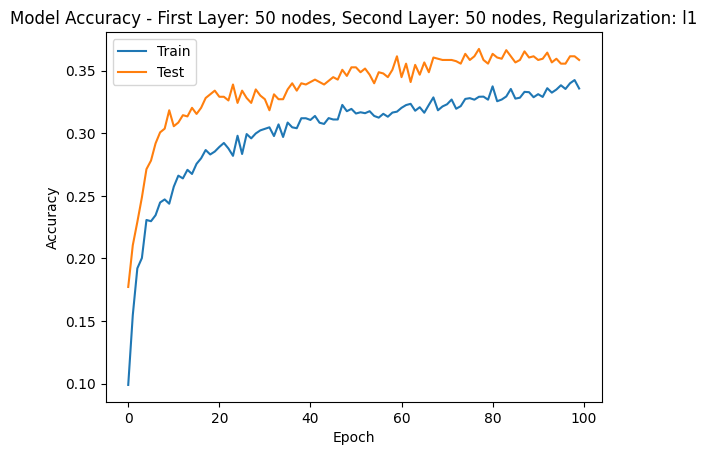

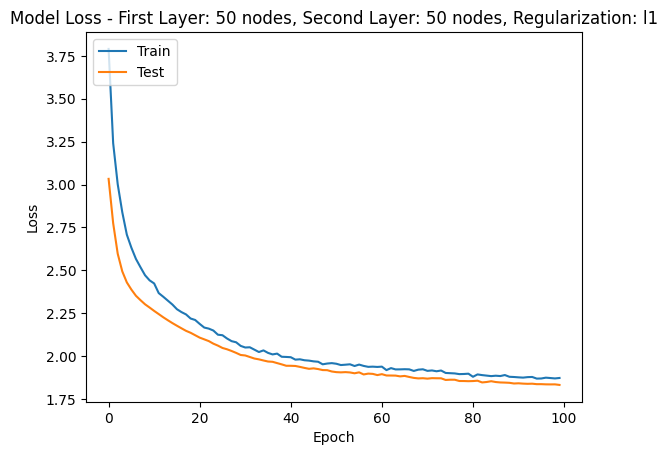

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l2 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.0822 - loss: 3.6616 - val_accuracy: 0.1881 - val_loss: 2.7236 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1484 - loss: 3.0058 - val_accuracy: 0.2233 - val_loss: 2.4680 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1914 - loss: 2.7192 - val_accuracy: 0.2419 - val_loss: 2.2931 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1971 - loss: 2.5630 - val_accuracy: 0.2684 - val_loss: 2.1866 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2195 - loss: 2.4381 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2196 - loss: 2.4372 - val_accuracy: 0.2742 - val_loss: 2.1287 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2384 - loss: 2.3210 - val_accuracy: 0.2752 -

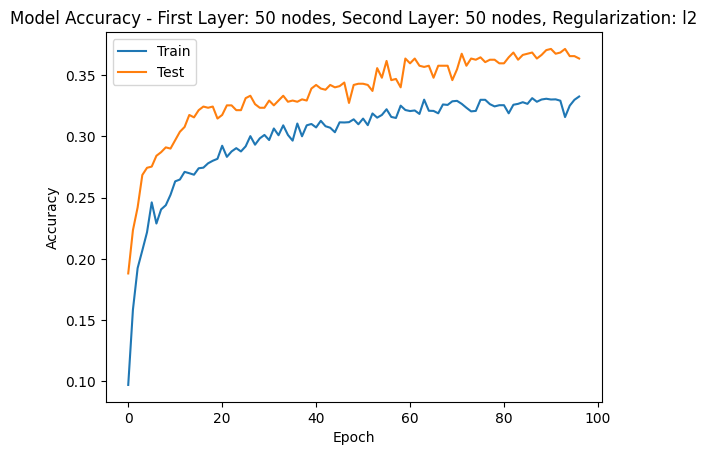

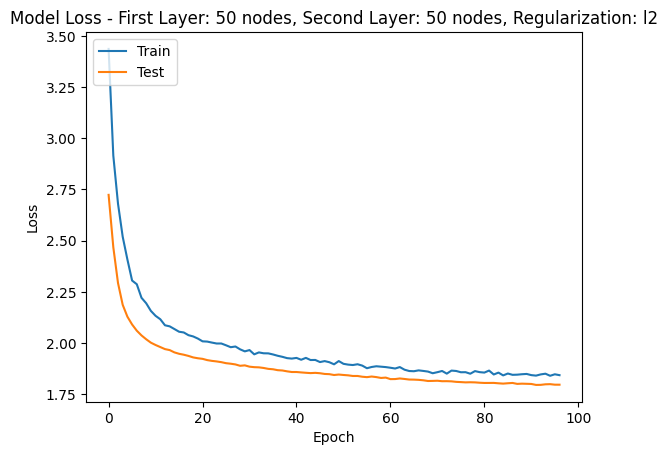

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l1 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0733 - loss: 5.5422 - val_accuracy: 0.1606 - val_loss: 4.5433 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1329 - loss: 4.8601 - val_accuracy: 0.2067 - val_loss: 4.1658 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1777 - loss: 4.3922 - val_accuracy: 0.2468 - val_loss: 3.8494 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2022 - loss: 4.0679 - val_accuracy: 0.2762 - val_loss: 3.5954 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2191 - loss: 3.7969 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2190 - loss: 3.7954 - val_accuracy: 0.2880 - val_loss: 3.3915 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2297 - loss: 3.5732 - val_accuracy: 0.3075 -

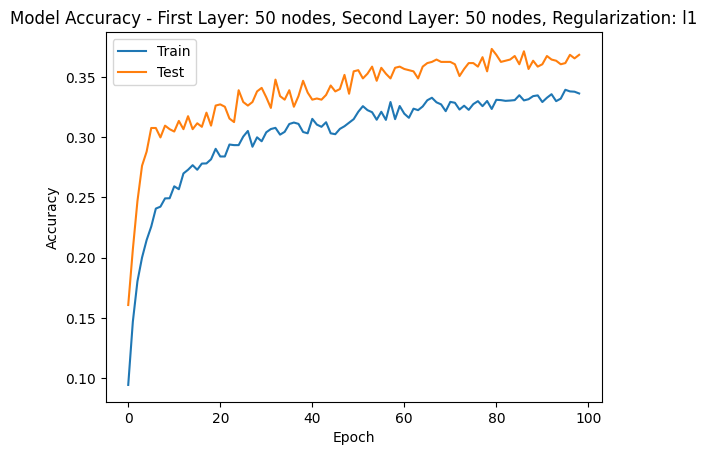

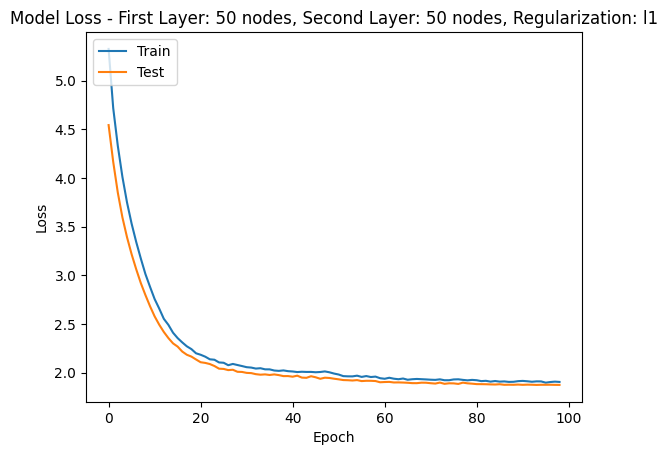

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l2 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0693 - loss: 3.9496 - val_accuracy: 0.1978 - val_loss: 2.9382 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1438 - loss: 3.3106 - val_accuracy: 0.2458 - val_loss: 2.6833 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1818 - loss: 3.0026 - val_accuracy: 0.2703 - val_loss: 2.5232 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1971 - loss: 2.8010 - val_accuracy: 0.2752 - val_loss: 2.4221 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2087 - loss: 2.7141 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2086 - loss: 2.7081 - val_accuracy: 0.2801 - val_loss: 2.3599 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2276 - loss: 2.5725 - val_accuracy: 0.2821 -

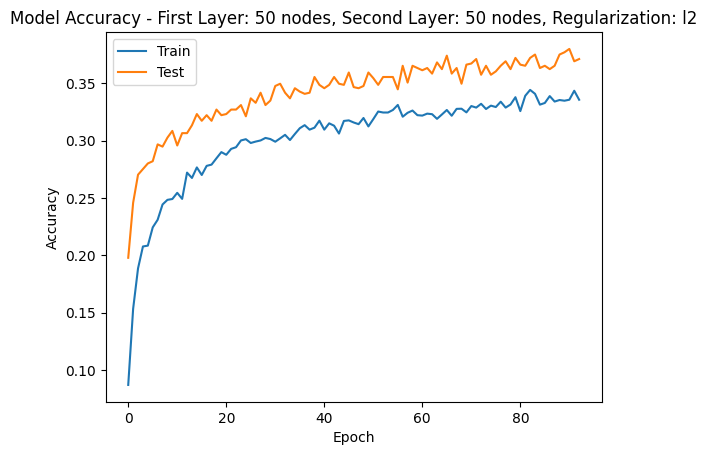

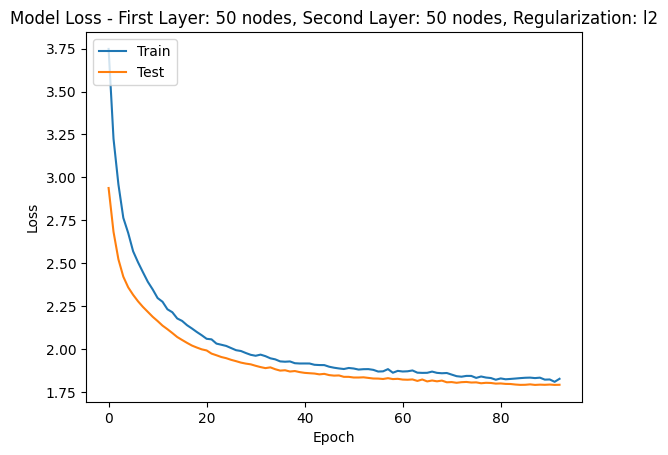

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l1 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.0798 - loss: 6.8012 - val_accuracy: 0.2027 - val_loss: 5.5608 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1435 - loss: 5.8395 - val_accuracy: 0.2468 - val_loss: 5.0111 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1696 - loss: 5.2295 - val_accuracy: 0.2723 - val_loss: 4.5268 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1989 - loss: 4.7103 - val_accuracy: 0.2782 - val_loss: 4.1194 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step accuracy: 0.2087 - loss: 4.3206 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2104 - loss: 4.2933 - val_accuracy: 0.2919 - val_loss: 3.7721 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2318 - loss: 3.9113 - val_accuracy: 0.2929 -

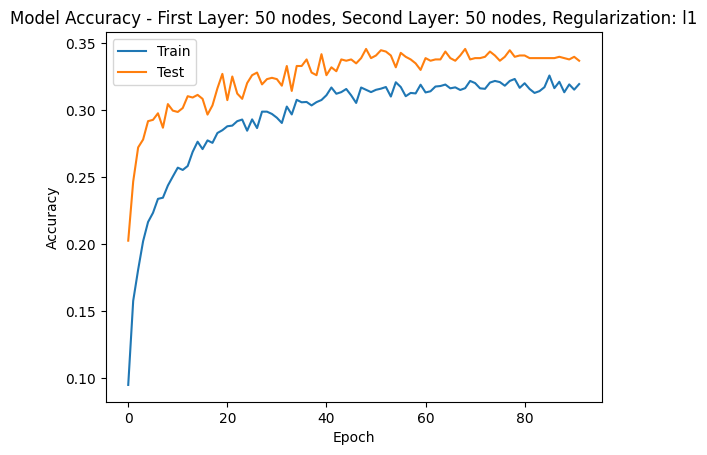

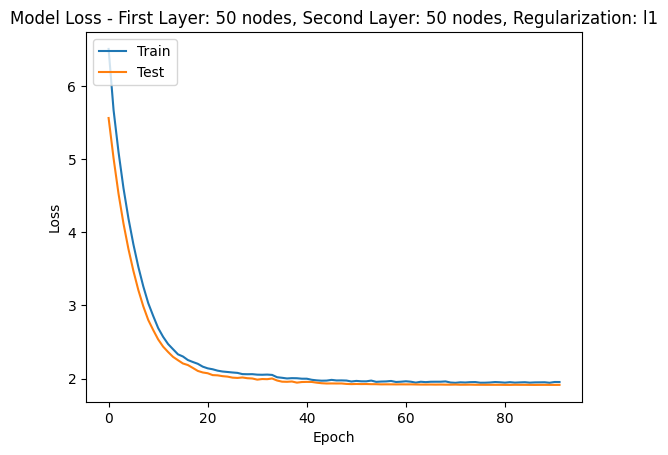

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l2 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.0773 - loss: 4.0690 - val_accuracy: 0.1763 - val_loss: 3.1484 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1495 - loss: 3.3998 - val_accuracy: 0.2331 - val_loss: 2.8428 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1814 - loss: 3.0960 - val_accuracy: 0.2625 - val_loss: 2.6414 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2048 - loss: 2.9134 - val_accuracy: 0.2635 - val_loss: 2.5224 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2289 - loss: 2.7614 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2287 - loss: 2.7578 - val_accuracy: 0.2850 - val_loss: 2.4386 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2344 - loss: 2.6469 - val_accuracy: 0.2929 -

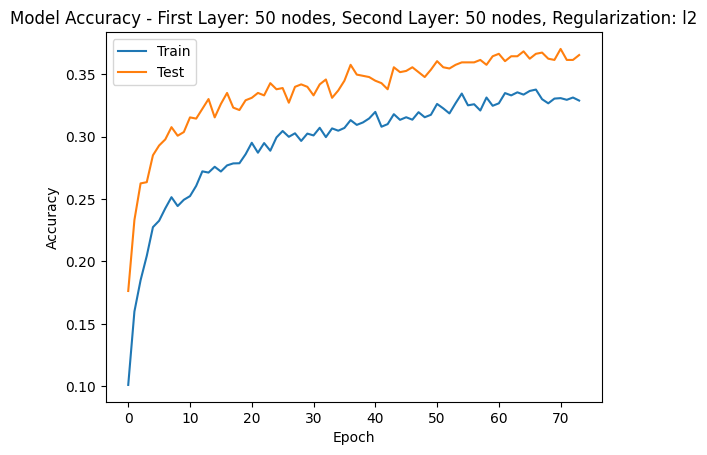

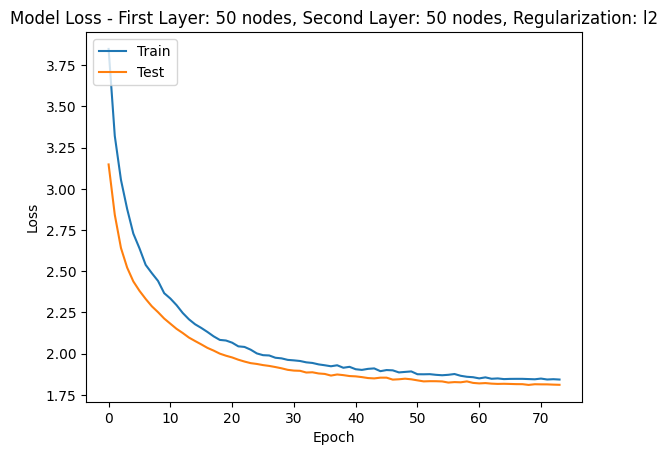

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l1 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0690 - loss: 7.4788 - val_accuracy: 0.1675 - val_loss: 6.1536 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1297 - loss: 6.3933 - val_accuracy: 0.2390 - val_loss: 5.4270 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1673 - loss: 5.5804 - val_accuracy: 0.2674 - val_loss: 4.7845 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2023 - loss: 4.9311 - val_accuracy: 0.2615 - val_loss: 4.2492 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step accuracy: 0.2201 - loss: 4.3721 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2216 - loss: 4.3510 - val_accuracy: 0.2791 - val_loss: 3.8058 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2339 - loss: 3.9055 - val_accuracy: 0.2850 -

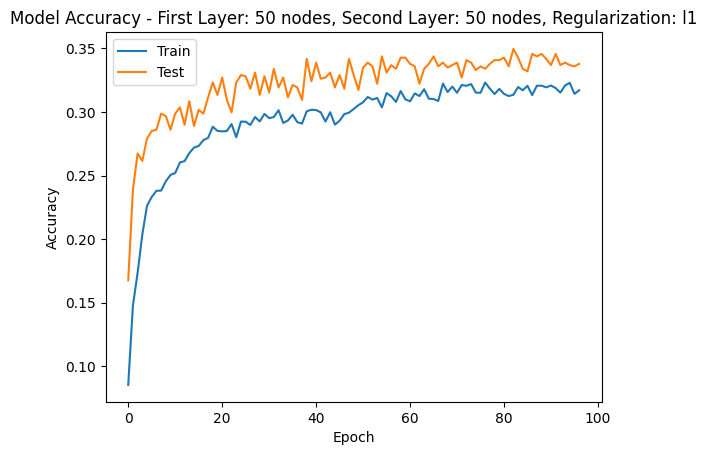

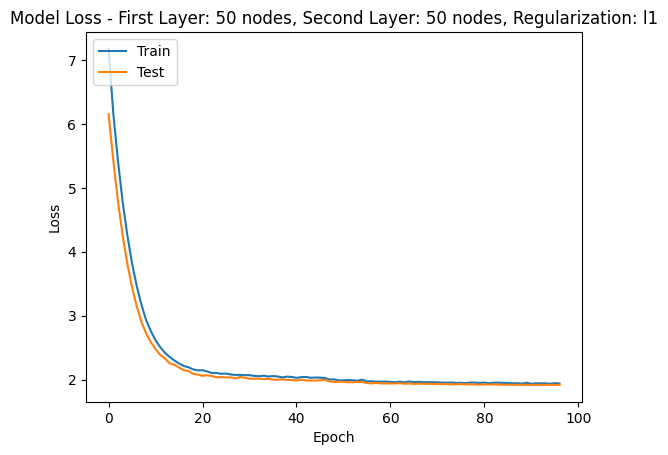

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l2 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0700 - loss: 4.3042 - val_accuracy: 0.1557 - val_loss: 3.2465 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1459 - loss: 3.5175 - val_accuracy: 0.2478 - val_loss: 2.9458 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1732 - loss: 3.2296 - val_accuracy: 0.2664 - val_loss: 2.7458 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1983 - loss: 3.0224 - val_accuracy: 0.2566 - val_loss: 2.6189 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2150 - loss: 2.8565 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2152 - loss: 2.8524 - val_accuracy: 0.2644 - val_loss: 2.5289 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2241 - loss: 2.7274 - val_accuracy: 0.2840 -

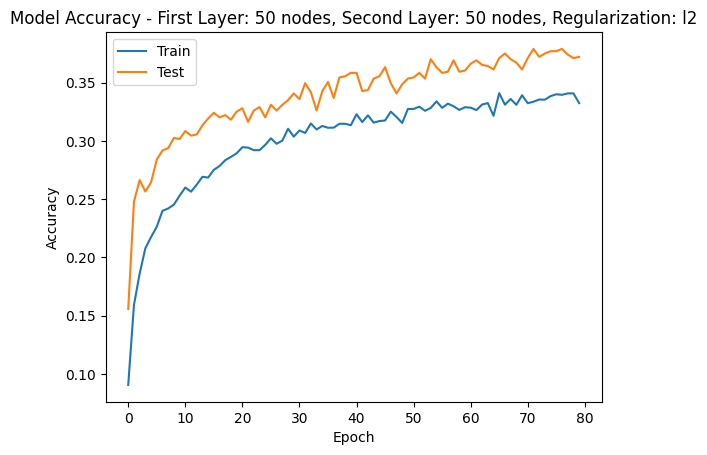

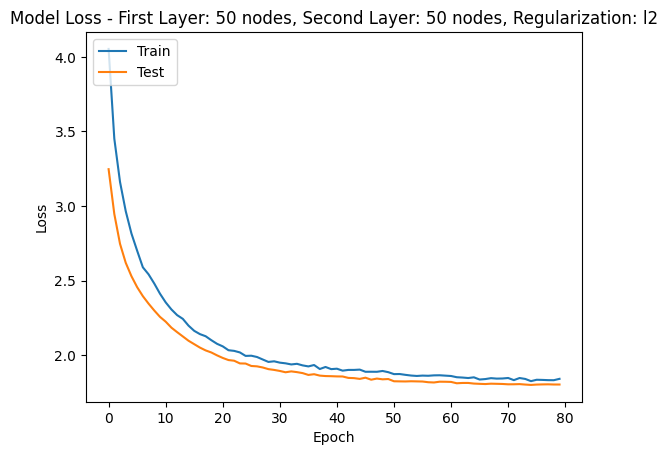

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l1 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.0768 - loss: 22.0656 - val_accuracy: 0.1822 - val_loss: 16.0581 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1263 - loss: 15.0492 - val_accuracy: 0.2067 - val_loss: 10.6066 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1635 - loss: 9.8377 - val_accuracy: 0.2321 - val_loss: 6.8018 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1896 - loss: 6.3128 - val_accuracy: 0.2116 - val_loss: 4.5722 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step accuracy: 0.2147 - loss: 4.3517 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2161 - loss: 4.2782 - val_accuracy: 0.1694 - val_loss: 3.5096 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2349 - loss: 3.2436 - val_accuracy: 0.18

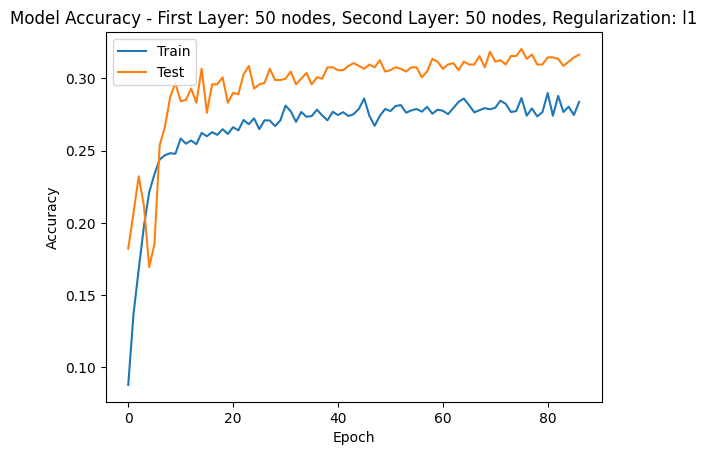

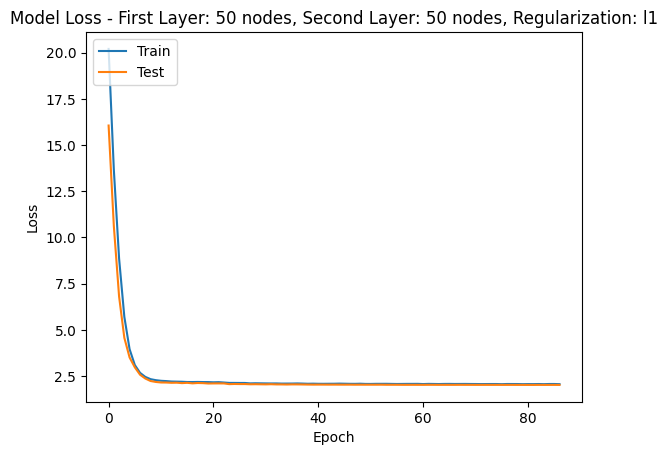

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l2 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0746 - loss: 7.0486 - val_accuracy: 0.1685 - val_loss: 5.3642 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1258 - loss: 5.5321 - val_accuracy: 0.2155 - val_loss: 4.4605 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1564 - loss: 4.6000 - val_accuracy: 0.2292 - val_loss: 3.7671 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2010 - loss: 3.9039 - val_accuracy: 0.2586 - val_loss: 3.2628 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2181 - loss: 3.4069 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2187 - loss: 3.3904 - val_accuracy: 0.2684 - val_loss: 2.9119 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2208 - loss: 3.0229 - val_accuracy: 0.2762 -

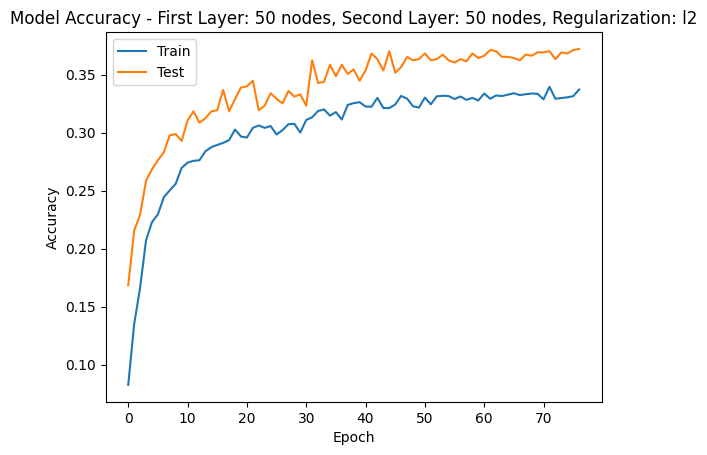

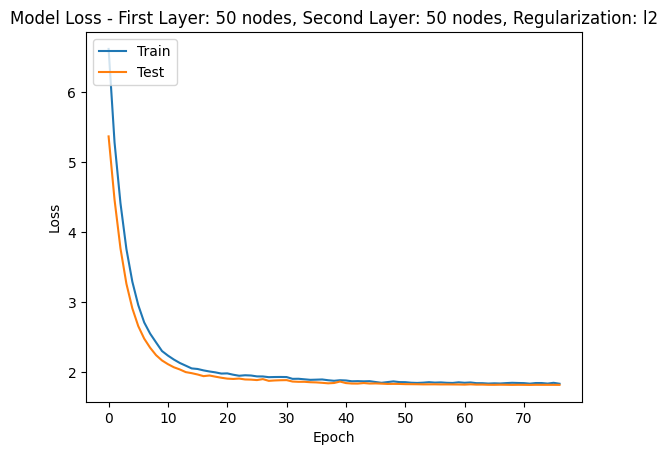

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l1 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.0544 - loss: 39.5995 - val_accuracy: 0.1312 - val_loss: 26.9439 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1089 - loss: 24.2118 - val_accuracy: 0.1499 - val_loss: 15.4131 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1420 - loss: 13.5358 - val_accuracy: 0.1489 - val_loss: 7.9673 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1940 - loss: 6.8554 - val_accuracy: 0.1361 - val_loss: 4.4543 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2253 - loss: 3.8785 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2259 - loss: 3.8303 - val_accuracy: 0.1410 - val_loss: 3.2318 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2426 - loss: 2.8582 - val_accuracy: 0.1

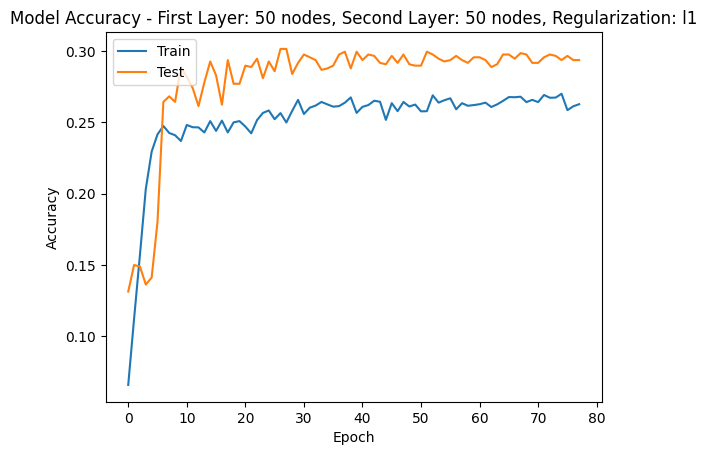

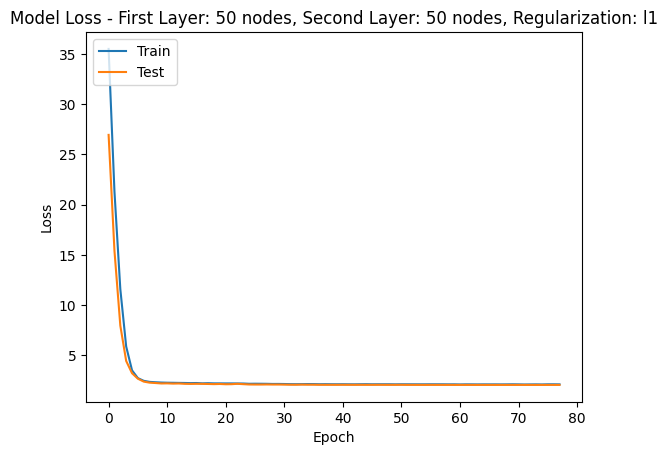

Testing model with first layer: 50 nodes, second layer: 50 nodes, regularization: l2 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0673 - loss: 9.8008 - val_accuracy: 0.1949 - val_loss: 7.0040 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1249 - loss: 6.9522 - val_accuracy: 0.2311 - val_loss: 5.1882 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.1790 - loss: 5.0921 - val_accuracy: 0.2478 - val_loss: 4.0169 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1964 - loss: 4.0264 - val_accuracy: 0.2684 - val_loss: 3.2758 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2260 - loss: 3.3127 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2259 - loss: 3.2977 - val_accuracy: 0.2576 - val_loss: 2.8211 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2352 - loss: 2.8749 - val_accuracy: 0.2693 -

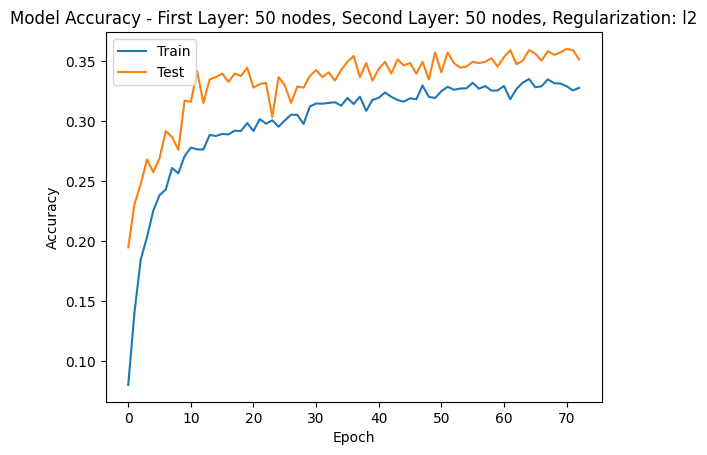

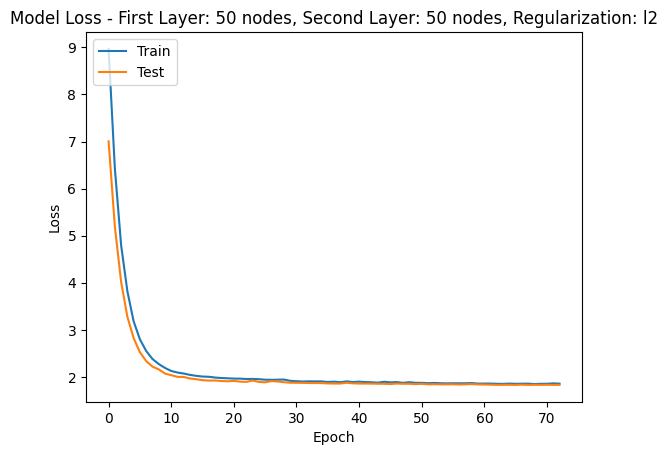

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l1 = 0.001...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0868 - loss: 4.1567 - val_accuracy: 0.2057 - val_loss: 3.1479 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1559 - loss: 3.4516 - val_accuracy: 0.2439 - val_loss: 2.8570 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1966 - loss: 3.1803 - val_accuracy: 0.2821 - val_loss: 2.6944 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2059 - loss: 3.0304 - val_accuracy: 0.2840 - val_loss: 2.5988 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2373 - loss: 2.8644 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2367 - loss: 2.8637 - val_accuracy: 0.2958 - val_loss: 2.5440 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2342 - loss: 2.7917 - val_accura

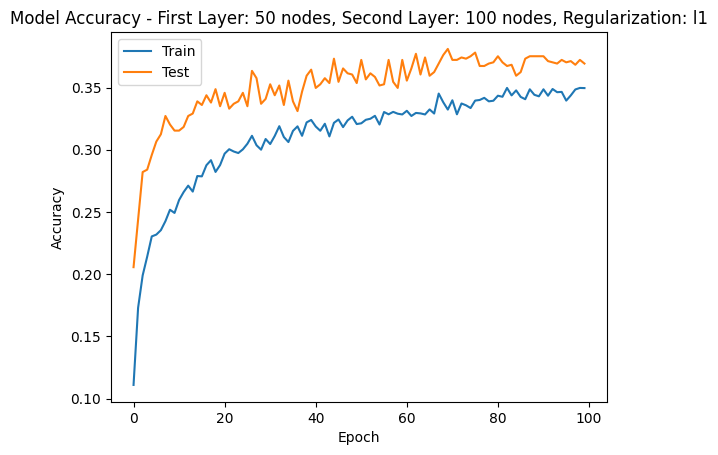

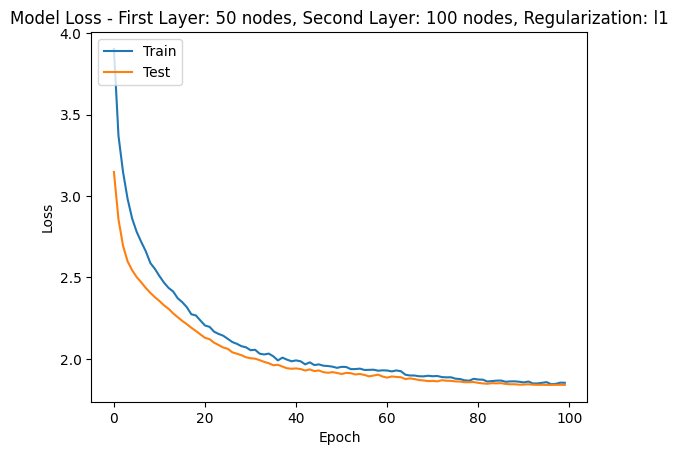

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l2 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 19s 5ms/step - accuracy: 0.0899 - loss: 3.6787 - val_accuracy: 0.2027 - val_loss: 2.6327 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1594 - loss: 2.9886 - val_accuracy: 0.2400 - val_loss: 2.3545 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1953 - loss: 2.6970 - val_accuracy: 0.2664 - val_loss: 2.2050 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2106 - loss: 2.5440 - val_accuracy: 0.2821 - val_loss: 2.1361 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2234 - loss: 2.4473 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2241 - loss: 2.4428 - val_accuracy: 0.3007 - val_loss: 2.0868 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2369 - loss: 2.3533 - val_accuracy: 0.3085 

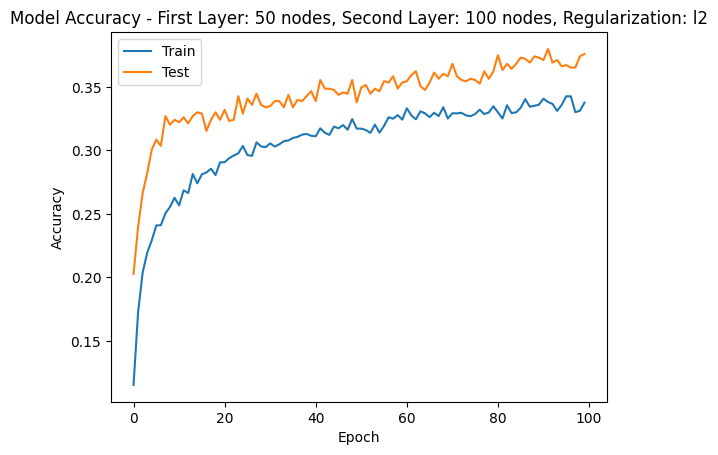

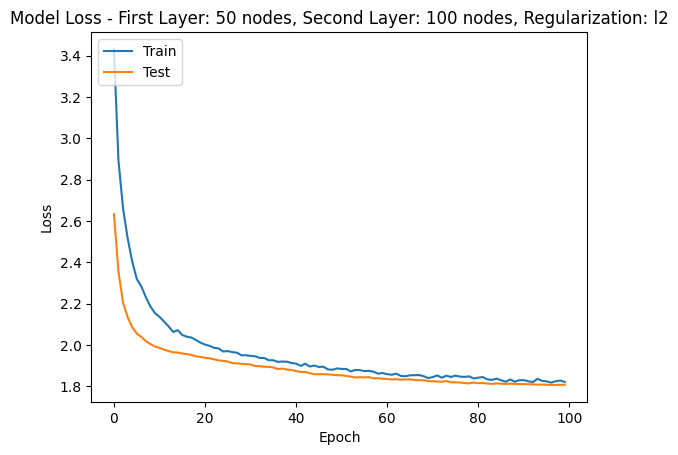

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l1 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0799 - loss: 6.6303 - val_accuracy: 0.2027 - val_loss: 5.2699 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1644 - loss: 5.5394 - val_accuracy: 0.2282 - val_loss: 4.7622 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1969 - loss: 5.0268 - val_accuracy: 0.2664 - val_loss: 4.3546 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2087 - loss: 4.6199 - val_accuracy: 0.2831 - val_loss: 4.0293 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2236 - loss: 4.2237 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2237 - loss: 4.2135 - val_accuracy: 0.2831 - val_loss: 3.7450 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2342 - loss: 3.9378 - val_accuracy: 0.2997 -

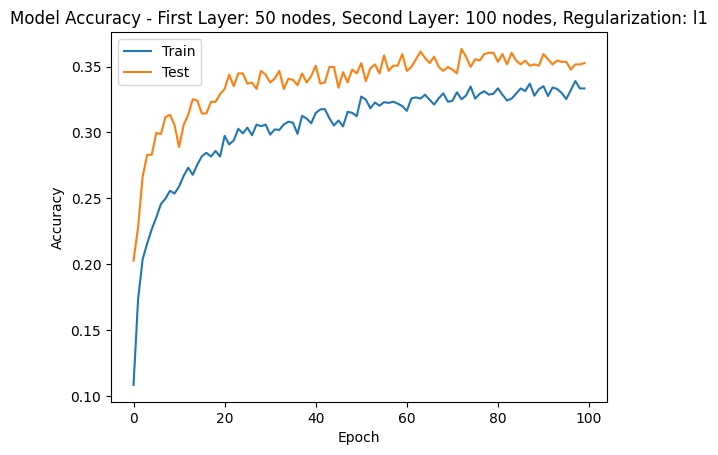

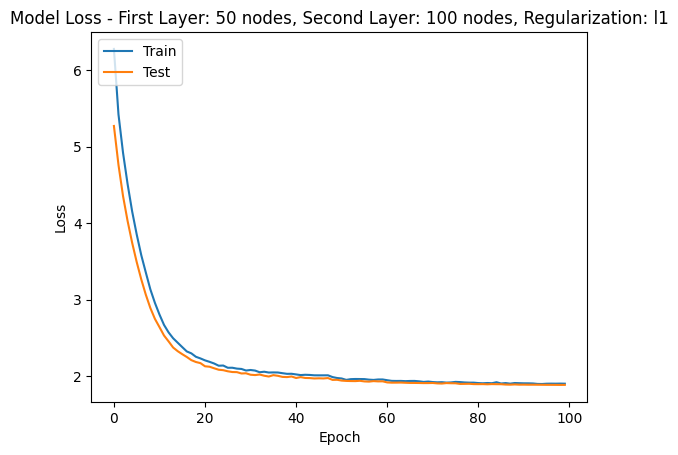

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l2 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0830 - loss: 4.0659 - val_accuracy: 0.2165 - val_loss: 3.0073 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1720 - loss: 3.2977 - val_accuracy: 0.2468 - val_loss: 2.7213 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1897 - loss: 3.0292 - val_accuracy: 0.2664 - val_loss: 2.5450 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2103 - loss: 2.8504 - val_accuracy: 0.2733 - val_loss: 2.4548 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2289 - loss: 2.6972 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.2288 - loss: 2.6950 - val_accuracy: 0.2870 - val_loss: 2.3936 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2241 - loss: 2.6406 - val_accuracy: 0.2929 

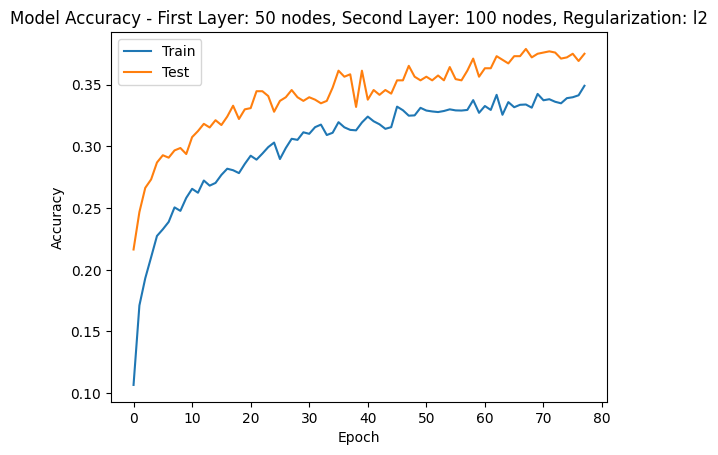

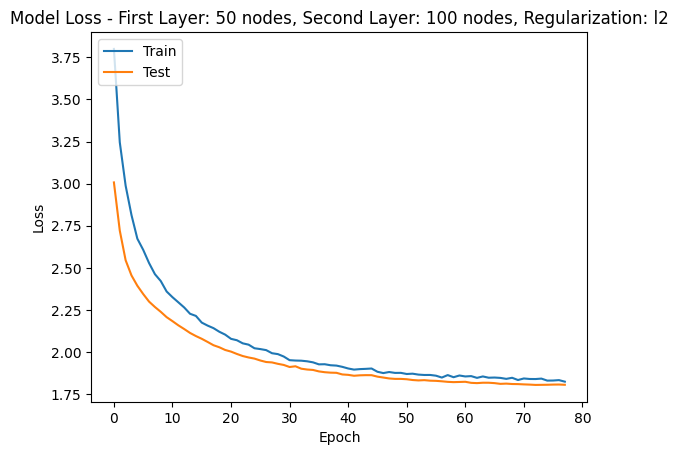

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l1 = 0.008...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.0820 - loss: 8.3389 - val_accuracy: 0.1939 - val_loss: 6.8143 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1600 - loss: 6.9735 - val_accuracy: 0.2400 - val_loss: 5.9332 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1783 - loss: 6.1135 - val_accuracy: 0.2703 - val_loss: 5.1915 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1958 - loss: 5.3805 - val_accuracy: 0.2772 - val_loss: 4.5932 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step   accuracy: 0.2123 - loss: 4.7555 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2123 - loss: 4.7522 - val_accuracy: 0.2723 - val_loss: 4.0832 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2267 - loss: 4.2136 - val_accu

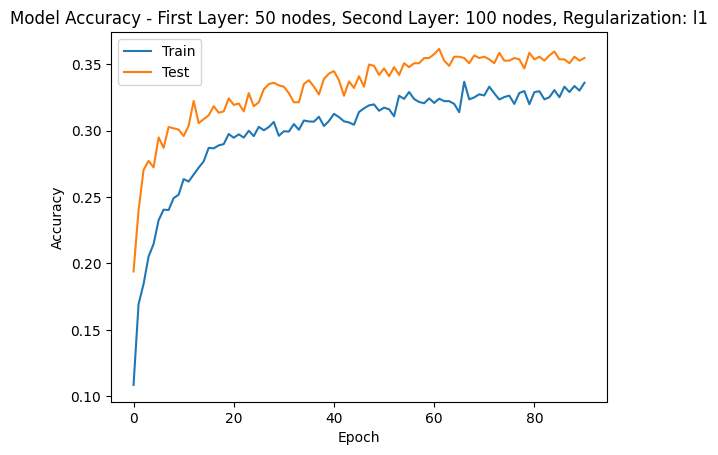

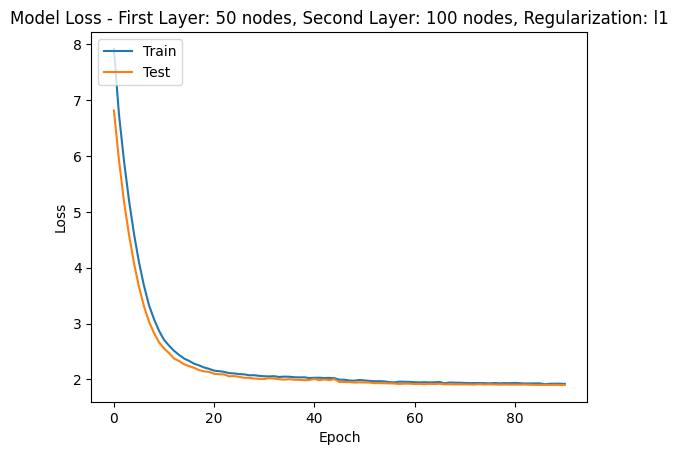

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l2 = 0.008...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.0733 - loss: 4.3097 - val_accuracy: 0.2194 - val_loss: 3.1851 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1705 - loss: 3.4955 - val_accuracy: 0.2517 - val_loss: 2.9000 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1935 - loss: 3.1972 - val_accuracy: 0.2586 - val_loss: 2.7301 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2026 - loss: 3.0365 - val_accuracy: 0.2782 - val_loss: 2.6092 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step    ccuracy: 0.2143 - loss: 2.8819 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.2143 - loss: 2.8793 - val_accuracy: 0.2850 - val_loss: 2.5362 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2269 - loss: 2.7615 - val_accur

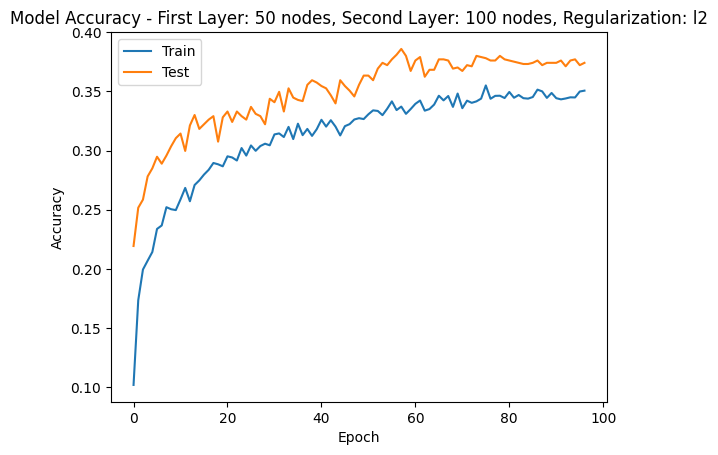

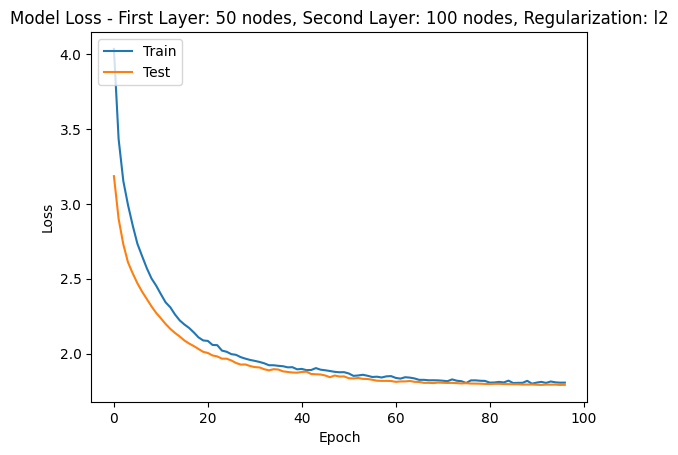

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l1 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.0841 - loss: 9.3165 - val_accuracy: 0.1636 - val_loss: 7.5337 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1498 - loss: 7.7275 - val_accuracy: 0.2047 - val_loss: 6.4037 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2082 - loss: 6.4861 - val_accuracy: 0.2449 - val_loss: 5.4666 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1988 - loss: 5.5921 - val_accuracy: 0.2615 - val_loss: 4.6930 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2250 - loss: 4.8202 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2261 - loss: 4.7856 - val_accuracy: 0.2752 - val_loss: 4.0660 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2392 - loss: 4.1258 - val_accuracy: 0.2919 -

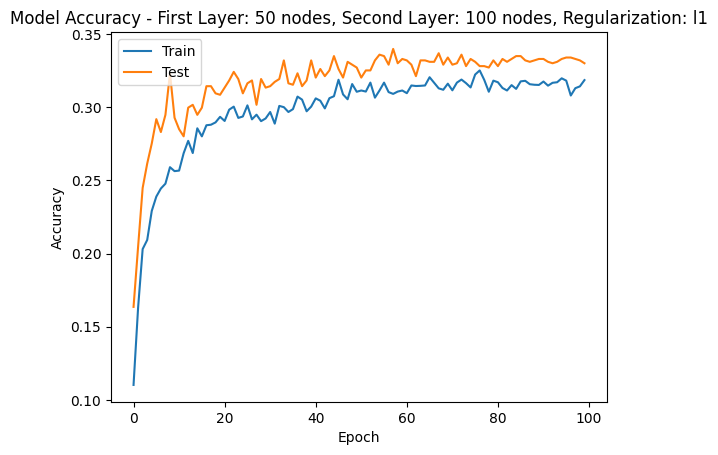

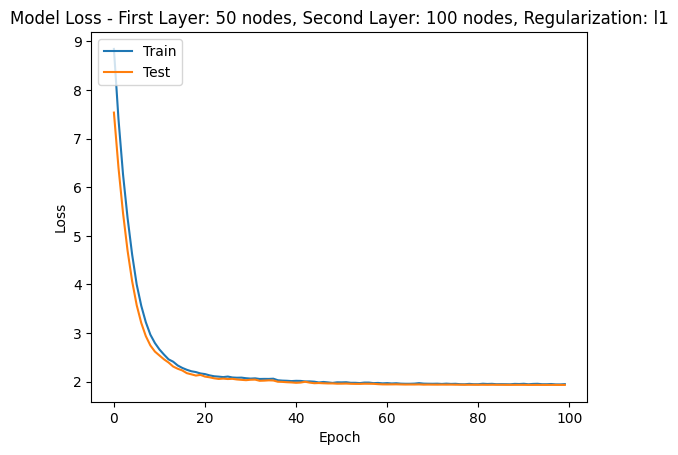

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l2 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.0780 - loss: 4.5055 - val_accuracy: 0.1734 - val_loss: 3.3648 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.1546 - loss: 3.7092 - val_accuracy: 0.2174 - val_loss: 3.0579 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1875 - loss: 3.3567 - val_accuracy: 0.2595 - val_loss: 2.8518 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2128 - loss: 3.1308 - val_accuracy: 0.2782 - val_loss: 2.7092 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step   accuracy: 0.2162 - loss: 2.9605 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.2162 - loss: 2.9589 - val_accuracy: 0.2831 - val_loss: 2.6105 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2358 - loss: 2.8296 - val_accuracy: 0.2919 

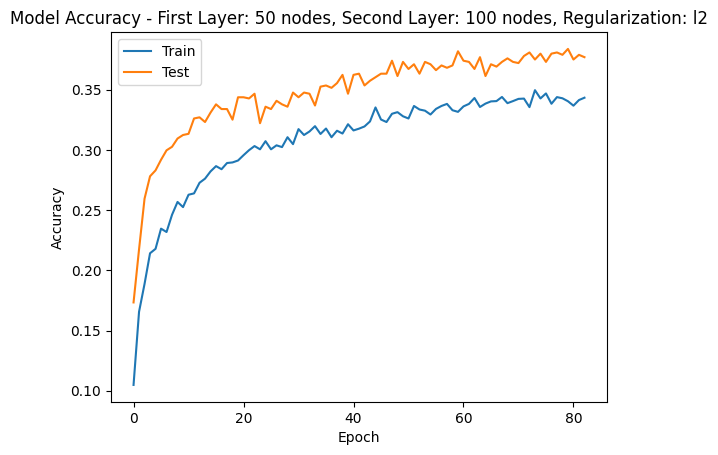

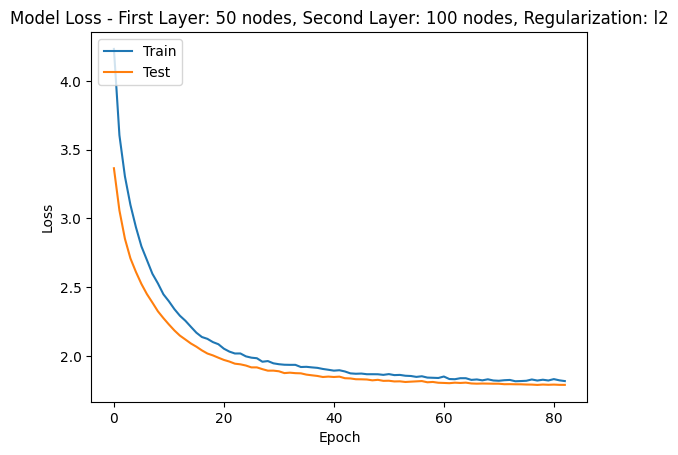

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l1 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0709 - loss: 30.3990 - val_accuracy: 0.1469 - val_loss: 20.3431 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1374 - loss: 18.4291 - val_accuracy: 0.1783 - val_loss: 11.7710 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1822 - loss: 10.5211 - val_accuracy: 0.1861 - val_loss: 6.7351 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2092 - loss: 6.1037 - val_accuracy: 0.1685 - val_loss: 4.6056 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2213 - loss: 4.3096 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2219 - loss: 4.2736 - val_accuracy: 0.2057 - val_loss: 3.6163 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2431 - loss: 3.3209 - val_accuracy: 0.2

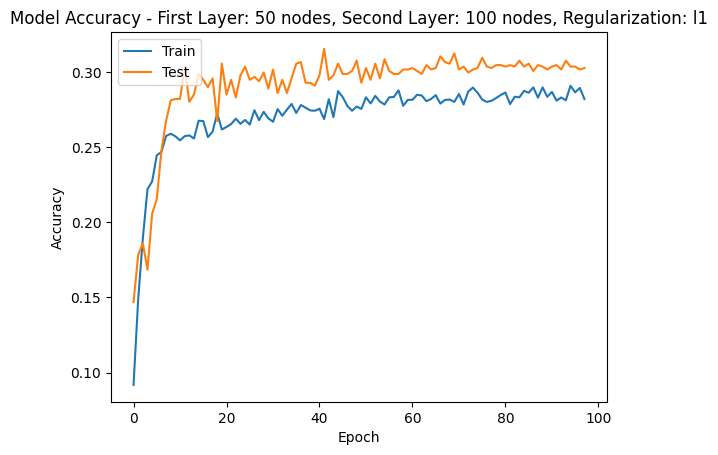

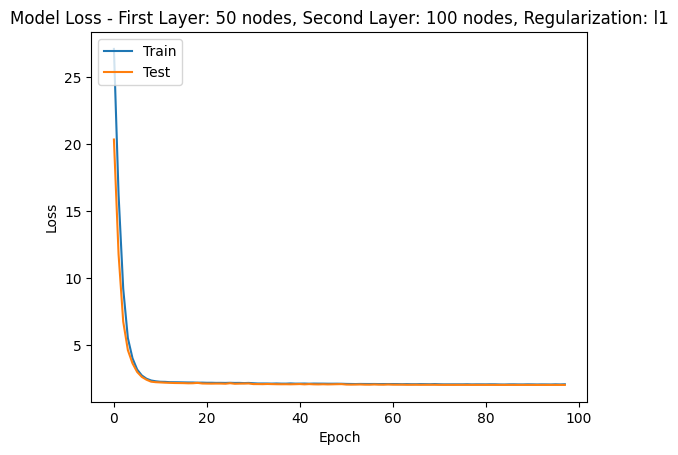

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l2 = 0.05...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.0860 - loss: 7.5627 - val_accuracy: 0.1939 - val_loss: 5.7508 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.1544 - loss: 5.8431 - val_accuracy: 0.2409 - val_loss: 4.6663 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.1979 - loss: 4.7896 - val_accuracy: 0.2644 - val_loss: 3.8935 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2187 - loss: 4.0419 - val_accuracy: 0.2860 - val_loss: 3.3544 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step    ccuracy: 0.2248 - loss: 3.5473 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - accuracy: 0.2252 - loss: 3.5407 - val_accuracy: 0.2987 - val_loss: 2.9893 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2505 - loss: 3.1228 - val_accu

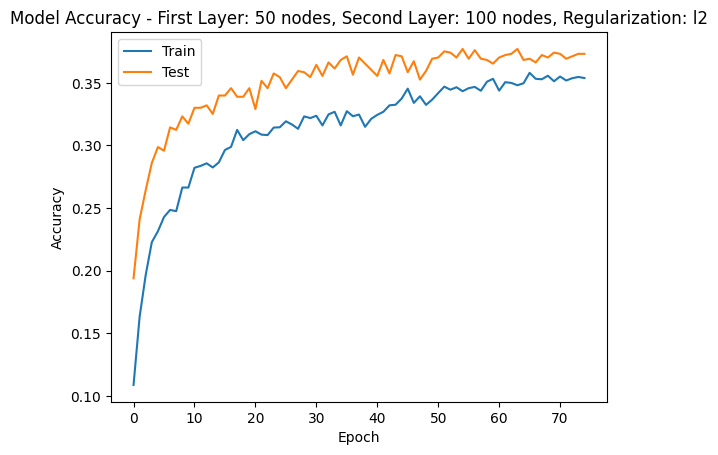

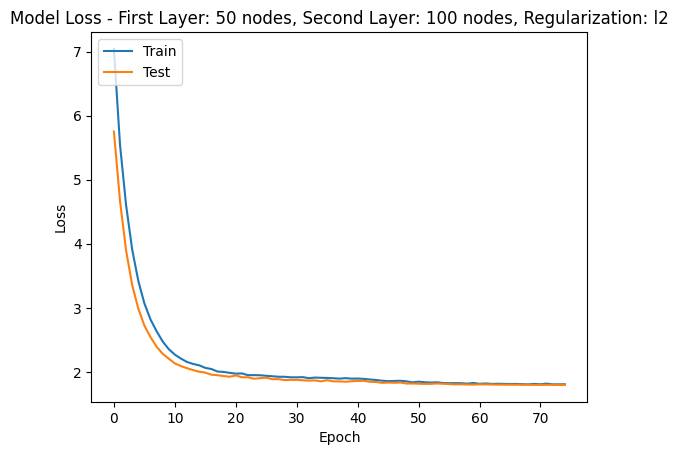

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l1 = 0.1...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.0758 - loss: 55.7288 - val_accuracy: 0.1773 - val_loss: 34.0346 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1157 - loss: 29.2700 - val_accuracy: 0.1920 - val_loss: 15.6142 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1753 - loss: 12.9313 - val_accuracy: 0.1420 - val_loss: 6.7126 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2126 - loss: 5.7262 - val_accuracy: 0.1371 - val_loss: 4.2020 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2343 - loss: 3.6581 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2345 - loss: 3.6318 - val_accuracy: 0.1479 - val_loss: 3.0813 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2361 - loss: 2.7241 - val_a

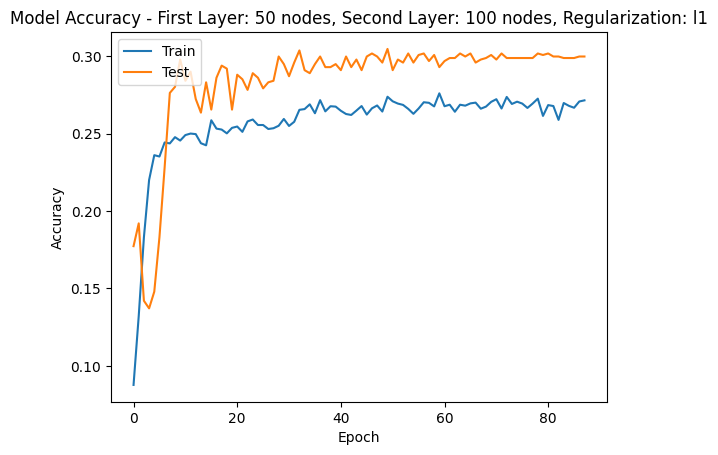

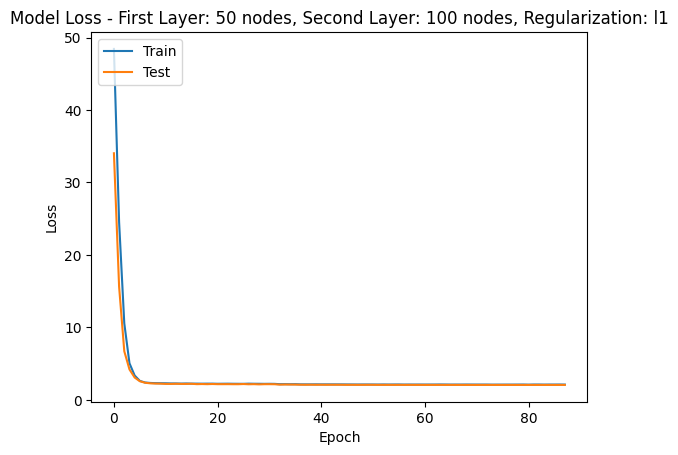

Testing model with first layer: 50 nodes, second layer: 100 nodes, regularization: l2 = 0.1...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.0853 - loss: 11.3110 - val_accuracy: 0.2106 - val_loss: 7.7770 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.1592 - loss: 7.5222 - val_accuracy: 0.2498 - val_loss: 5.4815 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1977 - loss: 5.4089 - val_accuracy: 0.2674 - val_loss: 4.1289 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2138 - loss: 4.1649 - val_accuracy: 0.2742 - val_loss: 3.3342 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2279 - loss: 3.4133 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2280 - loss: 3.4088 - val_accuracy: 0.2713 - val_loss: 2.8691 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2444 - loss: 2.9636 - val_accur

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3158 - loss: 1.9578 - val_accuracy: 0.3408 - val_loss: 1.9066 - learning_rate: 5.0000e-04
Epoch 22/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3137 - loss: 1.9419 - val_accuracy: 0.3350 - val_loss: 1.9047 - learning_rate: 5.0000e-04
Epoch 23/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3122 - loss: 1.9377 - val_accuracy: 0.3497 - val_loss: 1.8874 - learning_rate: 2.5000e-04
Epoch 24/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3167 - loss: 1.9260 - val_accuracy: 0.3536 - val_loss: 1.8787 - learning_rate: 2.5000e-04
Epoch 25/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step accuracy: 0.3111 - loss: 1.9062 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.3112 - loss: 1.9069 - val_accuracy: 0.3565 - val_loss: 1.8756 - learning_rate: 2.5000e-04
Epoch 26/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3162 - loss: 1.9110 - val_accuracy: 0.3

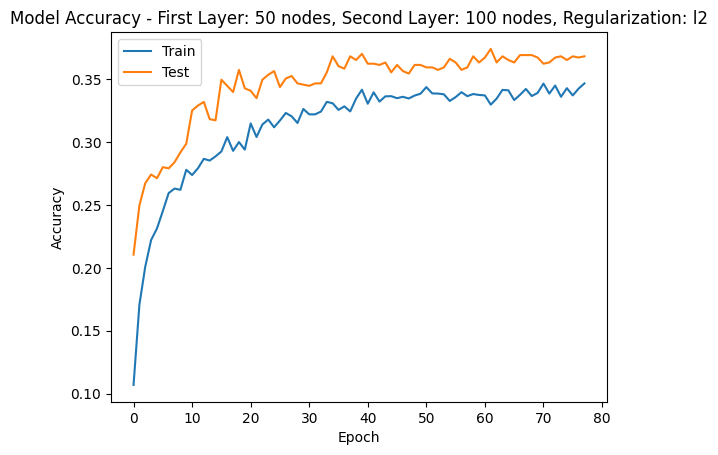

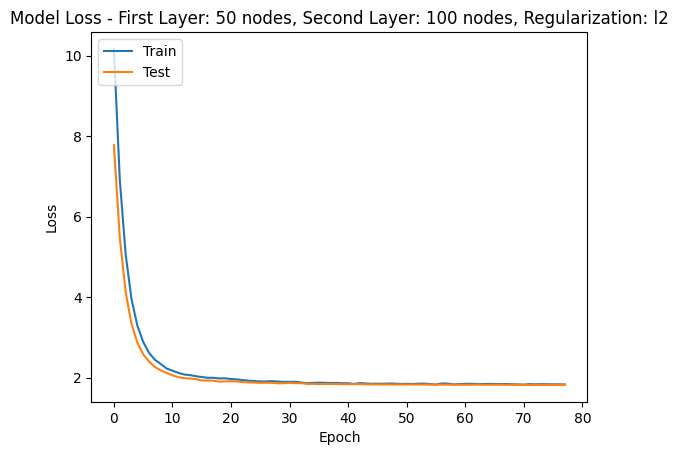

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l1 = 0.001...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0837 - loss: 4.4249 - val_accuracy: 0.1969 - val_loss: 3.5128 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1837 - loss: 3.6703 - val_accuracy: 0.2400 - val_loss: 3.2441 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2059 - loss: 3.3803 - val_accuracy: 0.2605 - val_loss: 3.0345 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2337 - loss: 3.2198 - val_accuracy: 0.2791 - val_loss: 2.8984 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2518 - loss: 3.0567 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2512 - loss: 3.0570 - val_accuracy: 0.2880 - val_loss: 2.8048 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2651 - loss: 2.9432 - val_accura

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3661 - loss: 1.8413 - val_accuracy: 0.3839 - val_loss: 1.8481 - learning_rate: 2.5000e-04
Epoch 57/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3544 - loss: 1.8551 - val_accuracy: 0.3888 - val_loss: 1.8477 - learning_rate: 2.5000e-04
Epoch 58/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3571 - loss: 1.8671 - val_accuracy: 0.3781 - val_loss: 1.8501 - learning_rate: 2.5000e-04
Epoch 59/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3592 - loss: 1.8451 - val_accuracy: 0.3888 - val_loss: 1.8356 - learning_rate: 2.5000e-04
Epoch 60/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 690us/step accuracy: 0.3675 - loss: 1.8441 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.3672 - loss: 1.8448 - val_accuracy: 0.3820 - val_loss: 1.8334 - learning_rate: 2.5000e-04
Epoch 61/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3506 - loss: 1.8461 - val_accuracy: 0.3

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3733 - loss: 1.8091 - val_accuracy: 0.3800 - val_loss: 1.8218 - learning_rate: 1.2500e-04
Epoch 67/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3546 - loss: 1.8426 - val_accuracy: 0.3928 - val_loss: 1.8193 - learning_rate: 1.2500e-04
Epoch 68/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3752 - loss: 1.8227 - val_accuracy: 0.3859 - val_loss: 1.8192 - learning_rate: 1.2500e-04
Epoch 69/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3686 - loss: 1.8259 - val_accuracy: 0.3918 - val_loss: 1.8142 - learning_rate: 1.2500e-04
Epoch 70/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step accuracy: 0.3678 - loss: 1.8343 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.3676 - loss: 1.8333 - val_accuracy: 0.3937 - val_loss: 1.8087 - learning_rate: 1.2500e-04
Epoch 71/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3795 - loss: 1.8108 - val_accuracy: 0.3

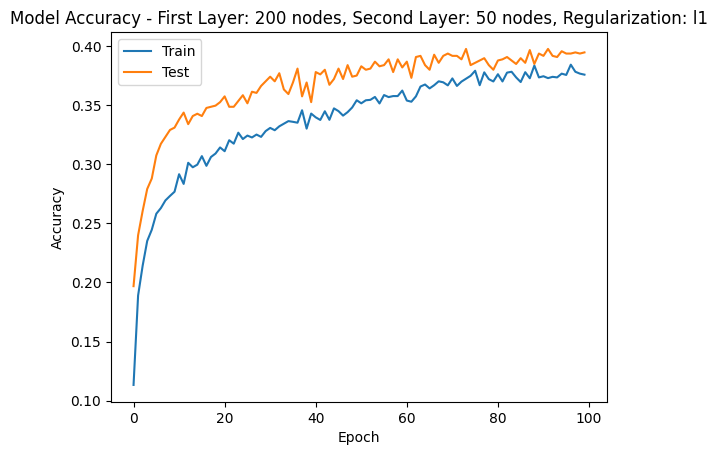

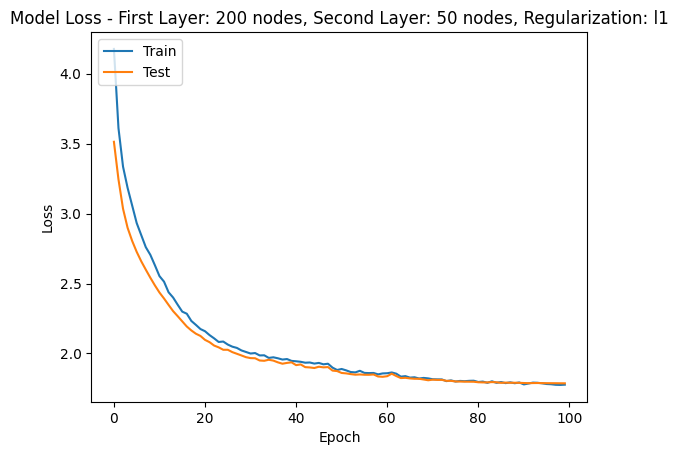

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l2 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0906 - loss: 3.5465 - val_accuracy: 0.1949 - val_loss: 2.5898 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1852 - loss: 2.8214 - val_accuracy: 0.2331 - val_loss: 2.3547 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2112 - loss: 2.6035 - val_accuracy: 0.2654 - val_loss: 2.1861 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2379 - loss: 2.4302 - val_accuracy: 0.2860 - val_loss: 2.1032 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step accuracy: 0.2605 - loss: 2.3097 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.2598 - loss: 2.3095 - val_accuracy: 0.2968 - val_loss: 2.0563 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2458 - loss: 2.2771 - val_accuracy: 0.3154 -

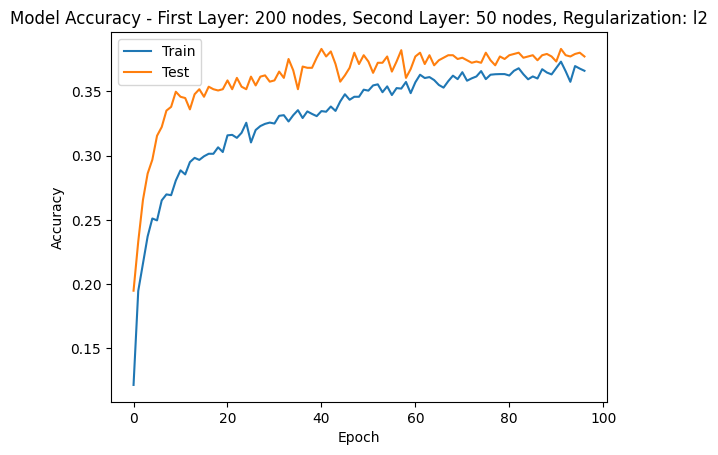

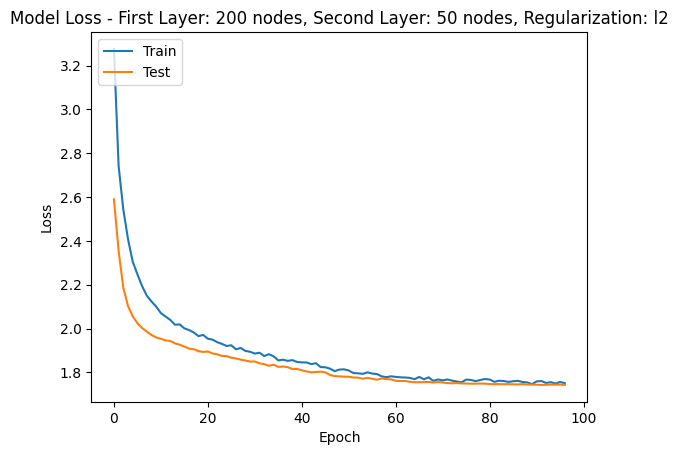

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l1 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0886 - loss: 8.2351 - val_accuracy: 0.1430 - val_loss: 6.8977 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1818 - loss: 6.8356 - val_accuracy: 0.2223 - val_loss: 5.9546 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2156 - loss: 5.8789 - val_accuracy: 0.2733 - val_loss: 5.0972 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2291 - loss: 5.0777 - val_accuracy: 0.3222 - val_loss: 4.3886 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2545 - loss: 4.4143 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2534 - loss: 4.3932 - val_accuracy: 0.3164 - val_loss: 3.8250 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2629 - loss: 3.8335 - val_accuracy: 0.3193 -

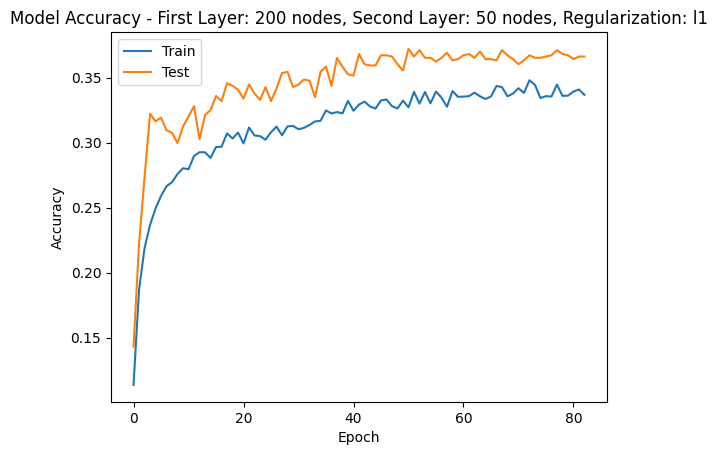

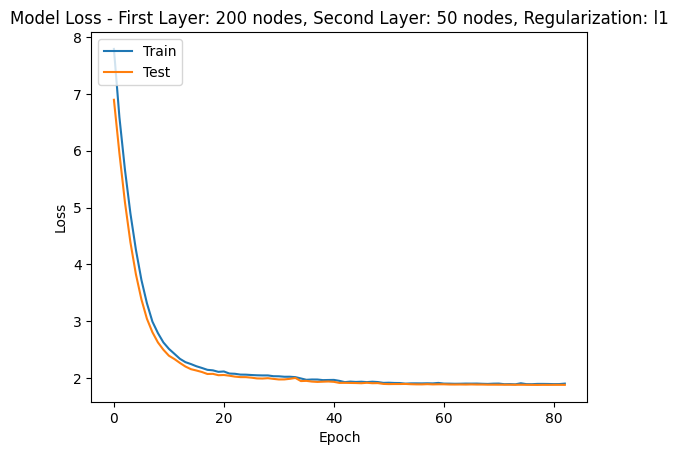

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l2 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0934 - loss: 3.9817 - val_accuracy: 0.1861 - val_loss: 3.0226 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1843 - loss: 3.2087 - val_accuracy: 0.2243 - val_loss: 2.7524 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2148 - loss: 2.9193 - val_accuracy: 0.2644 - val_loss: 2.5594 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2332 - loss: 2.7647 - val_accuracy: 0.2831 - val_loss: 2.4477 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step accuracy: 0.2352 - loss: 2.6417 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2354 - loss: 2.6399 - val_accuracy: 0.3046 - val_loss: 2.3755 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2431 - loss: 2.5594 - val_accuracy: 0.3095 -

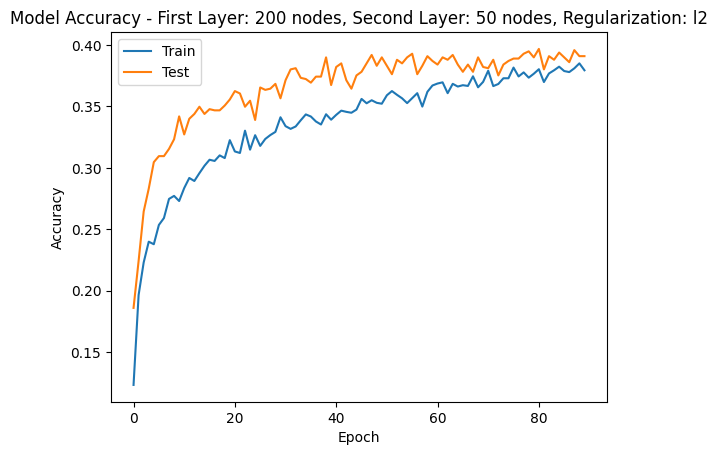

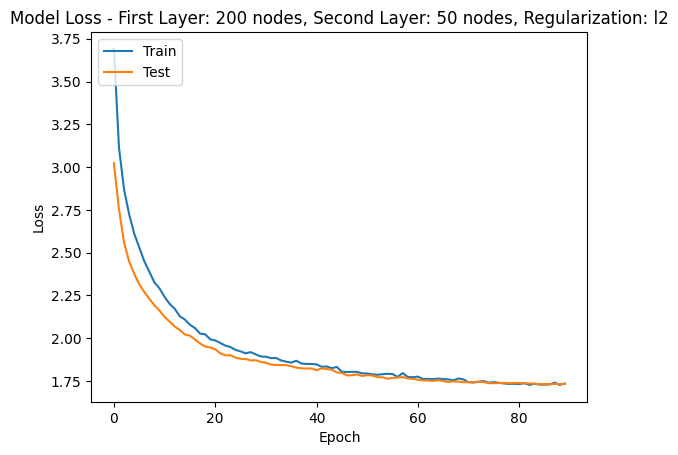

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l1 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.0817 - loss: 11.0173 - val_accuracy: 0.2125 - val_loss: 9.0130 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1839 - loss: 8.7082 - val_accuracy: 0.2458 - val_loss: 7.2919 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2174 - loss: 6.9645 - val_accuracy: 0.2517 - val_loss: 5.8257 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2328 - loss: 5.5963 - val_accuracy: 0.2684 - val_loss: 4.6797 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2473 - loss: 4.5548 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2470 - loss: 4.5385 - val_accuracy: 0.2919 - val_loss: 3.8400 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2533 - loss: 3.7840 - val_accuracy: 0.3046 

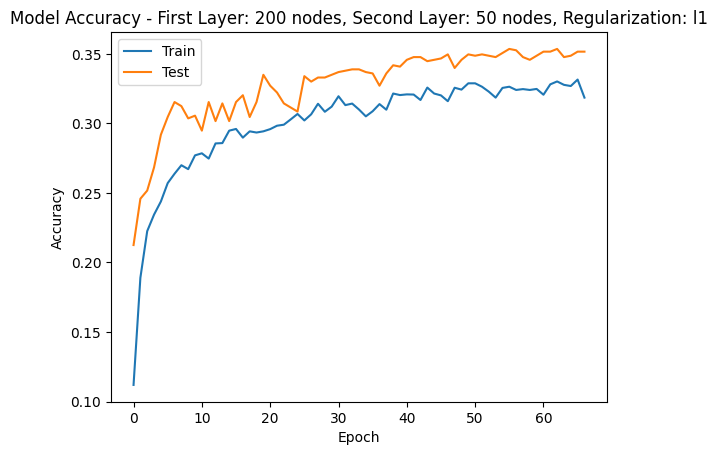

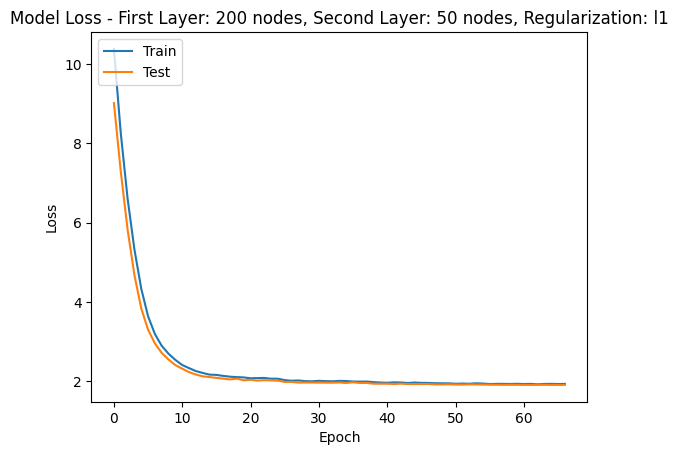

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l2 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0763 - loss: 4.4351 - val_accuracy: 0.1312 - val_loss: 3.4633 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1623 - loss: 3.5566 - val_accuracy: 0.2135 - val_loss: 3.1120 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2009 - loss: 3.2004 - val_accuracy: 0.2840 - val_loss: 2.8274 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2252 - loss: 2.9958 - val_accuracy: 0.2733 - val_loss: 2.6407 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step accuracy: 0.2397 - loss: 2.8375 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.2397 - loss: 2.8346 - val_accuracy: 0.2889 - val_loss: 2.5246 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2486 - loss: 2.6646 - val_accuracy: 0.3036 -

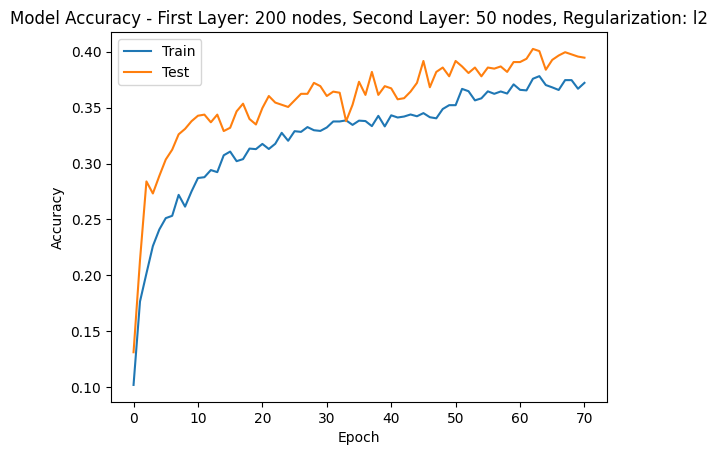

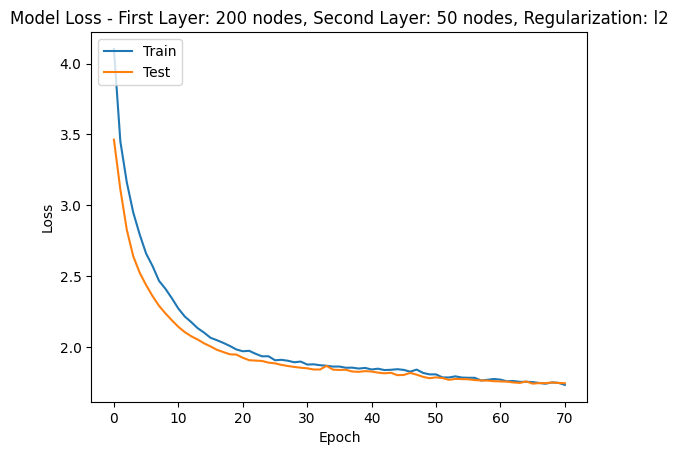

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l1 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.1040 - loss: 12.6934 - val_accuracy: 0.2008 - val_loss: 10.1445 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1909 - loss: 9.7064 - val_accuracy: 0.2184 - val_loss: 7.8443 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2185 - loss: 7.4173 - val_accuracy: 0.2262 - val_loss: 5.9726 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2283 - loss: 5.6896 - val_accuracy: 0.2292 - val_loss: 4.5970 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2485 - loss: 4.4403 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2483 - loss: 4.4205 - val_accuracy: 0.2547 - val_loss: 3.6983 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2595 - loss: 3.6131 - val_accuracy: 0.2654

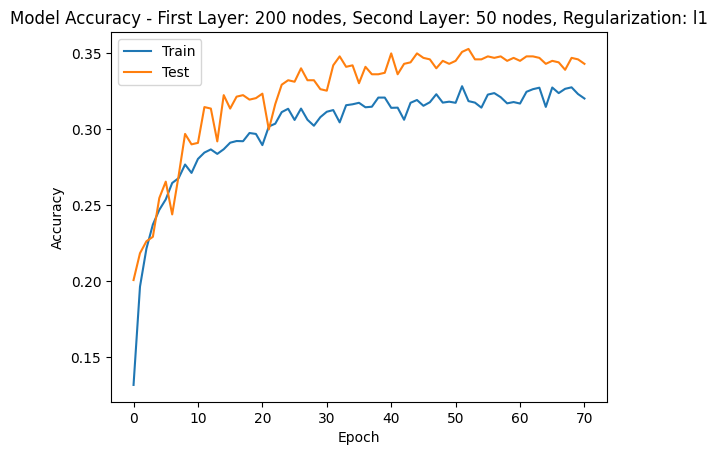

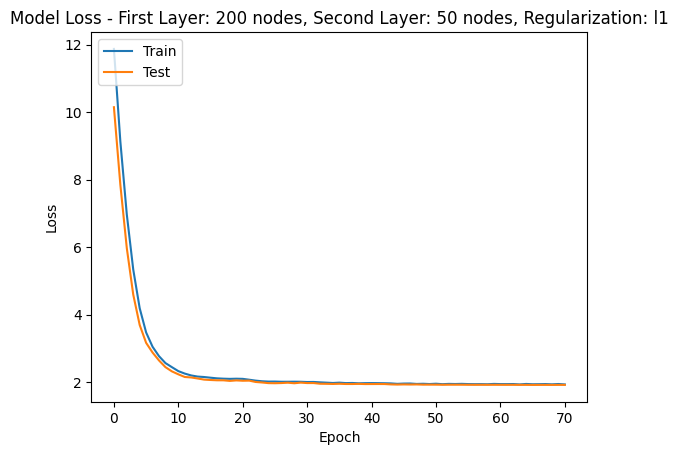

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l2 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.0943 - loss: 4.4113 - val_accuracy: 0.1959 - val_loss: 3.5733 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1860 - loss: 3.6409 - val_accuracy: 0.2527 - val_loss: 3.2227 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2095 - loss: 3.3315 - val_accuracy: 0.2948 - val_loss: 2.9354 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2387 - loss: 3.0418 - val_accuracy: 0.3017 - val_loss: 2.7427 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step accuracy: 0.2553 - loss: 2.8793 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.2551 - loss: 2.8775 - val_accuracy: 0.3124 - val_loss: 2.6024 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2656 - loss: 2.7175 - val_accuracy: 0.3134 -

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3391 - loss: 1.8639 - val_accuracy: 0.3751 - val_loss: 1.8252 - learning_rate: 5.0000e-04
Epoch 37/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3331 - loss: 1.8583 - val_accuracy: 0.3565 - val_loss: 1.8232 - learning_rate: 5.0000e-04
Epoch 38/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3501 - loss: 1.8455 - val_accuracy: 0.3555 - val_loss: 1.8371 - learning_rate: 5.0000e-04
Epoch 39/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3400 - loss: 1.8597 - val_accuracy: 0.3634 - val_loss: 1.8249 - learning_rate: 5.0000e-04
Epoch 40/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 670us/step accuracy: 0.3350 - loss: 1.8535 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3354 - loss: 1.8535 - val_accuracy: 0.3722 - val_loss: 1.8178 - learning_rate: 5.0000e-04
Epoch 41/100
 87/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3530 - loss: 1.8163 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3496 - loss: 1.8238 - val_accuracy: 0.3653 - val_loss: 1.8159 - learning_rate: 5.0000e-04
Epoch 42/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3499 - loss: 1.8529 - val_accuracy: 0.3536 - val_loss: 1.8170 - learning_rate: 5.0000e-04
Epoch 43/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3395 - loss: 1.8536 - val_accuracy: 0.3790 - val_loss: 1.8283 - learning_rate: 5.0000e-04
Epoch 44/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3450 - loss: 1.8381 - val_accuracy: 0.3683 - val_loss: 1.8135 - learning_rate: 5.0000e-04
Epoch 45/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 707us/step accuracy: 0.3462 - loss: 1.8268 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.3461 - loss: 1.8274 - val_accuracy: 0.3810 - val_loss: 1.8052 - learning_rate: 5.0000e-04
Epoch 46/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3602 - loss: 1.8201 - val_accuracy: 0.3

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3575 - loss: 1.7807 - val_accuracy: 0.3869 - val_loss: 1.7895 - learning_rate: 2.5000e-04
Epoch 52/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3734 - loss: 1.7776 - val_accuracy: 0.3781 - val_loss: 1.7870 - learning_rate: 2.5000e-04
Epoch 53/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3710 - loss: 1.7664 - val_accuracy: 0.3722 - val_loss: 1.7832 - learning_rate: 2.5000e-04
Epoch 54/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3737 - loss: 1.7607 - val_accuracy: 0.3712 - val_loss: 1.7760 - learning_rate: 2.5000e-04
Epoch 55/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 658us/step accuracy: 0.3448 - loss: 1.7937 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3451 - loss: 1.7937 - val_accuracy: 0.3869 - val_loss: 1.7857 - learning_rate: 2.5000e-04
Epoch 56/100
 84/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3580 - loss: 1.7917 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3572 - loss: 1.7920 - val_accuracy: 0.3830 - val_loss: 1.7680 - learning_rate: 2.5000e-04
Epoch 57/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3745 - loss: 1.7502 - val_accuracy: 0.3908 - val_loss: 1.7782 - learning_rate: 2.5000e-04
Epoch 58/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3610 - loss: 1.7791 - val_accuracy: 0.3692 - val_loss: 1.7776 - learning_rate: 2.5000e-04
Epoch 59/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3702 - loss: 1.7760 - val_accuracy: 0.3849 - val_loss: 1.7689 - learning_rate: 2.5000e-04
Epoch 60/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 661us/step accuracy: 0.3746 - loss: 1.7597 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.3742 - loss: 1.7601 - val_accuracy: 0.3937 - val_loss: 1.7624 - learning_rate: 1.2500e-04
Epoch 61/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3605 - loss: 1.7699 - val_accuracy: 0.3

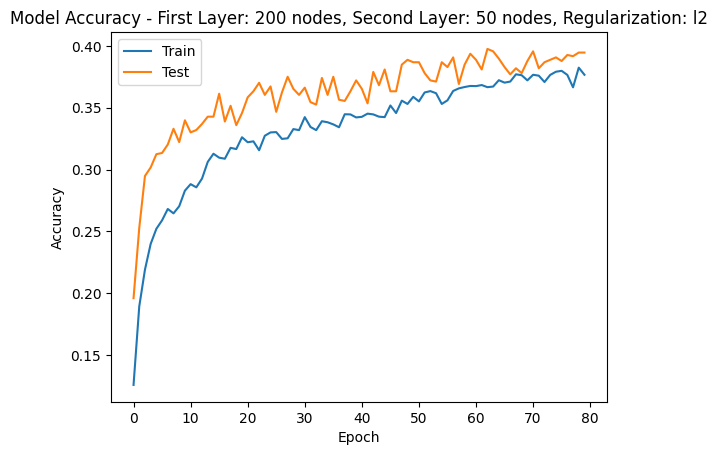

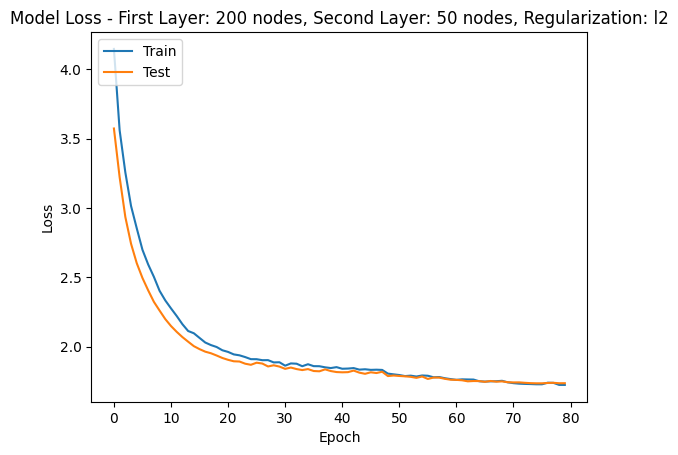

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l1 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.0685 - loss: 46.2215 - val_accuracy: 0.1489 - val_loss: 26.2003 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1563 - loss: 21.7668 - val_accuracy: 0.1499 - val_loss: 10.7127 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2048 - loss: 8.5936 - val_accuracy: 0.1391 - val_loss: 4.9591 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2318 - loss: 4.1175 - val_accuracy: 0.1381 - val_loss: 3.2513 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step accuracy: 0.2638 - loss: 2.7297 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2628 - loss: 2.7184 - val_accuracy: 0.1724 - val_loss: 2.6497 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2529 - loss: 2.4063 - val_accuracy: 0.25

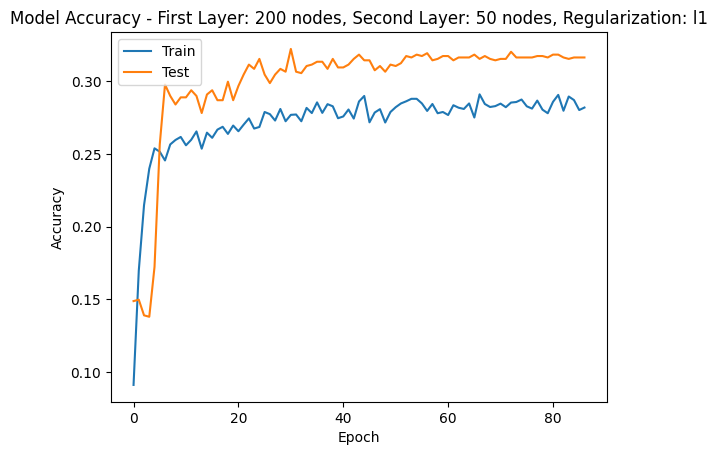

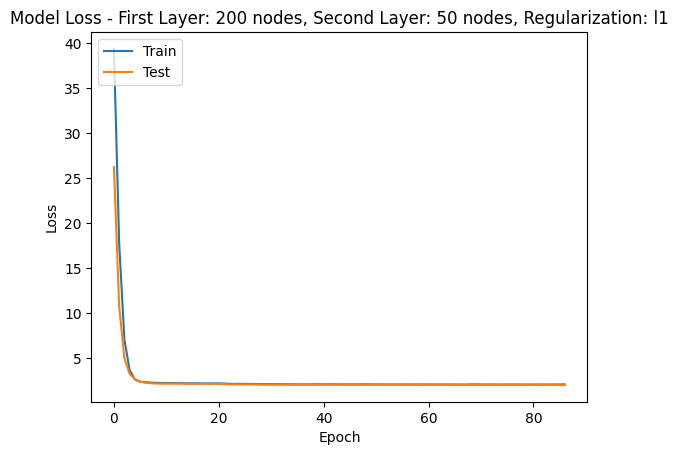

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l2 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0864 - loss: 8.3052 - val_accuracy: 0.1812 - val_loss: 6.2409 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1727 - loss: 6.0127 - val_accuracy: 0.2037 - val_loss: 4.8073 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2351 - loss: 4.5978 - val_accuracy: 0.2586 - val_loss: 3.8062 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2340 - loss: 3.7242 - val_accuracy: 0.2977 - val_loss: 3.1550 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step accuracy: 0.2517 - loss: 3.1595 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.2517 - loss: 3.1545 - val_accuracy: 0.3066 - val_loss: 2.7441 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2587 - loss: 2.7889 - val_accuracy: 0.2929 -

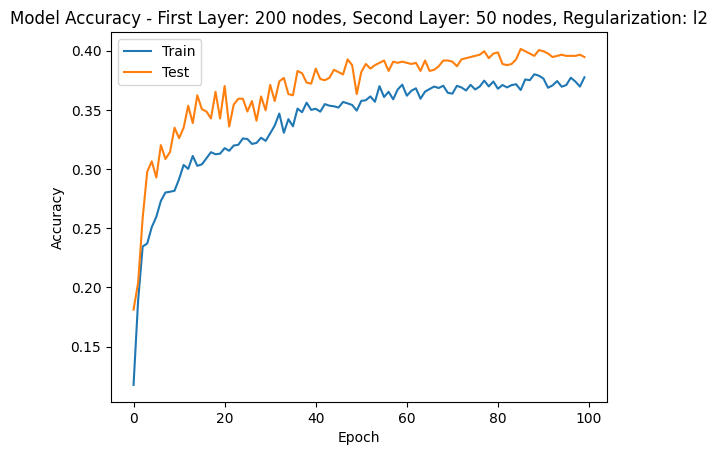

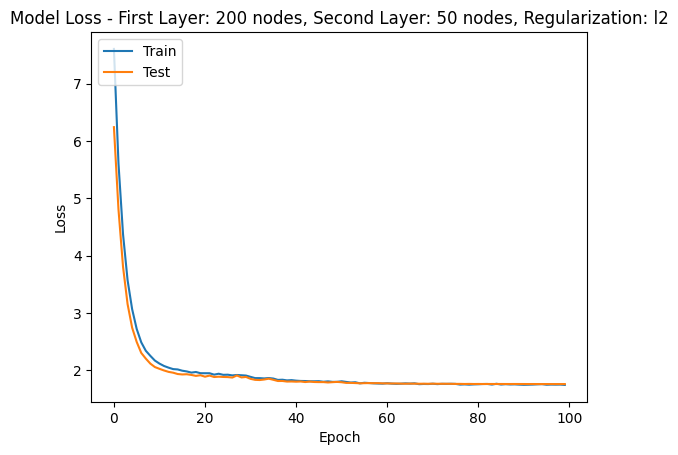

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l1 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0605 - loss: 85.5910 - val_accuracy: 0.1009 - val_loss: 41.7152 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1325 - loss: 32.2001 - val_accuracy: 0.1009 - val_loss: 10.8030 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2006 - loss: 7.6751 - val_accuracy: 0.1283 - val_loss: 3.5556 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2364 - loss: 2.8768 - val_accuracy: 0.1381 - val_loss: 2.8306 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step accuracy: 0.2551 - loss: 2.4662 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.2535 - loss: 2.4641 - val_accuracy: 0.1802 - val_loss: 2.5870 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2382 - loss: 2.4094 - val_accuracy: 0.23

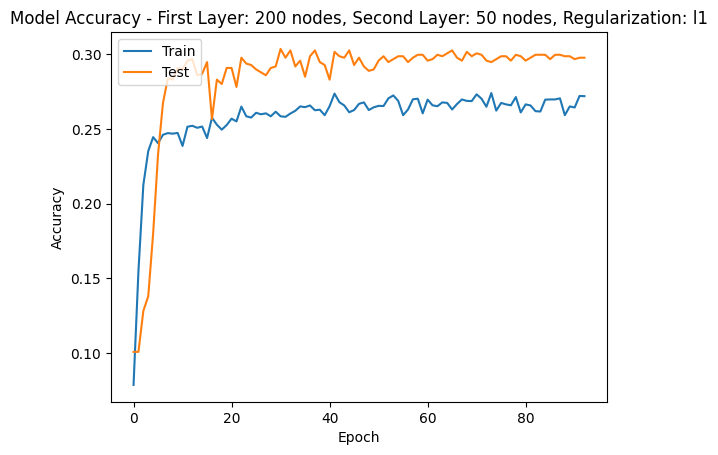

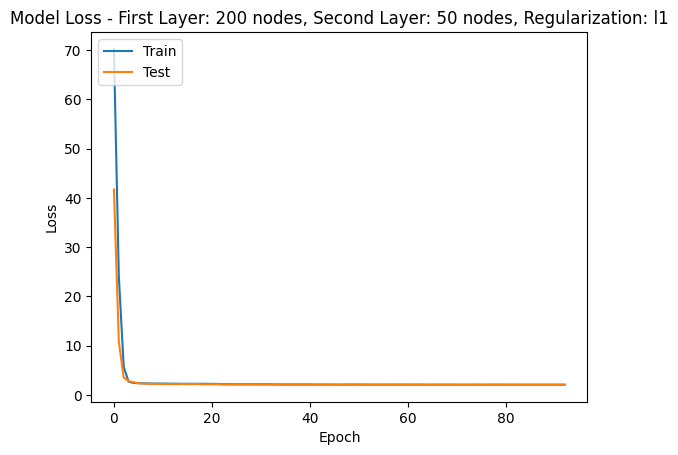

Testing model with first layer: 200 nodes, second layer: 50 nodes, regularization: l2 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0944 - loss: 12.5875 - val_accuracy: 0.1792 - val_loss: 8.1870 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1802 - loss: 7.5056 - val_accuracy: 0.2018 - val_loss: 5.3602 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2138 - loss: 4.9788 - val_accuracy: 0.2262 - val_loss: 3.8404 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2424 - loss: 3.6147 - val_accuracy: 0.2664 - val_loss: 3.0289 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step accuracy: 0.2531 - loss: 2.9837 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.2535 - loss: 2.9768 - val_accuracy: 0.2860 - val_loss: 2.5891 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2707 - loss: 2.5704 - val_accuracy: 0.3007 

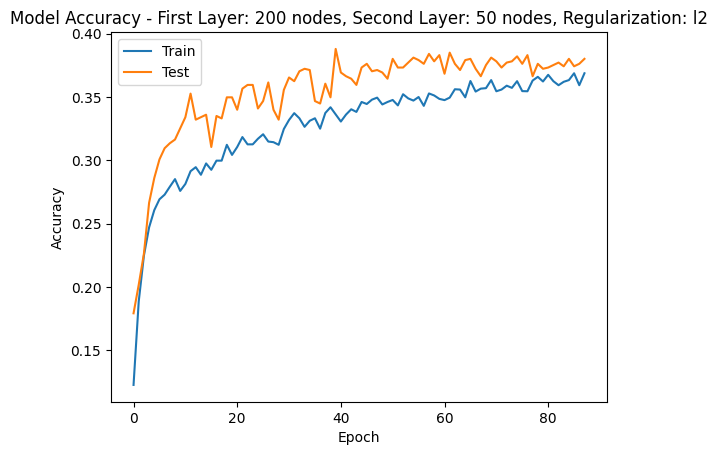

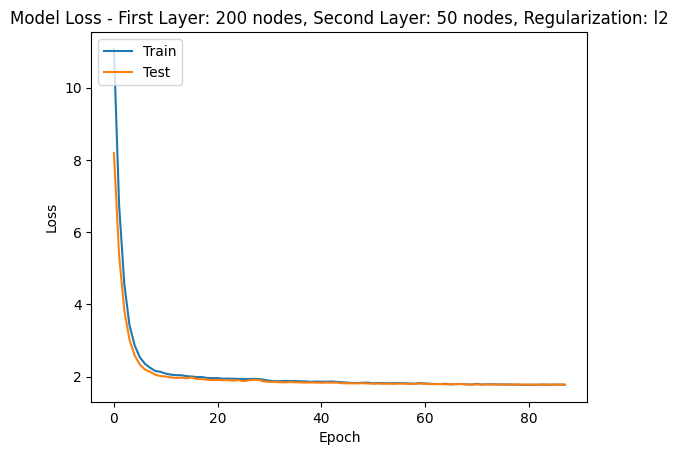

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l1 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.0980 - loss: 5.0617 - val_accuracy: 0.2184 - val_loss: 4.1109 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1994 - loss: 4.2048 - val_accuracy: 0.2772 - val_loss: 3.7418 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2195 - loss: 3.9746 - val_accuracy: 0.2929 - val_loss: 3.4865 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2385 - loss: 3.7432 - val_accuracy: 0.2948 - val_loss: 3.3305 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step accuracy: 0.2490 - loss: 3.5561 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.2493 - loss: 3.5496 - val_accuracy: 0.3036 - val_loss: 3.2070 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2628 - loss: 3.3811 - val_accuracy: 0.3066 -

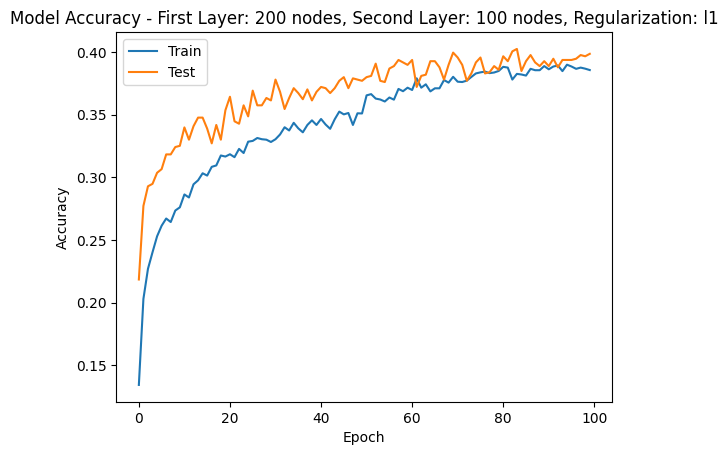

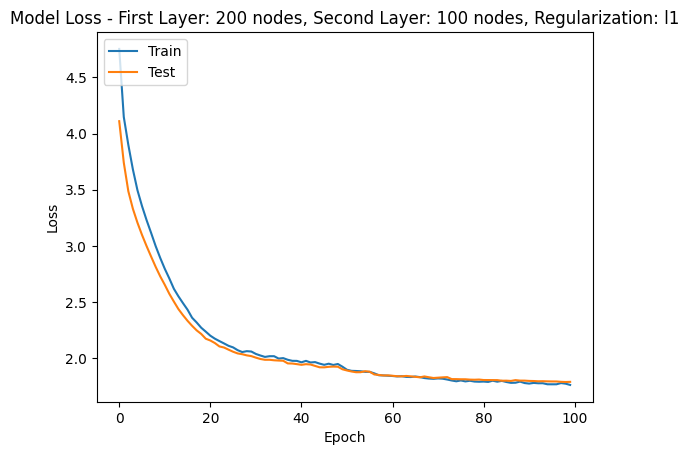

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l2 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1028 - loss: 3.5900 - val_accuracy: 0.2184 - val_loss: 2.6320 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1986 - loss: 2.8200 - val_accuracy: 0.2654 - val_loss: 2.3600 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2225 - loss: 2.5828 - val_accuracy: 0.2899 - val_loss: 2.1977 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2551 - loss: 2.4228 - val_accuracy: 0.3105 - val_loss: 2.1232 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step accuracy: 0.2469 - loss: 2.3877 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.2469 - loss: 2.3836 - val_accuracy: 0.3075 - val_loss: 2.0860 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2529 - loss: 2.3015 - val_accuracy: 0.3222 -

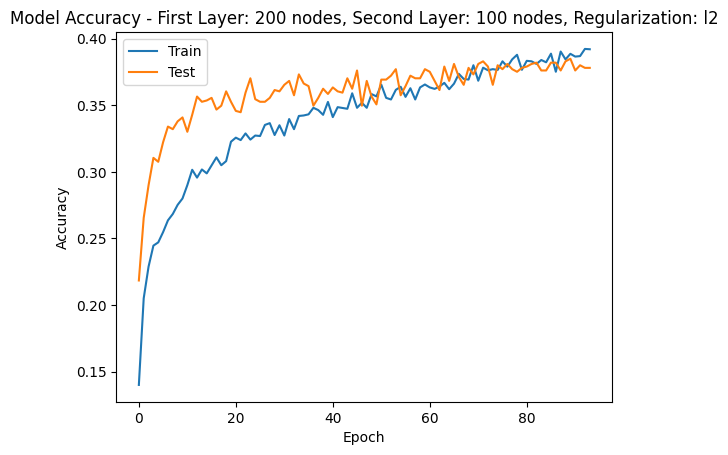

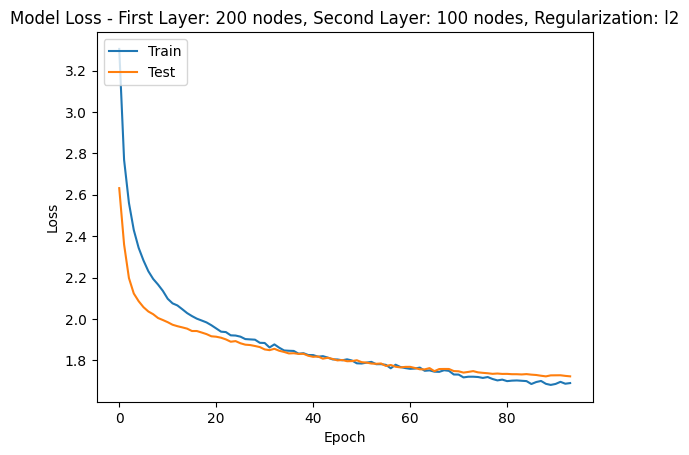

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l1 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 27s 7ms/step - accuracy: 0.1072 - loss: 11.3029 - val_accuracy: 0.2184 - val_loss: 9.1893 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1978 - loss: 9.0383 - val_accuracy: 0.2174 - val_loss: 7.5781 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2323 - loss: 7.4649 - val_accuracy: 0.2576 - val_loss: 6.2109 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2372 - loss: 6.1462 - val_accuracy: 0.2782 - val_loss: 5.1202 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2622 - loss: 5.0850 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2621 - loss: 5.0709 - val_accuracy: 0.2762 - val_loss: 4.2879 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2528 - loss: 4.3034 - val_accuracy: 0.2977

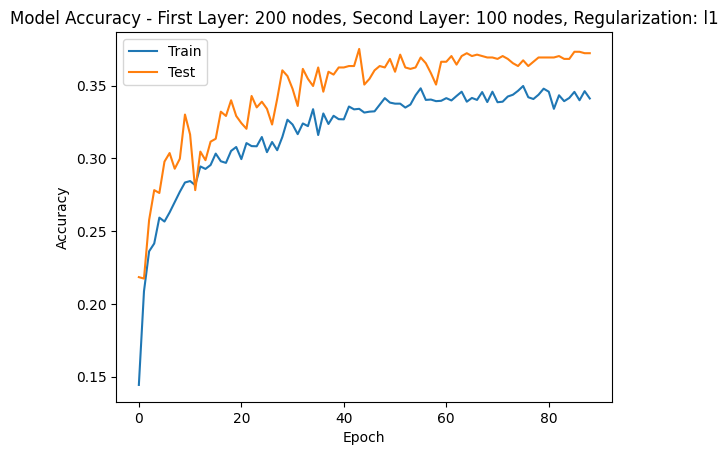

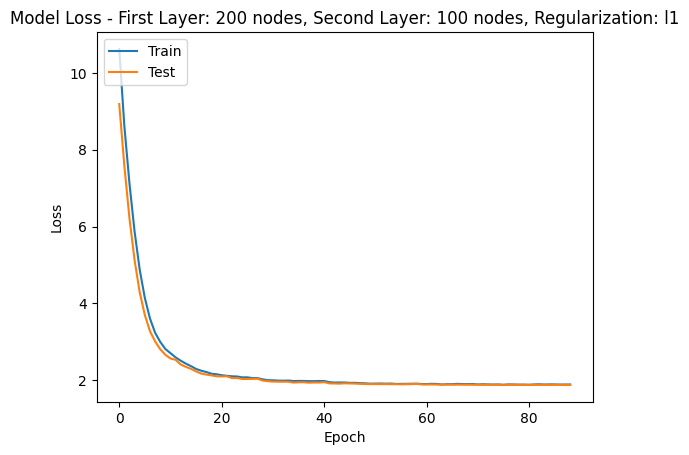

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l2 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.1091 - loss: 4.2433 - val_accuracy: 0.2302 - val_loss: 3.2124 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1967 - loss: 3.4016 - val_accuracy: 0.2507 - val_loss: 2.9141 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2313 - loss: 3.1226 - val_accuracy: 0.2723 - val_loss: 2.7003 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2350 - loss: 2.9466 - val_accuracy: 0.3134 - val_loss: 2.5800 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2526 - loss: 2.8115 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2526 - loss: 2.8111 - val_accuracy: 0.3026 - val_loss: 2.5055 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.2592 - loss: 2.6925 - val_accuracy: 0.3124 

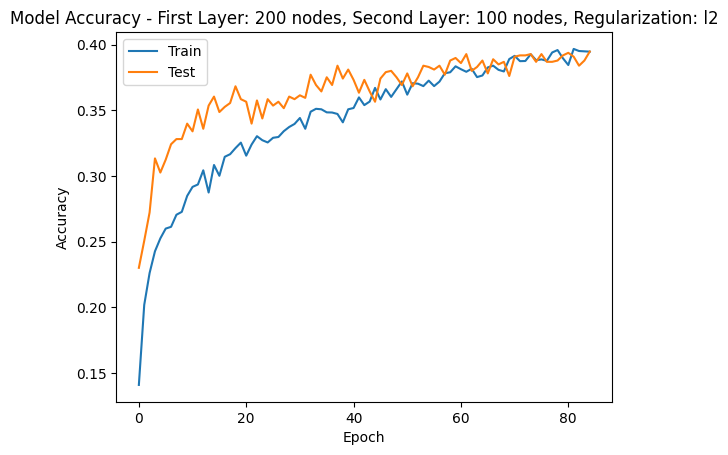

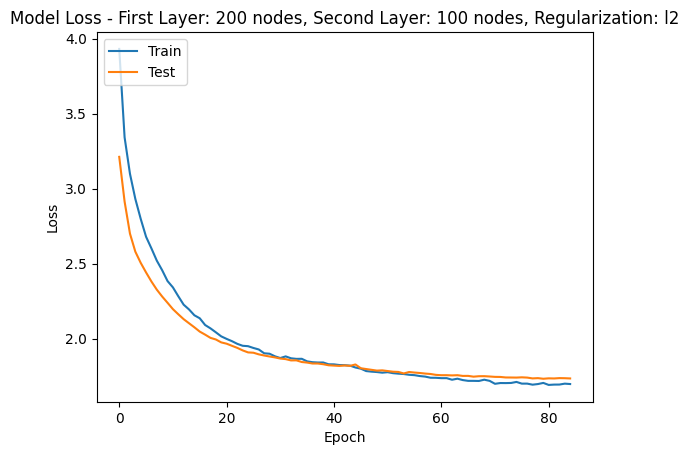

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l1 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.0996 - loss: 15.7825 - val_accuracy: 0.2135 - val_loss: 12.2425 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1906 - loss: 11.6779 - val_accuracy: 0.2360 - val_loss: 9.1364 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2224 - loss: 8.6589 - val_accuracy: 0.2488 - val_loss: 6.7535 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2420 - loss: 6.4747 - val_accuracy: 0.2595 - val_loss: 5.1141 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step   accuracy: 0.2595 - loss: 4.9821 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.2594 - loss: 4.9595 - val_accuracy: 0.2801 - val_loss: 4.0786 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2589 - loss: 4.0275 - val_accuracy: 0.29

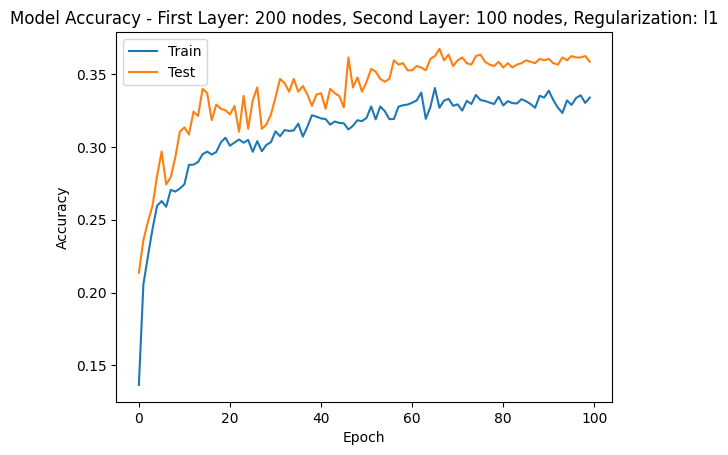

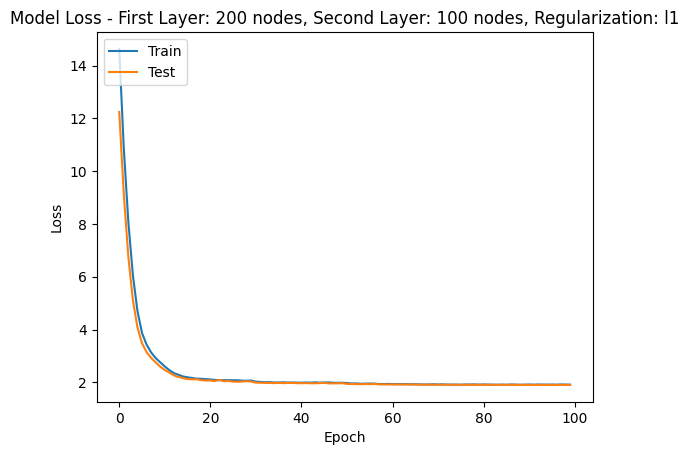

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l2 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.1041 - loss: 4.7524 - val_accuracy: 0.2292 - val_loss: 3.7338 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1900 - loss: 3.8933 - val_accuracy: 0.2419 - val_loss: 3.3460 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2228 - loss: 3.5202 - val_accuracy: 0.2860 - val_loss: 3.0515 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2440 - loss: 3.2557 - val_accuracy: 0.3173 - val_loss: 2.8693 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2588 - loss: 3.0530 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2585 - loss: 3.0520 - val_accuracy: 0.3066 - val_loss: 2.7422 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2584 - loss: 2.8782 - val_accuracy: 0.3144 -

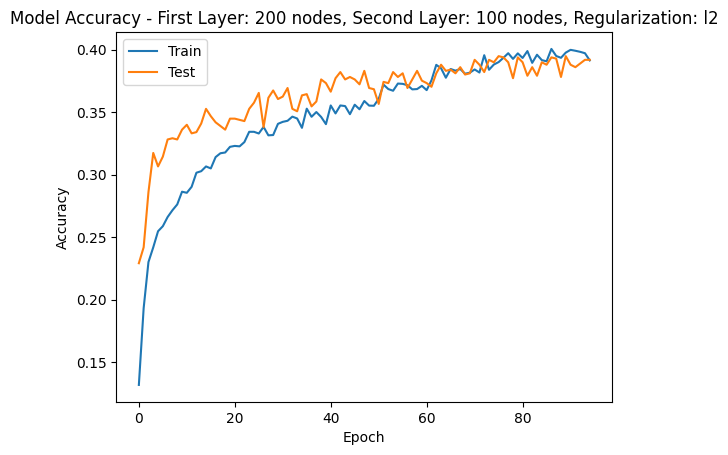

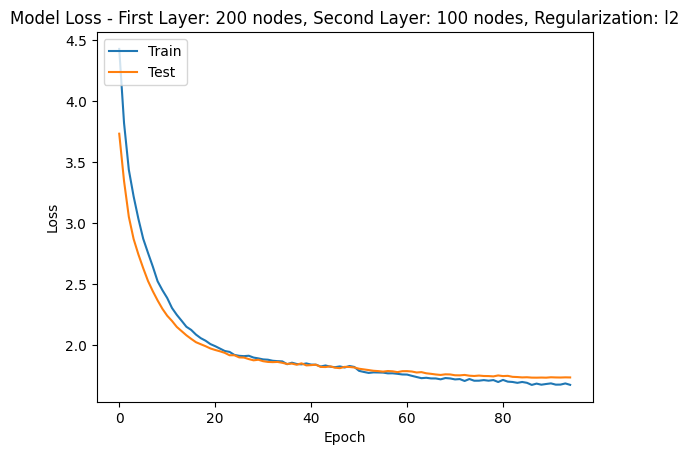

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l1 = 0.01...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.1198 - loss: 18.5648 - val_accuracy: 0.1939 - val_loss: 14.0685 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2008 - loss: 13.2247 - val_accuracy: 0.1988 - val_loss: 9.9607 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2197 - loss: 9.3450 - val_accuracy: 0.2174 - val_loss: 6.9938 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2497 - loss: 6.5786 - val_accuracy: 0.2380 - val_loss: 5.0952 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step   accuracy: 0.2488 - loss: 4.9307 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2489 - loss: 4.9011 - val_accuracy: 0.2547 - val_loss: 4.0680 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2568 - loss: 3.9801 - val_acc

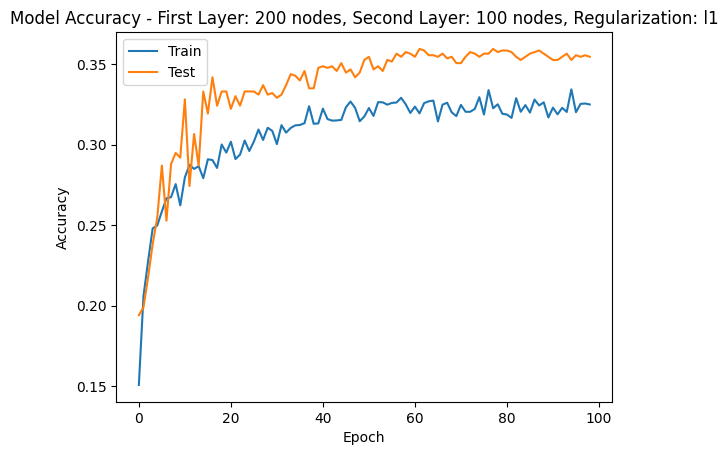

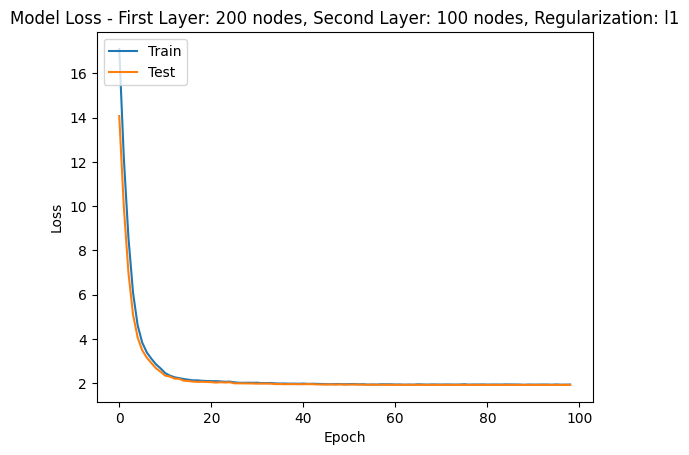

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l2 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.1063 - loss: 4.9523 - val_accuracy: 0.1959 - val_loss: 4.0215 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1987 - loss: 4.0742 - val_accuracy: 0.2272 - val_loss: 3.5644 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2292 - loss: 3.6450 - val_accuracy: 0.2752 - val_loss: 3.1931 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2391 - loss: 3.3913 - val_accuracy: 0.2948 - val_loss: 2.9557 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2512 - loss: 3.1587 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2511 - loss: 3.1508 - val_accuracy: 0.3134 - val_loss: 2.7822 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2639 - loss: 2.9324 - val_accuracy: 0.3144 -

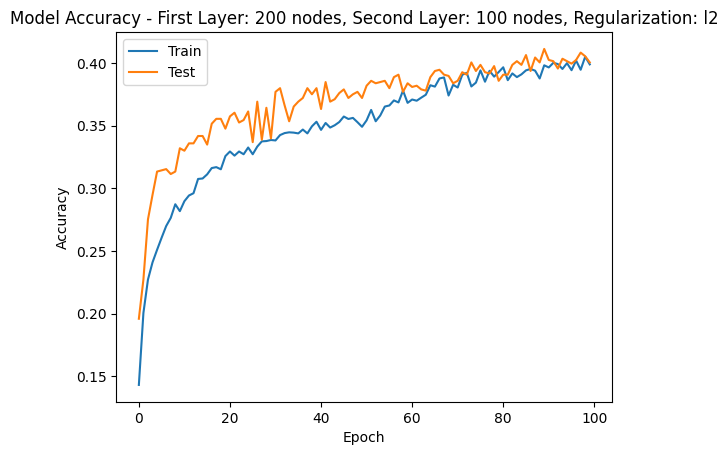

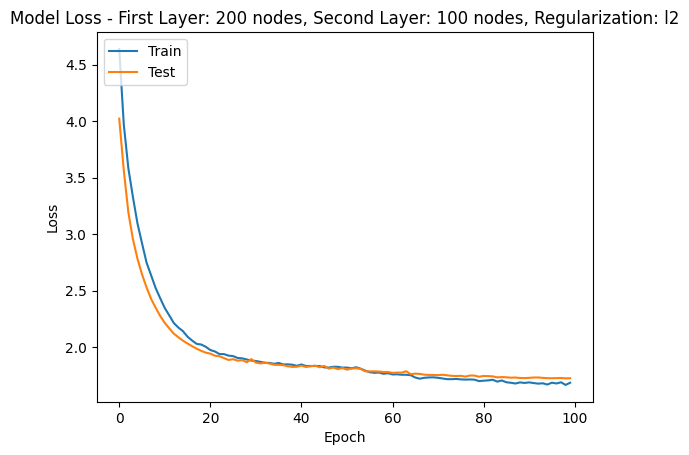

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l1 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.0900 - loss: 71.1879 - val_accuracy: 0.1146 - val_loss: 35.6007 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1777 - loss: 28.1123 - val_accuracy: 0.1890 - val_loss: 11.6676 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2182 - loss: 9.3229 - val_accuracy: 0.1665 - val_loss: 5.6602 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2486 - loss: 4.7189 - val_accuracy: 0.1734 - val_loss: 3.6097 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2624 - loss: 3.0537 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2622 - loss: 3.0357 - val_accuracy: 0.1978 - val_loss: 2.7631 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2614 - loss: 2.4874 - val_accuracy: 0.24

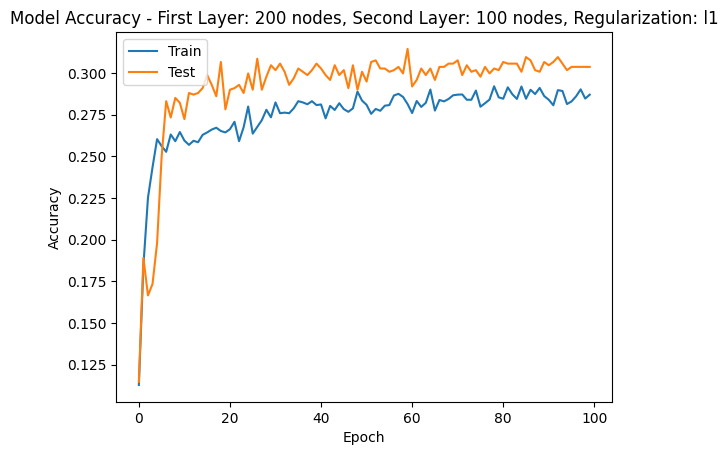

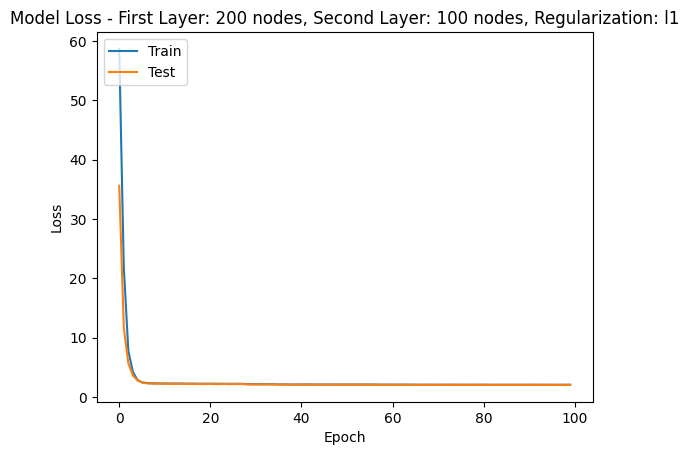

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l2 = 0.05...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.1113 - loss: 10.6057 - val_accuracy: 0.2243 - val_loss: 7.6135 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1988 - loss: 7.2408 - val_accuracy: 0.2390 - val_loss: 5.5396 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2325 - loss: 5.3206 - val_accuracy: 0.2840 - val_loss: 4.2035 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2479 - loss: 4.1752 - val_accuracy: 0.2674 - val_loss: 3.4123 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step   accuracy: 0.2537 - loss: 3.4621 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.2548 - loss: 3.4469 - val_accuracy: 0.2968 - val_loss: 2.9236 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2597 - loss: 2.9863 - val_accu

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2854 - loss: 2.2009 - val_accuracy: 0.3262 - val_loss: 2.0994 - learning_rate: 5.0000e-04
Epoch 12/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2975 - loss: 2.1314 - val_accuracy: 0.3340 - val_loss: 2.0469 - learning_rate: 5.0000e-04
Epoch 13/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3140 - loss: 2.1003 - val_accuracy: 0.3330 - val_loss: 2.0262 - learning_rate: 5.0000e-04
Epoch 14/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2934 - loss: 2.1001 - val_accuracy: 0.3526 - val_loss: 2.0002 - learning_rate: 5.0000e-04
Epoch 15/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3045 - loss: 2.0606 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.3046 - loss: 2.0606 - val_accuracy: 0.3291 - val_loss: 1.9967 - learning_rate: 5.0000e-04
Epoch 16/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3117 - loss: 2.0271 - val_accuracy: 0.3

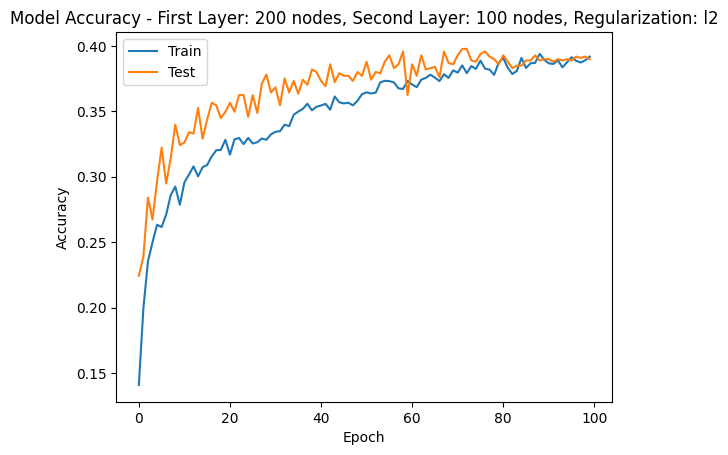

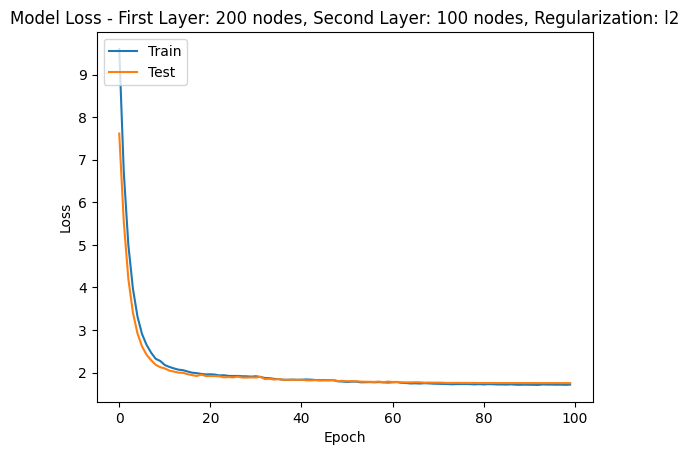

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l1 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.0775 - loss: 136.6119 - val_accuracy: 0.1312 - val_loss: 59.2668 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1509 - loss: 43.4768 - val_accuracy: 0.1156 - val_loss: 11.2144 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2236 - loss: 7.9437 - val_accuracy: 0.1557 - val_loss: 3.7860 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2555 - loss: 3.0336 - val_accuracy: 0.1371 - val_loss: 2.8818 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2498 - loss: 2.5206 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2497 - loss: 2.5201 - val_accuracy: 0.1851 - val_loss: 2.6049 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2520 - loss: 2.4312 - val_accuracy: 0.2

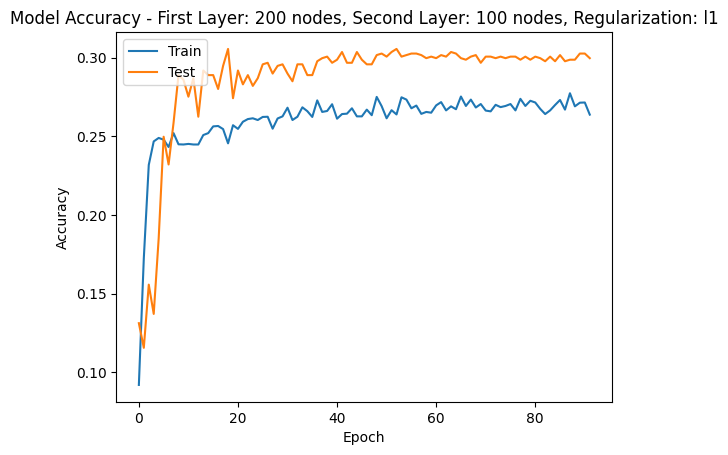

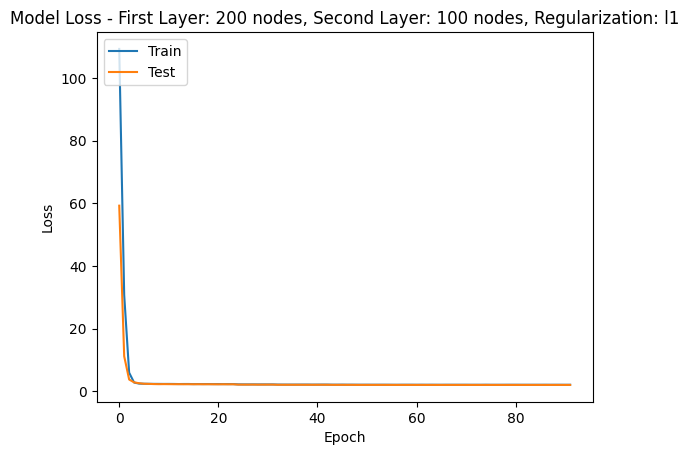

Testing model with first layer: 200 nodes, second layer: 100 nodes, regularization: l2 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.1114 - loss: 16.6400 - val_accuracy: 0.2351 - val_loss: 9.8895 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2031 - loss: 8.8574 - val_accuracy: 0.2449 - val_loss: 5.9008 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2280 - loss: 5.4469 - val_accuracy: 0.2595 - val_loss: 4.0550 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2477 - loss: 3.8510 - val_accuracy: 0.2752 - val_loss: 3.1485 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2537 - loss: 3.0973 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2539 - loss: 3.0869 - val_accuracy: 0.2977 - val_loss: 2.6562 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2715 - loss: 2.6882 - val_accuracy: 0.3164 

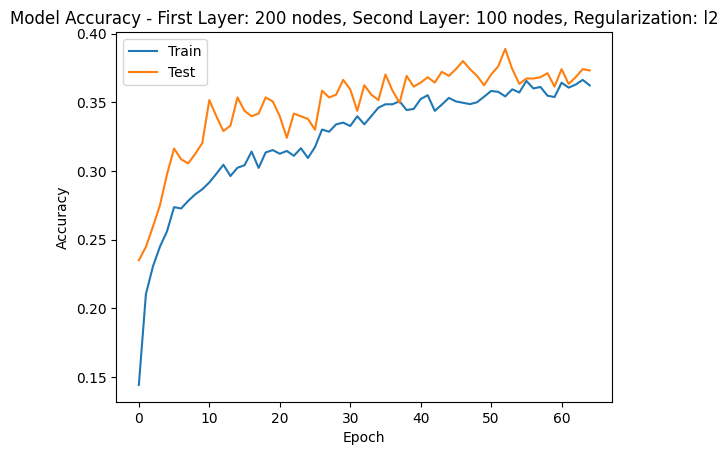

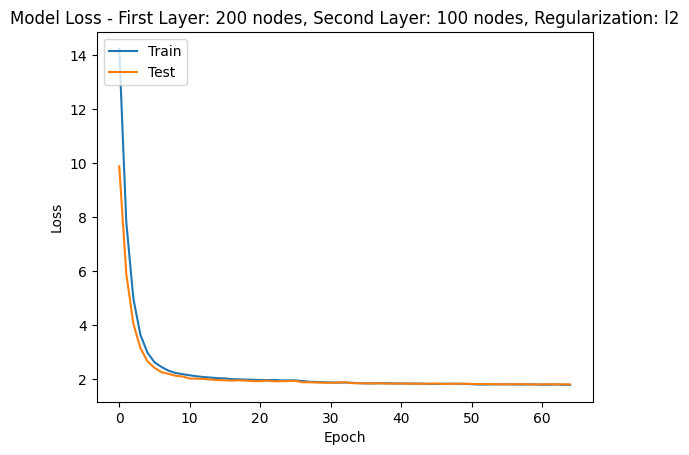

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l1 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1050 - loss: 4.9066 - val_accuracy: 0.1832 - val_loss: 4.2493 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2065 - loss: 4.1265 - val_accuracy: 0.2214 - val_loss: 3.8981 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2363 - loss: 3.8223 - val_accuracy: 0.2654 - val_loss: 3.5390 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2502 - loss: 3.5676 - val_accuracy: 0.2850 - val_loss: 3.2662 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2619 - loss: 3.3756 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2618 - loss: 3.3714 - val_accuracy: 0.2987 - val_loss: 3.0860 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2699 - loss: 3.1930 - val_accuracy: 0.3222 -

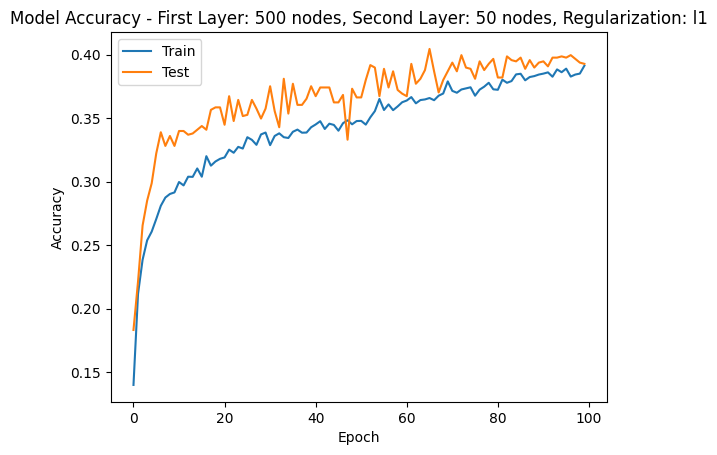

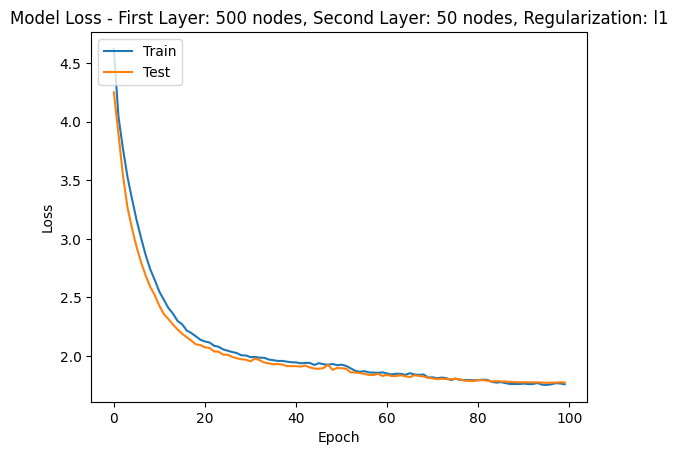

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l2 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.1135 - loss: 3.4626 - val_accuracy: 0.1538 - val_loss: 2.6939 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.1947 - loss: 2.7175 - val_accuracy: 0.2047 - val_loss: 2.4488 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2403 - loss: 2.4710 - val_accuracy: 0.2782 - val_loss: 2.2449 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.2427 - loss: 2.3746 - val_accuracy: 0.3075 - val_loss: 2.1175 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step   accuracy: 0.2590 - loss: 2.2794 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.2591 - loss: 2.2783 - val_accuracy: 0.3252 - val_loss: 2.0507 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2576 - loss: 2.2369 - val_accuracy: 0.3310 

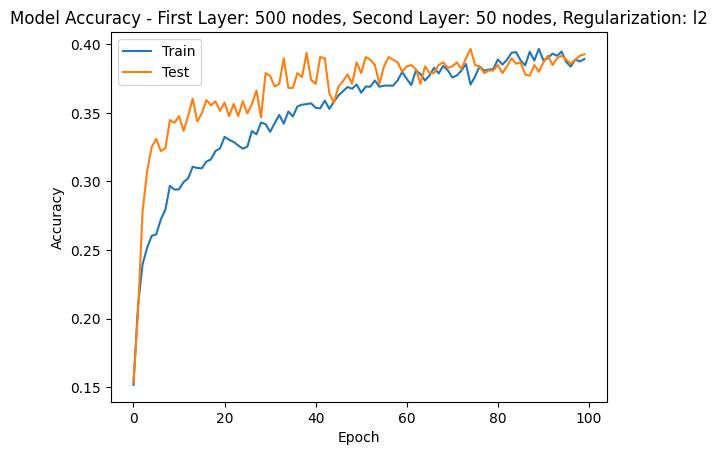

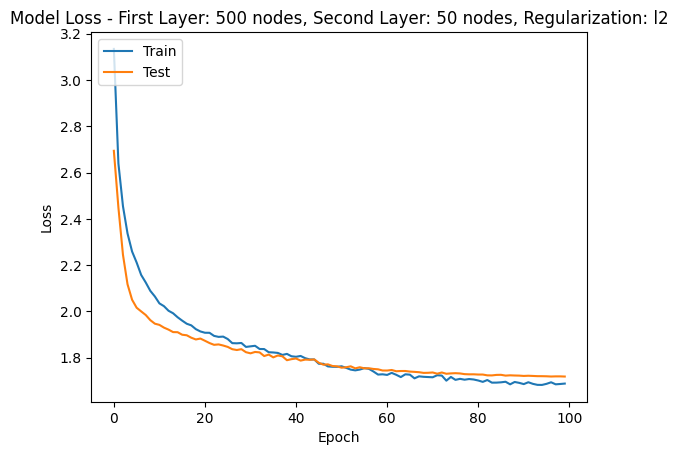

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l1 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1154 - loss: 11.1005 - val_accuracy: 0.1391 - val_loss: 9.1648 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2060 - loss: 8.5619 - val_accuracy: 0.2008 - val_loss: 7.2179 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2374 - loss: 6.6195 - val_accuracy: 0.2625 - val_loss: 5.5429 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2450 - loss: 5.1879 - val_accuracy: 0.2772 - val_loss: 4.3491 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step   accuracy: 0.2590 - loss: 4.1436 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.2589 - loss: 4.1395 - val_accuracy: 0.2615 - val_loss: 3.6255 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2616 - loss: 3.5260 - val_accuracy: 0.2850

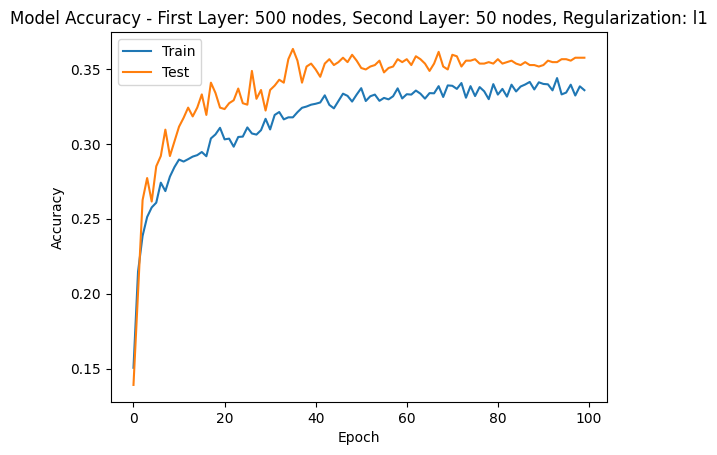

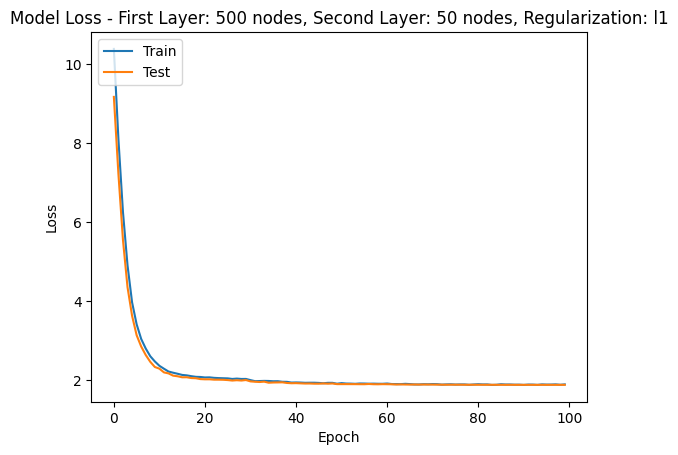

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l2 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.1112 - loss: 3.8270 - val_accuracy: 0.2282 - val_loss: 3.1073 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2027 - loss: 3.1181 - val_accuracy: 0.2547 - val_loss: 2.8414 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2263 - loss: 2.8761 - val_accuracy: 0.2791 - val_loss: 2.6074 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2570 - loss: 2.7014 - val_accuracy: 0.2977 - val_loss: 2.4631 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2523 - loss: 2.5737 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2532 - loss: 2.5710 - val_accuracy: 0.3046 - val_loss: 2.3625 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2679 - loss: 2.4827 - val_accuracy: 0.3301 -

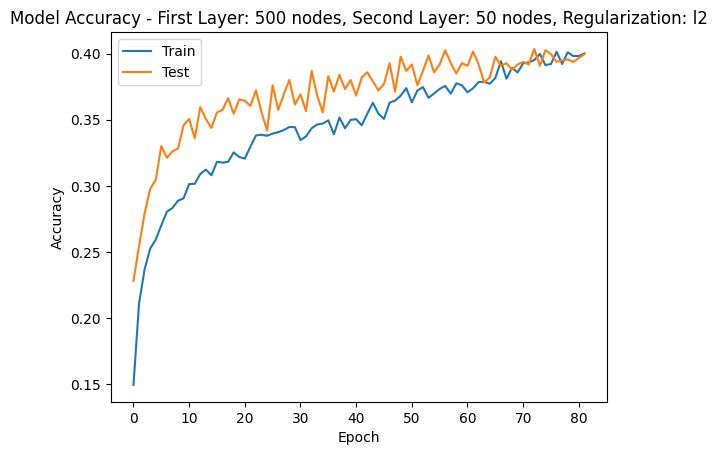

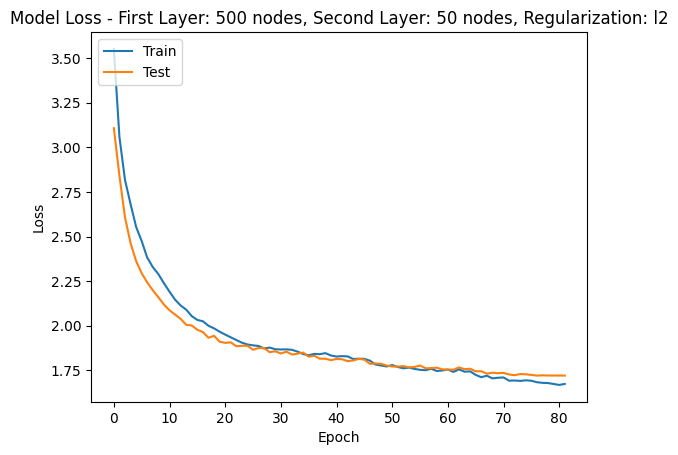

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l1 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.1161 - loss: 15.5447 - val_accuracy: 0.1440 - val_loss: 11.5895 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2077 - loss: 10.5492 - val_accuracy: 0.2321 - val_loss: 7.7700 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2409 - loss: 6.9838 - val_accuracy: 0.2782 - val_loss: 5.2774 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2468 - loss: 4.8382 - val_accuracy: 0.2742 - val_loss: 3.9567 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2640 - loss: 3.7194 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2637 - loss: 3.7109 - val_accuracy: 0.2889 - val_loss: 3.2315 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2653 - loss: 3.1433 - val_accuracy: 0.277

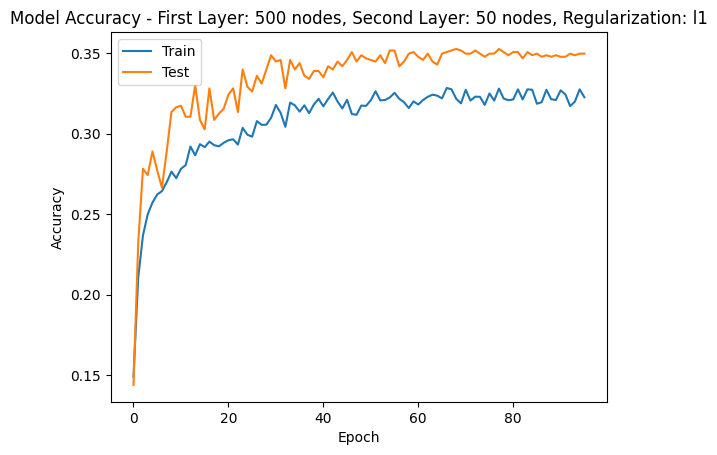

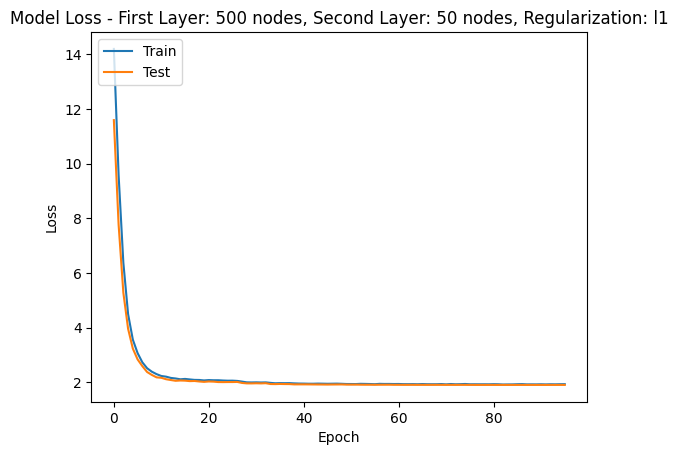

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l2 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1063 - loss: 4.2704 - val_accuracy: 0.1734 - val_loss: 3.4543 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2053 - loss: 3.4119 - val_accuracy: 0.2615 - val_loss: 3.1084 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2356 - loss: 3.1074 - val_accuracy: 0.2840 - val_loss: 2.8277 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2463 - loss: 2.9257 - val_accuracy: 0.3115 - val_loss: 2.6167 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2622 - loss: 2.7569 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2618 - loss: 2.7542 - val_accuracy: 0.3291 - val_loss: 2.4746 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2603 - loss: 2.6171 - val_accuracy: 0.3350 -

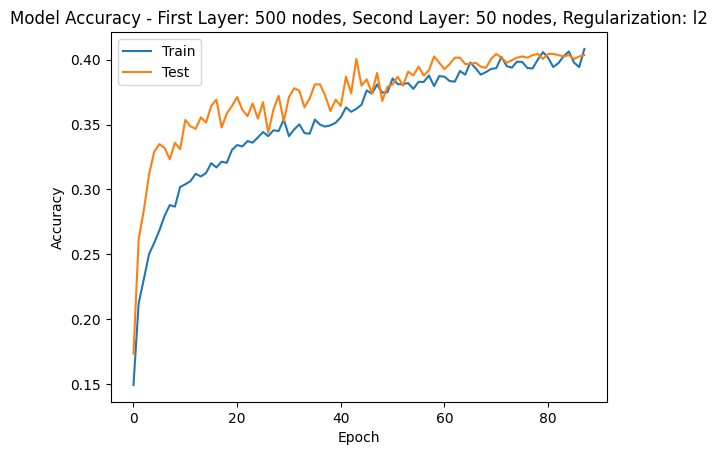

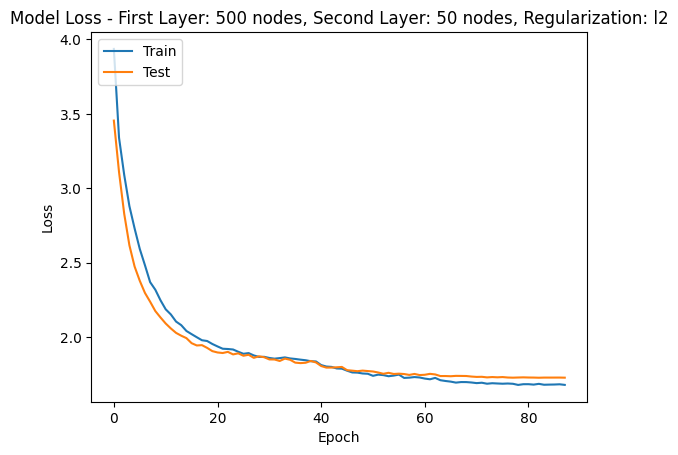

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l1 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.1179 - loss: 18.3568 - val_accuracy: 0.0676 - val_loss: 13.2843 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1960 - loss: 11.8700 - val_accuracy: 0.1822 - val_loss: 8.3868 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2409 - loss: 7.3517 - val_accuracy: 0.1978 - val_loss: 5.4366 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2450 - loss: 4.8781 - val_accuracy: 0.2272 - val_loss: 4.0342 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2605 - loss: 3.7495 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2603 - loss: 3.7360 - val_accuracy: 0.2468 - val_loss: 3.2945 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2618 - loss: 3.1150 - val_accuracy: 0.279

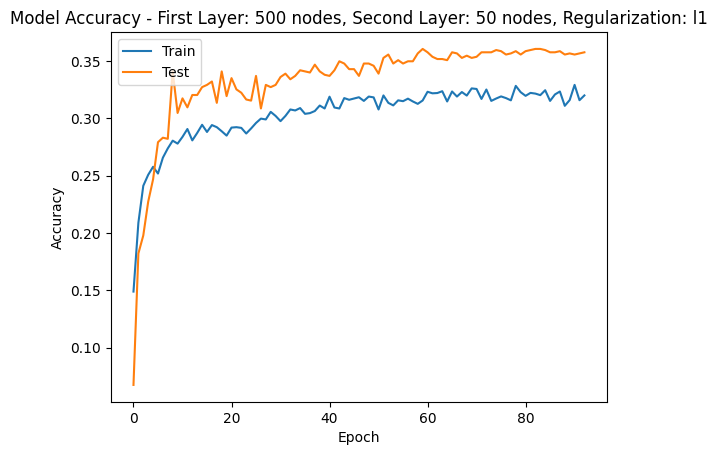

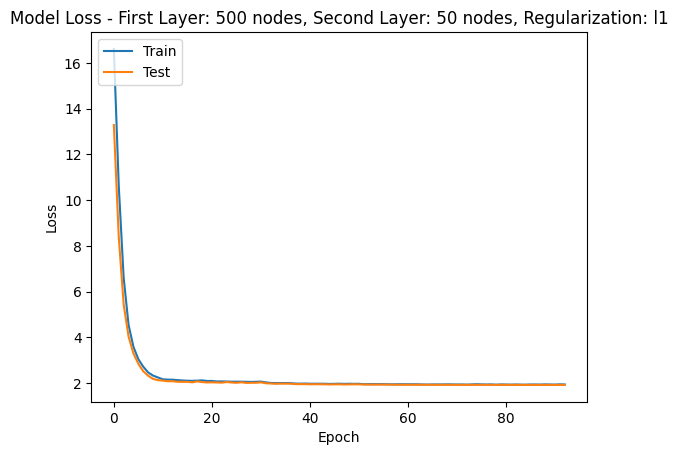

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l2 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.1177 - loss: 4.4011 - val_accuracy: 0.0784 - val_loss: 3.8043 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1968 - loss: 3.6341 - val_accuracy: 0.2067 - val_loss: 3.4181 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2353 - loss: 3.2678 - val_accuracy: 0.2537 - val_loss: 3.0268 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2394 - loss: 3.0500 - val_accuracy: 0.2899 - val_loss: 2.7490 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2622 - loss: 2.8357 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2621 - loss: 2.8329 - val_accuracy: 0.3173 - val_loss: 2.5604 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2680 - loss: 2.6757 - val_accuracy: 0.3193 -

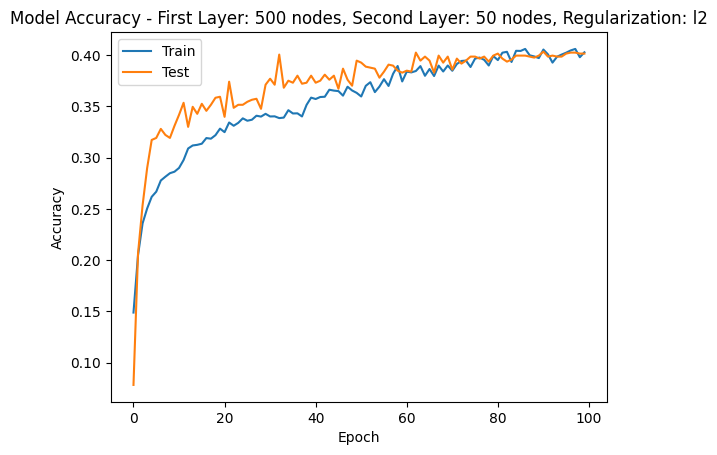

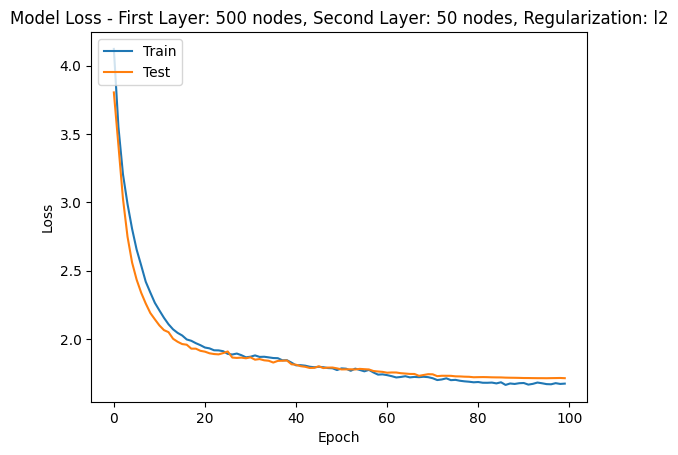

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l1 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.0930 - loss: 68.7267 - val_accuracy: 0.0666 - val_loss: 26.3278 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1890 - loss: 19.0250 - val_accuracy: 0.0558 - val_loss: 6.5923 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2209 - loss: 5.1890 - val_accuracy: 0.1440 - val_loss: 3.3654 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2532 - loss: 2.7216 - val_accuracy: 0.1489 - val_loss: 2.7872 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step   accuracy: 0.2423 - loss: 2.4274 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.2428 - loss: 2.4251 - val_accuracy: 0.2174 - val_loss: 2.5349 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2490 - loss: 2.3698 - val_accuracy: 0.27

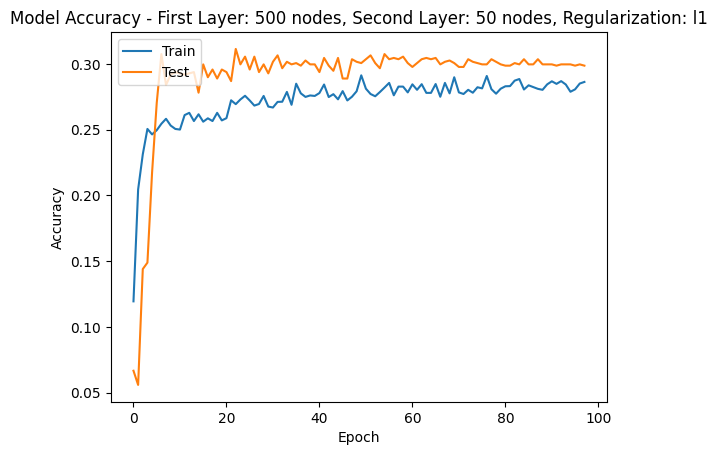

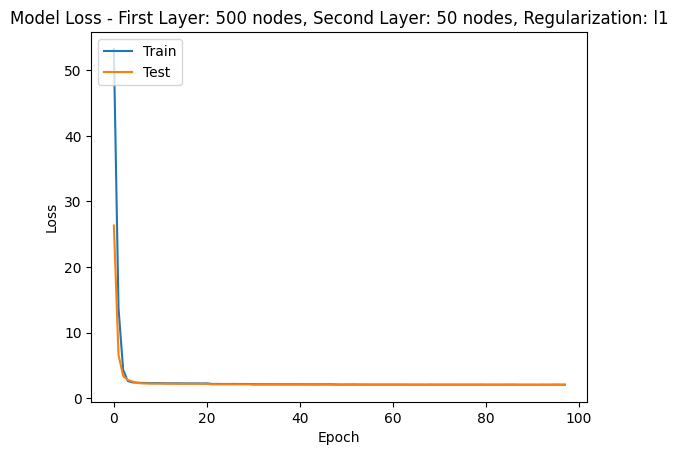

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l2 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.1288 - loss: 8.3729 - val_accuracy: 0.1939 - val_loss: 6.1594 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2104 - loss: 5.6807 - val_accuracy: 0.2380 - val_loss: 4.5168 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2246 - loss: 4.2171 - val_accuracy: 0.2400 - val_loss: 3.5040 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2570 - loss: 3.3330 - val_accuracy: 0.2654 - val_loss: 2.8933 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step accuracy: 0.2770 - loss: 2.8164 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.2767 - loss: 2.8137 - val_accuracy: 0.2860 - val_loss: 2.5204 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2749 - loss: 2.5286 - val_accuracy: 0.2987 -

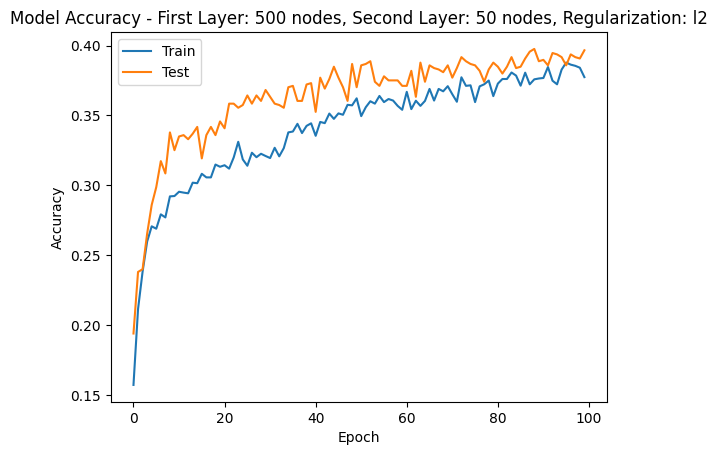

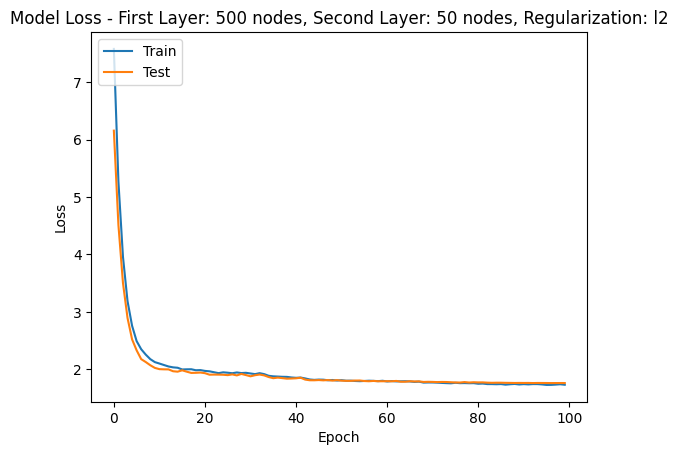

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l1 = 0.1...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.0909 - loss: 127.4425 - val_accuracy: 0.1195 - val_loss: 35.7984 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1771 - loss: 22.2043 - val_accuracy: 0.1214 - val_loss: 4.1109 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2330 - loss: 3.1357 - val_accuracy: 0.1342 - val_loss: 2.9692 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2442 - loss: 2.5601 - val_accuracy: 0.1459 - val_loss: 2.8139 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2394 - loss: 2.5082 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2395 - loss: 2.5083 - val_accuracy: 0.1822 - val_loss: 2.6516 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2492 - loss: 2.4714 - val_accuracy: 0.29

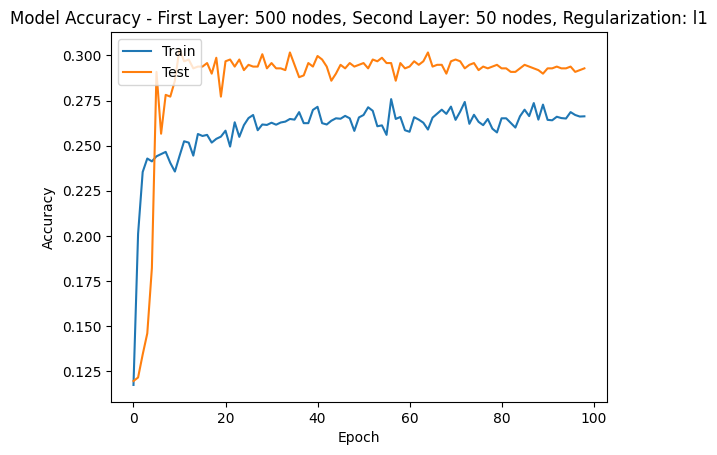

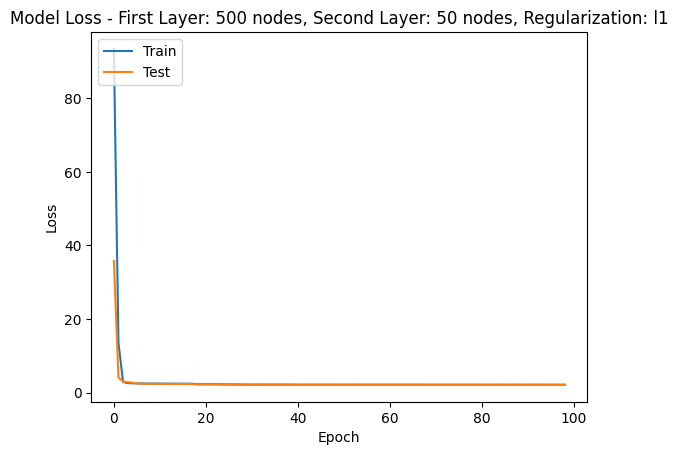

Testing model with first layer: 500 nodes, second layer: 50 nodes, regularization: l2 = 0.1...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.1053 - loss: 12.9704 - val_accuracy: 0.1028 - val_loss: 7.7921 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2012 - loss: 6.7756 - val_accuracy: 0.1616 - val_loss: 4.7851 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2257 - loss: 4.2340 - val_accuracy: 0.2184 - val_loss: 3.4399 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2577 - loss: 3.1340 - val_accuracy: 0.2644 - val_loss: 2.7714 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2717 - loss: 2.6369 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2716 - loss: 2.6362 - val_accuracy: 0.2772 - val_loss: 2.4303 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2847 - loss: 2.4281 - val_accur

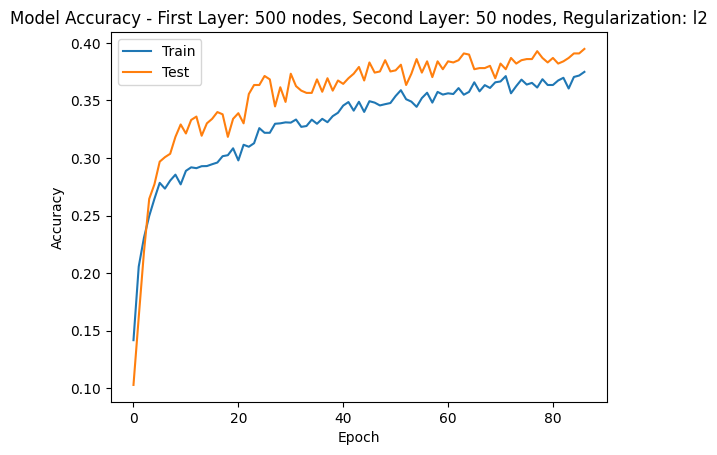

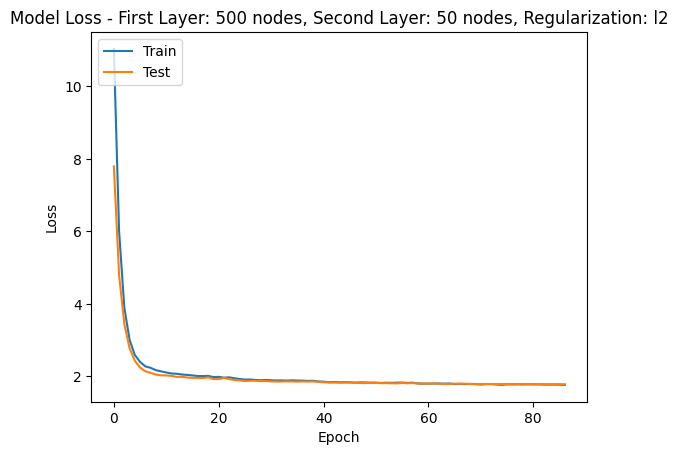

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l1 = 0.001...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.1223 - loss: 6.0760 - val_accuracy: 0.2341 - val_loss: 5.1091 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2248 - loss: 5.1416 - val_accuracy: 0.2782 - val_loss: 4.6660 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2393 - loss: 4.7298 - val_accuracy: 0.2938 - val_loss: 4.2740 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2600 - loss: 4.3605 - val_accuracy: 0.3173 - val_loss: 3.9504 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step   accuracy: 0.2610 - loss: 4.0684 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.2610 - loss: 4.0679 - val_accuracy: 0.3242 - val_loss: 3.6657 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2622 - loss: 3.8169 - val_accur

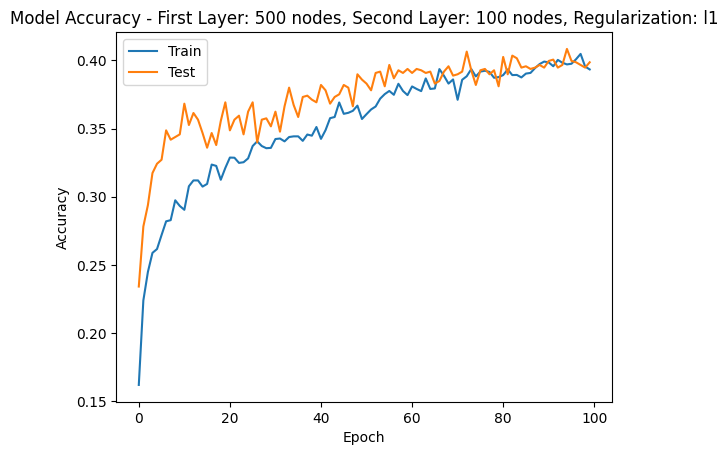

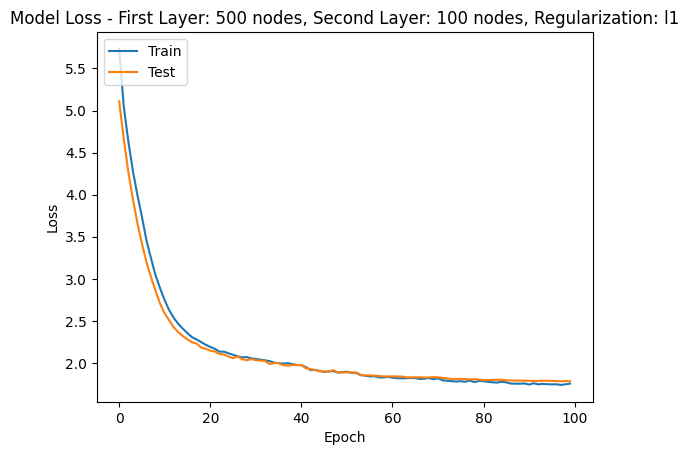

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l2 = 0.001...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.1306 - loss: 3.4635 - val_accuracy: 0.2321 - val_loss: 2.6418 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2192 - loss: 2.7056 - val_accuracy: 0.2390 - val_loss: 2.4065 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2467 - loss: 2.5237 - val_accuracy: 0.2762 - val_loss: 2.2254 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2636 - loss: 2.3968 - val_accuracy: 0.3026 - val_loss: 2.1274 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step   accuracy: 0.2628 - loss: 2.3323 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.2628 - loss: 2.3319 - val_accuracy: 0.3173 - val_loss: 2.0940 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2791 - loss: 2.2593 - val_accuracy: 0.3291

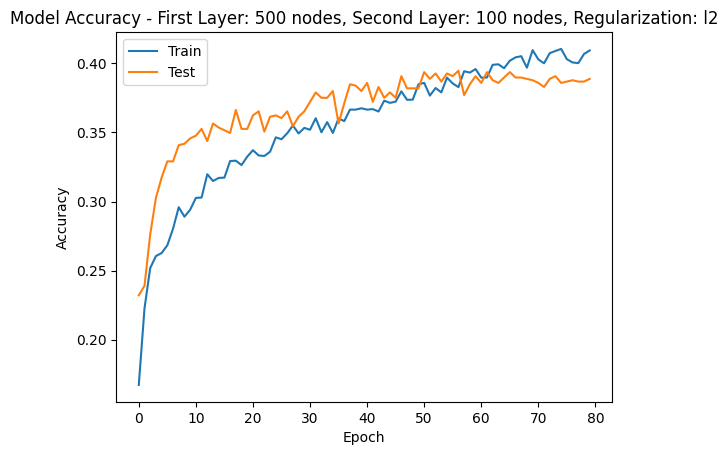

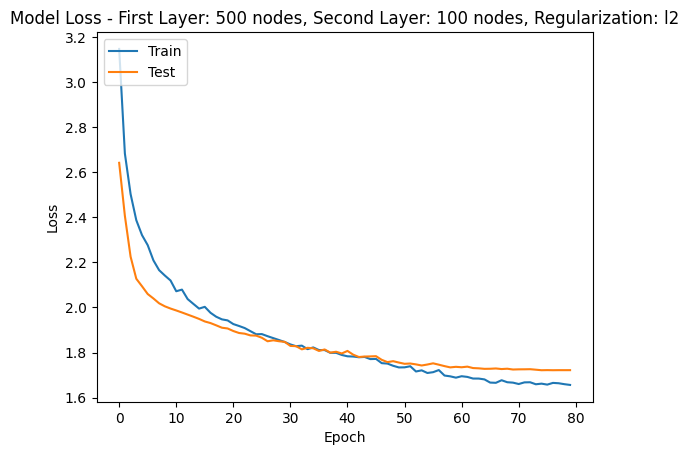

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l1 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.1287 - loss: 16.5386 - val_accuracy: 0.1557 - val_loss: 12.7944 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2117 - loss: 11.8707 - val_accuracy: 0.1753 - val_loss: 9.0548 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2417 - loss: 8.3354 - val_accuracy: 0.2145 - val_loss: 6.3015 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2645 - loss: 5.8343 - val_accuracy: 0.2429 - val_loss: 4.6722 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2699 - loss: 4.4589 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2691 - loss: 4.4383 - val_accuracy: 0.2811 - val_loss: 3.7963 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2610 - loss: 3.7414 - val_accuracy: 0.292

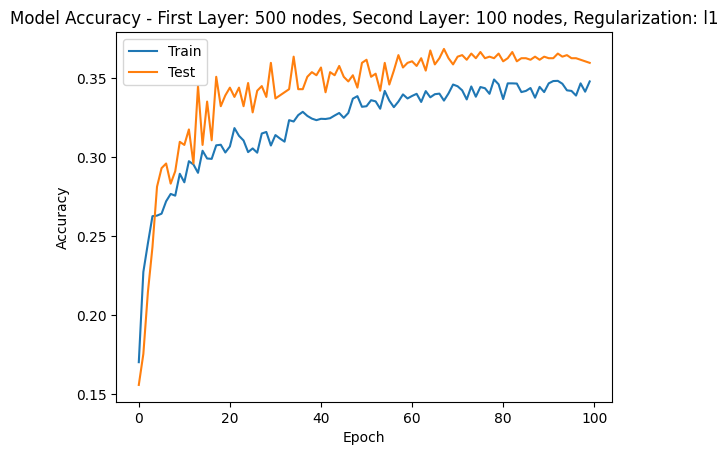

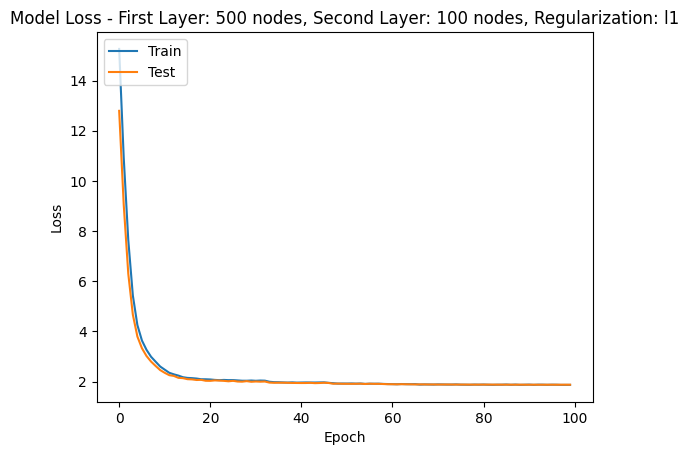

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l2 = 0.005...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.1326 - loss: 4.2556 - val_accuracy: 0.1489 - val_loss: 3.5445 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2137 - loss: 3.4358 - val_accuracy: 0.2380 - val_loss: 3.1936 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2397 - loss: 3.1697 - val_accuracy: 0.2762 - val_loss: 2.8806 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2564 - loss: 2.9636 - val_accuracy: 0.2997 - val_loss: 2.6767 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2729 - loss: 2.8004 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2727 - loss: 2.8001 - val_accuracy: 0.3085 - val_loss: 2.5520 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2835 - loss: 2.7170 - val_accuracy: 0.3232 -

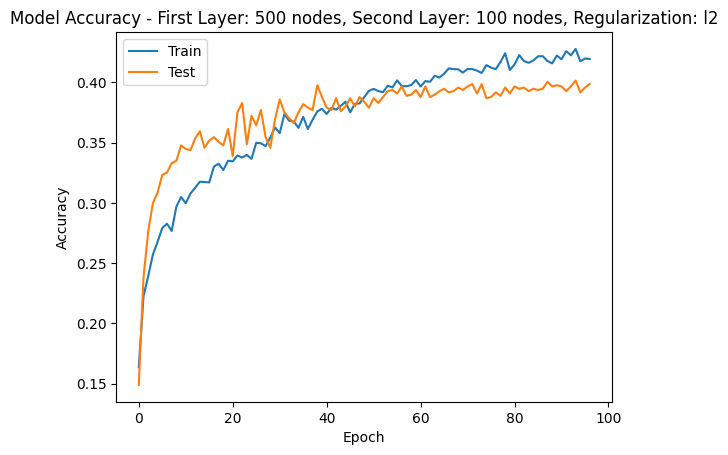

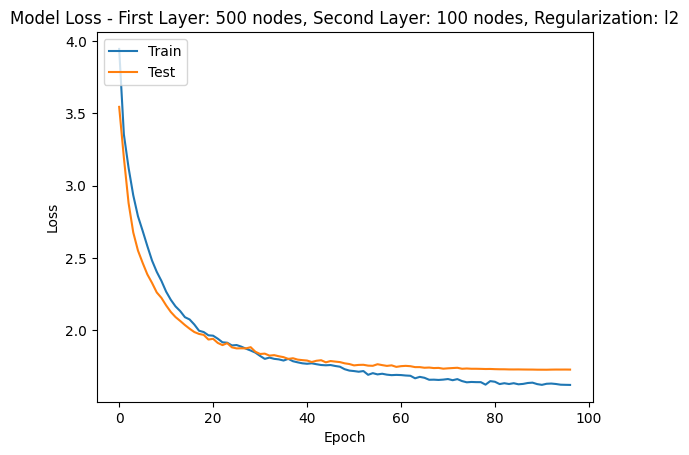

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l1 = 0.008...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.1250 - loss: 23.7541 - val_accuracy: 0.1303 - val_loss: 16.2860 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2154 - loss: 14.4183 - val_accuracy: 0.1361 - val_loss: 9.6120 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2370 - loss: 8.4137 - val_accuracy: 0.1636 - val_loss: 5.9728 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2675 - loss: 5.3797 - val_accuracy: 0.1939 - val_loss: 4.4140 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2609 - loss: 4.2060 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2609 - loss: 4.1987 - val_accuracy: 0.2468 - val_loss: 3.7204 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2663 - loss: 3.6249 - val_acc

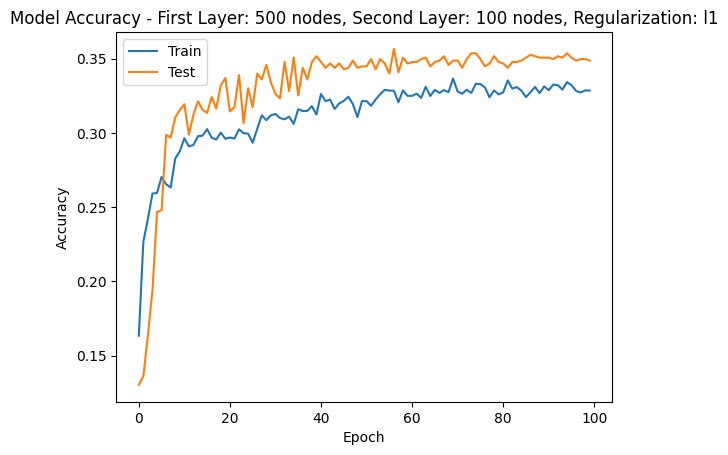

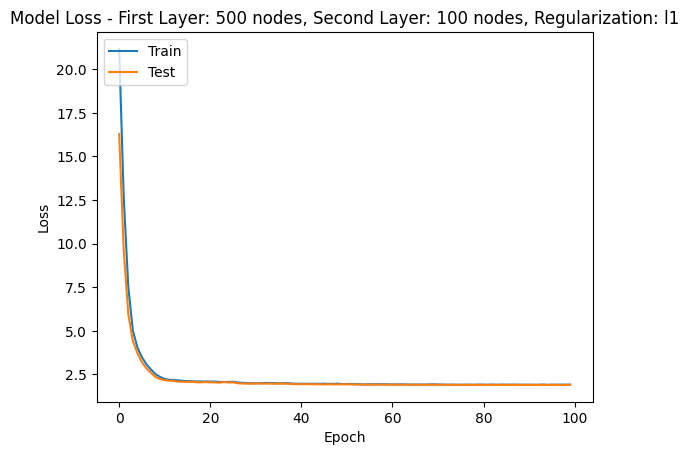

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l2 = 0.008...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.1306 - loss: 4.7856 - val_accuracy: 0.1802 - val_loss: 3.8974 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2121 - loss: 3.8823 - val_accuracy: 0.2214 - val_loss: 3.4943 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2481 - loss: 3.5085 - val_accuracy: 0.2811 - val_loss: 3.1336 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2464 - loss: 3.2464 - val_accuracy: 0.3193 - val_loss: 2.8842 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2817 - loss: 3.0099 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.2814 - loss: 3.0084 - val_accuracy: 0.3467 - val_loss: 2.7080 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2842 - loss: 2.8327 - val_accuracy: 0.3457 -

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3947 - loss: 1.7641 - val_accuracy: 0.4025 - val_loss: 1.7903 - learning_rate: 2.5000e-04
Epoch 47/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3915 - loss: 1.7514 - val_accuracy: 0.3928 - val_loss: 1.7889 - learning_rate: 2.5000e-04
Epoch 48/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3874 - loss: 1.7577 - val_accuracy: 0.3947 - val_loss: 1.7864 - learning_rate: 2.5000e-04
Epoch 49/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3669 - loss: 1.7644 - val_accuracy: 0.3947 - val_loss: 1.7942 - learning_rate: 2.5000e-04
Epoch 50/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step accuracy: 0.3802 - loss: 1.7483 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.3800 - loss: 1.7496 - val_accuracy: 0.3800 - val_loss: 1.7794 - learning_rate: 2.5000e-04
Epoch 51/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3786 - loss: 1.7418 - val_accuracy: 0.3

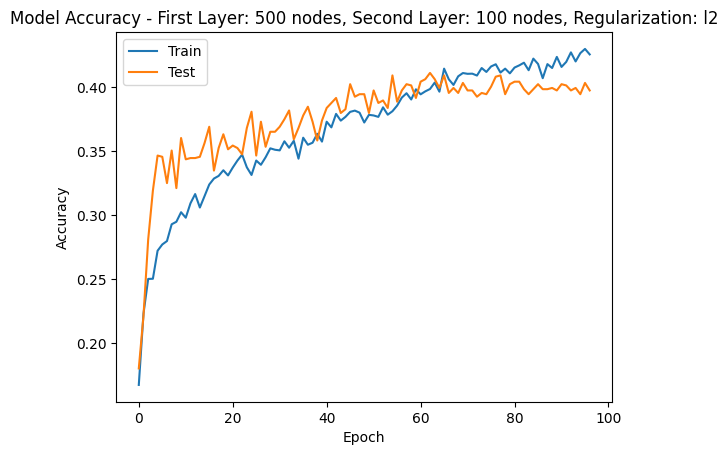

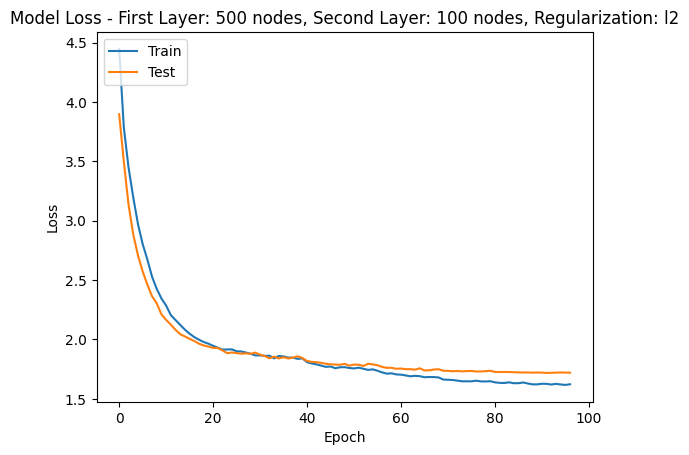

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l1 = 0.01...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.1296 - loss: 28.3875 - val_accuracy: 0.2262 - val_loss: 18.1984 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2102 - loss: 15.7191 - val_accuracy: 0.2321 - val_loss: 9.6839 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2283 - loss: 8.3922 - val_accuracy: 0.2243 - val_loss: 5.7868 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2515 - loss: 5.2721 - val_accuracy: 0.2253 - val_loss: 4.3594 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 37s 2ms/step    curacy: 0.2514 - loss: 4.1765 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 38s 300ms/step - accuracy: 0.2521 - loss: 4.1558 - val_accuracy: 0.2615 - val_loss: 3.6176 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2606 - loss: 3.5308 - val_accuracy: 0.

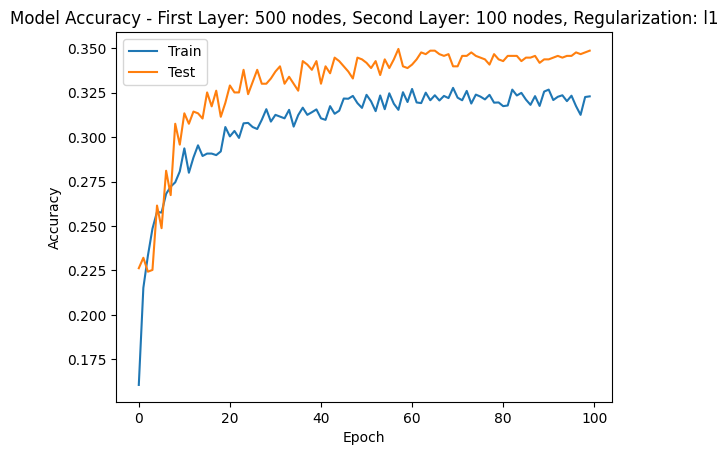

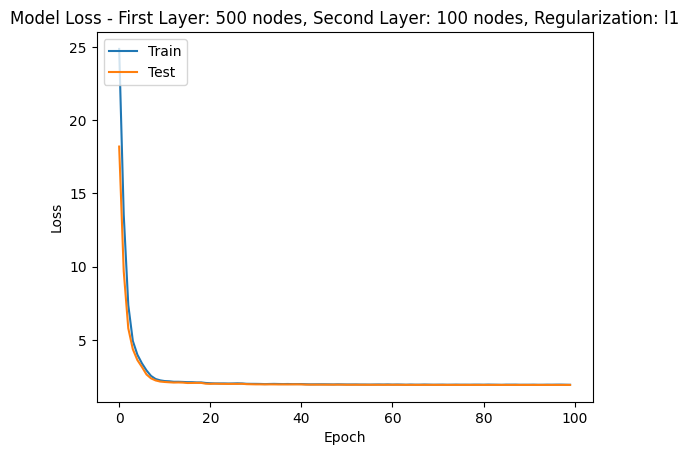

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l2 = 0.01...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.1233 - loss: 5.1789 - val_accuracy: 0.1450 - val_loss: 4.3504 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2125 - loss: 4.1962 - val_accuracy: 0.1978 - val_loss: 3.8267 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2382 - loss: 3.7756 - val_accuracy: 0.2615 - val_loss: 3.3642 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2524 - loss: 3.3816 - val_accuracy: 0.2987 - val_loss: 3.0213 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step   accuracy: 0.2626 - loss: 3.1468 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2620 - loss: 3.1369 - val_accuracy: 0.3262 - val_loss: 2.7850 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2730 - loss: 2.9036 - val_accura

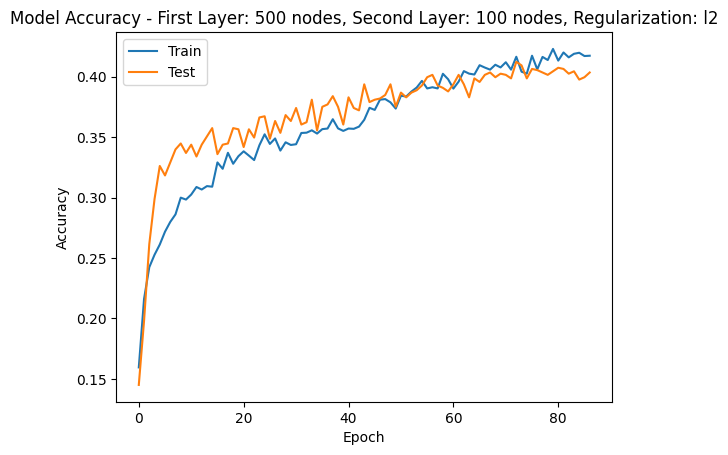

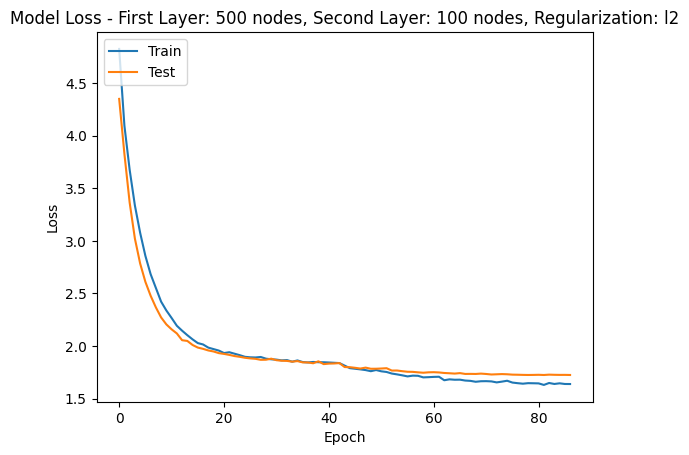

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l1 = 0.05...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - accuracy: 0.0854 - loss: 112.1887 - val_accuracy: 0.1704 - val_loss: 34.8825 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1944 - loss: 23.5474 - val_accuracy: 0.1832 - val_loss: 7.2233 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2438 - loss: 5.5219 - val_accuracy: 0.1479 - val_loss: 3.3437 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2461 - loss: 2.7113 - val_accuracy: 0.1459 - val_loss: 2.8096 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step    ccuracy: 0.2469 - loss: 2.4700 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.2474 - loss: 2.4674 - val_accuracy: 0.2184 - val_loss: 2.5634 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2586 - loss: 2.4061 - val_

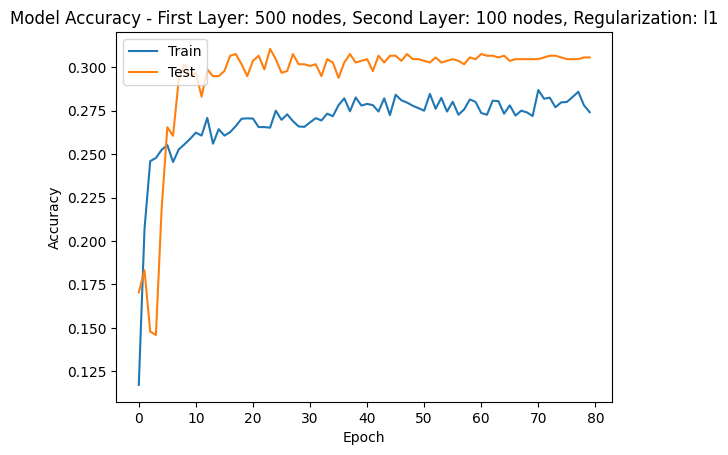

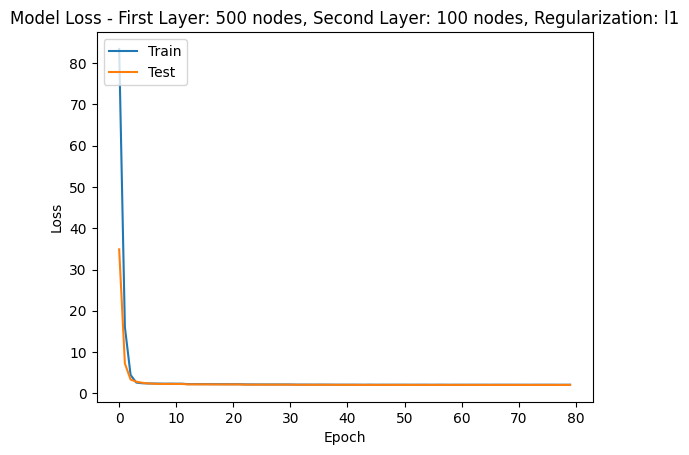

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l2 = 0.05...
Epoch 1/100


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.1384 - loss: 11.6650 - val_accuracy: 0.1596 - val_loss: 7.9656 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2163 - loss: 7.2068 - val_accuracy: 0.1694 - val_loss: 5.4192 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2385 - loss: 4.9572 - val_accuracy: 0.1929 - val_loss: 3.9717 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2654 - loss: 3.7182 - val_accuracy: 0.2429 - val_loss: 3.1439 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step   accuracy: 0.2705 - loss: 3.0702 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.2713 - loss: 3.0555 - val_accuracy: 0.2625 - val_loss: 2.7078 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2778 - loss: 2.7174 - val_accuracy: 0.3115

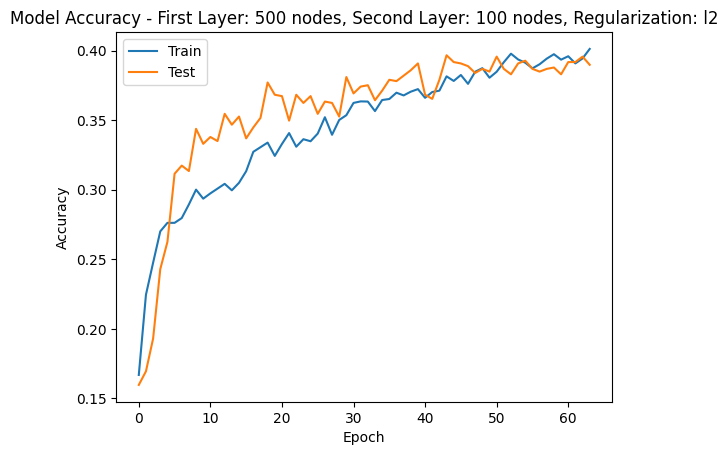

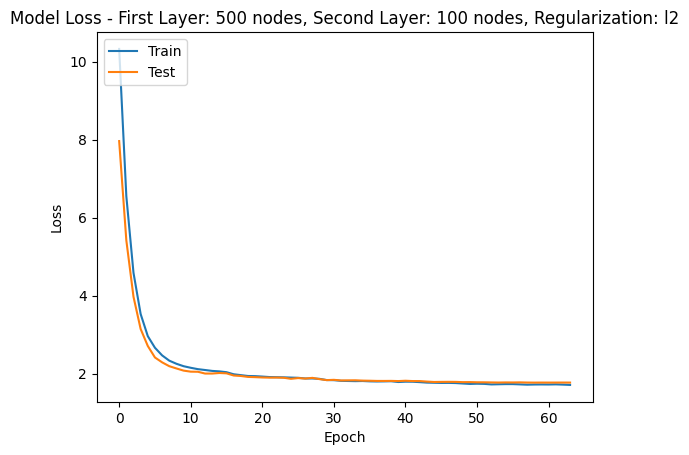

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l1 = 0.1...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.0832 - loss: 214.1487 - val_accuracy: 0.1508 - val_loss: 50.0028 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1941 - loss: 28.9008 - val_accuracy: 0.1156 - val_loss: 4.2399 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2535 - loss: 3.2624 - val_accuracy: 0.1342 - val_loss: 3.1006 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2494 - loss: 2.6900 - val_accuracy: 0.1381 - val_loss: 2.9732 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step   accuracy: 0.2357 - loss: 2.6524 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.2361 - loss: 2.6518 - val_accuracy: 0.2125 - val_loss: 2.7729 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2473 - loss: 2.6113 - val_a

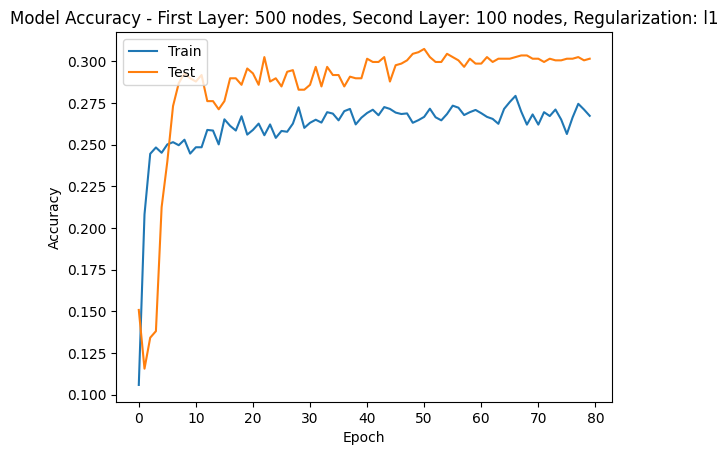

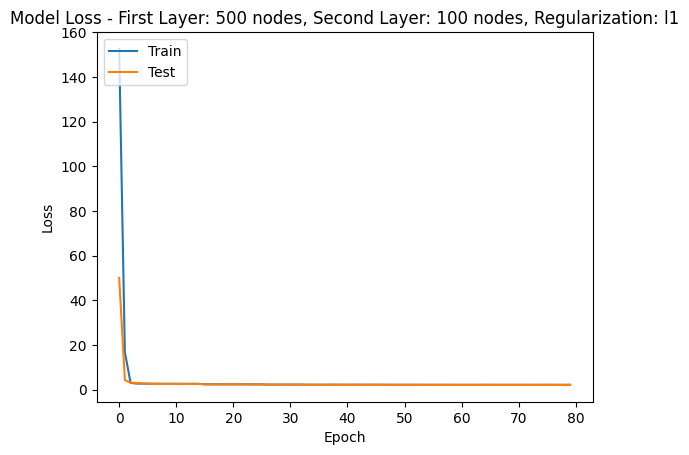

Testing model with first layer: 500 nodes, second layer: 100 nodes, regularization: l2 = 0.1...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - accuracy: 0.1353 - loss: 18.7421 - val_accuracy: 0.1626 - val_loss: 9.8626 - learning_rate: 5.0000e-04
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2352 - loss: 8.3475 - val_accuracy: 0.1763 - val_loss: 5.3632 - learning_rate: 5.0000e-04
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2475 - loss: 4.7556 - val_accuracy: 0.1900 - val_loss: 3.6475 - learning_rate: 5.0000e-04
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2732 - loss: 3.3500 - val_accuracy: 0.2615 - val_loss: 2.8734 - learning_rate: 5.0000e-04
Epoch 5/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step   accuracy: 0.2620 - loss: 2.7894 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.2632 - loss: 2.7768 - val_accuracy: 0.2929 - val_loss: 2.4917 - learning_rate: 5.0000e-04
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2763 - loss: 2.5104 - val_accu

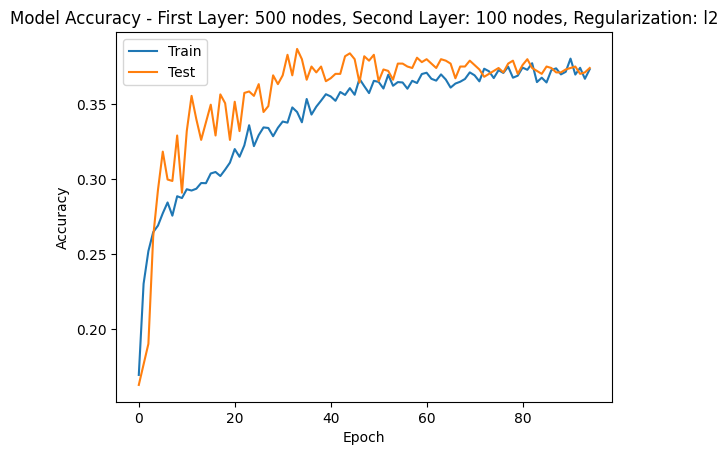

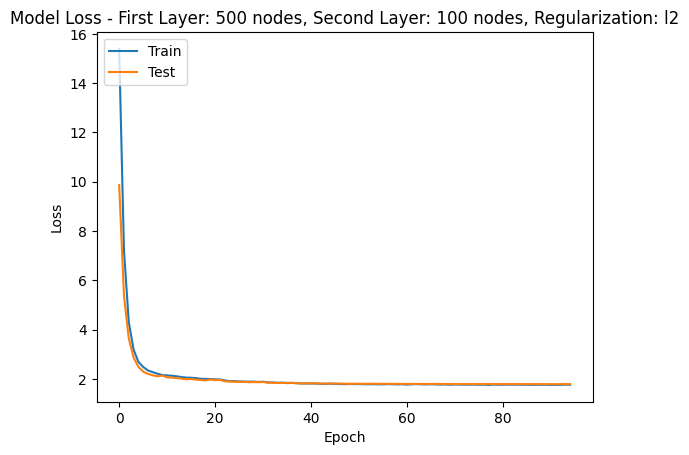


Best model found with first layer: 500 nodes, second layer: 100 nodes, regularization: l2 = 0.01
Best Test Accuracy: 0.4065
    Test Accuracy  First Layer Nodes  Second Layer Nodes Regularization Type  \
0        0.358472                 50                  50                  l1   
1        0.367287                 50                  50                  l2   
2        0.363369                 50                  50                  l1   
3        0.365328                 50                  50                  l2   
4        0.338883                 50                  50                  l1   
..            ...                ...                 ...                 ...   
67       0.406464                500                 100                  l2   
68       0.305583                500                 100                  l1   
69       0.387855                500                 100                  l2   
70       0.300686                500                 100                  l

In [39]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, Callback
from sklearn.metrics import precision_score, recall_score, mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Apply degree 2 polynomial transformation
poly = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

first_layer_nodes = [50, 200, 500]
second_layer_nodes = [50, 100]
regularization_values = [0.001, 0.005, 0.008, 0.01, 0.05, 0.1]
best_accuracy = 0
best_params = None
results = []

model_results = []

class PrintEpochs(Callback):
    def __init__(self, interval=5):
        super().__init__()
        self.interval = interval

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.interval == 0:
            y_train_pred = np.argmax(self.model.predict(X_train_scaled), axis=1)
            y_val_pred = np.argmax(self.model.predict(X_test_scaled), axis=1)

            train_precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=1)
            train_recall = recall_score(y_train, y_train_pred, average='weighted')
            val_precision = precision_score(y_test, y_val_pred, average='weighted', zero_division=1)
            val_recall = recall_score(y_test, y_val_pred, average='weighted')

            train_mse = mean_squared_error(y_train, y_train_pred)
            val_mse = mean_squared_error(y_test, y_val_pred)
            train_r2 = r2_score(y_train, y_train_pred)
            val_r2 = r2_score(y_test, y_val_pred)

for first_layer in first_layer_nodes:
    for second_layer in second_layer_nodes:
        for regularization_value in regularization_values:
            for regularization_type in ['l1', 'l2']:
                print(f"Testing model with first layer: {first_layer} nodes, second layer: {second_layer} nodes, "
                      f"regularization: {regularization_type} = {regularization_value}...")

                if regularization_type == 'l1':
                    regularizer = regularizers.l1(regularization_value)
                elif regularization_type == 'l2':
                    regularizer = regularizers.l2(regularization_value)

                model = models.Sequential([
                    layers.Dense(first_layer, activation='relu', kernel_regularizer=regularizer, input_shape=(X_train_scaled.shape[1],)),
                    layers.BatchNormalization(),
                    layers.Dropout(0.4),
                    layers.Dense(second_layer, activation='relu', kernel_regularizer=regularizer),
                    layers.BatchNormalization(),
                    layers.Dropout(0.4),
                    layers.Dense(17, activation='softmax')
                ])

                model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                              loss='sparse_categorical_crossentropy',
                              metrics=['accuracy'])
                early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
                reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
                print_epochs = PrintEpochs(interval=5)

                history = model.fit(X_train_scaled, y_train, epochs=100, batch_size=64, validation_data=(X_test_scaled, y_test), 
                                    callbacks=[early_stopping, reduce_lr, print_epochs])

                test_loss, test_accuracy = model.evaluate(X_test_scaled, y_test)
                print(f"Test Accuracy: {test_accuracy:.4f}")
                if test_accuracy > best_accuracy:
                    best_accuracy = test_accuracy
                    best_params = (first_layer, second_layer, regularization_type, regularization_value)

                y_train_pred = np.argmax(model.predict(X_train_scaled), axis=1)
                y_val_pred = np.argmax(model.predict(X_test_scaled), axis=1)

                train_precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=1)
                train_recall = recall_score(y_train, y_train_pred, average='weighted')
                val_precision = precision_score(y_test, y_val_pred, average='weighted', zero_division=1)
                val_recall = recall_score(y_test, y_val_pred, average='weighted')

                train_mse = mean_squared_error(y_train, y_train_pred)
                val_mse = mean_squared_error(y_test, y_val_pred)
                train_r2 = r2_score(y_train, y_train_pred)
                val_r2 = r2_score(y_test, y_val_pred)

                model_results.append({
                    'Test Accuracy': test_accuracy,
                    'First Layer Nodes': first_layer,
                    'Second Layer Nodes': second_layer,
                    'Regularization Type': regularization_type,
                    'Regularization Value': regularization_value,
                    'Train Accuracy': history.history['accuracy'][-1],  # Get the last value of training accuracy
                    'Train Precision': train_precision,
                    'Train Recall': train_recall,
                    'Train MSE': train_mse,
                    'Train R²': train_r2,
                    'Val Accuracy': history.history['val_accuracy'][-1],  # Get the last value of validation accuracy
                    'Val Precision': val_precision,
                    'Val Recall': val_recall,
                    'Val MSE': val_mse,
                    'Val R²': val_r2
                })


                print(f"First Layer Nodes: {first_layer}")
                print(f"Second Layer Nodes: {second_layer}")
                print(f"Regularization Type: {regularization_type}")
                print(f"Regularization Value: {regularization_value}")
                print(f"Test Accuracy: {test_accuracy:.4f}")
                print(f"Train Accuracy: {history.history['accuracy'][-1]:.4f}")
                print(f"Train Precision: {train_precision:.4f}")
                print(f"Train Recall: {train_recall:.4f}")
                print(f"Train MSE: {train_mse:.4f}")
                print(f"Train R²: {train_r2:.4f}")
                print(f"Val Accuracy: {history.history['val_accuracy'][-1]:.4f}")
                print(f"Val Precision: {val_precision:.4f}")
                print(f"Val Recall: {val_recall:.4f}")
                print(f"Val MSE: {val_mse:.4f}")
                print(f"Val R²: {val_r2:.4f}")


                plt.plot(history.history['accuracy'])
                plt.plot(history.history['val_accuracy'])
                plt.title(f'Model Accuracy - First Layer: {first_layer} nodes, Second Layer: {second_layer} nodes, Regularization: {regularization_type}')
                plt.xlabel('Epoch')
                plt.ylabel('Accuracy')
                plt.legend(['Train', 'Test'], loc='upper left')
                plt.show()

                plt.plot(history.history['loss'])
                plt.plot(history.history['val_loss'])
                plt.title(f'Model Loss - First Layer: {first_layer} nodes, Second Layer: {second_layer} nodes, Regularization: {regularization_type}')
                plt.xlabel('Epoch')
                plt.ylabel('Loss')
                plt.legend(['Train', 'Test'], loc='upper left')
                plt.show()

print(f"\nBest model found with first layer: {best_params[0]} nodes, second layer: {best_params[1]} nodes, "
      f"regularization: {best_params[2]} = {best_params[3]}")
print(f"Best Test Accuracy: {best_accuracy:.4f}")

model_results_df = pd.DataFrame(model_results)
print(model_results_df)
model_results_df.to_csv("model_performance_report2.csv", index=False)